In [1]:
%matplotlib inline

import gym
import matplotlib
import numpy as np
import sys

from collections import defaultdict

if "../" not in sys.path:
  sys.path.append("../") 
from lib.envs.blackjack import BlackjackEnv
from lib import plotting

matplotlib.style.use('ggplot')

In [2]:
env = BlackjackEnv()

In [6]:
def mc_prediction(policy, env, num_episodes, discount_factor=1.0):
    """
    Monte Carlo prediction algorithm. Calculates the value function
    for a given policy using sampling.
    
    Args:
        policy: A function that maps an observation to action probabilities.
        env: OpenAI gym environment.
        num_episodes: Number of episodes to sample.
        discount_factor: Gamma discount factor.
    
    Returns:
        A dictionary that maps from state -> value.
        The state is a tuple and the value is a float.
    """

    # Keeps track of sum and count of returns for each state
    # to calculate an average. We could use an array to save all
    # returns (like in the book) but that's memory inefficient.
    returns_sum = defaultdict(float)
    returns_count = defaultdict(float)
    
    # The final value function
    V = defaultdict(float)
    
    for i_episode in range(1, num_episodes + 1):
        # Print out which episode we're on, useful for debugging.
        if i_episode % 1000 == 0:
            print("\rEpisode {}/{}.".format(i_episode, num_episodes), end="")
            sys.stdout.flush()

        # Generate an episode.
        # An episode is an array of (state, action, reward) tuples
        episode = []
        state = env.reset()
        for t in range(100):
            action = policy(state)
            next_state, reward, done, _ = env.step(action)
            episode.append((state, action, reward))
            if done:
                break
            state = next_state

        # Find all states the we've visited in this episode
        # We convert each state to a tuple so that we can use it as a dict key
        states_in_episode = set([tuple(x[0]) for x in episode])
        for state in states_in_episode:
            # Find the first occurance of the state in the episode
            first_occurence_idx = next(i for i,x in enumerate(episode) if x[0] == state)
            # Sum up all rewards since the first occurance
            G = sum([x[2]*(discount_factor**i) for i,x in enumerate(episode[first_occurence_idx:])])
            # Calculate average return for this state over all sampled episodes
            returns_sum[state] += G
            returns_count[state] += 1.0
            V[state] = returns_sum[state] / returns_count[state]

    return V    

In [7]:
def sample_policy(observation):
    """
    A policy that sticks if the player score is >= 20 and hits otherwise.
    """
    score, dealer_score, usable_ace = observation
    return 0 if score >= 20 else 1

(16, 9, False)
(21, 9, False)
(15, 10, False)
(21, 10, False)
(19, 5, False)
(17, 10, False)
(18, 10, False)
(19, 10, True)
(15, 10, False)
(18, 6, True)
(16, 6, True)
(14, 6, False)
(12, 6, False)
(18, 6, False)
(12, 10, False)
(20, 10, False)
(14, 10, False)
(12, 10, False)
(17, 5, False)
(17, 7, False)
(20, 4, False)
(17, 1, False)
(13, 2, False)
(12, 4, False)
(13, 7, False)
(21, 7, False)
(18, 5, False)
(16, 5, False)
(20, 10, False)
(21, 7, True)
(17, 3, False)
(17, 3, True)
(14, 6, True)
(21, 6, True)
(18, 6, False)
(15, 10, False)
(21, 7, True)
(21, 5, True)
(13, 7, False)
(21, 9, True)
(16, 1, False)
(15, 1, False)
(14, 1, False)
(17, 1, False)
(20, 1, False)
(21, 1, False)
(16, 10, True)
(15, 10, True)
(20, 10, True)
(15, 9, False)
(19, 8, False)
(20, 8, False)
(17, 9, False)
(14, 6, False)
(18, 2, False)
(20, 8, False)
(20, 1, False)
(14, 8, False)
(14, 10, False)
(15, 10, False)
(18, 10, False)
(20, 10, False)
(18, 1, False)
(15, 6, False)
(12, 6, False)
(16, 6, False)
(20,

(12, 10, False)
(19, 10, False)
(16, 10, False)
(20, 10, False)
(18, 6, False)
(16, 2, False)
(16, 2, True)
(17, 2, False)
(16, 9, False)
(19, 10, False)
(20, 10, False)
(16, 9, False)
(17, 9, False)
(20, 10, False)
(20, 10, False)
(19, 2, False)
(19, 10, False)
(13, 2, False)
(18, 2, False)
(20, 10, False)
(21, 6, False)
(14, 6, False)
(14, 1, False)
(17, 1, False)
(18, 3, False)
(19, 10, False)
(15, 10, False)
(20, 10, False)
(21, 2, False)
(15, 2, False)
(13, 2, False)
(17, 1, False)
(19, 1, False)
(15, 10, False)
(13, 7, False)
(14, 7, False)
(17, 7, False)
(20, 10, False)
(18, 10, False)
(16, 5, False)
(14, 9, False)
(14, 2, False)
(12, 2, False)
(13, 2, False)
(21, 5, False)
(14, 5, False)
(15, 2, False)
(21, 2, False)
(14, 3, False)
(20, 10, False)
(15, 5, False)
(19, 5, False)
(13, 6, False)
(20, 8, False)
(12, 7, False)
(15, 7, True)
(14, 9, False)
(19, 4, False)
(20, 4, False)
(13, 4, False)
(14, 1, False)
(16, 1, False)
(20, 1, False)
(19, 8, False)
(20, 8, False)
(16, 6, Fa

(20, 3, False)
(13, 8, False)
(21, 8, False)
(13, 5, False)
(20, 5, False)
(19, 6, False)
(16, 10, False)
(18, 10, False)
(19, 1, False)
(20, 1, False)
(19, 10, False)
(14, 10, True)
(19, 10, True)
(21, 5, False)
(14, 5, False)
(20, 5, False)
(16, 10, False)
(17, 7, False)
(16, 5, False)
(17, 1, False)
(13, 1, False)
(16, 2, True)
(15, 2, True)
(15, 2, False)
(17, 1, False)
(13, 1, False)
(19, 5, True)
(19, 5, False)
(21, 5, False)
(16, 5, True)
(16, 5, False)
(18, 5, True)
(16, 10, False)
(21, 10, False)
(20, 9, True)
(19, 10, False)
(16, 10, False)
(15, 10, False)
(16, 10, False)
(21, 10, False)
(15, 3, False)
(12, 3, False)
(15, 8, True)
(12, 8, False)
(21, 8, False)
(12, 8, False)
(19, 2, False)
(12, 2, False)
(13, 2, False)
(16, 6, False)
(21, 4, True)
(18, 1, False)
(13, 1, False)
(12, 6, False)
(21, 6, False)
(14, 10, False)
(15, 10, False)
(14, 3, False)
(21, 3, False)
(16, 2, False)
(12, 6, False)
(17, 6, True)
(17, 6, False)
(20, 9, False)
(21, 1, False)
(13, 1, False)
(15, 1

Episode 2000/10000.(13, 5, False)
(21, 5, False)
(14, 7, False)
(18, 9, False)
(15, 9, False)
(20, 5, False)
(13, 9, False)
(21, 10, True)
(21, 5, False)
(14, 5, False)
(13, 9, False)
(12, 2, False)
(21, 3, False)
(13, 10, False)
(18, 10, False)
(14, 10, True)
(20, 10, True)
(19, 10, True)
(19, 8, False)
(19, 2, False)
(16, 7, False)
(16, 10, False)
(12, 10, False)
(15, 10, False)
(17, 1, False)
(16, 1, False)
(12, 1, False)
(15, 1, False)
(21, 6, False)
(16, 6, False)
(16, 5, False)
(19, 2, False)
(14, 2, False)
(20, 2, False)
(17, 10, False)
(16, 10, True)
(14, 10, False)
(18, 7, False)
(15, 10, False)
(18, 8, False)
(20, 3, False)
(20, 7, False)
(18, 5, False)
(17, 10, False)
(18, 9, False)
(18, 1, False)
(20, 10, False)
(14, 10, False)
(16, 3, False)
(13, 3, False)
(20, 2, False)
(19, 10, False)
(16, 10, False)
(20, 2, False)
(12, 3, False)
(16, 10, False)
(20, 10, False)
(18, 10, False)
(21, 8, False)
(15, 8, False)
(14, 10, False)
(21, 5, True)
(17, 8, False)
(19, 8, False)
(13, 

(20, 1, False)
(15, 10, False)
(21, 10, False)
(17, 8, False)
(18, 8, False)
(13, 8, False)
(20, 3, False)
(20, 4, False)
(20, 6, True)
(17, 6, True)
(13, 4, False)
(12, 4, False)
(20, 4, False)
(20, 1, False)
(20, 6, True)
(21, 7, False)
(13, 7, False)
(14, 7, False)
(19, 1, False)
(20, 4, False)
(14, 9, False)
(19, 9, False)
(18, 9, False)
(16, 10, False)
(16, 8, False)
(19, 10, False)
(14, 10, True)
(19, 10, True)
(16, 10, True)
(17, 10, True)
(13, 5, False)
(21, 6, False)
(16, 6, False)
(17, 10, False)
(17, 10, True)
(16, 10, True)
(18, 10, False)
(15, 4, False)
(20, 4, False)
(18, 10, False)
(19, 10, False)
(14, 10, False)
(20, 10, False)
(18, 10, False)
(14, 10, False)
(19, 1, False)
(21, 2, True)
(12, 1, False)
(16, 8, False)
(18, 7, False)
(14, 2, False)
(20, 2, False)
(13, 2, False)
(18, 2, False)
(20, 5, False)
(18, 10, False)
(21, 9, True)
(20, 10, False)
(19, 1, False)
(16, 10, False)
(20, 10, False)
(18, 10, False)
(14, 10, False)
(20, 10, False)
(13, 10, False)
(20, 6, Fa

Episode 3000/10000.(20, 2, False)
(13, 2, False)
(18, 3, False)
(17, 9, False)
(13, 4, False)
(17, 1, False)
(19, 1, False)
(18, 1, False)
(14, 3, False)
(12, 3, False)
(15, 10, False)
(20, 10, False)
(13, 10, False)
(15, 10, False)
(21, 10, False)
(19, 10, True)
(20, 8, False)
(14, 1, False)
(17, 1, False)
(16, 3, False)
(19, 3, False)
(21, 4, True)
(17, 3, False)
(13, 3, False)
(12, 4, False)
(18, 1, False)
(13, 1, False)
(14, 8, False)
(19, 8, False)
(16, 8, False)
(18, 8, True)
(15, 1, False)
(20, 10, False)
(16, 9, False)
(19, 9, False)
(20, 9, False)
(17, 1, False)
(19, 1, False)
(15, 1, False)
(17, 4, True)
(21, 4, True)
(20, 7, False)
(17, 1, False)
(18, 7, False)
(16, 2, False)
(18, 8, False)
(14, 8, False)
(14, 2, False)
(21, 2, False)
(18, 2, False)
(18, 10, True)
(15, 10, True)
(15, 10, False)
(12, 10, False)
(19, 2, False)
(17, 2, False)
(18, 2, False)
(19, 2, False)
(14, 10, False)
(20, 10, False)
(18, 10, False)
(13, 8, False)
(12, 8, False)
(16, 8, False)
(15, 6, False)

(19, 8, False)
(16, 8, False)
(21, 8, False)
(12, 3, False)
(20, 3, False)
(17, 2, False)
(20, 10, False)
(14, 1, False)
(19, 1, False)
(21, 1, False)
(12, 1, False)
(16, 9, False)
(19, 6, False)
(14, 6, False)
(12, 6, False)
(21, 6, False)
(13, 5, True)
(15, 5, False)
(15, 5, True)
(18, 3, False)
(21, 10, False)
(15, 2, False)
(18, 4, False)
(18, 4, True)
(14, 10, False)
(14, 10, True)
(18, 9, False)
(20, 9, False)
(21, 9, True)
(15, 5, False)
(16, 5, False)
(16, 8, False)
(16, 7, True)
(16, 7, False)
(17, 1, False)
(19, 1, False)
(20, 10, False)
(20, 6, False)
(14, 10, False)
(21, 10, False)
(20, 10, False)
(20, 1, True)
(13, 1, True)
(21, 7, False)
(14, 7, False)
(17, 10, False)
(14, 10, False)
(18, 10, False)
(13, 9, False)
(21, 2, True)
(20, 10, False)
(13, 10, False)
(19, 8, False)
(16, 8, True)
(12, 8, False)
(21, 2, True)
(21, 3, False)
(20, 10, False)
(20, 7, False)
(12, 6, False)
(15, 10, False)
(20, 1, False)
(13, 4, False)
(20, 10, False)
(19, 8, False)
(13, 8, False)
(20, 

(17, 10, False)
(14, 10, True)
(21, 10, False)
(14, 10, False)
(17, 8, False)
(14, 8, False)
(16, 8, False)
(16, 3, False)
(15, 10, False)
(17, 8, False)
(20, 8, False)
(20, 10, False)
(17, 10, False)
(13, 4, False)
(19, 4, False)
(13, 4, True)
(21, 8, True)
(12, 2, False)
(20, 2, False)
(15, 10, False)
(20, 10, False)
(21, 10, True)
(12, 3, False)
(15, 8, False)
(15, 10, True)
(15, 10, False)
(18, 3, False)
(20, 6, False)
(14, 6, False)
(17, 8, False)
(16, 8, False)
(18, 8, False)
(16, 7, False)
(17, 7, True)
(18, 7, False)
(12, 7, False)
(17, 10, False)
(12, 10, False)
(21, 10, False)
(21, 10, False)
(16, 10, False)
(15, 10, False)
(21, 10, False)
(17, 10, False)
(13, 6, False)
(18, 6, False)
(12, 5, False)
(16, 5, False)
(13, 8, False)
(16, 8, True)
(15, 8, False)
(17, 8, False)
(19, 8, False)
(20, 8, False)
(12, 8, False)
(14, 10, False)
(18, 10, False)
(20, 5, False)
(14, 4, False)
(19, 10, False)
(21, 10, False)
(19, 9, False)
(18, 9, False)
(15, 10, False)
(20, 10, False)
(13, 1

Episode 5000/10000.(18, 2, False)
(15, 10, False)
(21, 10, False)
(21, 7, True)
(19, 2, False)
(21, 10, True)
(18, 6, False)
(14, 6, False)
(20, 7, False)
(14, 7, False)
(15, 9, False)
(14, 10, False)
(18, 10, False)
(21, 5, True)
(21, 4, False)
(16, 4, False)
(16, 1, True)
(21, 1, True)
(19, 3, True)
(15, 3, False)
(12, 7, False)
(18, 7, False)
(20, 1, False)
(21, 2, True)
(21, 10, True)
(20, 10, True)
(13, 10, False)
(18, 10, False)
(12, 8, False)
(13, 10, False)
(14, 5, True)
(14, 5, False)
(16, 9, False)
(18, 9, True)
(13, 9, True)
(17, 10, False)
(14, 5, False)
(19, 5, False)
(13, 3, False)
(19, 3, True)
(18, 3, False)
(16, 3, True)
(16, 10, False)
(20, 4, False)
(21, 5, True)
(19, 10, False)
(20, 8, False)
(20, 8, False)
(19, 9, False)
(15, 9, False)
(17, 9, False)
(14, 6, True)
(12, 6, False)
(19, 6, True)
(20, 10, False)
(19, 10, False)
(20, 10, False)
(16, 2, False)
(20, 10, False)
(19, 3, False)
(18, 5, False)
(21, 10, False)
(13, 10, False)
(14, 6, False)
(20, 1, False)
(17,

(20, 3, False)
(17, 3, False)
(15, 3, False)
(15, 3, True)
(17, 8, False)
(14, 8, False)
(20, 8, False)
(21, 10, True)
(13, 4, False)
(14, 4, False)
(16, 4, False)
(16, 10, False)
(12, 10, False)
(16, 3, False)
(20, 7, False)
(21, 7, True)
(18, 7, False)
(16, 6, False)
(15, 6, False)
(13, 10, True)
(20, 10, True)
(14, 10, False)
(13, 10, False)
(15, 8, False)
(18, 10, False)
(18, 4, False)
(12, 4, False)
(19, 7, False)
(16, 9, False)
(19, 9, False)
(15, 10, False)
(19, 10, True)
(16, 1, False)
(21, 1, False)
(14, 5, False)
(14, 9, False)
(17, 9, False)
(18, 9, False)
(21, 8, True)
(18, 6, False)
(19, 10, False)
(20, 10, False)
(19, 4, False)
(12, 6, False)
(21, 6, False)
(19, 6, False)
(15, 6, True)
(16, 10, False)
(17, 10, False)
(19, 10, False)
(21, 7, True)
(16, 10, False)
(17, 10, False)
(15, 10, False)
(20, 1, False)
(19, 10, False)
(20, 10, False)
(15, 9, False)
(20, 8, False)
(20, 1, False)
(16, 4, False)
(18, 10, False)
(12, 7, False)
(14, 7, False)
(21, 8, False)
(19, 10, Fals

(17, 10, False)
(14, 10, False)
(16, 10, False)
(21, 6, True)
(16, 8, False)
(20, 2, False)
(14, 4, False)
(21, 3, True)
(14, 3, True)
(19, 3, True)
(21, 1, True)
(21, 9, False)
(21, 4, True)
(18, 10, False)
(12, 1, False)
(14, 1, True)
(20, 10, False)
(13, 10, False)
(19, 6, False)
(20, 9, False)
(20, 1, True)
(14, 10, False)
(12, 10, False)
(16, 1, False)
(15, 1, False)
(20, 10, False)
(20, 7, False)
(20, 2, False)
(17, 7, True)
(15, 7, False)
(12, 7, False)
(19, 6, False)
(21, 4, True)
(15, 10, False)
(20, 10, False)
(18, 10, False)
(20, 7, False)
(19, 8, False)
(21, 10, False)
(19, 7, False)
(20, 10, False)
(13, 10, False)
(13, 5, False)
(20, 6, False)
(19, 5, True)
(14, 5, True)
(18, 5, False)
(15, 5, False)
(18, 5, False)
(15, 7, False)
(17, 7, False)
(19, 10, False)
(17, 9, False)
(18, 7, False)
(14, 7, False)
(13, 7, False)
(19, 7, False)
(14, 9, False)
(15, 9, False)
(16, 9, False)
(15, 10, False)
(21, 5, True)
(14, 3, False)
(16, 10, False)
(15, 8, False)
(12, 8, False)
(16, 

(18, 7, False)
(18, 9, False)
(13, 9, False)
(16, 1, False)
(21, 1, False)
(17, 7, False)
(21, 5, False)
(14, 9, False)
(19, 9, False)
(21, 9, False)
(20, 7, False)
(20, 9, False)
(12, 9, False)
(18, 10, True)
(17, 10, True)
(14, 10, False)
(12, 6, False)
(16, 6, False)
(17, 5, False)
(19, 9, False)
(19, 8, True)
(19, 8, False)
(20, 8, False)
(20, 4, False)
(21, 1, True)
(16, 10, False)
(16, 10, True)
(15, 10, True)
(19, 8, False)
(12, 8, False)
(12, 7, False)
(14, 7, False)
(20, 10, False)
(14, 3, False)
(21, 1, False)
(12, 1, False)
(14, 3, False)
(21, 9, True)
(17, 6, False)
(20, 10, False)
(17, 10, False)
(12, 10, False)
(21, 7, False)
(19, 7, False)
(17, 10, False)
(16, 10, False)
(15, 10, False)
(13, 10, False)
(20, 9, False)
(21, 1, True)
(17, 10, False)
(20, 10, False)
(14, 8, False)
(20, 8, False)
(21, 10, True)
(19, 10, False)
(12, 10, False)
(16, 1, False)
(19, 10, False)
(19, 10, False)
(14, 10, False)
(18, 10, True)
(12, 10, False)
(18, 7, False)
(19, 7, False)
(19, 10, Fa

(13, 1, False)
(18, 10, True)
(19, 10, False)
(12, 10, False)
(17, 9, False)
(20, 9, False)
(15, 4, False)
(20, 4, False)
(18, 7, False)
(13, 7, False)
(19, 7, False)
(16, 5, False)
(21, 10, False)
(16, 1, False)
(19, 5, True)
(14, 5, True)
(19, 5, False)
(13, 1, False)
(21, 1, False)
(14, 2, False)
(12, 2, False)
(21, 2, False)
(17, 10, False)
(12, 10, False)
(20, 2, False)
(20, 7, False)
(20, 2, False)
(16, 10, False)
(21, 4, False)
(12, 4, False)
(20, 6, False)
(18, 5, False)
(20, 5, False)
(15, 5, False)
(14, 10, False)
(17, 10, False)
(14, 10, False)
(21, 10, False)
(21, 3, True)
(15, 2, False)
(17, 10, False)
(20, 8, False)
(21, 1, True)
(19, 1, False)
(13, 7, False)
(17, 7, False)
(21, 4, True)
(20, 4, True)
(20, 4, False)
(21, 10, False)
(13, 3, False)
(19, 9, False)
(19, 9, True)
(21, 10, True)
(19, 10, False)
(16, 5, False)
(20, 4, False)
(19, 4, False)
(12, 2, False)
(19, 10, False)
(20, 10, False)
(18, 1, False)
(20, 1, False)
(14, 10, False)
(21, 10, False)
(20, 2, True)
(

Episode 7000/10000.(14, 8, False)
(12, 8, False)
(19, 10, False)
(16, 10, False)
(14, 10, False)
(12, 10, False)
(21, 10, False)
(21, 4, True)
(19, 3, False)
(12, 3, False)
(18, 3, True)
(16, 3, True)
(15, 9, False)
(17, 10, True)
(16, 10, False)
(20, 10, False)
(19, 9, False)
(13, 10, False)
(17, 10, True)
(17, 10, False)
(16, 7, False)
(19, 7, False)
(17, 7, False)
(17, 10, False)
(20, 10, False)
(16, 10, False)
(12, 2, False)
(19, 2, False)
(20, 10, False)
(16, 1, True)
(16, 1, False)
(19, 1, False)
(18, 5, False)
(20, 7, False)
(15, 8, False)
(21, 7, True)
(20, 5, False)
(19, 5, False)
(15, 6, False)
(19, 6, False)
(14, 6, False)
(15, 3, False)
(14, 3, False)
(15, 3, False)
(14, 1, False)
(16, 9, False)
(18, 9, False)
(17, 6, False)
(16, 7, False)
(17, 7, False)
(16, 10, False)
(12, 10, False)
(13, 10, False)
(18, 5, False)
(20, 5, False)
(15, 5, False)
(15, 7, False)
(21, 5, True)
(16, 2, False)
(20, 3, False)
(20, 3, False)
(13, 4, False)
(17, 4, False)
(18, 10, False)
(20, 8, Fa

(20, 6, False)
(12, 10, False)
(17, 9, False)
(14, 10, False)
(19, 4, False)
(20, 7, False)
(18, 7, False)
(21, 1, True)
(21, 9, True)
(21, 4, False)
(21, 8, True)
(19, 9, False)
(19, 9, True)
(12, 10, False)
(21, 4, True)
(16, 1, False)
(14, 3, False)
(15, 3, False)
(21, 10, True)
(12, 5, False)
(19, 5, False)
(19, 10, False)
(19, 10, False)
(17, 10, False)
(12, 6, False)
(19, 6, False)
(16, 6, True)
(14, 10, False)
(19, 9, False)
(21, 4, False)
(14, 4, False)
(18, 5, False)
(14, 5, False)
(13, 8, False)
(21, 8, False)
(12, 4, False)
(18, 10, False)
(14, 5, True)
(14, 5, False)
(17, 5, False)
(13, 10, False)
(19, 1, False)
(13, 1, False)
(12, 5, False)
(17, 10, True)
(15, 10, True)
(15, 10, False)
(21, 10, False)
(12, 10, False)
(18, 2, True)
(15, 2, True)
(15, 2, False)
(16, 10, False)
(20, 7, False)
(19, 7, False)
(20, 1, False)
(17, 1, False)
(19, 1, True)
(15, 4, False)
(14, 4, False)
(21, 10, False)
(16, 1, False)
(19, 10, False)
(19, 10, True)
(19, 4, False)
(15, 1, False)
(16, 

(20, 9, False)
(15, 10, False)
(13, 10, False)
(16, 10, False)
(15, 10, False)
(17, 10, False)
(20, 10, False)
(18, 4, True)
(17, 4, False)
(15, 4, False)
(21, 6, True)
(18, 10, False)
(20, 1, False)
(14, 10, False)
(16, 10, False)
(13, 10, False)
(18, 9, False)
(16, 8, False)
(20, 8, False)
(12, 8, False)
(14, 4, False)
(12, 3, False)
(21, 3, False)
(12, 4, False)
(16, 4, False)
(16, 6, False)
(19, 7, False)
(19, 7, True)
(13, 8, False)
(20, 8, False)
(15, 10, False)
(15, 4, False)
(12, 4, False)
(21, 8, True)
(14, 3, False)
(20, 3, False)
(15, 9, True)
(15, 9, False)
(12, 5, False)
(16, 5, False)
(20, 10, False)
(19, 9, False)
(12, 9, False)
(19, 10, False)
(18, 10, False)
(20, 10, False)
(20, 10, False)
(13, 8, False)
(19, 10, False)
(20, 10, False)
(18, 10, False)
(19, 8, False)
(21, 4, True)
(19, 4, False)
(18, 10, True)
(15, 10, False)
(16, 2, False)
(19, 10, False)
(19, 10, True)
(19, 10, False)
(16, 10, False)
(18, 10, False)
(16, 7, False)
(13, 4, False)
(20, 4, False)
(16, 3,

(14, 1, False)
(18, 1, False)
(21, 1, False)
(16, 2, False)
(13, 7, False)
(14, 10, False)
(19, 9, False)
(20, 9, False)
(16, 1, False)
(21, 7, True)
(13, 7, True)
(13, 10, False)
(17, 10, False)
(12, 10, False)
(18, 9, True)
(21, 9, True)
(15, 5, False)
(21, 10, False)
(13, 10, False)
(19, 10, False)
(19, 10, True)
(12, 1, False)
(21, 10, False)
(18, 10, False)
(20, 2, False)
(20, 10, False)
(21, 5, False)
(19, 5, False)
(20, 6, False)
(19, 6, False)
(17, 6, True)
(13, 6, True)
(19, 6, True)
(17, 3, False)
(19, 9, False)
(12, 9, False)
(18, 10, False)
(14, 10, True)
(14, 10, False)
(21, 10, False)
(16, 10, False)
(16, 7, False)
(14, 7, False)
(17, 7, False)
(12, 10, False)
(18, 6, True)
(17, 6, False)
(20, 10, False)
(14, 3, False)
(19, 3, True)
(13, 3, True)
(17, 3, True)
(15, 3, True)
(20, 10, False)
(14, 10, False)
(13, 10, True)
(13, 10, False)
(19, 10, False)
(16, 10, False)
(18, 10, False)
(12, 3, False)
(20, 3, False)
(16, 1, True)
(18, 1, True)
(18, 1, False)
(13, 1, True)
(15

(21, 10, False)
(20, 7, False)
(18, 7, False)
(20, 10, False)
(21, 2, True)
(18, 10, False)
(19, 10, False)
(15, 10, False)
(13, 6, False)
(19, 6, False)
(14, 10, False)
(13, 10, False)
(17, 8, False)
(14, 8, False)
(21, 3, True)
(16, 10, False)
(21, 10, False)
(18, 2, False)
(14, 3, False)
(20, 3, False)
(13, 6, False)
(17, 6, True)
(17, 10, False)
(15, 10, False)
(17, 9, False)
(13, 9, False)
(20, 9, False)
(18, 3, False)
(17, 10, False)
(15, 10, False)
(20, 10, False)
(21, 4, False)
(14, 4, False)
(18, 5, False)
(21, 5, False)
(15, 10, False)
(13, 10, False)
(12, 4, False)
(16, 4, False)
(18, 4, False)
(15, 4, False)
(12, 4, False)
(16, 4, False)
(17, 10, False)
(15, 10, False)
(20, 10, False)
(18, 10, False)
(17, 9, True)
(13, 9, False)
(18, 4, False)
(12, 4, False)
(16, 7, False)
(14, 4, False)
(19, 4, True)
(15, 4, False)
(18, 8, False)
(20, 8, False)
(15, 10, False)
(21, 9, False)
(16, 7, False)
(20, 7, False)
(12, 1, False)
(18, 4, False)
(14, 4, False)
(17, 4, False)
(20, 10, 

(20, 10, False)
(19, 5, False)
(18, 5, False)
(18, 4, False)
(20, 1, False)
(15, 1, False)
(12, 8, True)
(19, 8, True)
(19, 8, False)
(13, 8, True)
(17, 10, False)
(19, 8, False)
(18, 8, False)
(20, 1, False)
(15, 8, False)
(21, 4, True)
(16, 2, True)
(14, 2, False)
(17, 2, False)
(12, 7, False)
(17, 7, False)
(20, 1, False)
(13, 4, False)
(21, 4, False)
(17, 10, False)
(12, 10, False)
(17, 4, False)
(17, 1, False)
(15, 9, False)
(16, 1, False)
(12, 1, False)
(14, 3, False)
(21, 3, False)
(19, 1, False)
(12, 1, False)
(14, 10, False)
(21, 10, False)
(20, 10, False)
(17, 10, False)
(20, 8, False)
(16, 5, False)
(19, 5, False)
(20, 10, False)
(19, 10, False)
(17, 8, False)
(16, 8, True)
(17, 8, True)
(20, 8, False)
(15, 8, True)
(20, 9, False)
(18, 7, False)
(16, 9, False)
(20, 9, False)
(15, 6, False)
(21, 4, False)
(19, 10, False)
(17, 10, False)
(15, 10, False)
(13, 10, False)
(19, 4, True)
(13, 4, False)
(20, 4, False)
(19, 4, False)
(13, 4, True)
(17, 10, False)
(21, 4, True)
(20, 2

Episode 10000/10000.(19, 10, False)
(15, 10, False)


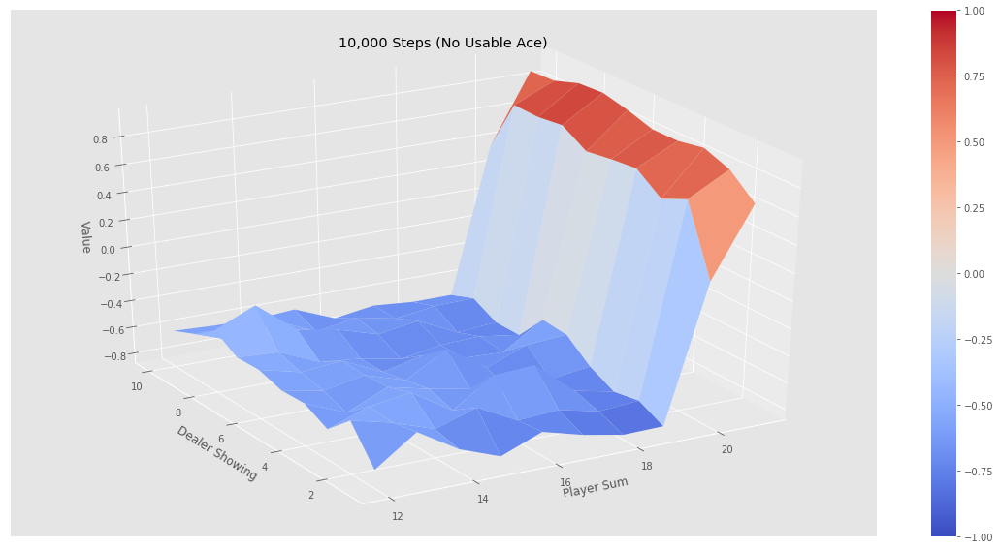

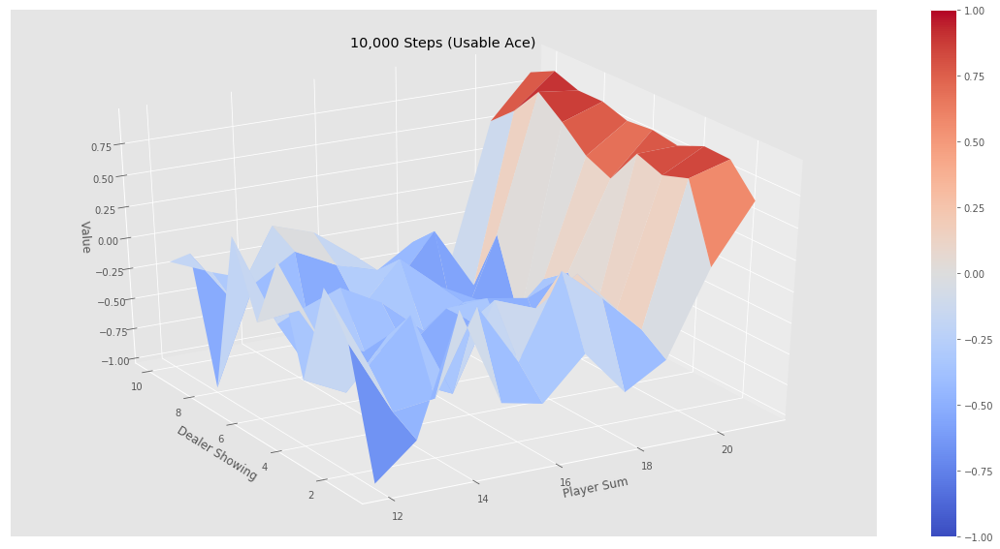

(16, 2, False)
(21, 1, False)
(12, 1, False)
(18, 9, False)
(19, 10, False)
(18, 3, False)
(14, 10, False)
(14, 10, True)
(13, 9, False)
(15, 9, False)
(12, 4, False)
(20, 4, False)
(12, 5, False)
(14, 5, False)
(20, 8, False)
(18, 10, False)
(19, 7, False)
(21, 7, False)
(19, 7, False)
(13, 2, False)
(19, 2, True)
(16, 2, False)
(15, 5, False)
(12, 10, False)
(21, 10, False)
(14, 2, False)
(18, 2, False)
(21, 7, True)
(16, 10, False)
(13, 10, False)
(15, 4, False)
(18, 5, False)
(13, 5, False)
(18, 8, False)
(21, 10, True)
(21, 7, True)
(19, 7, True)
(15, 10, False)
(20, 10, False)
(18, 10, False)
(19, 10, False)
(16, 2, False)
(14, 2, False)
(20, 2, False)
(18, 7, False)
(15, 4, False)
(12, 6, False)
(16, 10, False)
(15, 10, False)
(16, 10, False)
(20, 1, False)
(17, 5, False)
(13, 4, False)
(15, 4, False)
(17, 4, False)
(20, 4, False)
(15, 5, False)
(15, 4, False)
(17, 4, False)
(12, 7, False)
(16, 7, False)
(17, 7, True)
(13, 7, False)
(14, 7, False)
(19, 9, False)
(17, 1, False)
(

(13, 4, False)
(21, 10, True)
(19, 9, False)
(12, 9, False)
(19, 1, False)
(14, 9, False)
(20, 10, False)
(20, 9, False)
(18, 6, False)
(19, 10, False)
(15, 10, False)
(13, 10, False)
(15, 5, False)
(15, 5, True)
(17, 5, False)
(14, 1, False)
(20, 10, False)
(20, 10, False)
(12, 10, False)
(19, 6, True)
(19, 6, False)
(15, 6, False)
(19, 6, False)
(13, 3, False)
(18, 7, False)
(16, 9, False)
(18, 8, False)
(12, 10, False)
(13, 8, False)
(12, 8, False)
(19, 1, False)
(18, 10, False)
(16, 1, False)
(19, 1, False)
(12, 1, False)
(18, 1, True)
(21, 1, True)
(12, 7, False)
(14, 7, False)
(20, 10, False)
(19, 10, False)
(14, 2, False)
(21, 2, False)
(19, 10, False)
(12, 10, False)
(16, 4, False)
(20, 8, False)
(21, 7, True)
(14, 4, False)
(20, 10, False)
(14, 8, False)
(16, 10, False)
(20, 10, False)
(14, 2, False)
(16, 4, False)
(20, 2, False)
(13, 5, False)
(17, 5, True)
(19, 5, False)
(17, 8, False)
(13, 8, False)
(18, 8, False)
(15, 8, False)
(20, 5, False)
(16, 7, False)
(20, 7, False)


(17, 7, False)
(15, 5, False)
(15, 5, True)
(18, 7, False)
(16, 7, False)
(21, 3, True)
(18, 3, True)
(15, 10, False)
(19, 10, False)
(21, 10, False)
(21, 4, True)
(17, 7, False)
(21, 10, True)
(18, 1, False)
(13, 1, False)
(17, 1, False)
(16, 1, False)
(18, 7, False)
(13, 7, False)
(14, 7, False)
(16, 9, False)
(18, 9, False)
(20, 3, False)
(20, 9, False)
(14, 1, False)
(18, 1, False)
(16, 3, False)
(12, 3, False)
(17, 3, True)
(13, 5, False)
(14, 5, False)
(21, 5, False)
(20, 7, False)
(18, 7, False)
(15, 10, False)
(21, 10, False)
(18, 10, False)
(20, 8, False)
(21, 10, True)
(21, 2, False)
(15, 2, False)
(13, 2, False)
(13, 2, False)
(13, 10, False)
(16, 5, False)
(20, 7, False)
(16, 7, False)
(17, 3, False)
(20, 9, False)
(19, 10, False)
(18, 3, False)
(20, 2, True)
(13, 4, False)
(20, 8, True)
(14, 6, False)
(18, 4, False)
(13, 7, False)
(20, 6, False)
(15, 3, False)
(16, 8, False)
(20, 4, False)
(19, 1, False)
(16, 5, False)
(12, 5, False)
(16, 5, True)
(19, 5, False)
(18, 5, Tr

Episode 2000/500000.(21, 10, False)
(16, 7, False)
(21, 3, False)
(13, 3, False)
(17, 10, False)
(21, 10, False)
(13, 10, False)
(14, 8, False)
(20, 8, False)
(15, 10, False)
(18, 10, False)
(16, 9, False)
(21, 4, True)
(16, 4, False)
(13, 3, False)
(13, 4, False)
(19, 10, False)
(16, 2, False)
(20, 5, False)
(17, 1, False)
(18, 1, False)
(14, 3, False)
(21, 3, False)
(13, 10, False)
(19, 8, False)
(15, 8, False)
(16, 10, False)
(15, 10, True)
(15, 10, False)
(16, 2, False)
(21, 10, True)
(21, 10, True)
(12, 10, True)
(18, 4, False)
(19, 9, True)
(18, 9, False)
(18, 1, False)
(17, 7, False)
(17, 8, False)
(19, 8, True)
(19, 4, False)
(17, 7, True)
(18, 7, False)
(17, 7, False)
(20, 1, False)
(21, 5, False)
(12, 5, False)
(19, 10, False)
(17, 10, False)
(20, 10, False)
(17, 5, False)
(20, 7, False)
(16, 10, False)
(20, 10, False)
(16, 10, False)
(17, 10, False)
(18, 10, False)
(18, 1, False)
(12, 9, False)
(15, 9, False)
(19, 8, False)
(14, 10, False)
(20, 10, False)
(13, 3, True)
(12, 

(20, 10, True)
(17, 1, True)
(18, 1, True)
(13, 1, False)
(14, 1, True)
(21, 10, True)
(13, 6, False)
(21, 4, True)
(16, 4, False)
(14, 7, False)
(20, 4, False)
(17, 10, False)
(20, 10, False)
(18, 10, False)
(17, 3, False)
(20, 3, False)
(20, 1, False)
(20, 9, False)
(20, 5, True)
(16, 5, True)
(18, 5, True)
(21, 1, True)
(19, 9, False)
(21, 9, False)
(15, 9, False)
(20, 10, False)
(21, 10, False)
(19, 4, False)
(17, 1, False)
(12, 1, False)
(17, 10, False)
(16, 10, False)
(15, 7, True)
(20, 7, True)
(20, 10, False)
(18, 10, False)
(15, 9, False)
(14, 3, False)
(19, 2, False)
(15, 2, False)
(18, 2, False)
(16, 10, False)
(17, 10, False)
(20, 7, False)
(16, 7, False)
(21, 8, False)
(12, 8, False)
(15, 1, True)
(14, 1, False)
(17, 1, True)
(13, 1, False)
(15, 2, False)
(15, 8, False)
(20, 3, False)
(12, 3, False)
(13, 3, False)
(20, 10, False)
(15, 10, False)
(12, 10, False)
(16, 1, False)
(12, 10, False)
(21, 7, True)
(13, 7, True)
(19, 2, False)
(16, 3, False)
(14, 2, False)
(14, 4, F

Episode 3000/500000.(21, 2, True)
(20, 4, True)
(20, 9, False)
(13, 9, False)
(20, 10, False)
(17, 9, False)
(12, 9, False)
(20, 10, False)
(21, 10, False)
(15, 7, False)
(19, 10, False)
(12, 10, False)
(15, 10, False)
(13, 10, False)
(18, 4, False)
(17, 4, False)
(20, 7, False)
(13, 7, False)
(13, 7, False)
(20, 10, False)
(15, 6, False)
(20, 6, False)
(14, 8, False)
(21, 8, False)
(13, 7, False)
(14, 10, False)
(18, 10, False)
(19, 5, True)
(18, 5, False)
(21, 7, False)
(20, 2, False)
(16, 9, False)
(17, 9, False)
(20, 9, False)
(16, 9, False)
(19, 10, False)
(21, 10, False)
(15, 10, False)
(20, 10, False)
(21, 10, True)
(19, 10, False)
(12, 10, False)
(13, 5, False)
(17, 5, False)
(17, 8, False)
(12, 6, False)
(16, 6, False)
(19, 2, False)
(15, 2, True)
(12, 2, False)
(20, 2, False)
(16, 10, False)
(14, 10, False)
(16, 2, False)
(20, 2, False)
(14, 10, False)
(20, 4, False)
(20, 4, False)
(19, 4, False)
(13, 9, False)
(21, 9, False)
(12, 7, False)
(13, 7, False)
(20, 7, False)
(14, 

(17, 9, False)
(12, 9, False)
(19, 10, False)
(12, 10, False)
(20, 4, True)
(19, 4, True)
(17, 7, False)
(13, 5, True)
(14, 5, False)
(17, 5, False)
(17, 5, True)
(16, 5, False)
(12, 3, False)
(13, 7, False)
(16, 7, False)
(19, 7, False)
(16, 10, False)
(16, 10, True)
(20, 10, False)
(14, 8, False)
(21, 8, False)
(16, 9, False)
(13, 9, False)
(20, 9, False)
(15, 10, False)
(19, 10, False)
(14, 10, False)
(21, 10, False)
(16, 10, False)
(20, 10, False)
(17, 2, False)
(15, 2, False)
(20, 2, False)
(16, 5, False)
(20, 3, False)
(18, 3, False)
(14, 10, False)
(12, 10, False)
(20, 7, False)
(16, 7, False)
(12, 4, False)
(19, 2, False)
(21, 2, True)
(20, 8, True)
(13, 4, False)
(13, 4, True)
(15, 10, False)
(13, 10, False)
(19, 10, False)
(21, 10, False)
(16, 3, False)
(16, 10, False)
(12, 10, False)
(12, 10, True)
(17, 7, True)
(17, 7, False)
(21, 2, False)
(15, 2, False)
(18, 2, False)
(15, 10, False)
(15, 10, True)
(13, 10, False)
(19, 10, False)
(17, 8, False)
(14, 8, False)
(20, 10, Fal

Episode 4000/500000.(20, 2, True)
(19, 10, False)
(17, 2, False)
(18, 3, False)
(13, 3, False)
(17, 10, False)
(21, 10, False)
(13, 4, False)
(14, 1, False)
(17, 1, False)
(18, 1, False)
(20, 8, True)
(15, 6, False)
(12, 6, False)
(21, 10, True)
(21, 4, True)
(21, 4, False)
(12, 4, False)
(15, 10, False)
(20, 9, False)
(18, 9, True)
(18, 9, False)
(21, 9, False)
(17, 3, False)
(20, 3, False)
(13, 3, False)
(14, 10, False)
(15, 10, False)
(19, 10, False)
(21, 10, False)
(13, 10, False)
(19, 7, False)
(19, 9, False)
(12, 3, False)
(18, 3, False)
(14, 10, False)
(21, 10, False)
(16, 3, False)
(21, 3, False)
(16, 3, False)
(19, 8, False)
(20, 5, True)
(17, 5, True)
(17, 10, False)
(15, 5, False)
(15, 10, False)
(21, 7, True)
(21, 10, False)
(20, 5, True)
(17, 10, False)
(18, 10, False)
(13, 3, False)
(20, 10, False)
(15, 6, False)
(12, 2, False)
(13, 2, False)
(19, 10, False)
(15, 10, False)
(20, 10, False)
(13, 10, False)
(17, 10, False)
(21, 10, False)
(13, 10, False)
(18, 10, False)
(20

(14, 3, False)
(20, 5, False)
(16, 5, False)
(14, 3, False)
(18, 3, False)
(15, 8, False)
(12, 8, False)
(13, 7, False)
(16, 7, False)
(17, 7, False)
(19, 10, False)
(17, 10, True)
(20, 10, False)
(19, 10, True)
(13, 10, False)
(16, 1, False)
(12, 10, False)
(21, 10, False)
(14, 2, False)
(18, 2, False)
(20, 10, False)
(18, 1, False)
(13, 1, False)
(20, 1, False)
(19, 10, False)
(17, 10, False)
(21, 10, False)
(21, 3, True)
(16, 4, False)
(21, 6, False)
(14, 6, False)
(13, 4, False)
(20, 4, False)
(14, 5, False)
(15, 7, False)
(16, 7, False)
(14, 9, False)
(21, 5, False)
(15, 5, False)
(12, 10, False)
(12, 6, False)
(16, 10, False)
(15, 10, False)
(14, 8, False)
(13, 8, False)
(14, 2, False)
(18, 1, False)
(14, 10, False)
(16, 10, False)
(15, 10, False)
(14, 10, False)
(14, 10, True)
(17, 2, False)
(14, 2, True)
(13, 2, True)
(19, 2, True)
(19, 10, False)
(15, 10, False)
(13, 10, False)
(20, 10, False)
(21, 10, True)
(21, 4, True)
(16, 2, False)
(12, 10, False)
(21, 10, False)
(19, 10,

(17, 3, False)
(20, 3, False)
(15, 7, False)
(20, 1, False)
(15, 10, False)
(12, 10, False)
(17, 10, False)
(20, 10, False)
(18, 4, False)
(14, 4, False)
(15, 3, False)
(17, 10, False)
(20, 9, False)
(21, 6, False)
(13, 6, False)
(19, 6, False)
(17, 10, False)
(12, 10, False)
(18, 10, False)
(21, 10, True)
(18, 10, True)
(14, 10, False)
(18, 10, False)
(19, 10, False)
(12, 10, False)
(19, 10, False)
(14, 10, False)
(20, 10, False)
(12, 10, False)
(19, 10, False)
(17, 10, False)
(19, 2, False)
(15, 2, False)
(12, 2, False)
(15, 1, False)
(19, 4, False)
(15, 4, False)
(19, 8, False)
(20, 10, True)
(20, 6, False)
(17, 4, False)
(21, 10, False)
(18, 7, False)
(14, 6, False)
(20, 10, False)
(20, 10, False)
(19, 1, False)
(21, 1, False)
(15, 1, False)
(21, 3, False)
(13, 3, False)
(18, 9, False)
(12, 9, False)
(16, 4, False)
(21, 10, True)
(18, 2, False)
(18, 10, False)
(16, 2, False)
(21, 5, False)
(12, 5, False)
(17, 5, False)
(16, 10, False)
(21, 10, False)
(13, 8, False)
(21, 10, False)


(20, 10, False)
(13, 10, False)
(13, 6, False)
(21, 7, False)
(14, 10, False)
(14, 10, True)
(21, 6, False)
(16, 2, False)
(21, 9, False)
(12, 4, False)
(14, 10, False)
(12, 10, False)
(19, 10, True)
(17, 5, False)
(18, 1, False)
(20, 10, False)
(15, 2, False)
(18, 2, False)
(17, 3, False)
(17, 3, True)
(21, 3, False)
(19, 2, False)
(20, 2, False)
(18, 1, False)
(16, 9, False)
(21, 9, False)
(12, 9, False)
(16, 10, False)
(13, 10, False)
(18, 10, False)
(16, 10, True)
(21, 10, True)
(19, 10, True)
(16, 9, False)
(21, 9, False)
(19, 2, False)
(20, 2, False)
(19, 8, False)
(14, 3, False)
(15, 3, False)
(18, 9, False)
(17, 10, False)
(19, 8, False)
(17, 7, False)
(16, 5, False)
(13, 5, False)
(18, 2, False)
(16, 10, False)
(21, 8, False)
(16, 8, False)
(13, 5, False)
(19, 5, False)
(17, 10, False)
(13, 10, False)
(14, 9, False)
(15, 10, False)
(13, 10, False)
(18, 10, False)
(13, 4, False)
(18, 4, False)
(14, 8, False)
(14, 8, False)
(13, 8, False)
(20, 3, False)
(20, 5, False)
(15, 5, Fa

Episode 6000/500000.(16, 3, False)
(19, 10, False)
(14, 9, False)
(12, 9, False)
(19, 4, False)
(17, 8, False)
(21, 3, True)
(17, 9, False)
(16, 9, False)
(20, 10, False)
(16, 7, False)
(19, 7, False)
(21, 10, False)
(18, 10, False)
(13, 2, False)
(21, 10, True)
(20, 10, False)
(13, 4, False)
(21, 4, False)
(15, 10, False)
(12, 10, False)
(21, 10, True)
(21, 6, True)
(13, 8, False)
(15, 6, False)
(12, 8, True)
(21, 8, False)
(12, 8, False)
(12, 7, False)
(19, 5, False)
(12, 4, False)
(21, 10, True)
(19, 5, True)
(21, 5, False)
(19, 5, False)
(14, 9, False)
(18, 9, False)
(19, 10, False)
(20, 10, False)
(13, 4, False)
(17, 4, False)
(13, 2, False)
(20, 10, False)
(21, 3, False)
(20, 10, False)
(16, 4, False)
(20, 10, False)
(21, 1, False)
(13, 1, False)
(14, 1, False)
(17, 1, False)
(19, 1, False)
(17, 10, False)
(17, 10, False)
(20, 10, False)
(17, 9, False)
(15, 5, False)
(14, 5, False)
(18, 5, True)
(18, 5, False)
(20, 10, False)
(15, 10, True)
(12, 10, False)
(16, 9, False)
(20, 9, 

(12, 1, False)
(15, 8, False)
(12, 10, False)
(21, 10, False)
(20, 10, False)
(17, 3, False)
(12, 3, False)
(14, 3, False)
(12, 6, False)
(21, 6, False)
(18, 6, True)
(20, 10, False)
(18, 5, False)
(20, 6, False)
(18, 6, False)
(17, 9, False)
(17, 9, True)
(20, 9, False)
(17, 8, False)
(18, 10, False)
(18, 10, False)
(18, 1, False)
(15, 1, False)
(15, 7, False)
(18, 7, False)
(21, 3, True)
(17, 10, False)
(21, 10, False)
(15, 6, False)
(13, 1, False)
(13, 2, False)
(13, 5, False)
(21, 5, False)
(17, 9, False)
(15, 6, False)
(14, 3, False)
(17, 3, False)
(16, 10, False)
(17, 10, False)
(13, 10, False)
(12, 10, False)
(15, 2, False)
(17, 9, False)
(13, 9, False)
(14, 4, False)
(19, 4, False)
(21, 3, False)
(12, 10, False)
(14, 9, False)
(18, 9, False)
(14, 9, True)
(12, 1, False)
(13, 4, False)
(14, 4, False)
(16, 10, False)
(21, 10, False)
(13, 10, False)
(19, 10, False)
(16, 10, False)
(17, 10, False)
(14, 10, False)
(20, 5, False)
(20, 2, False)
(19, 1, False)
(12, 1, False)
(18, 10, 

(21, 2, False)
(15, 2, False)
(13, 2, False)
(17, 8, False)
(20, 8, False)
(12, 8, False)
(13, 5, False)
(20, 6, False)
(20, 10, False)
(21, 10, False)
(13, 10, False)
(15, 10, False)
(15, 2, False)
(12, 2, False)
(13, 2, False)
(17, 5, False)
(17, 10, False)
(16, 10, False)
(12, 10, False)
(21, 10, False)
(20, 6, False)
(13, 6, False)
(13, 6, False)
(12, 10, False)
(18, 10, False)
(14, 2, False)
(21, 2, False)
(17, 6, False)
(17, 8, False)
(14, 8, False)
(16, 8, False)
(20, 7, False)
(13, 7, False)
(20, 10, False)
(12, 9, False)
(17, 9, True)
(19, 9, False)
(13, 9, False)
(20, 9, False)
(14, 9, False)
(13, 1, False)
(12, 1, False)
(15, 1, False)
(20, 10, False)
(17, 6, False)
(18, 10, False)
(17, 10, True)
(15, 10, False)
(13, 10, False)
(14, 9, False)
(20, 3, True)
(20, 10, False)
(17, 5, False)
(18, 10, True)
(19, 10, False)
(19, 10, True)
(20, 9, False)
(12, 9, False)
(19, 10, False)
(21, 5, True)
(13, 6, False)
(14, 6, False)
(14, 10, True)
(12, 10, False)
(21, 10, False)
(19, 10,

(12, 2, False)
(18, 2, False)
(18, 10, False)
(17, 1, False)
(12, 8, False)
(18, 9, False)
(20, 4, False)
(17, 10, False)
(13, 6, False)
(19, 6, False)
(16, 6, False)
(14, 6, True)
(13, 6, True)
(14, 9, False)
(18, 9, False)
(13, 1, False)
(16, 8, False)
(20, 8, False)
(12, 5, False)
(19, 5, False)
(21, 4, True)
(14, 8, False)
(15, 8, False)
(12, 8, False)
(20, 7, False)
(20, 9, False)
(16, 9, False)
(19, 9, True)
(13, 9, True)
(17, 1, False)
(13, 1, False)
(18, 4, False)
(17, 4, False)
(19, 4, False)
(17, 9, False)
(18, 10, False)
(17, 6, False)
(19, 6, False)
(14, 10, False)
(18, 10, False)
(21, 6, True)
(17, 10, True)
(20, 10, True)
(17, 3, False)
(20, 3, False)
(13, 3, False)
(20, 10, False)
(21, 5, False)
(17, 4, False)
(13, 7, False)
(19, 5, True)
(16, 5, False)
(18, 1, False)
(20, 7, False)
(18, 7, True)
(18, 7, False)
(21, 1, True)
(12, 6, False)
(21, 6, False)
(21, 8, False)
(15, 8, False)
(12, 2, False)
(13, 2, False)
(20, 8, False)
(16, 5, False)
(15, 10, False)
(19, 6, Fals

(17, 8, False)
(20, 7, False)
(12, 3, False)
(21, 3, False)
(19, 7, False)
(12, 6, False)
(18, 6, False)
(17, 6, False)
(20, 3, False)
(13, 5, False)
(17, 5, False)
(20, 10, False)
(15, 1, False)
(19, 10, False)
(20, 10, False)
(20, 9, True)
(16, 3, False)
(16, 10, False)
(17, 10, False)
(20, 8, False)
(18, 10, False)
(21, 1, True)
(17, 8, False)
(17, 8, True)
(13, 1, False)
(12, 3, False)
(13, 3, False)
(16, 1, False)
(15, 4, False)
(21, 5, False)
(15, 5, False)
(18, 9, False)
(20, 5, False)
(14, 10, False)
(14, 10, False)
(15, 10, False)
(21, 10, False)
(17, 8, False)
(13, 8, False)
(16, 3, False)
(17, 3, False)
(15, 3, False)
(19, 6, False)
(21, 6, True)
(14, 10, True)
(13, 10, False)
(18, 10, False)
(17, 2, False)
(12, 2, False)
(16, 10, False)
(18, 10, False)
(12, 1, True)
(21, 1, True)
(21, 6, True)
(17, 7, False)
(17, 8, False)
(15, 8, False)
(17, 1, False)
(16, 1, False)
(21, 9, True)
(16, 2, False)
(14, 3, False)
(17, 3, False)
(14, 3, True)
(19, 3, True)
(20, 3, True)
(13, 8,

(14, 8, False)
(19, 8, False)
(16, 8, False)
(15, 8, False)
(12, 6, False)
(16, 6, False)
(18, 10, False)
(18, 9, False)
(13, 9, False)
(20, 9, False)
(20, 8, False)
(14, 9, False)
(18, 10, False)
(14, 10, False)
(16, 10, False)
(14, 4, False)
(19, 2, False)
(18, 2, False)
(19, 10, False)
(17, 10, False)
(18, 10, False)
(20, 10, False)
(19, 9, False)
(19, 3, False)
(14, 3, False)
(20, 3, False)
(17, 10, False)
(14, 10, False)
(15, 5, False)
(16, 10, False)
(16, 8, False)
(20, 8, False)
(20, 10, False)
(14, 10, False)
(17, 9, False)
(21, 9, False)
(21, 4, True)
(17, 5, False)
(16, 8, False)
(13, 8, False)
(16, 1, False)
(12, 1, False)
(15, 3, False)
(14, 5, False)
(20, 10, False)
(16, 10, False)
(18, 10, False)
(18, 4, False)
(16, 1, False)
(20, 1, False)
(21, 10, True)
(14, 10, False)
(14, 10, True)
(21, 10, False)
(17, 10, False)
(20, 7, False)
(16, 7, False)
(21, 1, False)
(18, 3, False)
(20, 7, False)
(19, 4, False)
(17, 4, True)
(14, 4, True)
(16, 4, False)
(14, 9, False)
(19, 9, F

(20, 7, False)
(14, 10, False)
(14, 10, True)
(13, 2, False)
(18, 10, False)
(17, 1, False)
(20, 10, False)
(20, 10, False)
(20, 10, False)
(16, 3, False)
(19, 3, False)
(14, 2, False)
(21, 2, False)
(16, 10, False)
(20, 10, False)
(16, 5, False)
(16, 7, False)
(19, 7, False)
(20, 10, False)
(17, 3, False)
(12, 3, False)
(14, 9, False)
(20, 9, False)
(19, 6, False)
(18, 5, False)
(15, 5, False)
(14, 5, False)
(20, 10, False)
(17, 9, False)
(16, 10, False)
(15, 7, False)
(14, 10, False)
(12, 10, False)
(21, 8, False)
(12, 8, False)
(16, 10, False)
(20, 10, False)
(18, 1, False)
(13, 1, False)
(19, 7, False)
(12, 6, False)
(14, 2, False)
(13, 2, False)
(21, 1, True)
(12, 4, False)
(20, 4, False)
(17, 3, False)
(13, 3, False)
(15, 1, False)
(19, 6, False)
(18, 8, False)
(19, 9, False)
(19, 10, False)
(21, 10, False)
(14, 10, False)
(20, 3, False)
(15, 2, False)
(15, 5, False)
(17, 5, False)
(16, 5, False)
(12, 6, False)
(19, 6, False)
(16, 6, False)
(21, 8, True)
(16, 8, True)
(15, 8, Tru

(12, 10, False)
(16, 8, False)
(18, 8, True)
(17, 8, True)
(15, 2, False)
(18, 10, False)
(14, 10, False)
(13, 10, True)
(13, 10, False)
(18, 10, False)
(18, 7, False)
(14, 2, False)
(16, 3, False)
(17, 4, False)
(18, 8, False)
(19, 10, False)
(19, 7, False)
(12, 10, False)
(19, 2, False)
(12, 4, False)
(12, 8, False)
(16, 6, False)
(16, 6, True)
(15, 6, True)
(16, 10, False)
(17, 10, False)
(21, 5, False)
(17, 5, False)
(17, 10, False)
(19, 7, False)
(20, 8, False)
(12, 5, False)
(20, 5, False)
(13, 6, False)
(19, 6, False)
(21, 5, True)
(16, 9, False)
(13, 9, False)
(20, 9, False)
(14, 1, False)
(13, 1, False)
(18, 10, True)
(18, 10, False)
(19, 4, False)
(16, 4, False)
(19, 2, False)
(13, 5, False)
(14, 5, False)
(19, 5, False)
(15, 10, False)
(20, 10, False)
(20, 10, False)
(16, 10, False)
(13, 10, False)
(17, 8, False)
(16, 8, False)
(18, 10, False)
(15, 5, False)
(14, 9, False)
(14, 9, True)
(18, 6, False)
(18, 10, True)
(21, 10, True)
(19, 10, True)
(19, 8, False)
(16, 1, False)

(12, 10, False)
(18, 10, False)
(16, 10, False)
(17, 10, False)
(15, 10, False)
(13, 10, False)
(14, 6, False)
(17, 10, False)
(20, 10, False)
(16, 10, False)
(17, 10, False)
(16, 1, False)
(12, 1, False)
(12, 10, False)
(21, 10, False)
(20, 3, False)
(15, 3, False)
(16, 7, False)
(18, 10, False)
(16, 8, False)
(21, 8, False)
(15, 8, False)
(16, 6, False)
(14, 6, False)
(19, 10, False)
(13, 10, True)
(13, 10, False)
(13, 10, False)
(17, 1, False)
(12, 1, False)
(15, 2, False)
(13, 4, False)
(15, 4, False)
(18, 10, True)
(19, 10, False)
(12, 10, False)
(13, 10, False)
(18, 4, False)
(16, 10, False)
(16, 6, False)
(17, 10, False)
(14, 10, False)
(15, 10, True)
(15, 10, False)
(19, 3, False)
(17, 3, False)
(17, 10, False)
(18, 1, False)
(15, 1, False)
(18, 3, False)
(13, 1, False)
(14, 9, False)
(12, 9, False)
(19, 10, False)
(12, 10, False)
(19, 9, False)
(16, 9, False)
(17, 10, False)
(20, 8, True)
(19, 5, False)
(16, 10, False)
(13, 10, False)
(14, 10, False)
(16, 9, False)
(17, 10, Fa

(15, 5, False)
(17, 5, False)
(15, 10, False)
(21, 10, False)
(18, 10, False)
(16, 10, False)
(20, 2, False)
(19, 10, False)
(15, 9, False)
(17, 6, False)
(17, 1, False)
(20, 1, False)
(19, 10, False)
(14, 10, False)
(19, 9, False)
(14, 1, False)
(20, 10, False)
(18, 1, False)
(20, 1, False)
(18, 10, True)
(17, 10, True)
(18, 10, False)
(15, 4, False)
(19, 4, False)
(16, 4, False)
(18, 10, False)
(16, 10, False)
(15, 10, False)
(16, 10, False)
(13, 10, False)
(19, 9, True)
(13, 9, False)
(21, 9, False)
(18, 9, False)
(21, 10, True)
(18, 7, False)
(21, 7, True)
(13, 9, False)
(20, 10, False)
(13, 7, False)
(14, 7, False)
(15, 3, False)
(19, 10, False)
(17, 10, False)
(17, 10, False)
(14, 10, False)
(21, 1, False)
(12, 1, False)
(14, 8, False)
(20, 8, False)
(14, 2, True)
(12, 2, False)
(12, 3, False)
(15, 1, True)
(14, 1, False)
(12, 1, False)
(19, 5, False)
(18, 4, False)
(20, 6, False)
(13, 6, False)
(19, 6, False)
(20, 8, False)
(20, 5, False)
(21, 10, False)
(18, 10, False)
(14, 10,

(18, 3, False)
(13, 3, False)
(14, 8, False)
(19, 8, False)
(20, 9, False)
(20, 8, False)
(20, 8, False)
(16, 9, False)
(15, 9, False)
(17, 10, False)
(19, 10, False)
(17, 10, False)
(20, 2, False)
(13, 2, False)
(17, 10, False)
(14, 10, False)
(20, 4, False)
(16, 4, False)
(13, 5, False)
(12, 5, False)
(17, 6, False)
(20, 1, False)
(21, 2, True)
(20, 7, False)
(17, 7, False)
(20, 1, True)
(16, 4, False)
(15, 10, False)
(20, 10, False)
(18, 10, False)
(14, 10, False)
(20, 10, False)
(14, 10, False)
(18, 2, False)
(19, 6, False)
(19, 10, False)
(12, 10, False)
(19, 3, False)
(15, 5, False)
(14, 5, False)
(17, 5, False)
(19, 5, False)
(14, 4, False)
(20, 4, False)
(19, 10, False)
(20, 10, False)
(20, 1, False)
(17, 9, False)
(21, 9, False)
(15, 9, False)
(14, 1, False)
(14, 1, True)
(19, 2, False)
(17, 2, False)
(14, 7, False)
(21, 6, True)
(19, 3, False)
(14, 3, False)
(20, 3, False)
(19, 10, False)
(12, 6, False)
(21, 2, False)
(18, 2, False)
(13, 1, False)
(21, 4, False)
(16, 8, False

(21, 3, True)
(17, 10, False)
(20, 10, False)
(12, 5, False)
(19, 2, False)
(14, 2, True)
(19, 2, True)
(21, 10, False)
(13, 10, True)
(13, 10, False)
(13, 6, False)
(15, 8, False)
(21, 8, True)
(13, 8, True)
(18, 8, True)
(16, 3, False)
(13, 3, False)
(18, 7, True)
(15, 7, True)
(19, 7, True)
(20, 7, True)
(20, 10, False)
(14, 10, False)
(12, 10, False)
(21, 1, False)
(15, 1, False)
(17, 10, False)
(12, 10, False)
(20, 3, False)
(15, 3, False)
(20, 10, False)
(18, 9, False)
(16, 10, False)
(12, 10, False)
(21, 10, False)
(14, 9, False)
(15, 9, False)
(18, 2, False)
(20, 2, False)
(17, 6, False)
(18, 10, False)
(15, 2, False)
(13, 2, False)
(16, 9, False)
(21, 9, False)
(12, 9, False)
(21, 2, False)
(18, 2, False)
(16, 2, False)
(12, 5, False)
(15, 5, False)
(16, 6, False)
(17, 10, False)
(12, 10, False)
(14, 10, False)
(19, 7, False)
(14, 7, False)
(12, 6, False)
(19, 6, False)
(15, 9, False)
(15, 10, False)
(20, 10, False)
(20, 4, False)
(18, 10, False)
(16, 4, False)
(21, 10, True)


(14, 9, False)
(15, 9, False)
(15, 1, False)
(18, 3, False)
(16, 7, False)
(15, 3, False)
(18, 10, False)
(17, 8, False)
(19, 8, False)
(18, 8, False)
(14, 5, False)
(14, 4, False)
(18, 7, False)
(21, 7, False)
(16, 7, False)
(19, 9, False)
(21, 9, False)
(19, 1, False)
(21, 1, False)
(15, 1, False)
(21, 2, False)
(20, 8, True)
(17, 8, True)
(19, 10, False)
(21, 10, False)
(17, 1, False)
(16, 1, False)
(13, 1, False)
(13, 3, False)
(20, 10, False)
(21, 5, False)
(17, 5, False)
(20, 6, False)
(17, 10, False)
(15, 10, False)
(13, 10, False)
(18, 2, False)
(20, 3, True)
(18, 3, True)
(16, 3, False)
(18, 3, True)
(21, 3, False)
(20, 10, False)
(15, 1, False)
(15, 1, True)
(12, 1, False)
(15, 1, False)
(16, 3, False)
(20, 6, False)
(19, 10, False)
(12, 10, False)
(14, 10, False)
(21, 10, True)
(12, 2, False)
(18, 2, False)
(20, 10, False)
(15, 8, False)
(20, 8, False)
(18, 10, False)
(21, 10, True)
(14, 9, False)
(20, 10, False)
(15, 7, True)
(13, 7, False)
(14, 7, False)
(14, 3, False)
(13

(19, 7, False)
(14, 7, False)
(15, 2, False)
(21, 2, False)
(20, 8, False)
(19, 8, True)
(19, 8, False)
(12, 8, False)
(20, 3, False)
(20, 4, False)
(17, 10, False)
(21, 10, False)
(21, 10, False)
(13, 10, False)
(19, 10, True)
(21, 6, True)
(20, 9, False)
(20, 10, False)
(21, 4, False)
(12, 4, False)
(19, 7, False)
(21, 9, True)
(18, 9, False)
(18, 5, False)
(13, 5, False)
(19, 5, False)
(20, 10, False)
(19, 3, True)
(12, 3, False)
(13, 3, False)
(14, 7, False)
(17, 5, False)
(20, 4, False)
(20, 5, False)
(20, 10, False)
(19, 5, True)
(21, 5, True)
(16, 6, False)
(20, 10, False)
(13, 10, False)
(20, 10, False)
(18, 3, False)
(16, 2, False)
(12, 10, False)
(14, 9, False)
(21, 9, False)
(16, 6, False)
(19, 10, False)
(16, 2, False)
(21, 2, False)
(13, 2, False)
(15, 4, False)
(17, 3, False)
(21, 3, False)
(21, 10, True)
(12, 2, False)
(21, 2, False)
(16, 5, False)
(20, 2, False)
(13, 2, False)
(18, 7, False)
(15, 5, False)
(16, 5, False)
(20, 1, False)
(18, 10, False)
(21, 3, False)
(18

Episode 13000/500000.(12, 5, False)
(19, 5, False)
(20, 10, False)
(15, 10, False)
(12, 10, False)
(15, 5, False)
(15, 10, True)
(20, 10, True)
(18, 10, False)
(15, 10, False)
(19, 10, False)
(16, 10, False)
(13, 10, False)
(16, 10, True)
(13, 10, False)
(20, 10, False)
(18, 1, False)
(16, 7, True)
(16, 7, False)
(16, 9, False)
(19, 10, False)
(14, 10, False)
(18, 9, False)
(21, 9, False)
(15, 10, False)
(20, 10, False)
(21, 10, True)
(18, 5, False)
(12, 5, False)
(15, 6, False)
(19, 6, True)
(18, 6, False)
(19, 6, False)
(20, 6, False)
(19, 3, False)
(19, 10, False)
(15, 10, True)
(17, 10, False)
(16, 10, True)
(12, 10, False)
(21, 10, False)
(18, 10, False)
(18, 10, True)
(16, 10, True)
(21, 10, False)
(18, 10, False)
(14, 10, False)
(21, 6, False)
(16, 6, False)
(20, 10, False)
(16, 10, False)
(12, 10, False)
(16, 10, False)
(12, 10, False)
(12, 10, True)
(15, 7, False)
(21, 7, False)
(13, 6, False)
(20, 8, False)
(20, 4, False)
(14, 4, False)
(17, 10, False)
(14, 10, False)
(19, 3,

(19, 10, False)
(19, 10, False)
(16, 10, False)
(15, 10, False)
(12, 10, False)
(16, 10, False)
(18, 7, True)
(16, 7, False)
(14, 10, False)
(21, 3, True)
(20, 1, False)
(15, 10, False)
(16, 2, True)
(20, 2, False)
(13, 2, False)
(19, 10, False)
(21, 8, True)
(18, 8, False)
(16, 10, False)
(15, 10, False)
(20, 10, False)
(15, 1, False)
(21, 10, True)
(19, 10, False)
(16, 10, True)
(14, 10, False)
(17, 4, False)
(15, 3, False)
(16, 4, False)
(14, 4, False)
(19, 4, False)
(21, 5, False)
(12, 5, False)
(15, 5, False)
(12, 7, False)
(18, 7, True)
(19, 7, False)
(17, 10, False)
(21, 10, False)
(16, 3, False)
(16, 2, False)
(20, 2, False)
(18, 6, False)
(16, 10, False)
(14, 10, False)
(15, 3, False)
(18, 4, False)
(12, 7, False)
(20, 7, False)
(20, 7, False)
(12, 10, False)
(13, 10, False)
(15, 6, False)
(14, 6, False)
(20, 10, True)
(19, 5, False)
(19, 2, False)
(12, 2, False)
(16, 4, False)
(21, 10, True)
(14, 1, False)
(16, 1, False)
(20, 9, False)
(15, 10, False)
(13, 9, False)
(12, 10, 

(18, 3, False)
(12, 5, False)
(19, 5, False)
(21, 3, True)
(17, 2, False)
(15, 3, False)
(19, 10, False)
(17, 10, False)
(21, 10, False)
(16, 10, True)
(20, 10, True)
(19, 10, True)
(13, 1, False)
(21, 10, True)
(12, 10, False)
(20, 10, False)
(12, 6, False)
(17, 5, False)
(20, 2, False)
(15, 7, False)
(18, 9, False)
(19, 10, False)
(13, 10, False)
(18, 8, False)
(20, 8, False)
(20, 1, False)
(15, 1, False)
(17, 10, False)
(17, 7, False)
(12, 7, False)
(21, 10, True)
(12, 10, False)
(18, 7, False)
(12, 10, False)
(13, 10, False)
(15, 10, False)
(18, 6, False)
(20, 7, False)
(15, 6, False)
(16, 4, False)
(21, 9, True)
(16, 3, False)
(20, 3, False)
(15, 7, False)
(18, 7, False)
(17, 7, True)
(17, 7, False)
(15, 1, True)
(13, 1, False)
(12, 1, True)
(17, 2, False)
(20, 2, False)
(14, 2, False)
(12, 2, False)
(16, 9, False)
(17, 7, False)
(20, 10, False)
(19, 10, False)
(13, 4, False)
(17, 4, False)
(19, 4, False)
(17, 10, False)
(13, 9, False)
(12, 7, False)
(19, 7, False)
(19, 10, False)

Episode 15000/500000.(20, 2, False)
(15, 10, False)
(19, 9, False)
(13, 8, False)
(16, 9, False)
(20, 10, False)
(12, 7, False)
(21, 7, False)
(19, 2, False)
(18, 2, False)
(13, 4, False)
(21, 4, False)
(14, 4, False)
(17, 7, True)
(16, 7, False)
(13, 2, False)
(16, 9, False)
(20, 10, False)
(17, 10, False)
(20, 10, False)
(20, 9, False)
(12, 10, False)
(13, 6, False)
(17, 6, False)
(14, 6, False)
(16, 10, False)
(21, 10, False)
(18, 10, False)
(14, 8, False)
(15, 8, False)
(20, 5, False)
(20, 5, False)
(20, 9, False)
(14, 7, False)
(17, 3, False)
(15, 8, False)
(14, 2, False)
(19, 10, False)
(20, 8, False)
(16, 4, False)
(18, 4, False)
(19, 4, False)
(15, 10, False)
(21, 10, True)
(17, 10, False)
(20, 10, False)
(14, 3, True)
(20, 3, True)
(12, 3, True)
(16, 10, False)
(14, 8, False)
(18, 8, False)
(12, 8, False)
(12, 5, False)
(16, 10, False)
(17, 10, False)
(20, 10, False)
(13, 10, False)
(19, 8, False)
(12, 8, False)
(19, 10, False)
(12, 10, False)
(14, 2, False)
(20, 2, False)
(20

(12, 10, False)
(21, 4, True)
(21, 7, True)
(20, 5, False)
(14, 10, False)
(12, 10, False)
(20, 3, False)
(20, 3, False)
(18, 3, False)
(19, 10, False)
(20, 8, False)
(14, 3, False)
(15, 3, False)
(18, 5, False)
(18, 10, False)
(19, 10, False)
(17, 10, False)
(15, 4, False)
(20, 9, True)
(14, 1, False)
(14, 2, False)
(20, 5, False)
(17, 5, False)
(18, 5, True)
(18, 10, False)
(19, 10, False)
(12, 10, False)
(16, 4, False)
(21, 10, True)
(20, 8, False)
(19, 10, False)
(18, 10, False)
(18, 7, True)
(18, 7, False)
(15, 7, False)
(13, 5, False)
(15, 5, False)
(14, 5, False)
(20, 7, False)
(14, 10, False)
(16, 3, False)
(17, 1, False)
(12, 1, False)
(19, 2, False)
(13, 2, False)
(20, 3, False)
(20, 10, False)
(15, 6, False)
(21, 4, False)
(16, 9, True)
(16, 9, False)
(19, 9, False)
(13, 9, True)
(17, 10, False)
(20, 10, False)
(19, 7, False)
(19, 7, True)
(17, 1, False)
(19, 1, False)
(19, 10, False)
(20, 10, False)
(12, 10, False)
(20, 5, False)
(12, 10, False)
(21, 10, False)
(14, 5, True

Episode 16000/500000.(19, 9, False)
(20, 10, False)
(21, 7, True)
(17, 2, False)
(19, 8, False)
(14, 3, False)
(18, 3, False)
(17, 4, False)
(15, 1, True)
(17, 1, True)
(20, 1, True)
(16, 8, False)
(16, 1, False)
(18, 1, False)
(12, 2, False)
(12, 7, False)
(17, 7, False)
(20, 7, False)
(17, 7, False)
(17, 8, False)
(12, 8, False)
(21, 10, True)
(15, 5, False)
(15, 5, False)
(21, 6, False)
(14, 6, False)
(14, 2, False)
(20, 4, False)
(19, 4, False)
(14, 10, False)
(18, 6, False)
(18, 7, False)
(13, 7, False)
(16, 10, False)
(15, 10, False)
(12, 10, False)
(15, 1, False)
(16, 6, False)
(17, 6, False)
(20, 5, False)
(21, 4, False)
(16, 4, False)
(16, 8, False)
(15, 8, False)
(13, 10, False)
(17, 4, False)
(19, 4, False)
(20, 7, False)
(16, 7, False)
(19, 7, False)
(17, 7, False)
(18, 9, False)
(14, 9, False)
(17, 9, False)
(12, 9, False)
(12, 6, True)
(20, 6, True)
(19, 10, False)
(17, 10, False)
(13, 10, False)
(14, 10, False)
(19, 10, False)
(17, 4, False)
(17, 3, False)
(18, 6, False)

(12, 6, False)
(20, 1, False)
(16, 7, False)
(20, 9, False)
(16, 8, True)
(12, 8, False)
(16, 7, False)
(14, 7, False)
(20, 10, False)
(13, 10, False)
(20, 6, False)
(16, 7, False)
(14, 10, False)
(14, 10, True)
(13, 10, True)
(19, 6, False)
(17, 10, False)
(14, 10, False)
(20, 10, False)
(19, 8, False)
(13, 8, False)
(13, 6, False)
(15, 3, False)
(15, 3, True)
(13, 3, False)
(19, 8, False)
(13, 10, False)
(12, 6, False)
(14, 6, False)
(12, 1, False)
(15, 4, False)
(19, 4, False)
(16, 2, False)
(17, 10, False)
(21, 10, False)
(15, 1, False)
(17, 9, False)
(15, 10, False)
(12, 10, False)
(13, 10, False)
(12, 7, False)
(20, 7, False)
(16, 2, False)
(20, 2, False)
(18, 6, False)
(18, 6, True)
(14, 2, False)
(19, 3, False)
(20, 3, False)
(20, 10, False)
(17, 10, False)
(21, 10, True)
(19, 10, False)
(13, 4, False)
(14, 8, False)
(17, 10, False)
(21, 10, False)
(14, 2, False)
(13, 2, False)
(19, 1, False)
(13, 1, False)
(15, 1, False)
(21, 5, False)
(14, 5, False)
(20, 6, False)
(19, 6, Tru

Episode 17000/500000.(12, 7, False)
(21, 7, False)
(15, 5, False)
(15, 10, False)
(13, 10, False)
(15, 3, False)
(20, 10, False)
(13, 10, False)
(12, 2, False)
(17, 1, False)
(14, 2, False)
(20, 2, False)
(15, 10, False)
(20, 10, False)
(13, 10, False)
(14, 8, False)
(13, 8, False)
(17, 1, False)
(16, 1, False)
(15, 1, False)
(20, 5, False)
(17, 5, False)
(20, 10, False)
(14, 10, False)
(18, 10, False)
(14, 10, False)
(20, 10, False)
(16, 9, False)
(19, 9, False)
(17, 10, False)
(12, 5, False)
(16, 2, False)
(20, 3, False)
(19, 9, False)
(21, 7, True)
(21, 10, True)
(21, 9, True)
(20, 10, False)
(21, 10, False)
(13, 6, True)
(18, 6, False)
(18, 6, True)
(20, 6, False)
(18, 8, False)
(15, 8, False)
(18, 1, False)
(20, 1, False)
(15, 1, False)
(16, 3, False)
(18, 3, False)
(14, 10, False)
(18, 10, False)
(20, 5, False)
(16, 5, False)
(15, 6, False)
(12, 6, False)
(18, 6, False)
(20, 10, False)
(12, 10, False)
(17, 10, False)
(13, 10, False)
(19, 10, False)
(21, 10, False)
(20, 8, False)


(20, 1, False)
(18, 5, False)
(13, 3, False)
(17, 1, False)
(19, 3, False)
(12, 3, False)
(21, 10, True)
(17, 8, False)
(13, 8, True)
(13, 8, False)
(18, 8, False)
(21, 7, False)
(17, 7, False)
(21, 2, True)
(15, 10, False)
(18, 4, False)
(15, 4, True)
(15, 4, False)
(17, 4, False)
(20, 10, False)
(17, 1, False)
(12, 10, False)
(13, 10, False)
(20, 1, False)
(16, 9, True)
(13, 9, False)
(15, 9, False)
(17, 9, False)
(21, 2, True)
(20, 5, False)
(19, 10, False)
(20, 10, False)
(13, 6, False)
(21, 5, False)
(16, 10, True)
(14, 10, False)
(17, 4, False)
(19, 4, False)
(20, 10, False)
(20, 7, False)
(14, 8, False)
(19, 10, False)
(19, 5, False)
(13, 10, False)
(21, 3, False)
(13, 3, False)
(18, 1, False)
(21, 1, False)
(21, 4, False)
(18, 10, False)
(12, 7, False)
(18, 7, False)
(16, 7, False)
(19, 7, False)
(13, 10, False)
(14, 10, False)
(21, 1, True)
(20, 10, False)
(15, 10, False)
(13, 10, False)
(19, 5, False)
(15, 5, False)
(16, 5, False)
(18, 4, False)
(14, 4, False)
(18, 10, False)

Episode 18000/500000.(15, 9, False)
(12, 10, False)
(21, 10, False)
(19, 6, False)
(16, 6, False)
(16, 10, False)
(14, 10, False)
(19, 2, False)
(17, 8, False)
(15, 8, False)
(20, 8, False)
(16, 8, False)
(20, 8, True)
(16, 9, False)
(19, 9, False)
(15, 7, False)
(21, 7, False)
(17, 7, False)
(21, 10, True)
(18, 5, False)
(14, 10, False)
(15, 10, False)
(13, 5, False)
(21, 10, True)
(13, 10, True)
(19, 8, False)
(20, 10, False)
(13, 10, False)
(13, 2, False)
(20, 10, False)
(13, 7, False)
(17, 9, False)
(17, 9, True)
(21, 9, False)
(13, 9, True)
(20, 5, False)
(17, 2, False)
(14, 4, False)
(16, 4, False)
(16, 10, False)
(18, 10, False)
(14, 8, False)
(16, 8, False)
(20, 4, False)
(12, 9, False)
(17, 5, False)
(20, 4, False)
(14, 2, False)
(18, 2, False)
(21, 10, True)
(12, 10, False)
(12, 1, False)
(15, 9, False)
(21, 6, True)
(17, 2, False)
(18, 2, False)
(20, 2, False)
(18, 2, False)
(20, 10, False)
(16, 7, False)
(21, 6, False)
(16, 6, False)
(13, 9, False)
(20, 6, False)
(14, 6, Fa

(17, 8, False)
(15, 8, False)
(17, 5, False)
(16, 8, True)
(15, 8, False)
(18, 3, False)
(14, 3, False)
(15, 3, False)
(18, 3, False)
(20, 4, False)
(17, 4, False)
(16, 8, False)
(18, 8, False)
(19, 4, True)
(19, 4, False)
(16, 3, False)
(19, 3, False)
(20, 3, False)
(16, 10, False)
(14, 6, False)
(15, 9, True)
(19, 9, False)
(20, 9, False)
(15, 9, False)
(17, 2, False)
(20, 3, False)
(16, 10, False)
(21, 10, False)
(20, 10, False)
(21, 2, True)
(16, 10, False)
(18, 10, False)
(20, 9, False)
(18, 4, False)
(12, 9, False)
(21, 10, True)
(13, 10, True)
(20, 4, False)
(14, 4, False)
(16, 9, False)
(19, 3, False)
(21, 7, True)
(18, 5, False)
(19, 8, True)
(15, 8, False)
(17, 10, False)
(21, 10, False)
(21, 3, False)
(15, 3, False)
(13, 3, False)
(13, 5, False)
(17, 5, False)
(15, 3, False)
(21, 3, False)
(21, 10, False)
(21, 5, True)
(18, 6, False)
(17, 6, False)
(19, 10, False)
(15, 10, False)
(12, 6, False)
(18, 6, False)
(16, 2, False)
(19, 10, False)
(14, 10, False)
(20, 2, False)
(20,

Episode 19000/500000.(16, 10, False)
(13, 10, True)
(19, 10, True)
(18, 7, False)
(16, 7, False)
(17, 10, False)
(13, 9, False)
(20, 3, False)
(19, 2, False)
(13, 2, False)
(19, 8, False)
(13, 8, False)
(17, 10, False)
(17, 7, False)
(13, 8, False)
(14, 10, False)
(15, 10, False)
(21, 10, False)
(18, 10, False)
(20, 10, False)
(12, 10, False)
(13, 7, False)
(20, 10, True)
(14, 10, False)
(17, 1, False)
(12, 1, False)
(20, 3, False)
(12, 5, False)
(20, 4, False)
(19, 9, False)
(19, 3, False)
(15, 10, True)
(21, 10, False)
(13, 10, False)
(17, 3, False)
(17, 4, False)
(12, 6, False)
(13, 6, False)
(13, 10, False)
(19, 9, False)
(20, 6, False)
(17, 6, False)
(18, 1, False)
(16, 10, False)
(16, 1, False)
(21, 1, False)
(20, 7, False)
(14, 5, False)
(17, 5, False)
(19, 10, False)
(20, 10, False)
(14, 6, True)
(21, 6, True)
(16, 6, True)
(21, 10, True)
(16, 1, False)
(18, 3, False)
(14, 8, False)
(17, 4, False)
(16, 1, False)
(20, 1, False)
(16, 2, False)
(16, 8, False)
(18, 8, False)
(15, 1

(18, 7, False)
(14, 7, False)
(14, 4, False)
(12, 4, False)
(20, 4, False)
(19, 10, False)
(17, 10, False)
(13, 10, False)
(17, 10, False)
(20, 6, False)
(16, 1, True)
(16, 1, False)
(19, 10, False)
(15, 2, False)
(19, 10, False)
(20, 10, False)
(21, 4, False)
(19, 4, False)
(20, 8, True)
(12, 3, False)
(20, 3, False)
(20, 10, False)
(15, 6, False)
(16, 6, False)
(14, 1, False)
(12, 1, False)
(20, 6, False)
(14, 4, False)
(18, 5, False)
(20, 5, False)
(15, 5, False)
(21, 4, False)
(17, 4, False)
(19, 4, False)
(19, 5, False)
(18, 4, False)
(19, 5, False)
(18, 4, False)
(14, 4, False)
(15, 10, False)
(19, 5, False)
(14, 7, False)
(18, 4, False)
(13, 7, False)
(14, 7, False)
(17, 7, False)
(21, 10, True)
(20, 10, False)
(21, 6, True)
(18, 7, False)
(19, 7, False)
(17, 9, False)
(16, 6, False)
(17, 6, False)
(19, 5, True)
(19, 5, False)
(20, 2, False)
(20, 7, False)
(17, 7, False)
(15, 8, False)
(15, 4, False)
(19, 9, False)
(18, 9, False)
(21, 10, True)
(20, 4, False)
(14, 4, False)
(20,

Episode 20000/500000.(20, 2, False)
(19, 1, True)
(21, 1, True)
(14, 1, False)
(15, 7, False)
(16, 7, False)
(17, 6, False)
(17, 9, False)
(20, 6, False)
(20, 3, False)
(14, 8, False)
(19, 8, False)
(13, 8, False)
(19, 10, False)
(16, 1, False)
(15, 1, False)
(15, 2, False)
(21, 5, True)
(17, 10, False)
(20, 10, False)
(14, 1, False)
(20, 1, False)
(17, 8, False)
(13, 8, False)
(18, 8, False)
(18, 9, False)
(19, 8, False)
(18, 8, False)
(18, 8, True)
(17, 8, True)
(18, 10, False)
(14, 10, False)
(18, 10, False)
(17, 5, False)
(15, 10, False)
(19, 10, True)
(20, 3, False)
(18, 10, False)
(21, 6, True)
(17, 10, False)
(21, 10, False)
(16, 3, False)
(19, 3, False)
(18, 10, True)
(13, 10, True)
(18, 10, False)
(21, 10, False)
(18, 10, False)
(20, 9, False)
(13, 9, False)
(12, 9, False)
(15, 9, False)
(20, 9, False)
(12, 2, True)
(15, 2, False)
(19, 2, False)
(16, 2, False)
(17, 2, True)
(20, 9, False)
(12, 9, False)
(15, 9, False)
(15, 8, False)
(15, 6, False)
(14, 10, False)
(14, 9, False

(15, 8, False)
(20, 10, False)
(21, 8, True)
(19, 1, False)
(12, 9, False)
(15, 5, False)
(14, 10, False)
(12, 10, False)
(17, 10, True)
(17, 10, False)
(15, 10, True)
(14, 10, True)
(19, 2, False)
(16, 2, False)
(20, 10, False)
(14, 2, False)
(21, 2, False)
(21, 4, False)
(14, 4, False)
(18, 10, True)
(21, 10, True)
(20, 7, False)
(15, 6, False)
(19, 6, False)
(14, 6, False)
(21, 7, False)
(17, 6, False)
(12, 7, False)
(18, 7, False)
(20, 8, False)
(15, 7, True)
(20, 7, True)
(20, 5, False)
(19, 9, False)
(19, 1, False)
(13, 1, False)
(20, 10, False)
(17, 2, False)
(12, 2, False)
(14, 9, False)
(19, 9, False)
(13, 9, False)
(21, 9, False)
(19, 1, False)
(12, 5, False)
(16, 10, False)
(18, 10, False)
(15, 9, False)
(14, 9, False)
(13, 9, False)
(15, 8, False)
(12, 10, False)
(21, 2, False)
(15, 6, False)
(16, 10, False)
(18, 10, False)
(15, 6, False)
(20, 6, False)
(14, 10, False)
(17, 1, False)
(21, 1, False)
(19, 10, False)
(18, 10, False)
(16, 8, True)
(18, 8, False)
(18, 8, True)
(

Episode 21000/500000.(20, 10, False)
(16, 1, False)
(13, 10, False)
(18, 10, False)
(14, 8, False)
(21, 10, True)
(14, 10, False)
(20, 10, False)
(18, 10, False)
(12, 4, False)
(20, 4, False)
(16, 8, False)
(17, 9, False)
(17, 9, True)
(15, 9, False)
(20, 9, False)
(19, 6, False)
(14, 6, False)
(16, 9, False)
(20, 9, False)
(13, 8, False)
(18, 8, False)
(21, 8, False)
(20, 10, False)
(17, 10, False)
(13, 10, False)
(21, 6, True)
(13, 10, True)
(13, 10, False)
(13, 6, False)
(17, 10, False)
(16, 3, False)
(14, 3, False)
(18, 10, False)
(20, 10, False)
(14, 1, False)
(18, 2, False)
(20, 6, False)
(13, 3, False)
(13, 7, False)
(14, 7, False)
(19, 6, False)
(14, 9, False)
(12, 3, False)
(17, 1, False)
(18, 3, False)
(16, 5, False)
(16, 7, False)
(17, 7, False)
(13, 2, False)
(21, 5, True)
(14, 9, False)
(20, 10, False)
(21, 4, False)
(15, 4, True)
(12, 4, False)
(19, 8, False)
(16, 10, False)
(15, 10, False)
(20, 10, False)
(15, 9, False)
(20, 10, False)
(12, 10, False)
(18, 10, False)
(14

(14, 4, False)
(17, 8, False)
(13, 7, False)
(20, 5, True)
(15, 6, False)
(18, 6, True)
(17, 7, True)
(17, 7, False)
(19, 10, False)
(21, 10, False)
(21, 9, False)
(12, 9, False)
(13, 3, False)
(21, 4, False)
(17, 4, False)
(20, 4, False)
(20, 10, False)
(17, 10, False)
(20, 10, False)
(18, 10, False)
(16, 6, False)
(17, 9, False)
(16, 10, False)
(20, 9, False)
(14, 7, False)
(14, 10, False)
(18, 10, False)
(15, 10, False)
(12, 7, False)
(18, 7, False)
(13, 7, False)
(21, 7, False)
(12, 10, False)
(13, 5, False)
(20, 5, False)
(18, 10, False)
(17, 1, False)
(21, 1, False)
(14, 10, False)
(18, 10, False)
(15, 10, False)
(14, 8, False)
(13, 7, False)
(14, 7, False)
(14, 10, False)
(15, 4, False)
(12, 5, False)
(15, 5, False)
(19, 5, False)
(12, 3, False)
(15, 3, False)
(19, 10, False)
(14, 10, False)
(15, 6, False)
(17, 6, False)
(17, 10, False)
(13, 5, False)
(19, 10, False)
(16, 10, False)
(15, 10, False)
(13, 5, False)
(18, 5, True)
(21, 10, True)
(20, 10, False)
(19, 10, False)
(12, 

(12, 5, False)
(17, 5, False)
(16, 5, False)
(13, 9, False)
Episode 22000/500000.(19, 3, False)
(19, 3, True)
(12, 10, False)
(18, 10, False)
(21, 1, True)
(14, 5, False)
(12, 10, False)
(12, 10, False)
(21, 10, False)
(18, 10, False)
(21, 1, True)
(14, 8, False)
(16, 8, False)
(18, 2, False)
(12, 7, False)
(20, 7, False)
(21, 10, True)
(17, 10, False)
(19, 1, False)
(13, 10, True)
(13, 10, False)
(16, 6, False)
(15, 10, False)
(19, 8, False)
(13, 8, False)
(19, 6, False)
(20, 10, False)
(20, 4, False)
(14, 4, False)
(14, 4, False)
(19, 4, True)
(15, 4, True)
(13, 4, False)
(16, 4, False)
(20, 10, False)
(20, 10, False)
(20, 10, False)
(21, 6, False)
(14, 6, False)
(14, 9, False)
(17, 9, False)
(13, 9, False)
(17, 8, False)
(20, 5, False)
(17, 10, False)
(13, 1, False)
(13, 5, True)
(12, 5, False)
(15, 5, False)
(17, 8, False)
(16, 1, False)
(13, 8, False)
(16, 2, False)
(15, 2, False)
(17, 7, False)
(16, 10, False)
(20, 10, False)
(20, 6, False)
(17, 6, False)
(13, 10, False)
(12, 4, 

(20, 1, False)
(15, 6, False)
(16, 6, False)
(20, 3, True)
(20, 10, False)
(20, 10, False)
(13, 10, False)
(19, 2, False)
(13, 2, False)
(20, 10, False)
(18, 7, False)
(18, 10, False)
(16, 3, False)
(19, 3, False)
(15, 3, False)
(20, 7, False)
(17, 10, False)
(19, 8, False)
(18, 8, False)
(18, 8, True)
(20, 8, True)
(17, 6, False)
(15, 2, True)
(13, 2, True)
(13, 2, False)
(21, 10, False)
(13, 10, False)
(19, 3, False)
(19, 3, True)
(17, 3, True)
(17, 3, False)
(12, 3, False)
(20, 3, False)
(13, 10, False)
(21, 3, True)
(17, 10, False)
(14, 3, False)
(14, 10, False)
(18, 10, False)
(15, 10, False)
(15, 7, False)
(16, 7, False)
(16, 3, False)
(17, 3, True)
(19, 10, False)
(19, 10, True)
(16, 10, False)
(19, 1, False)
(18, 4, False)
(15, 4, False)
(12, 4, False)
(17, 2, False)
(14, 2, False)
(13, 2, False)
(14, 7, False)
(16, 2, False)
(14, 9, False)
(21, 9, False)
(17, 10, False)
(18, 10, False)
(21, 10, True)
(15, 2, False)
(17, 1, False)
(20, 4, False)
(13, 10, False)
(18, 10, False)


(15, 9, False)
(18, 4, False)
(12, 4, False)
(14, 4, False)
(16, 4, False)
(14, 5, True)
(14, 5, False)
(17, 5, False)
(16, 7, False)
(14, 7, False)
(20, 10, False)
(12, 5, False)
(20, 5, False)
(18, 5, True)
(17, 10, False)
(21, 8, True)
(21, 10, True)
(18, 9, False)
(15, 9, False)
(21, 10, False)
(13, 10, False)
(16, 10, False)
(16, 9, True)
(16, 9, False)
(20, 9, False)
(20, 6, False)
(19, 10, False)
(16, 10, False)
(16, 5, False)
(17, 1, False)
(16, 1, False)
(19, 1, True)
(13, 1, True)
(16, 3, False)
(20, 4, False)
(17, 10, False)
(13, 10, False)
(20, 7, False)
(20, 1, False)
(12, 3, False)
(16, 9, False)
(14, 8, False)
(17, 6, True)
(17, 6, False)
(16, 10, False)
(12, 10, False)
(13, 10, False)
(16, 10, False)
(14, 10, False)
(13, 10, False)
(20, 5, False)
(16, 5, False)
(16, 1, False)
(16, 10, False)
(14, 10, False)
(15, 10, False)
(13, 3, False)
(16, 10, False)
(16, 10, True)
(19, 7, False)
(17, 3, False)
(16, 10, False)
(17, 10, False)
(14, 10, False)
(20, 1, False)
(15, 1, Fa

(17, 10, False)
(18, 10, False)
(15, 7, False)
(13, 7, False)
(17, 6, False)
(14, 6, False)
(19, 10, False)
(20, 10, False)
(18, 10, False)
(20, 5, False)
(15, 5, False)
(17, 7, False)
(16, 6, False)
(18, 10, False)
(20, 10, True)
(17, 8, False)
(14, 8, False)
(18, 8, False)
(20, 8, False)
(13, 10, False)
(20, 4, False)
(14, 4, False)
(17, 1, False)
(12, 1, False)
(19, 10, False)
(19, 2, False)
(13, 2, False)
(18, 9, False)
(20, 9, False)
(12, 6, False)
(14, 6, False)
(18, 10, False)
(20, 10, False)
(15, 3, False)
(18, 10, False)
(14, 10, False)
(20, 10, False)
(20, 10, True)
(16, 10, True)
(15, 10, True)
(12, 10, False)
(16, 8, False)
(12, 8, False)
(16, 10, False)
(12, 10, False)
(14, 9, False)
(16, 9, False)
(16, 6, False)
(14, 8, False)
(13, 8, False)
(20, 10, False)
(20, 10, False)
(17, 9, False)
(17, 3, False)
(14, 9, False)
(12, 10, False)
(18, 10, False)
(16, 8, False)
(13, 8, False)
(18, 3, False)
(18, 5, False)
(20, 10, False)
(20, 2, False)
(12, 10, False)
(20, 10, False)
(1

(18, 10, False)
(17, 4, False)
(19, 10, False)
(15, 8, False)
(12, 6, False)
(15, 10, False)
(20, 1, False)
(13, 1, False)
(12, 1, False)
(18, 1, False)
(13, 1, False)
(21, 1, False)
(19, 9, False)
(15, 10, False)
(14, 10, False)
(19, 10, False)
(12, 10, False)
(21, 10, False)
(19, 10, False)
(17, 10, False)
(15, 10, False)
(21, 10, False)
(14, 10, False)
(18, 6, False)
(21, 1, False)
(20, 9, False)
(13, 5, False)
(20, 5, False)
(14, 1, False)
(13, 1, False)
(21, 10, True)
(17, 8, False)
(20, 8, False)
(12, 7, False)
(12, 4, False)
(20, 4, False)
(20, 10, False)
(14, 5, False)
(18, 10, False)
(20, 2, False)
(18, 10, False)
(17, 8, False)
(14, 9, False)
(21, 9, False)
(16, 2, False)
(20, 10, False)
(14, 5, False)
(17, 1, False)
(12, 1, False)
(20, 2, False)
(12, 10, False)
(18, 10, False)
(16, 10, False)
(13, 10, False)
(16, 8, False)
(21, 8, False)
(18, 8, False)
(13, 2, False)
(20, 9, False)
(17, 10, False)
(21, 10, False)
(15, 10, False)
(18, 10, False)
(19, 5, False)
(19, 1, False)


Episode 25000/500000.(19, 4, True)
(19, 4, False)
(18, 6, False)
(19, 5, True)
(15, 5, False)
(13, 10, False)
(13, 2, False)
(14, 9, False)
(21, 10, True)
(21, 9, False)
(15, 9, False)
(21, 8, False)
(14, 7, False)
(19, 3, False)
(16, 2, False)
(20, 2, False)
(13, 2, False)
(17, 8, False)
(17, 10, False)
(15, 10, False)
(13, 10, False)
(20, 3, False)
(20, 7, True)
(19, 10, False)
(14, 10, False)
(15, 6, False)
(20, 10, False)
(13, 10, False)
(12, 5, False)
(17, 5, False)
(16, 5, False)
(14, 9, False)
(13, 9, False)
(12, 9, False)
(15, 6, False)
(21, 6, False)
(15, 10, False)
(18, 10, False)
(21, 10, False)
(15, 10, False)
(18, 9, False)
(15, 9, False)
(15, 10, False)
(16, 3, False)
(13, 3, False)
(16, 10, False)
(20, 10, False)
(18, 7, False)
(14, 7, False)
(19, 5, False)
(14, 7, False)
(16, 9, False)
(17, 10, False)
(17, 10, False)
(20, 10, False)
(16, 3, False)
(14, 9, False)
(19, 9, False)
(20, 9, False)
(12, 7, False)
(13, 7, False)
(15, 10, False)
(17, 3, False)
(20, 10, False)
(1

(19, 2, False)
(20, 2, False)
(12, 2, False)
(18, 2, False)
(18, 4, False)
(16, 10, False)
(16, 4, True)
(17, 4, False)
(16, 4, False)
(19, 1, False)
(15, 10, False)
(16, 10, True)
(21, 10, True)
(19, 10, True)
(15, 4, False)
(19, 9, False)
(21, 9, False)
(16, 9, False)
(16, 10, False)
(17, 10, False)
(20, 5, True)
(16, 5, True)
(12, 5, False)
(14, 9, False)
(21, 10, True)
(20, 10, False)
(16, 10, False)
(13, 10, False)
(15, 5, False)
(15, 2, False)
(12, 2, False)
(17, 8, False)
(12, 8, False)
(12, 9, False)
(14, 9, False)
(18, 9, True)
(13, 9, True)
(20, 8, False)
(18, 4, False)
(13, 10, False)
(18, 10, True)
(14, 10, False)
(13, 10, False)
(20, 1, False)
(16, 5, False)
(14, 8, False)
(21, 4, False)
(18, 4, False)
(16, 9, False)
(19, 9, False)
(16, 8, False)
(18, 7, False)
(16, 10, False)
(13, 6, False)
(21, 6, False)
(16, 6, False)
(20, 10, False)
(13, 7, False)
(14, 1, False)
(20, 1, False)
(15, 1, False)
(20, 3, False)
(14, 8, False)
(16, 8, False)
(17, 8, True)
(16, 1, True)
(19, 

Episode 26000/500000.(17, 1, False)
(20, 10, False)
(18, 5, False)
(16, 5, False)
(20, 2, False)
(21, 10, True)
(15, 2, False)
(21, 2, False)
(13, 1, False)
(20, 10, False)
(13, 10, False)
(20, 6, False)
(18, 8, False)
(16, 10, False)
(12, 7, False)
(21, 1, False)
(18, 10, False)
(12, 10, False)
(21, 1, True)
(18, 5, False)
(18, 5, True)
(17, 1, False)
(16, 5, False)
(16, 10, False)
(21, 10, False)
(20, 8, False)
(12, 10, False)
(17, 8, False)
(20, 8, False)
(12, 9, False)
(14, 8, False)
(19, 8, False)
(21, 8, False)
(19, 10, False)
(20, 10, False)
(14, 5, False)
(13, 4, False)
(20, 4, False)
(14, 4, False)
(16, 1, True)
(16, 1, False)
(21, 10, True)
(17, 10, False)
(12, 9, False)
(12, 7, False)
(20, 3, False)
(15, 3, False)
(21, 10, False)
(13, 10, False)
(20, 10, False)
(18, 4, False)
(16, 4, False)
(20, 8, False)
(21, 4, False)
(16, 4, False)
(17, 6, False)
(19, 3, False)
(18, 3, False)
(19, 8, False)
(21, 8, False)
(15, 8, False)
(12, 8, False)
(18, 3, False)
(21, 3, False)
(21, 6,

(18, 2, False)
(21, 5, True)
(18, 4, False)
(18, 8, False)
(13, 1, False)
(18, 1, False)
(16, 10, False)
(17, 10, False)
(19, 1, False)
(15, 7, False)
(21, 7, False)
(20, 4, True)
(17, 10, False)
(15, 10, False)
(18, 10, False)
(17, 5, False)
(17, 7, False)
(14, 2, False)
(21, 2, False)
(20, 1, True)
(15, 10, False)
(14, 10, True)
(17, 10, False)
(14, 10, False)
(20, 10, False)
(19, 10, False)
(16, 10, False)
(20, 7, False)
(18, 3, False)
(21, 6, True)
(12, 10, False)
(19, 1, False)
(12, 1, False)
(16, 6, False)
(16, 5, False)
(18, 9, False)
(17, 3, False)
(20, 3, False)
(16, 1, False)
(19, 1, False)
(21, 10, True)
(13, 10, True)
(20, 3, False)
(18, 3, False)
(21, 6, False)
(17, 6, False)
(15, 10, False)
(13, 10, False)
(16, 6, False)
(17, 6, False)
(19, 10, False)
(16, 10, False)
(14, 10, False)
(21, 10, False)
(20, 10, True)
(18, 7, False)
(17, 7, False)
(20, 7, False)
(17, 3, False)
(20, 3, False)
(15, 10, False)
(17, 6, False)
(20, 6, True)
(15, 8, False)
(20, 5, False)
(15, 5, Fal

Episode 27000/500000.(21, 7, False)
(14, 7, False)
(19, 2, False)
(20, 2, False)
(13, 2, False)
(12, 7, False)
(16, 7, False)
(17, 9, False)
(16, 2, False)
(17, 2, False)
(16, 10, False)
(18, 10, False)
(13, 3, False)
(17, 9, False)
(19, 9, False)
(18, 9, False)
(20, 10, False)
(15, 10, True)
(15, 10, False)
(20, 10, False)
(16, 2, False)
(12, 2, False)
(18, 2, False)
(15, 4, False)
(18, 4, False)
(20, 4, False)
(16, 4, False)
(19, 2, False)
(21, 2, False)
(13, 2, False)
(20, 9, False)
(12, 10, False)
(15, 7, False)
(17, 7, False)
(14, 10, False)
(17, 6, False)
(21, 5, True)
(19, 10, False)
(15, 10, True)
(13, 10, True)
(13, 10, False)
(15, 8, False)
(20, 4, False)
(19, 10, False)
(14, 5, False)
(19, 10, False)
(19, 10, False)
(12, 7, False)
(21, 10, True)
(12, 9, False)
(15, 9, False)
(18, 5, False)
(13, 4, False)
(17, 4, False)
(20, 10, False)
(12, 10, False)
(13, 10, False)
(20, 5, False)
(21, 8, False)
(12, 8, False)
(20, 5, False)
(15, 7, False)
(20, 5, False)
(18, 10, False)
(20,

(18, 7, True)
(20, 7, True)
(16, 10, False)
(18, 10, False)
(18, 1, False)
(15, 1, False)
(18, 3, False)
(21, 6, True)
(12, 6, False)
(19, 6, False)
(18, 10, False)
(19, 10, False)
(14, 2, False)
(14, 3, False)
(17, 8, False)
(12, 8, False)
(12, 10, False)
(19, 9, False)
(18, 9, True)
(12, 9, False)
(16, 7, False)
(18, 5, False)
(13, 7, False)
(13, 3, False)
(19, 9, False)
(19, 9, False)
(16, 3, False)
(19, 10, False)
(17, 10, False)
(20, 3, False)
(21, 3, True)
(14, 3, False)
(20, 10, False)
(14, 7, False)
(17, 7, False)
(21, 10, False)
(13, 10, False)
(18, 8, False)
(13, 5, False)
(13, 5, True)
(17, 5, False)
(16, 5, False)
(13, 4, False)
(15, 4, True)
(18, 4, True)
(17, 10, False)
(19, 10, False)
(19, 10, False)
(13, 10, False)
(19, 2, False)
(20, 2, False)
(13, 2, False)
(12, 3, False)
(20, 3, False)
(19, 3, False)
(18, 3, False)
(15, 2, False)
(21, 2, False)
(18, 2, False)
(16, 9, False)
(15, 9, False)
(19, 3, False)
(17, 3, False)
(18, 8, False)
(21, 3, True)
(21, 10, False)
(13,

(17, 7, True)
(21, 7, False)
(16, 7, False)
(14, 7, True)
(18, 4, False)
(15, 4, False)
(20, 4, False)
(21, 4, False)
(12, 4, False)
(19, 8, False)
(16, 8, False)
(16, 8, False)
(18, 9, False)
(12, 9, False)
(16, 6, False)
(13, 4, False)
(21, 4, False)
(20, 10, False)
(14, 10, False)
(20, 10, False)
(18, 10, False)
(19, 5, False)
(21, 2, False)
(13, 2, False)
(18, 8, False)
(20, 8, False)
(20, 5, False)
(20, 10, False)
(14, 9, False)
(19, 7, False)
(20, 10, False)
(19, 4, False)
(20, 6, False)
(19, 3, False)
(12, 3, False)
(19, 7, False)
(19, 7, True)
(19, 8, False)
(17, 10, False)
(20, 3, False)
(20, 10, False)
(12, 10, False)
(14, 3, False)
(18, 7, False)
(14, 7, False)
(16, 1, False)
(15, 1, False)
(20, 3, False)
(18, 3, False)
(20, 9, False)
(15, 9, False)
(18, 10, True)
(20, 10, False)
(18, 10, False)
(13, 5, False)
(12, 5, False)
(21, 5, False)
(20, 8, False)
(19, 5, True)
(19, 5, False)
(16, 10, False)
(14, 10, False)
(12, 2, False)
(20, 2, False)
(18, 6, False)
(19, 10, False)


(16, 6, False)
(17, 6, False)
(12, 5, False)
(19, 4, True)
(21, 4, True)
(12, 10, False)
(20, 9, False)
(17, 4, True)
(17, 4, False)
(18, 5, False)
(12, 5, False)
(13, 6, False)
(19, 5, False)
(20, 10, False)
(20, 5, False)
(12, 10, False)
(16, 7, False)
(19, 7, False)
(20, 7, False)
(19, 10, False)
(16, 10, False)
(21, 5, False)
(14, 5, False)
(20, 10, False)
(13, 5, False)
(20, 5, False)
(15, 5, False)
(20, 10, False)
(15, 3, False)
(21, 7, True)
(20, 4, False)
(12, 6, False)
(20, 3, True)
(20, 8, False)
(20, 5, False)
(17, 5, False)
(17, 5, True)
(20, 10, False)
(18, 7, False)
(21, 7, False)
(14, 9, False)
(20, 9, False)
(14, 9, True)
(21, 10, False)
(18, 8, False)
(20, 10, False)
(18, 9, False)
(13, 7, False)
(17, 7, False)
(12, 4, False)
(14, 4, False)
(13, 3, True)
(19, 3, False)
(13, 3, False)
(19, 10, False)
(15, 1, False)
(19, 5, False)
(13, 9, False)
(15, 9, False)
(20, 6, False)
(19, 10, False)
(15, 10, False)
(17, 9, False)
(13, 9, False)
(17, 10, False)
(14, 10, False)
(18

(13, 2, False)
(21, 10, True)
(18, 6, False)
(18, 6, True)
(18, 5, False)
(13, 5, False)
(17, 3, False)
(17, 9, False)
(16, 9, False)
(21, 10, False)
(13, 10, False)
(21, 4, False)
(17, 4, False)
(19, 10, False)
(21, 10, True)
(20, 3, False)
(15, 6, False)
(13, 5, False)
(12, 7, False)
(13, 7, False)
(19, 7, False)
(20, 5, False)
(14, 2, False)
(15, 2, False)
(12, 2, False)
(15, 2, False)
(16, 10, False)
(21, 10, False)
(17, 5, False)
(16, 9, False)
(13, 9, False)
(21, 9, False)
(20, 4, False)
(15, 7, False)
(19, 7, False)
(17, 9, False)
(17, 9, True)
(17, 1, False)
(19, 10, False)
(21, 10, False)
(17, 3, False)
(21, 7, True)
(15, 10, False)
(15, 2, False)
(21, 9, False)
(21, 7, True)
(21, 5, True)
(21, 2, False)
(20, 2, False)
(16, 2, False)
(17, 2, False)
(12, 2, False)
(16, 1, False)
(21, 6, True)
(20, 10, False)
(20, 2, False)
(19, 2, False)
(15, 6, False)
(12, 6, False)
(16, 6, False)
(15, 10, False)
(13, 4, False)
(20, 1, False)
(13, 10, False)
(16, 10, False)
(16, 10, True)
(12,

(18, 2, False)
(14, 8, False)
(21, 8, False)
(12, 7, False)
(19, 7, False)
(14, 10, False)
(21, 9, False)
(16, 10, False)
(12, 2, False)
(19, 2, False)
(13, 2, False)
(20, 10, False)
(16, 10, False)
(16, 10, True)
(21, 10, False)
(21, 7, True)
(15, 4, False)
(20, 3, False)
(15, 5, False)
(19, 5, False)
(16, 10, False)
(21, 10, False)
(14, 10, False)
(12, 10, False)
(12, 9, False)
(21, 8, True)
(20, 7, False)
(20, 1, False)
(17, 2, False)
(20, 8, False)
(16, 10, False)
(21, 6, False)
(16, 6, False)
(19, 3, False)
(16, 2, False)
(14, 7, False)
(17, 7, False)
(18, 5, False)
(12, 5, False)
(19, 2, False)
(21, 5, False)
(15, 5, False)
(18, 1, True)
(12, 1, False)
(13, 1, True)
(18, 10, False)
(12, 7, False)
(21, 7, False)
(13, 5, False)
(21, 5, False)
(17, 5, False)
(15, 7, False)
(20, 9, False)
(14, 2, False)
(13, 5, False)
(21, 10, True)
(19, 5, False)
(16, 10, False)
(18, 5, False)
(19, 10, False)
(12, 10, False)
(18, 10, False)
(18, 3, False)
(19, 10, False)
(17, 10, False)
(14, 10, Fal

(12, 5, False)
(16, 5, True)
(18, 5, True)
(15, 8, False)
(20, 8, False)
(15, 10, False)
(12, 10, False)
(12, 10, True)
(20, 3, False)
(15, 3, False)
(21, 8, True)
(17, 8, True)
(21, 10, False)
(18, 10, False)
(13, 5, False)
(21, 10, False)
(20, 5, False)
(12, 4, False)
(20, 4, False)
(15, 6, False)
(16, 6, False)
(17, 6, False)
(18, 10, False)
(14, 1, False)
(16, 1, False)
(21, 1, False)
(19, 10, False)
(13, 6, False)
(21, 6, False)
(18, 9, False)
(15, 9, False)
(20, 6, True)
(20, 2, False)
(14, 9, False)
(16, 9, False)
(17, 10, False)
(21, 10, False)
(18, 10, False)
(15, 2, False)
(19, 10, False)
(15, 10, False)
(20, 10, False)
(20, 4, False)
(16, 10, False)
(20, 5, False)
(12, 6, False)
(13, 3, False)
(20, 1, False)
(13, 2, False)
(12, 5, False)
(20, 5, False)
(14, 5, False)
(19, 6, False)
(17, 6, True)
(17, 6, False)
(12, 5, False)
(16, 5, False)
(16, 5, False)
(12, 7, False)
(15, 6, False)
(18, 6, False)
(17, 5, False)
(20, 6, False)
(17, 7, True)
(13, 7, True)
(20, 7, True)
(18, 

(16, 9, False)
(19, 9, False)
(13, 9, False)
(21, 9, False)
(12, 6, False)
(21, 6, False)
(17, 6, False)
(16, 7, False)
(14, 10, False)
(21, 1, False)
(15, 1, False)
(20, 9, False)
(21, 3, True)
(19, 8, False)
(17, 5, False)
(12, 10, False)
(20, 10, False)
(13, 10, False)
(16, 10, False)
(16, 10, False)
(18, 10, False)
(19, 6, False)
(16, 10, False)
(12, 10, False)
(20, 6, True)
(19, 10, False)
(21, 10, False)
(18, 10, False)
(18, 1, False)
(13, 1, False)
(12, 1, False)
(16, 10, True)
(13, 10, False)
(18, 3, False)
(21, 3, False)
(17, 10, False)
(12, 10, False)
(20, 8, False)
(19, 8, True)
(14, 8, True)
(19, 8, False)
(13, 2, True)
(19, 2, False)
(15, 2, True)
(19, 2, True)
(18, 2, True)
(16, 6, False)
(14, 5, False)
(14, 1, False)
(20, 1, False)
(14, 2, False)
(18, 5, False)
(18, 10, False)
(19, 3, False)
(21, 4, False)
(12, 4, False)
(12, 7, False)
(19, 1, False)
(18, 1, False)
(17, 3, False)
(15, 10, False)
(18, 5, False)
(21, 5, False)
(16, 5, False)
(20, 6, False)
(19, 9, False)
(

(16, 7, False)
(17, 7, False)
(20, 8, False)
(17, 6, False)
(21, 10, True)
(13, 7, False)
(16, 7, False)
(17, 10, False)
(19, 10, False)
(17, 10, True)
(17, 10, False)
(21, 10, False)
(18, 4, False)
(17, 4, False)
(18, 5, False)
(17, 5, False)
(16, 6, False)
(20, 9, False)
(15, 4, False)
(20, 4, False)
(20, 4, False)
(15, 6, False)
(19, 10, False)
(16, 9, False)
(18, 9, False)
(19, 10, False)
(18, 10, False)
(20, 10, False)
(13, 5, False)
(14, 5, False)
(19, 7, False)
(18, 2, False)
(19, 8, False)
(12, 8, False)
(15, 8, False)
(20, 10, True)
(12, 8, False)
(16, 8, False)
(14, 8, False)
(16, 8, False)
(20, 10, False)
(12, 10, False)
(13, 10, False)
(17, 5, False)
(14, 4, False)
(17, 8, False)
(19, 3, False)
(15, 5, False)
(16, 5, False)
(18, 10, False)
(19, 10, True)
(20, 1, False)
(20, 8, False)
(13, 8, False)
(12, 8, False)
(21, 10, True)
(14, 10, False)
(17, 7, False)
(21, 10, True)
(15, 10, False)
(17, 10, False)
(20, 10, False)
(13, 10, True)
(13, 10, False)
(18, 10, False)
(20, 9,

Episode 32000/500000.(21, 10, True)
(20, 10, False)
(19, 5, False)
(19, 3, False)
(18, 3, False)
(13, 3, False)
(21, 9, True)
(16, 10, False)
(12, 10, False)
(18, 5, False)
(18, 10, False)
(17, 5, False)
(15, 7, False)
(21, 7, False)
(17, 10, False)
(13, 7, False)
(13, 7, True)
(19, 10, False)
(21, 10, False)
(12, 10, False)
(18, 3, False)
(21, 7, True)
(16, 4, True)
(14, 4, False)
(19, 4, False)
(14, 4, False)
(17, 1, False)
(13, 5, False)
(15, 5, False)
(14, 5, False)
(17, 8, False)
(14, 8, False)
(18, 3, False)
(21, 2, True)
(12, 7, False)
(14, 7, False)
(13, 4, False)
(12, 4, False)
(17, 4, False)
(20, 4, False)
(14, 4, False)
(20, 1, False)
(17, 10, False)
(20, 2, False)
(18, 10, True)
(18, 10, False)
(16, 1, False)
(18, 1, False)
(12, 10, False)
(18, 10, False)
(20, 3, False)
(16, 3, False)
(19, 3, False)
(19, 10, False)
(14, 10, False)
(20, 5, False)
(20, 7, False)
(16, 10, False)
(20, 2, False)
(16, 4, False)
(21, 1, False)
(19, 8, False)
(14, 8, False)
(20, 8, False)
(18, 7, T

(18, 10, False)
(20, 7, False)
(19, 7, False)
(12, 7, False)
(18, 4, False)
(14, 1, False)
(19, 2, False)
(20, 2, False)
(17, 10, False)
(16, 9, False)
(15, 10, False)
(12, 6, False)
(17, 6, False)
(17, 10, False)
(19, 2, False)
(15, 2, False)
(13, 2, False)
(21, 10, True)
(17, 2, False)
(13, 4, False)
(17, 4, False)
(19, 4, False)
(13, 4, False)
(14, 10, False)
(18, 5, False)
(21, 5, False)
(16, 3, False)
(20, 6, True)
(14, 10, False)
(15, 10, False)
(13, 10, False)
(20, 7, True)
(15, 4, False)
(18, 5, False)
(16, 5, False)
(16, 7, False)
(17, 7, False)
(17, 2, False)
(14, 2, False)
(20, 6, False)
(14, 2, False)
(20, 2, False)
(16, 6, False)
(15, 10, False)
(21, 10, False)
(21, 10, True)
(18, 10, False)
(18, 7, False)
(16, 10, False)
(15, 10, False)
(20, 9, False)
(16, 10, False)
(19, 1, False)
(19, 10, False)
(16, 10, False)
(13, 8, False)
(21, 8, False)
(19, 6, False)
(21, 7, False)
(13, 5, False)
(14, 9, False)
(13, 10, False)
(20, 9, False)
(21, 10, True)
(16, 1, False)
(18, 1, Fa

(20, 10, False)
(15, 2, False)
(18, 5, False)
(13, 10, False)
(16, 9, False)
(21, 2, False)
(13, 2, False)
(18, 10, False)
(12, 6, False)
(18, 6, False)
(16, 6, False)
(17, 6, False)
(20, 5, False)
(19, 10, False)
(14, 10, False)
(14, 10, True)
(20, 6, False)
(20, 1, False)
(20, 3, False)
(19, 2, False)
(16, 2, False)
(16, 2, True)
(21, 2, False)
(15, 4, False)
(19, 7, False)
(16, 9, False)
(15, 8, False)
(20, 8, False)
(19, 1, False)
(21, 1, False)
(20, 5, False)
(17, 5, False)
(19, 8, False)
(18, 9, False)
(16, 2, False)
(17, 2, False)
(15, 6, False)
(14, 3, False)
(20, 8, False)
(17, 1, False)
(21, 1, False)
(20, 4, False)
(16, 8, False)
(15, 8, False)
(17, 10, False)
(12, 10, False)
(14, 8, False)
(15, 7, False)
(12, 7, False)
(20, 10, False)
(16, 5, False)
(16, 10, False)
(21, 10, False)
(20, 10, False)
(14, 9, False)
(16, 9, False)
(14, 8, False)
(14, 8, True)
(21, 8, False)
(21, 5, True)
(21, 10, True)
(13, 10, False)
(18, 10, False)
(15, 3, False)
(18, 2, False)
(19, 2, True)
(

Episode 34000/500000.(20, 7, False)
(13, 7, False)
(19, 8, False)
(15, 2, False)
(20, 2, False)
(18, 2, False)
(19, 10, False)
(20, 10, False)
(12, 5, False)
(13, 6, False)
(14, 1, False)
(17, 1, True)
(14, 10, False)
(21, 10, False)
(15, 10, False)
(18, 10, False)
(19, 2, False)
(13, 2, False)
(12, 5, False)
(14, 5, False)
(14, 6, False)
(13, 3, True)
(20, 3, True)
(18, 3, True)
(20, 7, False)
(21, 6, False)
(18, 6, False)
(19, 6, False)
(13, 4, False)
(19, 4, False)
(14, 10, False)
(21, 1, True)
(18, 2, False)
(17, 6, False)
(12, 10, False)
(18, 3, False)
(18, 3, False)
(21, 5, False)
(12, 5, False)
(16, 10, False)
(17, 3, False)
(17, 10, False)
(15, 10, False)
(19, 10, False)
(16, 10, False)
(15, 10, False)
(20, 4, False)
(16, 10, False)
(17, 10, False)
(17, 3, False)
(14, 1, False)
(17, 1, False)
(20, 1, False)
(20, 10, False)
(16, 2, False)
(17, 1, False)
(20, 1, False)
(15, 10, True)
(15, 10, False)
(21, 10, False)
(14, 5, False)
(16, 5, True)
(16, 5, False)
(21, 9, True)
(16, 9,

(13, 1, False)
(16, 1, False)
(20, 1, False)
(19, 1, False)
(13, 1, False)
(12, 10, False)
(13, 10, False)
(21, 8, True)
(16, 10, False)
(13, 10, False)
(13, 4, False)
(14, 4, False)
(19, 10, False)
(17, 10, False)
(12, 10, False)
(21, 10, False)
(18, 10, False)
(19, 3, False)
(21, 8, True)
(17, 1, False)
(21, 1, False)
(13, 10, False)
(20, 10, True)
(14, 9, False)
(15, 10, False)
(13, 10, False)
(15, 10, False)
(12, 10, False)
(18, 10, False)
(21, 5, False)
(18, 5, False)
(19, 5, False)
(16, 10, False)
(17, 10, False)
(21, 10, False)
(16, 9, False)
(12, 10, False)
(21, 10, False)
(18, 10, False)
(14, 10, False)
(21, 10, False)
(13, 10, False)
(20, 8, True)
(13, 8, True)
(18, 8, True)
(21, 2, False)
(13, 2, False)
(18, 2, False)
(19, 10, False)
(14, 10, False)
(18, 10, False)
(16, 9, False)
(19, 10, False)
(21, 10, False)
(18, 10, False)
(12, 5, False)
(13, 8, False)
(19, 10, False)
(16, 2, False)
(21, 2, False)
(21, 8, False)
(15, 8, False)
(20, 7, False)
(15, 2, False)
(20, 2, False)

(18, 2, False)
(20, 5, False)
(20, 1, False)
(12, 1, False)
(12, 10, False)
(20, 1, True)
(16, 10, False)
(13, 10, False)
(19, 4, False)
(15, 10, False)
(17, 4, False)
(20, 10, False)
(13, 10, False)
(15, 7, False)
(21, 7, False)
(17, 2, False)
(15, 2, False)
(19, 10, False)
(21, 10, False)
(12, 10, False)
(20, 10, True)
(19, 10, True)
(17, 5, False)
(21, 7, False)
(17, 7, False)
(20, 9, True)
(20, 7, False)
(17, 10, False)
(21, 10, False)
(21, 2, True)
(13, 10, False)
(19, 10, False)
(15, 9, False)
(14, 10, True)
(21, 10, True)
(19, 10, False)
(18, 10, False)
(19, 8, False)
(17, 1, False)
(21, 1, False)
(12, 1, False)
(20, 2, False)
(21, 3, True)
(18, 4, False)
(18, 9, False)
(20, 9, False)
(13, 9, False)
(13, 9, True)
(18, 10, True)
(14, 10, False)
(18, 7, False)
(18, 10, True)
(17, 10, True)
(15, 10, False)
(21, 10, False)
(20, 8, True)
(13, 6, False)
(18, 6, False)
(17, 7, True)
(17, 7, False)
(12, 7, True)
(20, 10, False)
(20, 10, False)
(16, 6, False)
(20, 6, False)
(19, 5, True)

Episode 36000/500000.(15, 9, False)
(12, 10, False)
(13, 10, False)
(20, 8, False)
(18, 10, False)
(13, 10, False)
(20, 3, False)
(14, 10, False)
(20, 3, False)
(15, 4, False)
(17, 10, False)
(15, 10, False)
(20, 10, False)
(12, 3, False)
(21, 3, False)
(16, 2, False)
(17, 8, False)
(14, 8, True)
(12, 8, False)
(18, 7, False)
(18, 10, False)
(18, 10, False)
(18, 9, False)
(13, 3, False)
(14, 10, False)
(21, 10, False)
(13, 5, False)
(20, 5, False)
(15, 5, False)
(17, 1, False)
(15, 7, False)
(21, 7, False)
(20, 8, False)
(15, 4, False)
(16, 4, False)
(16, 10, False)
(12, 10, False)
(18, 6, False)
(17, 6, False)
(16, 10, False)
(15, 10, False)
(20, 7, False)
(20, 10, False)
(21, 6, True)
(21, 2, False)
(18, 2, False)
(14, 10, False)
(17, 8, False)
(14, 8, False)
(21, 10, True)
(20, 8, False)
(13, 8, False)
(17, 7, True)
(17, 7, False)
(13, 2, False)
(19, 7, False)
(14, 2, False)
(15, 2, False)
(13, 5, False)
(20, 10, False)
(18, 10, False)
(15, 8, False)
(19, 1, False)
(18, 1, False)
(2

(19, 10, True)
(20, 10, False)
(13, 10, False)
(21, 5, False)
(14, 5, False)
(17, 5, True)
(12, 5, False)
(14, 5, False)
(20, 5, False)
(16, 8, False)
(12, 4, False)
(19, 9, False)
(19, 9, True)
(17, 2, False)
(16, 9, False)
(19, 9, False)
(18, 8, False)
(14, 8, False)
(12, 6, False)
(21, 6, False)
(20, 10, False)
(13, 1, False)
(20, 10, False)
(16, 5, False)
(20, 5, False)
(14, 5, False)
(15, 7, False)
(19, 7, False)
(19, 7, True)
(14, 10, False)
(15, 8, False)
(17, 2, False)
(21, 2, False)
(21, 3, True)
(12, 10, False)
(20, 5, False)
(14, 9, False)
(18, 9, False)
(12, 9, False)
(21, 6, False)
(18, 6, False)
(18, 6, True)
(20, 10, False)
(16, 10, False)
(12, 10, False)
(17, 8, False)
(13, 8, False)
(18, 8, False)
(21, 8, False)
(14, 8, False)
(20, 4, True)
(13, 4, True)
(15, 5, False)
(19, 5, False)
(19, 8, False)
(14, 10, False)
(15, 2, True)
(15, 2, False)
(21, 10, True)
(20, 4, False)
(14, 4, False)
(17, 1, False)
(17, 1, True)
(19, 1, False)
(12, 1, False)
(16, 2, False)
(20, 2, F

(17, 3, False)
(21, 3, False)
(16, 6, False)
(15, 6, False)
(16, 10, False)
(16, 10, False)
(14, 2, False)
(15, 9, False)
(15, 10, False)
(12, 10, False)
(20, 8, False)
(19, 10, False)
(14, 10, False)
(21, 5, False)
(15, 5, False)
(14, 10, False)
(13, 10, False)
(14, 4, False)
(12, 5, False)
(18, 8, False)
(15, 4, False)
(12, 3, False)
(19, 9, False)
(19, 9, False)
(13, 9, False)
(17, 8, False)
(13, 8, False)
(20, 2, False)
(21, 5, False)
(15, 5, False)
(15, 4, False)
(16, 4, False)
(20, 2, False)
(17, 2, False)
(20, 2, False)
(20, 1, True)
(13, 10, False)
(16, 1, False)
(17, 9, False)
(15, 3, False)
(17, 8, False)
(19, 1, False)
(20, 5, False)
(14, 5, False)
(16, 1, False)
(12, 10, False)
(20, 2, False)
(20, 10, False)
(20, 6, True)
(18, 6, True)
(17, 4, False)
(15, 7, False)
(21, 7, False)
(12, 10, False)
(16, 8, False)
(13, 4, False)
(18, 4, False)
(12, 4, False)
(20, 4, False)
(20, 9, False)
(18, 9, False)
(12, 9, False)
(16, 10, False)
(20, 10, False)
(12, 4, False)
(19, 4, True)


(13, 1, False)
(13, 6, True)
(13, 6, False)
(18, 6, False)
(17, 6, False)
(14, 8, False)
(14, 10, False)
(15, 10, False)
(18, 10, False)
(16, 10, False)
(17, 10, False)
(19, 10, False)
(17, 9, False)
(21, 6, True)
(21, 10, True)
(13, 8, False)
(15, 8, False)
(12, 8, False)
(17, 9, False)
(21, 9, False)
(19, 2, False)
(16, 2, False)
(13, 8, False)
(18, 8, False)
(20, 10, False)
(15, 6, False)
(17, 6, False)
(13, 5, False)
(19, 5, False)
(17, 8, False)
(18, 8, False)
(18, 1, False)
(21, 8, False)
(12, 8, False)
(17, 8, False)
(16, 8, False)
(21, 8, False)
(17, 10, False)
(21, 7, True)
(18, 2, False)
(17, 5, False)
(17, 4, False)
(20, 10, False)
(16, 10, False)
(17, 10, False)
(20, 10, False)
(20, 2, False)
(20, 10, False)
(16, 2, False)
(17, 10, False)
(18, 1, False)
(12, 8, False)
(19, 10, False)
(17, 2, False)
(18, 2, False)
(21, 1, True)
(20, 9, False)
(21, 10, True)
(21, 5, True)
(15, 10, False)
(15, 10, False)
(20, 10, False)
(17, 3, False)
(18, 1, False)
(16, 1, False)
(20, 1, Fals

(14, 10, False)
(15, 6, False)
(18, 6, False)
(16, 6, False)
(17, 6, False)
(13, 5, False)
(16, 5, False)
(20, 10, False)
(21, 8, False)
(20, 3, False)
(14, 1, False)
(17, 9, False)
(19, 10, False)
(15, 10, False)
(12, 10, False)
(21, 9, False)
(16, 3, False)
(17, 3, False)
(18, 10, False)
(15, 8, False)
(20, 4, False)
(19, 10, False)
(20, 10, False)
(20, 10, False)
(16, 5, False)
(17, 9, False)
(16, 9, False)
(12, 9, False)
(15, 9, False)
(15, 7, False)
(18, 10, False)
(12, 5, False)
(15, 5, False)
(20, 9, False)
(15, 10, False)
(12, 10, False)
(15, 10, True)
(13, 10, False)
(19, 2, False)
(15, 2, False)
(21, 2, False)
(14, 10, False)
(14, 10, True)
(21, 1, False)
(16, 2, False)
(19, 8, True)
(19, 8, False)
(15, 10, False)
(12, 10, False)
(17, 8, False)
(20, 9, False)
(21, 10, True)
(20, 10, False)
(17, 4, False)
(20, 10, False)
(20, 3, False)
(19, 7, False)
(17, 7, False)
(20, 10, False)
(16, 2, False)
(19, 3, False)
(14, 6, True)
(21, 6, True)
(16, 10, False)
(19, 10, False)
(17, 1,

(16, 9, False)
(12, 4, False)
(20, 10, False)
(12, 10, False)
(20, 2, False)
(20, 2, False)
(19, 9, False)
(14, 3, True)
(14, 3, False)
(20, 8, False)
(18, 10, False)
(13, 7, False)
(19, 7, False)
(14, 1, False)
(18, 1, False)
(21, 1, False)
(15, 9, False)
(12, 4, False)
(19, 4, False)
(17, 1, False)
(13, 1, False)
(12, 1, False)
(15, 1, False)
(15, 10, False)
(18, 10, False)
(18, 4, False)
(14, 4, False)
(16, 10, False)
(20, 7, True)
(15, 10, False)
(17, 3, False)
(21, 9, True)
(18, 4, False)
(17, 4, False)
(17, 4, False)
(16, 4, False)
(12, 6, False)
(19, 7, False)
(13, 10, False)
(17, 10, False)
(15, 10, False)
(20, 10, False)
(13, 10, False)
(18, 2, True)
(17, 2, False)
(15, 2, True)
(13, 7, False)
(17, 7, False)
(21, 10, False)
(13, 10, False)
(20, 4, False)
(17, 10, False)
(19, 6, False)
(17, 6, False)
(18, 5, False)
(17, 2, False)
(17, 4, False)
(17, 2, False)
(19, 10, False)
(21, 10, False)
(20, 8, False)
(16, 3, False)
(21, 7, True)
(20, 4, False)
(21, 10, False)
(14, 3, False

(19, 10, False)
(16, 2, False)
(12, 2, False)
(21, 2, False)
(18, 10, False)
(17, 4, False)
(19, 4, False)
(21, 10, True)
(19, 10, False)
(16, 10, False)
(15, 10, False)
(17, 2, False)
(14, 10, False)
(15, 10, False)
(21, 10, True)
(20, 10, False)
(18, 10, False)
(17, 10, False)
(19, 2, False)
(19, 2, True)
(21, 6, True)
(17, 4, False)
(21, 10, False)
(20, 10, False)
(19, 2, False)
(17, 2, True)
(17, 2, False)
(16, 4, False)
(18, 10, False)
(12, 10, False)
(17, 9, False)
(18, 7, False)
(20, 9, False)
(19, 2, False)
(16, 10, False)
(17, 8, False)
(13, 8, False)
(20, 5, False)
(16, 5, False)
(14, 10, False)
(21, 4, True)
(17, 8, False)
(16, 8, False)
(18, 8, False)
(13, 8, False)
(15, 8, False)
(21, 6, True)
(21, 8, False)
(15, 8, False)
(14, 7, False)
(18, 1, False)
(13, 10, False)
(18, 10, False)
(17, 10, False)
(20, 4, False)
(12, 5, False)
(16, 5, False)
(15, 3, False)
(12, 4, False)
(16, 4, False)
(15, 10, False)
(21, 9, True)
(21, 4, True)
(21, 4, False)
(12, 4, False)
(13, 10, Fal

(20, 10, False)
(19, 10, False)
(14, 10, False)
(15, 10, False)
(12, 10, False)
(13, 6, True)
(13, 6, False)
(19, 9, True)
(15, 9, False)
(12, 1, False)
(20, 9, False)
(15, 10, False)
(12, 10, False)
(15, 4, True)
(15, 4, False)
(14, 10, False)
(16, 8, False)
(14, 10, False)
(20, 8, False)
(12, 10, False)
(20, 4, False)
(19, 9, False)
(13, 9, False)
(18, 7, False)
(14, 7, False)
(17, 2, False)
(20, 2, False)
(14, 10, False)
(12, 10, False)
(12, 10, False)
(21, 10, False)
(18, 10, False)
(21, 4, False)
(15, 4, False)
(17, 4, True)
(17, 9, False)
(18, 9, True)
(19, 9, True)
(20, 9, False)
(12, 10, False)
(16, 9, False)
(21, 9, False)
(13, 7, False)
(20, 5, True)
(18, 2, True)
(20, 2, True)
(18, 8, False)
(21, 6, True)
(20, 10, False)
(19, 6, False)
(14, 10, False)
(13, 10, False)
(14, 10, False)
(19, 5, False)
(19, 4, False)
(16, 4, False)
(18, 1, False)
(15, 1, False)
(21, 10, False)
(18, 2, False)
(19, 9, False)
(17, 1, False)
(19, 10, False)
(18, 5, False)
(15, 5, False)
(21, 1, True)

(15, 8, False)
(19, 10, False)
(12, 10, False)
(14, 10, False)
(18, 10, False)
(19, 7, False)
(20, 9, False)
(14, 1, False)
(20, 1, False)
(19, 7, False)
(14, 7, False)
(17, 7, False)
(17, 5, False)
(14, 10, False)
(16, 8, False)
(19, 7, False)
(19, 7, True)
(20, 4, False)
(14, 1, False)
(16, 1, False)
(13, 1, False)
(21, 1, False)
(15, 4, False)
(14, 4, False)
(19, 4, False)
(15, 10, False)
(19, 9, False)
(14, 10, False)
(21, 10, False)
(18, 10, False)
(20, 3, False)
(20, 10, True)
(20, 6, False)
(16, 10, False)
(15, 10, False)
(18, 6, False)
(21, 8, True)
(17, 1, False)
(18, 1, False)
(14, 1, False)
(15, 6, False)
(17, 10, False)
(13, 2, False)
(20, 10, False)
(14, 1, False)
(18, 6, False)
(14, 6, False)
(15, 2, False)
(13, 2, False)
(17, 2, False)
(18, 2, False)
(20, 8, False)
(18, 8, False)
(18, 8, True)
(15, 5, False)
(18, 1, False)
(21, 9, True)
(21, 5, True)
(19, 10, False)
(18, 10, False)
(21, 10, True)
(19, 10, True)
(16, 2, False)
(17, 2, False)
(21, 10, False)
(13, 10, False

(15, 6, False)
(15, 8, False)
(21, 10, True)
(18, 4, False)
(19, 10, False)
(15, 7, False)
(17, 7, False)
(16, 10, False)
(15, 10, False)
(19, 10, False)
(16, 10, False)
(14, 10, False)
(20, 9, False)
(13, 3, False)
(15, 10, False)
(19, 10, True)
(21, 5, True)
(13, 5, True)
(17, 9, False)
(12, 10, False)
(18, 10, False)
(17, 2, False)
(20, 1, False)
(18, 7, False)
(20, 10, False)
(19, 9, False)
(12, 9, False)
(17, 10, False)
(13, 10, False)
(20, 10, False)
(18, 9, False)
(15, 9, False)
(20, 10, False)
(15, 6, False)
(20, 6, False)
(15, 10, False)
(17, 9, False)
(18, 9, False)
(19, 3, False)
(16, 8, False)
(16, 8, True)
(21, 8, False)
(21, 7, False)
(19, 7, False)
(20, 4, False)
(20, 1, False)
(14, 10, False)
(21, 10, False)
(13, 10, False)
(20, 9, False)
(20, 10, False)
(15, 2, False)
(20, 7, False)
(19, 6, False)
(21, 5, False)
(15, 5, False)
(14, 5, False)
(16, 6, False)
(18, 10, False)
(20, 10, False)
(15, 4, False)
(12, 5, False)
(17, 5, False)
(21, 7, True)
(19, 10, False)
(17, 10

(18, 1, False)
(13, 1, False)
(19, 5, True)
(16, 5, False)
(13, 8, False)
(16, 10, False)
(13, 10, False)
(19, 10, False)
(21, 6, True)
(14, 4, False)
(19, 10, False)
(15, 10, False)
(14, 10, False)
(12, 3, False)
(15, 3, False)
(12, 7, False)
(20, 3, False)
(16, 10, False)
(21, 10, False)
(12, 7, False)
(16, 7, False)
(18, 4, False)
(12, 4, False)
(20, 4, False)
(18, 7, False)
(16, 7, False)
(21, 10, False)
(17, 8, False)
(14, 8, False)
(21, 8, False)
(12, 8, False)
(19, 6, False)
(15, 9, False)
(20, 4, False)
(19, 4, False)
(21, 10, False)
(17, 3, False)
(19, 3, False)
(17, 3, False)
(12, 3, False)
(18, 5, False)
(13, 9, False)
(16, 10, False)
(12, 10, False)
(18, 10, False)
(19, 6, False)
(13, 9, False)
(16, 10, False)
(15, 10, False)
(12, 10, False)
(18, 10, False)
(13, 10, False)
(20, 6, False)
(17, 8, False)
(21, 10, False)
(13, 10, False)
(17, 1, False)
(19, 1, True)
(21, 1, False)
(21, 2, False)
(15, 4, False)
(21, 9, False)
(12, 9, False)
(18, 4, False)
(19, 4, False)
(21, 2, 

(18, 6, False)
(14, 2, False)
(12, 2, False)
(20, 7, False)
(16, 10, False)
(20, 4, False)
(14, 9, False)
(16, 9, False)
(21, 9, False)
(19, 10, False)
(18, 10, False)
(14, 1, False)
(20, 1, False)
(21, 10, True)
(16, 7, False)
(20, 1, False)
(21, 10, True)
(15, 7, False)
(17, 7, False)
(19, 10, False)
(19, 10, True)
(20, 10, False)
(18, 7, False)
(18, 9, False)
(21, 2, False)
(18, 2, False)
(21, 10, True)
(20, 10, False)
(21, 7, False)
(15, 4, False)
(12, 4, False)
(20, 10, False)
(20, 10, False)
(18, 4, False)
(19, 9, False)
(12, 9, False)
(17, 9, False)
(14, 2, False)
(15, 2, False)
(18, 2, False)
(14, 8, False)
(18, 8, False)
(15, 4, False)
(14, 4, False)
(14, 9, False)
(19, 9, False)
(15, 9, False)
(13, 1, False)
(21, 2, True)
(13, 4, False)
(12, 7, False)
(20, 6, False)
(16, 10, False)
(13, 4, False)
(20, 4, False)
(16, 10, False)
(19, 9, False)
(19, 9, True)
(14, 3, False)
(18, 5, False)
(15, 3, False)
(19, 3, False)
(14, 3, False)
(18, 3, True)
(15, 10, True)
(15, 10, False)
(1

(16, 10, False)
(17, 10, False)
(12, 5, False)
(19, 10, False)
(16, 10, False)
(13, 6, False)
(15, 5, False)
(20, 3, False)
(18, 10, False)
(19, 10, False)
(12, 10, False)
(13, 10, False)
(12, 7, False)
(13, 7, False)
(19, 7, False)
(14, 7, False)
(20, 2, False)
(16, 1, False)
(20, 3, False)
(12, 5, False)
(20, 5, False)
(16, 10, False)
(21, 10, True)
(12, 10, False)
(20, 6, False)
(14, 6, False)
(12, 7, False)
(21, 10, False)
(18, 10, False)
(21, 7, False)
(17, 7, False)
(18, 3, False)
(20, 5, False)
(20, 10, True)
(18, 3, False)
(16, 5, False)
(18, 10, True)
(19, 10, False)
(14, 10, False)
(13, 1, False)
(20, 1, False)
(16, 3, False)
(15, 1, True)
(17, 1, False)
(15, 1, False)
(15, 2, False)
(21, 2, False)
(17, 10, False)
(14, 10, False)
(21, 10, False)
(13, 10, False)
(16, 10, False)
(20, 4, False)
(17, 4, False)
(19, 1, False)
(15, 1, False)
(13, 8, False)
(16, 9, False)
(20, 9, False)
(16, 2, False)
(16, 2, True)
(20, 1, False)
(12, 1, True)
(12, 1, False)
(20, 10, False)
(13, 10,

(18, 10, False)
(20, 10, False)
(14, 2, False)
(20, 3, True)
(18, 3, True)
(15, 3, True)
(21, 3, False)
(13, 8, False)
(15, 8, False)
(16, 10, False)
(14, 10, True)
(12, 10, False)
(21, 8, True)
(17, 7, True)
(12, 7, False)
(17, 9, False)
(20, 7, True)
(20, 10, False)
(12, 10, False)
(16, 6, False)
(17, 8, False)
(19, 2, False)
(18, 2, False)
(18, 10, False)
(13, 7, False)
(20, 10, False)
(17, 6, False)
(13, 8, False)
(21, 9, True)
(19, 8, True)
(13, 8, False)
(12, 6, False)
(17, 6, False)
(14, 6, False)
(21, 6, True)
(17, 5, False)
(13, 6, False)
(17, 6, False)
(21, 10, True)
(13, 10, True)
(13, 10, False)
(20, 1, False)
(15, 1, False)
(20, 6, False)
(21, 3, False)
(12, 3, False)
(15, 3, True)
(20, 3, False)
(19, 10, False)
(16, 10, False)
(13, 10, False)
(13, 6, False)
(18, 6, False)
(14, 6, False)
(17, 5, False)
(20, 10, False)
(16, 2, False)
(17, 2, True)
(14, 2, True)
(16, 6, False)
(17, 6, False)
(18, 10, False)
(18, 4, False)
(19, 9, False)
(19, 10, False)
(15, 10, False)
(18, 1

(20, 10, True)
(15, 10, False)
(18, 10, False)
(17, 10, False)
(12, 10, False)
(18, 5, False)
(16, 5, False)
(16, 2, False)
(12, 2, False)
(16, 10, False)
(16, 10, True)
(12, 10, False)
(14, 10, False)
(17, 8, False)
(14, 8, False)
(16, 8, False)
(12, 10, False)
(16, 5, False)
(19, 5, False)
(12, 1, False)
(15, 10, False)
(13, 5, False)
(15, 5, False)
(21, 5, False)
(20, 7, False)
(15, 6, False)
(20, 6, False)
(18, 6, False)
(21, 7, False)
(17, 7, False)
(12, 2, False)
(19, 6, True)
(19, 6, False)
(17, 9, False)
(16, 9, False)
(20, 9, False)
(15, 9, False)
(20, 10, False)
(20, 5, False)
(16, 9, False)
(20, 9, False)
(21, 1, True)
(15, 10, False)
(12, 3, False)
(16, 8, False)
(18, 8, False)
(20, 1, False)
(20, 10, False)
(17, 10, False)
(15, 4, False)
(14, 1, False)
(15, 10, False)
(13, 10, False)
(18, 10, False)
(21, 8, True)
(12, 7, False)
(15, 7, False)
(14, 7, False)
(17, 10, False)
(18, 7, False)
(13, 7, False)
(20, 10, False)
(18, 2, False)
(17, 3, False)
(21, 2, False)
(17, 9, Fa

(20, 9, False)
(20, 9, False)
(14, 9, False)
(16, 9, False)
(21, 9, False)
(21, 10, True)
(21, 10, True)
(19, 10, False)
(21, 10, False)
(20, 10, False)
(15, 10, True)
(15, 10, False)
(12, 10, False)
(13, 10, False)
(18, 10, False)
(17, 4, False)
(21, 4, False)
(12, 4, False)
(19, 4, False)
(18, 8, False)
(20, 3, False)
(15, 3, False)
(20, 7, True)
(13, 10, False)
(19, 9, False)
(19, 3, False)
(21, 3, False)
(16, 1, False)
(13, 1, False)
(14, 6, True)
(21, 6, True)
(18, 6, True)
(13, 10, False)
(21, 2, False)
(13, 2, False)
(19, 10, False)
(12, 6, False)
(21, 6, False)
(14, 6, False)
(17, 9, True)
(18, 9, True)
(13, 9, False)
(15, 9, False)
(19, 10, False)
(16, 10, False)
(16, 8, False)
(19, 7, False)
(15, 5, False)
(17, 10, False)
(18, 1, False)
(12, 1, False)
(20, 10, False)
(12, 10, False)
(14, 10, False)
(21, 8, False)
(15, 8, False)
(17, 5, False)
(17, 1, False)
(19, 1, False)
(20, 1, False)
(20, 7, False)
(13, 2, False)
(19, 2, True)
(14, 9, False)
(15, 7, False)
(17, 7, False)
(

(14, 2, False)
(14, 2, True)
(19, 2, True)
(14, 7, False)
(16, 1, False)
(20, 1, False)
(15, 4, False)
(16, 4, False)
(21, 1, True)
(19, 10, False)
(18, 5, False)
(18, 10, False)
(17, 10, False)
(20, 10, False)
(13, 5, False)
(19, 5, False)
(15, 6, False)
(17, 4, False)
(19, 9, False)
(18, 9, True)
(18, 9, False)
(13, 9, True)
(13, 6, False)
(16, 6, False)
(17, 6, False)
(15, 10, False)
(17, 7, False)
(21, 8, False)
(12, 7, False)
(21, 7, False)
(19, 10, False)
(21, 10, False)
(13, 4, False)
(20, 4, False)
(20, 9, False)
(21, 10, True)
(13, 6, False)
(14, 6, False)
(13, 10, False)
(20, 10, False)
(20, 8, False)
(14, 8, False)
(18, 8, False)
(12, 8, False)
(15, 6, False)
(17, 7, False)
(18, 8, False)
(14, 1, False)
(20, 1, False)
(15, 8, False)
(20, 8, True)
(16, 8, True)
(19, 10, False)
(19, 10, False)
(16, 10, False)
(15, 10, False)
(20, 10, False)
(21, 4, False)
(19, 4, False)
(20, 7, False)
(16, 7, False)
(14, 7, False)
(21, 1, True)
(15, 3, False)
(18, 3, False)
(13, 8, False)
(14,

(20, 6, False)
(17, 10, False)
(14, 10, False)
(15, 10, True)
(12, 10, False)
(20, 4, False)
(18, 10, False)
(19, 1, True)
(21, 1, True)
(18, 7, False)
(14, 7, False)
(19, 8, True)
(18, 8, False)
(20, 1, False)
(19, 9, False)
(12, 9, False)
(17, 6, False)
(18, 3, False)
(20, 2, False)
(13, 4, False)
(16, 10, False)
(12, 8, False)
(18, 10, True)
(21, 10, False)
(18, 10, False)
(15, 6, False)
(18, 6, False)
(15, 10, False)
(14, 3, False)
(18, 10, False)
(15, 4, False)
(15, 2, False)
(17, 9, False)
(21, 9, False)
(15, 9, False)
(19, 10, False)
(15, 10, False)
(13, 10, False)
(13, 3, False)
(14, 10, False)
(20, 10, False)
(13, 9, False)
(17, 3, False)
(20, 2, False)
(16, 10, False)
(15, 10, False)
(20, 10, False)
(13, 10, False)
(20, 2, False)
(17, 4, False)
(16, 4, False)
(17, 8, False)
(20, 10, False)
(14, 3, False)
(21, 10, True)
(13, 10, True)
(20, 5, False)
(16, 1, False)
(21, 1, False)
(16, 10, False)
(15, 1, False)
(14, 8, False)
(12, 2, False)
(20, 10, False)
(19, 10, False)
(21, 1

(19, 10, False)
(16, 10, False)
(13, 5, False)
(18, 2, False)
(14, 1, False)
(20, 10, False)
(15, 10, False)
(21, 10, True)
(13, 7, False)
(20, 4, False)
(20, 7, False)
(15, 5, False)
(17, 5, False)
(20, 9, False)
(15, 10, False)
(12, 6, False)
(20, 6, False)
(13, 7, False)
(16, 7, False)
(14, 9, False)
(16, 9, False)
(20, 6, False)
(17, 8, False)
(17, 10, True)
(17, 10, False)
(21, 10, False)
(19, 4, False)
(16, 10, False)
(19, 10, False)
(15, 10, False)
(13, 5, False)
(20, 5, False)
(20, 10, False)
(14, 10, False)
(20, 10, False)
(17, 2, False)
(21, 3, True)
(20, 7, False)
(19, 6, False)
(19, 6, True)
(18, 6, True)
(20, 5, False)
(20, 6, False)
(20, 7, False)
(16, 7, False)
(17, 1, True)
(13, 1, False)
(12, 6, False)
(21, 5, False)
(19, 1, False)
(16, 10, False)
(19, 10, False)
(17, 4, False)
(19, 4, True)
(16, 4, False)
(20, 6, True)
(16, 6, True)
(21, 10, True)
(20, 2, True)
(19, 2, True)
(19, 6, False)
(18, 10, False)
(15, 10, False)
(20, 10, False)
(19, 5, True)
(15, 5, False)
(1

(14, 10, False)
(17, 1, False)
(12, 1, False)
(14, 10, False)
(20, 10, False)
(13, 5, False)
(12, 5, False)
(21, 5, False)
(16, 8, False)
(13, 8, False)
(21, 5, False)
(12, 5, False)
(16, 5, False)
(20, 10, False)
(17, 8, False)
(12, 8, False)
(20, 2, True)
(19, 2, True)
(15, 6, False)
(16, 6, False)
(21, 1, False)
(15, 1, False)
(20, 2, False)
(12, 10, False)
(20, 6, False)
(20, 1, False)
(13, 7, False)
(16, 7, False)
(21, 7, False)
(19, 10, False)
(20, 10, False)
(16, 3, False)
(16, 10, False)
(20, 10, False)
(20, 6, False)
(13, 6, False)
(16, 6, False)
(21, 4, False)
(19, 4, False)
(17, 5, False)
(17, 9, False)
(18, 5, False)
(15, 5, False)
(17, 10, True)
(17, 10, False)
(16, 1, False)
(20, 3, False)
(21, 7, False)
(14, 7, False)
(19, 2, False)
(20, 2, False)
(19, 3, False)
(17, 3, False)
(21, 3, False)
(20, 10, False)
(16, 3, False)
(12, 3, False)
(20, 4, False)
(20, 10, False)
(15, 10, False)
(12, 10, False)
(20, 9, False)
(19, 3, False)
(20, 10, False)
(14, 9, False)
(21, 3, True

Episode 46000/500000.(12, 9, False)
(15, 9, False)
(18, 3, False)
(19, 3, False)
(20, 3, False)
(13, 3, False)
(21, 9, False)
(15, 9, False)
(20, 8, False)
(12, 10, False)
(18, 9, True)
(15, 9, False)
(18, 4, False)
(19, 4, False)
(20, 10, False)
(20, 3, True)
(15, 3, True)
(16, 5, False)
(15, 2, False)
(12, 2, False)
(20, 2, False)
(15, 10, False)
(18, 5, False)
(15, 5, False)
(14, 5, False)
(19, 5, False)
(14, 9, False)
(17, 9, False)
(20, 9, False)
(18, 7, False)
(13, 7, False)
(21, 7, False)
(16, 5, False)
(16, 3, False)
(16, 10, False)
(18, 10, True)
(14, 10, False)
(12, 10, False)
(15, 8, False)
(16, 10, False)
(21, 5, True)
(20, 1, True)
(20, 10, False)
(18, 10, False)
(20, 7, False)
(16, 1, False)
(20, 1, False)
(15, 4, False)
(18, 10, False)
(17, 10, False)
(21, 10, False)
(19, 3, False)
(13, 4, False)
(14, 8, False)
(13, 2, False)
(14, 10, False)
(17, 10, True)
(17, 10, False)
(15, 10, False)
(12, 10, True)
(17, 10, False)
(20, 10, False)
(16, 10, False)
(12, 10, False)
(19, 

(17, 10, False)
(13, 10, False)
(18, 9, False)
(21, 9, False)
(12, 9, False)
(15, 9, False)
(17, 10, False)
(17, 10, False)
(18, 10, False)
(20, 10, False)
(19, 10, False)
(14, 3, True)
(17, 3, False)
(17, 3, True)
(12, 6, False)
(18, 6, False)
(14, 6, False)
(13, 9, False)
(13, 9, True)
(16, 9, False)
(12, 9, False)
(15, 10, False)
(20, 10, False)
(15, 5, False)
(17, 8, False)
(20, 8, False)
(17, 8, False)
(19, 8, False)
(12, 8, False)
(19, 8, False)
(20, 8, False)
(17, 5, False)
(21, 8, True)
(15, 8, True)
(21, 7, False)
(16, 7, False)
(21, 8, False)
(17, 7, False)
(15, 10, False)
(21, 9, False)
(12, 9, False)
(14, 10, False)
(13, 7, False)
(21, 10, False)
(15, 9, False)
(16, 8, False)
(14, 9, False)
(16, 1, False)
(18, 1, False)
(18, 8, False)
(18, 8, True)
(20, 8, False)
(20, 4, False)
(14, 4, False)
(20, 7, False)
(14, 3, False)
(19, 3, True)
(16, 8, False)
(20, 8, False)
(21, 5, False)
(17, 5, False)
(16, 5, False)
(21, 9, True)
(21, 10, False)
(16, 1, False)
(14, 10, False)
(21,

Episode 47000/500000.(21, 1, True)
(21, 3, True)
(15, 1, False)
(14, 10, False)
(12, 10, False)
(17, 9, False)
(20, 9, False)
(14, 3, False)
(12, 3, False)
(21, 3, False)
(12, 5, False)
(19, 4, False)
(15, 8, False)
(20, 7, False)
(19, 7, False)
(14, 7, False)
(17, 4, False)
(21, 10, True)
(13, 10, True)
(15, 10, False)
(20, 10, False)
(19, 10, True)
(21, 10, True)
(16, 10, False)
(20, 10, False)
(14, 8, False)
(21, 8, False)
(19, 2, False)
(21, 10, False)
(19, 3, False)
(12, 3, False)
(15, 4, False)
(17, 10, False)
(16, 8, False)
(21, 8, True)
(19, 3, False)
(19, 1, False)
(12, 1, False)
(14, 10, False)
(16, 10, False)
(14, 10, False)
(15, 10, False)
(13, 10, False)
(14, 10, False)
(13, 8, False)
(18, 8, False)
(16, 7, False)
(19, 7, False)
(17, 10, False)
(14, 10, False)
(15, 10, False)
(13, 8, True)
(18, 8, False)
(12, 8, False)
(14, 7, False)
(21, 1, False)
(16, 4, False)
(17, 9, True)
(18, 9, True)
(16, 9, False)
(20, 5, False)
(19, 9, False)
(19, 9, True)
(19, 10, False)
(12, 7, 

(21, 1, True)
(19, 10, False)
(16, 10, False)
(14, 10, False)
(15, 5, False)
(17, 10, False)
(14, 10, False)
(21, 10, False)
(18, 10, False)
(21, 6, False)
(19, 6, False)
(16, 10, False)
(15, 10, False)
(21, 10, False)
(16, 10, False)
(12, 10, False)
(12, 10, True)
(14, 8, False)
(18, 4, False)
(19, 4, False)
(18, 10, False)
(19, 10, True)
(13, 4, False)
(14, 4, False)
(13, 4, True)
(18, 10, True)
(20, 10, True)
(18, 6, False)
(19, 6, True)
(21, 3, True)
(15, 6, False)
(18, 6, False)
(17, 6, False)
(13, 9, False)
(19, 7, False)
(16, 10, False)
(21, 10, False)
(15, 4, False)
(20, 4, False)
(20, 6, False)
(19, 10, False)
(18, 10, False)
(20, 7, False)
(12, 10, False)
(16, 5, False)
(20, 6, False)
(15, 2, False)
(16, 2, False)
(12, 10, False)
(18, 10, False)
(12, 7, False)
(18, 7, False)
(19, 7, False)
(20, 7, False)
(18, 10, False)
(19, 10, False)
(20, 10, False)
(19, 10, True)
(18, 7, False)
(14, 7, False)
(13, 4, False)
(14, 2, False)
(21, 5, False)
(15, 5, False)
(20, 2, False)
(14, 9

Episode 48000/500000.(20, 5, False)
(14, 5, True)
(14, 5, False)
(15, 8, False)
(19, 5, False)
(17, 10, True)
(17, 10, False)
(12, 10, False)
(21, 10, False)
(13, 1, False)
(21, 1, False)
(13, 8, False)
(21, 4, False)
(15, 4, False)
(20, 10, False)
(20, 4, False)
(18, 7, False)
(19, 7, False)
(20, 2, False)
(18, 2, False)
(15, 8, False)
(18, 10, True)
(18, 10, False)
(16, 10, False)
(12, 10, False)
(12, 10, False)
(12, 10, False)
(13, 10, False)
(18, 10, False)
(19, 10, False)
(20, 8, False)
(12, 8, False)
(12, 6, False)
(17, 6, False)
(18, 8, False)
(16, 5, False)
(20, 5, False)
(20, 6, False)
(18, 6, False)
(15, 6, False)
(14, 10, True)
(13, 10, False)
(19, 10, True)
(17, 10, False)
(16, 10, True)
(20, 10, False)
(19, 2, False)
(19, 2, True)
(14, 4, False)
(20, 7, False)
(13, 8, False)
(18, 8, False)
(15, 9, False)
(20, 3, False)
(20, 8, False)
(16, 10, True)
(14, 10, True)
(21, 10, True)
(15, 8, False)
(21, 10, True)
(16, 10, False)
(16, 5, False)
(14, 6, False)
(21, 2, False)
(20, 

(21, 9, True)
(21, 10, False)
(13, 10, False)
(18, 7, False)
(16, 3, False)
(19, 3, False)
(14, 3, False)
(12, 10, False)
(21, 10, False)
(19, 10, True)
(18, 5, False)
(13, 5, False)
(19, 10, False)
(17, 10, False)
(14, 10, False)
(20, 10, False)
(18, 4, False)
(21, 6, False)
(14, 6, False)
(17, 8, False)
(14, 8, False)
(20, 1, False)
(17, 9, False)
(17, 10, True)
(20, 10, True)
(12, 10, False)
(13, 10, False)
(18, 10, False)
(12, 8, False)
(21, 3, True)
(21, 10, False)
(16, 10, False)
(19, 2, False)
(17, 2, False)
(16, 4, False)
(17, 3, False)
(17, 10, False)
(15, 10, False)
(16, 10, False)
(18, 10, False)
(15, 3, False)
(20, 10, False)
(12, 4, False)
(20, 10, False)
(19, 7, False)
(14, 1, False)
(19, 1, False)
(15, 1, False)
(20, 2, True)
(19, 5, False)
(18, 2, False)
(17, 10, False)
(20, 7, False)
(13, 10, False)
(15, 6, False)
(12, 10, False)
(21, 10, False)
(17, 2, False)
(15, 6, False)
(18, 6, False)
(16, 10, False)
(17, 9, False)
(20, 9, False)
(20, 9, False)
(15, 9, False)
(16,

Episode 49000/500000.(14, 9, False)
(19, 9, True)
(12, 2, False)
(16, 4, False)
(14, 10, False)
(13, 10, False)
(20, 10, False)
(14, 10, False)
(14, 10, True)
(13, 10, True)
(13, 6, False)
(21, 6, False)
(18, 10, False)
(21, 10, True)
(12, 10, False)
(18, 10, False)
(12, 5, False)
(15, 5, False)
(19, 10, False)
(13, 10, False)
(17, 3, False)
(20, 3, False)
(18, 3, True)
(17, 10, False)
(18, 10, False)
(19, 10, False)
(16, 10, False)
(17, 10, False)
(13, 10, False)
(18, 10, False)
(18, 5, False)
(20, 4, False)
(20, 3, False)
(18, 2, False)
(13, 6, True)
(13, 6, False)
(16, 6, False)
(15, 5, False)
(19, 5, False)
(19, 9, False)
(19, 3, False)
(14, 3, False)
(12, 2, False)
(21, 2, False)
(14, 9, False)
(17, 1, False)
(15, 6, False)
(15, 6, True)
(15, 8, False)
(12, 8, False)
(17, 8, False)
(14, 8, False)
(21, 8, False)
(17, 8, True)
(18, 4, False)
(14, 4, False)
(20, 8, False)
(12, 1, False)
(21, 8, True)
(14, 1, False)
(20, 1, False)
(16, 1, False)
(20, 10, True)
(20, 10, False)
(17, 10,

(13, 9, False)
(18, 8, False)
(16, 7, False)
(17, 7, False)
(12, 2, False)
(21, 2, False)
(17, 6, False)
(13, 4, False)
(17, 4, False)
(16, 4, False)
(12, 5, False)
(15, 6, False)
(21, 3, False)
(15, 3, False)
(13, 3, False)
(15, 10, False)
(13, 10, False)
(19, 5, False)
(20, 10, False)
(18, 3, False)
(13, 3, False)
(17, 10, False)
(15, 10, False)
(12, 10, False)
(17, 10, False)
(18, 8, False)
(19, 3, False)
(20, 2, False)
(16, 10, False)
(15, 7, False)
(19, 1, False)
(18, 4, False)
(14, 4, False)
(14, 4, True)
(14, 1, False)
(16, 1, False)
(16, 3, False)
(20, 10, False)
(14, 9, False)
(13, 4, False)
(16, 3, False)
(20, 3, False)
(16, 3, True)
(12, 10, False)
(13, 1, False)
(15, 1, False)
(19, 10, False)
(14, 10, False)
(21, 10, False)
(13, 4, False)
(21, 10, True)
(16, 3, False)
(19, 3, True)
(12, 3, False)
(18, 10, True)
(16, 10, True)
(14, 10, False)
(18, 9, False)
(21, 9, False)
(15, 6, False)
(13, 6, False)
(19, 7, False)
(13, 9, False)
(17, 9, False)
(20, 10, False)
(21, 8, False

Episode 50000/500000.(15, 1, False)
(17, 10, False)
(20, 5, False)
(15, 5, False)
(14, 5, False)
(14, 8, False)
(21, 8, False)
(13, 6, False)
(19, 6, False)
(21, 10, True)
(19, 3, False)
(19, 6, False)
(14, 3, False)
(20, 10, False)
(15, 8, False)
(12, 1, False)
(14, 9, False)
(19, 9, False)
(18, 9, True)
(20, 9, False)
(18, 10, False)
(21, 10, True)
(17, 8, False)
(19, 8, False)
(20, 8, False)
(19, 2, False)
(16, 9, False)
(21, 9, False)
(15, 9, False)
(18, 10, False)
(21, 4, True)
(20, 9, False)
(14, 4, False)
(16, 10, False)
(14, 10, False)
(20, 10, True)
(20, 8, False)
(12, 8, False)
(21, 3, True)
(15, 3, True)
(16, 3, True)
(17, 3, False)
(18, 10, False)
(19, 9, False)
(20, 5, False)
(20, 10, False)
(14, 9, False)
(19, 2, False)
(19, 10, False)
(17, 9, False)
(19, 9, True)
(21, 9, False)
(19, 8, False)
(20, 1, False)
(13, 9, False)
(21, 9, False)
(15, 9, False)
(12, 5, False)
(14, 7, False)
(15, 3, False)
(19, 2, False)
(12, 6, False)
(18, 6, False)
(20, 10, False)
(16, 5, False)


(21, 2, True)
(17, 8, False)
(19, 3, False)
(13, 3, False)
(16, 10, False)
(18, 10, False)
(15, 5, False)
(16, 5, False)
(19, 10, False)
(16, 10, False)
(16, 10, False)
(13, 8, False)
(20, 8, False)
(20, 5, False)
(21, 9, True)
(12, 1, False)
(12, 3, False)
(18, 3, False)
(13, 1, False)
(15, 1, False)
(19, 7, False)
(19, 1, False)
(21, 1, False)
(20, 10, False)
(15, 6, False)
(18, 10, False)
(18, 10, True)
(17, 10, True)
(16, 10, True)
(20, 10, True)
(16, 2, False)
(19, 3, False)
(21, 2, True)
(16, 8, False)
(18, 4, False)
(12, 4, False)
(20, 10, False)
(20, 10, False)
(15, 10, False)
(12, 3, False)
(21, 3, False)
(15, 1, False)
(17, 10, False)
(13, 10, False)
(19, 8, False)
(18, 8, False)
(14, 8, False)
(18, 8, False)
(20, 6, False)
(12, 6, False)
(20, 6, False)
(17, 6, False)
(21, 1, False)
(15, 5, False)
(19, 10, False)
(12, 10, False)
(21, 10, False)
(20, 8, False)
(13, 10, False)
(13, 10, False)
(20, 9, False)
(16, 5, False)
(19, 5, False)
(20, 4, False)
(19, 3, False)
(15, 3, Fal

Episode 51000/500000.(18, 6, False)
(17, 2, False)
(15, 2, False)
(21, 2, False)
(14, 1, False)
(17, 1, False)
(15, 1, False)
(20, 10, False)
(13, 10, False)
(21, 4, False)
(19, 4, False)
(12, 5, False)
(20, 5, False)
(20, 4, False)
(19, 10, False)
(14, 3, False)
(18, 3, False)
(16, 10, False)
(19, 1, False)
(20, 4, False)
(19, 8, False)
(14, 10, False)
(17, 7, False)
(20, 2, False)
(13, 2, False)
(14, 5, False)
(20, 9, False)
(21, 6, True)
(20, 2, False)
(16, 6, False)
(18, 10, True)
(14, 10, False)
(21, 10, False)
(20, 9, False)
(16, 1, False)
(13, 1, False)
(18, 10, False)
(15, 5, False)
(14, 5, False)
(12, 7, False)
(16, 10, False)
(13, 10, False)
(16, 10, False)
(21, 10, False)
(20, 6, False)
(12, 3, False)
(16, 3, True)
(16, 3, False)
(16, 10, False)
(12, 4, False)
(17, 4, False)
(14, 4, False)
(20, 3, False)
(15, 3, False)
(16, 3, False)
(16, 3, False)
(18, 10, False)
(17, 5, False)
(16, 10, False)
(21, 10, True)
(14, 6, True)
(20, 6, False)
(14, 6, False)
(20, 10, True)
(18, 4,

(21, 6, False)
(14, 6, False)
(14, 1, False)
(16, 6, False)
(18, 6, False)
(16, 10, False)
(13, 10, False)
(21, 5, True)
(17, 1, False)
(19, 1, False)
(21, 1, False)
(16, 10, False)
(13, 10, False)
(18, 10, False)
(21, 4, False)
(14, 4, False)
(17, 10, False)
(21, 6, True)
(17, 5, False)
(19, 5, False)
(14, 6, False)
(19, 6, False)
(15, 5, False)
(15, 10, False)
(21, 5, False)
(12, 5, False)
(19, 5, False)
(15, 8, False)
(19, 6, False)
(14, 6, False)
(17, 1, False)
(15, 10, False)
(18, 10, True)
(13, 10, False)
(16, 7, False)
(19, 1, False)
(17, 7, True)
(18, 7, True)
(18, 7, False)
(15, 7, False)
(19, 6, False)
(17, 6, False)
(21, 3, True)
(20, 7, False)
(16, 2, False)
(21, 2, False)
(15, 3, False)
(19, 9, False)
(19, 9, True)
(17, 10, False)
(15, 10, False)
(12, 10, False)
(15, 7, True)
(21, 7, True)
(15, 7, False)
(15, 7, True)
(17, 7, False)
(14, 10, False)
(12, 10, False)
(16, 3, False)
(16, 9, False)
(18, 10, False)
(14, 9, False)
(21, 8, True)
(16, 8, True)
(20, 4, False)
(12, 6

(15, 6, False)
(13, 6, False)
(18, 6, False)
(20, 10, False)
(16, 2, False)
(15, 2, False)
(18, 10, False)
(15, 4, False)
(14, 4, False)
(13, 4, False)
(20, 4, False)
(13, 4, True)
(16, 1, False)
(21, 1, False)
(17, 5, False)
(19, 10, False)
(19, 4, False)
(15, 3, False)
(20, 2, False)
(18, 2, False)
(16, 10, False)
(21, 10, False)
(18, 10, False)
(14, 10, False)
(20, 10, False)
(16, 10, False)
(17, 10, False)
(19, 4, False)
(18, 10, False)
(12, 7, False)
(16, 7, False)
(20, 7, False)
(20, 7, False)
(21, 8, True)
(15, 10, False)
(12, 10, False)
(19, 2, False)
(15, 2, False)
(12, 2, False)
(17, 10, False)
(19, 3, False)
(17, 10, False)
(15, 10, False)
(21, 10, False)
(15, 10, False)
(13, 8, False)
(20, 8, False)
(12, 5, False)
(14, 10, False)
(14, 10, True)
(18, 5, False)
(15, 5, False)
(20, 7, True)
(15, 10, True)
(21, 10, True)
(21, 4, False)
(12, 4, False)
(19, 4, False)
(16, 10, False)
(15, 5, False)
(17, 6, False)
(19, 10, False)
(18, 10, False)
(21, 4, False)
(19, 4, False)
(15, 1

(15, 10, False)
(18, 10, False)
(17, 10, False)
(15, 10, False)
(17, 10, False)
(12, 5, False)
(13, 1, False)
(15, 10, False)
(18, 10, False)
(16, 5, False)
(19, 5, False)
(13, 10, True)
(13, 10, False)
(14, 8, False)
(21, 8, False)
(15, 8, False)
(21, 8, False)
(15, 8, False)
(21, 10, True)
(15, 10, False)
(21, 10, False)
(14, 3, False)
(21, 3, False)
(21, 7, False)
(20, 1, False)
(12, 1, False)
(20, 9, False)
(15, 7, False)
(16, 7, True)
(21, 7, True)
(15, 9, True)
(16, 9, True)
(17, 9, True)
(17, 9, False)
(20, 9, False)
(18, 2, False)
(21, 3, True)
(18, 10, False)
(16, 2, False)
(19, 7, False)
(17, 10, False)
(18, 9, False)
(17, 9, False)
(16, 5, False)
(15, 1, True)
(15, 1, False)
(20, 3, False)
(19, 3, False)
(20, 3, False)
(21, 10, True)
(20, 8, False)
(12, 5, True)
(12, 5, False)
(16, 5, False)
(13, 6, False)
(16, 2, True)
(20, 2, True)
(20, 6, False)
(21, 10, True)
(12, 6, False)
(21, 4, False)
(18, 4, False)
(20, 2, False)
(16, 8, False)
(12, 8, False)
(12, 6, False)
(21, 6, 

(13, 4, False)
(19, 10, False)
(13, 10, False)
(21, 10, True)
(17, 6, False)
(21, 1, False)
(15, 1, False)
(20, 1, False)
(12, 9, False)
(12, 5, False)
(17, 5, False)
(21, 10, False)
(13, 10, False)
(12, 10, False)
(13, 9, False)
(20, 1, False)
(16, 10, False)
(16, 5, False)
(21, 5, False)
(13, 5, False)
(19, 5, False)
(18, 5, False)
(18, 4, False)
(16, 8, False)
(19, 10, False)
(15, 2, True)
(15, 2, False)
(18, 10, False)
(21, 4, True)
(13, 9, False)
(21, 3, False)
(13, 3, False)
(20, 8, False)
(14, 10, False)
(16, 10, False)
(14, 10, False)
(20, 4, False)
(16, 10, False)
(21, 10, False)
(18, 10, False)
(16, 8, False)
(14, 8, False)
(14, 8, True)
(13, 8, True)
(16, 4, False)
(19, 10, False)
(16, 10, True)
(14, 10, False)
(20, 10, False)
(15, 8, False)
(19, 10, False)
(15, 10, False)
(12, 10, False)
(21, 2, False)
(21, 10, True)
(18, 10, False)
(14, 10, False)
(21, 10, False)
(18, 7, False)
(17, 7, False)
(19, 10, False)
(16, 10, False)
(14, 1, False)
(12, 8, False)
(19, 9, False)
(13,

(19, 7, False)
(16, 9, False)
(16, 10, False)
(13, 10, False)
(21, 8, False)
(15, 8, False)
(17, 5, False)
(16, 5, False)
(19, 4, False)
(18, 7, False)
(20, 5, False)
(20, 4, False)
(14, 4, False)
(15, 2, False)
(20, 2, False)
(13, 5, False)
(21, 5, False)
(13, 5, False)
(21, 5, False)
(16, 7, False)
(14, 7, False)
(20, 10, False)
(18, 10, False)
(21, 7, False)
(17, 7, False)
(12, 2, False)
(20, 10, False)
(18, 9, False)
(16, 10, False)
(13, 4, False)
(21, 4, False)
(20, 2, True)
(16, 8, True)
(12, 8, False)
(16, 8, False)
(18, 8, False)
(14, 8, True)
(19, 6, False)
(19, 5, False)
(20, 10, False)
(17, 3, False)
(19, 10, False)
(17, 10, False)
(13, 4, False)
(15, 4, True)
(21, 10, True)
(20, 7, False)
(16, 6, False)
(19, 2, False)
(18, 2, False)
(13, 10, False)
(13, 1, False)
(20, 1, False)
(17, 3, False)
(13, 1, False)
(15, 1, False)
(17, 1, False)
(20, 10, False)
(15, 10, False)
(13, 10, False)
(20, 3, False)
(17, 5, False)
(12, 10, False)
(21, 10, False)
(16, 10, False)
(14, 10, Fals

(20, 9, False)
(20, 10, False)
(21, 10, True)
(18, 10, False)
(21, 10, True)
(19, 2, False)
(13, 2, False)
(18, 2, False)
(13, 10, False)
(19, 8, False)
(12, 8, False)
(17, 1, False)
(18, 10, True)
(17, 10, False)
(18, 10, False)
(18, 2, True)
(19, 2, False)
(18, 2, False)
(12, 8, False)
(16, 1, False)
(12, 2, False)
(15, 3, False)
(17, 9, False)
(14, 7, False)
(20, 10, False)
(16, 6, False)
(17, 6, False)
(14, 2, False)
(12, 2, False)
(15, 3, False)
(18, 3, False)
(18, 10, False)
(16, 4, False)
(13, 8, False)
(21, 8, False)
(12, 4, False)
(17, 4, False)
(20, 10, False)
(16, 6, False)
(16, 10, True)
(21, 10, True)
(16, 4, True)
(15, 4, True)
(21, 4, True)
(21, 2, True)
(13, 2, True)
(12, 6, False)
(21, 6, False)
(19, 6, False)
(16, 10, False)
(18, 10, False)
(21, 10, True)
(20, 7, False)
(21, 6, False)
(14, 6, False)
(18, 6, False)
(20, 5, False)
(14, 10, False)
(15, 10, False)
(21, 10, True)
(12, 6, False)
(15, 10, False)
(20, 9, False)
(19, 1, False)
(17, 2, False)
(15, 2, False)
(19

(17, 4, False)
(15, 4, False)
(19, 4, False)
(13, 9, False)
(12, 5, False)
(17, 6, False)
(17, 9, True)
(18, 9, True)
(18, 9, False)
(20, 2, False)
(20, 10, False)
(16, 9, False)
(20, 9, False)
(15, 9, False)
(19, 8, False)
(13, 8, False)
(17, 2, False)
(12, 2, False)
(21, 2, False)
(18, 4, False)
(18, 6, False)
(17, 6, False)
(20, 9, False)
(18, 9, True)
(18, 9, False)
(20, 2, False)
(20, 9, False)
(20, 1, False)
(19, 6, False)
(12, 4, False)
(15, 6, False)
(21, 10, True)
(19, 10, False)
(12, 10, False)
(21, 10, False)
(19, 7, False)
(13, 10, True)
(13, 10, False)
(17, 10, False)
(16, 10, False)
(16, 10, True)
(13, 10, True)
(18, 4, True)
(12, 4, False)
(15, 4, False)
(15, 10, True)
(15, 10, False)
(20, 10, False)
(14, 10, False)
(20, 10, False)
(16, 10, False)
(12, 10, False)
(18, 10, False)
(12, 7, False)
(18, 2, True)
(18, 2, False)
(17, 10, False)
(20, 10, False)
(21, 4, False)
(16, 4, False)
(16, 10, False)
(19, 4, False)
(17, 8, False)
(17, 8, True)
(17, 1, False)
(21, 10, True)

(17, 8, True)
(16, 9, False)
(20, 9, False)
(14, 5, False)
(16, 5, True)
(19, 5, False)
(15, 10, True)
(15, 10, False)
(12, 10, False)
(13, 10, False)
(18, 10, False)
(20, 3, False)
(13, 3, False)
(19, 2, False)
(17, 2, True)
(13, 2, False)
(14, 10, False)
(13, 10, False)
(14, 1, False)
(21, 1, False)
(12, 3, False)
(15, 3, False)
(20, 8, True)
(14, 5, False)
(19, 5, False)
(15, 2, False)
(20, 2, False)
(21, 5, False)
(20, 6, False)
(16, 8, False)
(17, 10, False)
(12, 3, False)
(16, 9, False)
(20, 9, False)
(20, 9, False)
(13, 10, False)
(18, 10, False)
(12, 10, False)
(17, 8, False)
(21, 8, False)
(20, 7, False)
(12, 6, False)
(20, 6, False)
(12, 2, False)
(20, 4, False)
(21, 9, True)
(19, 7, False)
(17, 7, False)
(13, 7, False)
(19, 10, False)
(14, 10, False)
(20, 10, False)
(13, 6, False)
(19, 6, False)
(17, 5, False)
(17, 10, False)
(12, 10, False)
(21, 1, True)
(15, 8, False)
(18, 6, False)
(19, 6, False)
(14, 4, True)
(21, 4, True)
(19, 10, False)
(16, 10, False)
(17, 4, False)
(

(20, 10, False)
(13, 5, False)
(16, 5, True)
(21, 4, False)
(17, 4, False)
(16, 5, False)
(20, 5, False)
(19, 5, False)
(20, 10, False)
(13, 10, False)
(18, 10, False)
(16, 8, False)
(18, 8, False)
(16, 8, False)
(15, 8, False)
(20, 8, False)
(15, 9, True)
(20, 9, True)
(16, 10, False)
(21, 10, False)
(12, 7, False)
(16, 7, False)
(16, 2, False)
(15, 2, False)
(19, 10, False)
(13, 10, False)
(15, 6, False)
(20, 6, False)
(14, 3, False)
(17, 10, True)
(15, 10, True)
(20, 10, True)
(12, 10, True)
(15, 10, False)
(20, 10, False)
(13, 10, False)
(16, 1, False)
(19, 8, False)
(15, 10, False)
(20, 10, False)
(17, 4, False)
(20, 9, False)
(14, 9, False)
(18, 9, False)
(21, 10, False)
(13, 10, False)
(12, 5, False)
(15, 5, False)
(20, 3, False)
(16, 1, False)
(16, 2, False)
(16, 9, False)
(12, 6, False)
(21, 10, True)
(20, 2, True)
(18, 2, False)
(17, 5, False)
(16, 10, False)
(16, 10, True)
(21, 10, False)
(15, 10, False)
(14, 10, False)
(16, 3, False)
(12, 10, False)
(18, 10, False)
(21, 4, 

(12, 10, False)
(18, 10, False)
(18, 10, False)
(19, 10, False)
(21, 4, True)
(17, 10, False)
(20, 10, False)
(12, 9, False)
(15, 9, False)
(20, 1, False)
(13, 10, False)
(16, 9, False)
(18, 9, False)
(14, 10, False)
(20, 10, False)
(17, 8, False)
(14, 8, False)
(20, 8, False)
(12, 8, False)
(14, 3, False)
(16, 10, False)
(17, 8, False)
(14, 8, False)
(17, 10, False)
(20, 10, False)
(13, 10, False)
(21, 8, False)
(15, 8, False)
(19, 10, False)
(19, 3, False)
(14, 3, False)
(15, 3, True)
(20, 1, False)
(15, 1, False)
(20, 5, False)
(17, 10, False)
(20, 8, False)
(21, 4, False)
(12, 4, False)
(12, 4, True)
(20, 10, False)
(19, 10, False)
(20, 10, False)
(19, 2, False)
(12, 2, False)
(21, 7, False)
(16, 7, False)
(17, 7, False)
(20, 10, False)
(12, 10, False)
(14, 10, False)
(18, 5, False)
(12, 7, False)
(18, 7, False)
(15, 10, False)
(19, 8, False)
(18, 8, False)
(12, 8, False)
(13, 5, True)
(16, 5, True)
(16, 5, False)
(17, 1, False)
(20, 10, False)
(19, 4, False)
(20, 10, False)
(17, 9

Episode 57000/500000.(21, 3, False)
(17, 2, False)
(12, 2, False)
(15, 4, False)
(18, 3, False)
(20, 4, False)
(21, 5, False)
(17, 5, False)
(16, 8, False)
(18, 8, False)
(12, 8, False)
(20, 6, False)
(13, 6, False)
(19, 10, False)
(15, 10, False)
(20, 10, False)
(13, 10, False)
(20, 10, False)
(21, 5, True)
(16, 2, False)
(19, 9, False)
(15, 8, False)
(20, 6, False)
(21, 4, False)
(21, 10, True)
(21, 8, True)
(14, 10, False)
(17, 6, False)
(15, 5, False)
(19, 5, False)
(17, 3, False)
(21, 3, False)
(13, 3, False)
(21, 6, False)
(20, 4, False)
(12, 2, False)
(19, 10, False)
(13, 10, False)
(21, 6, True)
(13, 8, False)
(21, 8, False)
(16, 10, False)
(15, 10, False)
(21, 2, True)
(14, 8, False)
(20, 8, False)
(20, 10, False)
(14, 9, False)
(18, 9, False)
(20, 1, True)
(21, 7, True)
(20, 1, False)
(15, 6, False)
(17, 1, False)
(21, 1, False)
(19, 10, False)
(14, 10, False)
(18, 10, False)
(19, 10, True)
(17, 10, False)
(14, 10, False)
(21, 5, False)
(12, 5, False)
(17, 5, False)
(17, 1, F

(21, 5, False)
(21, 5, True)
(21, 8, False)
(16, 10, False)
(12, 10, False)
(12, 10, True)
(15, 4, False)
(19, 2, False)
(17, 2, False)
(13, 4, False)
(14, 4, False)
(17, 9, False)
(13, 4, False)
(13, 6, False)
(15, 7, False)
(19, 1, False)
(19, 1, True)
(16, 10, False)
(16, 8, False)
(14, 8, False)
(19, 10, False)
(17, 10, False)
(13, 10, False)
(14, 10, False)
(21, 10, False)
(12, 7, False)
(21, 7, False)
(19, 7, False)
(16, 2, False)
(21, 2, False)
(18, 2, False)
(14, 9, False)
(19, 9, False)
(13, 9, False)
(15, 3, False)
(13, 6, False)
(20, 10, True)
(16, 9, False)
(13, 9, False)
(20, 10, False)
(20, 4, False)
(21, 8, False)
(15, 8, False)
(14, 3, True)
(20, 3, True)
(12, 4, False)
(20, 10, False)
(12, 10, False)
(18, 10, False)
(18, 3, False)
(18, 10, False)
(18, 10, False)
(12, 6, False)
(21, 7, True)
(19, 3, False)
(18, 9, False)
(20, 7, False)
(18, 7, False)
(13, 7, False)
(20, 5, False)
(15, 5, False)
(19, 8, False)
(15, 8, False)
(19, 1, False)
(13, 5, False)
(20, 5, False)
(

(20, 10, True)
(16, 9, False)
(18, 9, False)
(12, 7, False)
(14, 7, False)
(15, 1, False)
(14, 4, False)
(12, 3, False)
(17, 2, False)
(16, 10, False)
(20, 7, False)
(15, 10, False)
(19, 6, False)
(21, 10, True)
(19, 6, False)
(16, 6, False)
(12, 4, False)
(20, 4, False)
(18, 2, False)
(16, 9, True)
(12, 9, False)
(20, 7, False)
(18, 7, False)
(19, 7, True)
(17, 7, False)
(19, 2, False)
(20, 5, False)
(13, 6, False)
(17, 6, False)
(18, 4, False)
(17, 2, False)
(16, 10, False)
(12, 9, False)
(12, 4, False)
(16, 3, False)
(14, 1, False)
(21, 1, False)
(18, 10, False)
(12, 10, False)
(21, 10, False)
(14, 7, False)
(18, 4, False)
(20, 5, False)
(12, 10, False)
(15, 6, False)
(19, 10, False)
(21, 6, False)
(14, 4, False)
(19, 4, False)
(12, 9, False)
(18, 10, True)
(15, 10, True)
(13, 10, False)
(18, 5, False)
(20, 5, False)
(16, 5, False)
(20, 8, False)
(15, 3, False)
(17, 10, False)
(21, 10, False)
(18, 4, False)
(12, 4, False)
(14, 4, False)
(19, 9, True)
(21, 9, True)
(19, 3, False)
(18

(14, 6, True)
(16, 6, False)
(16, 6, True)
(17, 4, False)
(20, 10, False)
(18, 8, False)
(21, 10, False)
(14, 3, False)
(15, 3, False)
(21, 3, False)
(20, 10, False)
(19, 10, False)
(14, 10, False)
(21, 8, False)
(18, 8, False)
(14, 10, False)
(18, 10, False)
(20, 3, False)
(16, 7, False)
(12, 7, False)
(21, 7, False)
(20, 2, False)
(19, 10, False)
(21, 10, True)
(15, 5, False)
(16, 5, False)
(21, 9, True)
(15, 5, False)
(16, 5, False)
(16, 1, True)
(13, 1, False)
(20, 1, False)
(20, 4, False)
(21, 6, True)
(18, 4, False)
(12, 7, False)
(16, 2, False)
(14, 2, False)
(21, 2, False)
(18, 2, False)
(18, 10, True)
(15, 10, False)
(18, 10, False)
(15, 3, False)
(18, 3, True)
(21, 3, False)
(20, 10, False)
(20, 3, False)
(15, 1, False)
(13, 7, False)
(13, 7, True)
(21, 7, False)
(16, 9, False)
(12, 9, False)
(18, 10, False)
(20, 3, False)
(15, 3, False)
(14, 8, False)
(16, 9, False)
(19, 10, False)
(12, 10, False)
(17, 4, True)
(12, 4, True)
(16, 4, False)
(14, 2, False)
(20, 2, False)
(13, 

(12, 3, False)
(21, 3, False)
(12, 7, False)
(13, 7, False)
(16, 8, False)
(17, 8, True)
(18, 2, False)
(19, 10, False)
(12, 10, False)
(13, 10, False)
(20, 1, False)
(13, 10, False)
(18, 1, False)
(12, 1, False)
(19, 2, False)
(21, 1, True)
(19, 10, False)
(16, 10, False)
(20, 6, False)
(18, 6, False)
(16, 6, False)
(18, 6, False)
(16, 10, False)
(14, 7, False)
(17, 6, False)
(12, 4, False)
(12, 4, False)
(17, 4, False)
(20, 5, False)
(16, 5, False)
(20, 7, False)
(15, 10, False)
(13, 10, False)
(13, 5, False)
(20, 10, False)
(20, 5, False)
(19, 4, False)
(16, 6, False)
(17, 6, False)
(20, 2, False)
(13, 10, False)
(16, 10, False)
(12, 10, False)
(13, 5, False)
(13, 5, False)
(13, 5, True)
(15, 5, False)
(17, 10, False)
(14, 10, False)
(21, 2, False)
(18, 2, False)
(15, 9, False)
(19, 9, False)
(15, 9, False)
(19, 10, False)
(17, 10, False)
(21, 10, False)
(20, 10, False)
(17, 10, False)
(15, 10, False)
(16, 9, False)
(20, 9, False)
(19, 3, False)
(15, 3, False)
(21, 3, False)
(17, 7,

(19, 3, False)
(19, 10, False)
(13, 10, False)
(20, 9, False)
(19, 8, False)
(16, 8, False)
(15, 10, False)
(18, 10, False)
(19, 10, False)
(12, 10, False)
(17, 8, False)
(21, 8, False)
(18, 6, False)
(12, 10, False)
(21, 10, False)
(21, 10, True)
(17, 8, False)
(16, 8, False)
(21, 6, True)
(12, 3, False)
(15, 4, False)
(17, 2, False)
(17, 10, False)
(12, 10, False)
(20, 10, False)
(18, 5, False)
(13, 5, False)
(19, 10, False)
(16, 10, False)
(20, 4, False)
(14, 4, False)
(14, 4, True)
(14, 5, False)
(12, 1, False)
(15, 10, False)
(14, 9, False)
(20, 9, False)
(17, 10, False)
(21, 8, False)
(15, 8, False)
(21, 4, False)
(19, 4, False)
(19, 1, True)
(21, 1, True)
(14, 1, False)
(16, 1, False)
(18, 6, False)
(18, 6, True)
(13, 6, False)
(17, 6, False)
(21, 3, True)
(16, 10, False)
(18, 10, False)
(18, 1, True)
(20, 1, True)
(14, 8, False)
(19, 4, False)
(21, 4, False)
(16, 4, False)
(16, 10, False)
(15, 10, False)
(20, 10, False)
(15, 4, False)
(15, 7, False)
(18, 7, False)
(17, 7, False

(13, 1, False)
(15, 7, False)
(16, 5, False)
(14, 3, False)
(21, 3, True)
(19, 10, False)
(14, 10, False)
(18, 10, False)
(17, 10, False)
(14, 10, False)
(21, 4, False)
(18, 4, False)
(17, 1, False)
(18, 1, False)
(13, 1, False)
(15, 1, False)
(20, 10, False)
(21, 2, False)
(15, 2, False)
(13, 2, True)
(13, 2, False)
(19, 3, False)
(15, 3, False)
(16, 8, False)
(15, 8, False)
(19, 4, False)
(20, 7, False)
(14, 10, False)
(19, 3, False)
(15, 3, False)
(16, 3, True)
(17, 10, False)
(14, 10, False)
(16, 4, False)
(14, 10, False)
(13, 1, False)
(16, 10, False)
(17, 10, False)
(17, 3, False)
(21, 4, True)
(19, 2, False)
(13, 2, False)
(14, 10, True)
(12, 10, True)
(19, 10, True)
(17, 10, False)
(20, 10, False)
(14, 10, False)
(21, 10, False)
(19, 6, False)
(16, 10, False)
(20, 10, False)
(20, 8, False)
(16, 6, False)
(15, 10, False)
(13, 4, False)
(19, 4, False)
(17, 10, False)
(16, 3, False)
(20, 7, False)
(17, 3, False)
(12, 3, False)
(13, 3, False)
(17, 2, False)
(16, 1, False)
(15, 10, 

(18, 4, False)
(19, 2, False)
(15, 2, False)
(18, 8, False)
(13, 4, False)
(18, 4, False)
(17, 2, False)
(20, 2, False)
(20, 6, False)
(16, 2, False)
(20, 2, False)
(13, 2, False)
(20, 5, False)
(19, 10, False)
(19, 2, False)
(13, 2, False)
(19, 10, False)
(16, 10, False)
(16, 2, False)
(15, 2, False)
(18, 2, False)
(20, 5, False)
(17, 10, False)
(21, 10, False)
(14, 8, False)
(15, 9, False)
(21, 10, False)
(18, 10, False)
(14, 5, False)
(17, 10, False)
(17, 1, False)
(19, 1, False)
(12, 1, False)
(14, 9, False)
(20, 5, False)
(12, 5, False)
(19, 10, False)
(20, 10, False)
(14, 10, False)
(19, 7, False)
(12, 10, False)
(21, 6, True)
(14, 6, True)
(14, 6, False)
(16, 8, False)
(20, 8, False)
(20, 9, False)
(18, 5, False)
(13, 4, False)
(12, 6, False)
(14, 6, False)
(21, 4, False)
(15, 4, True)
(15, 4, False)
(19, 8, True)
(16, 8, False)
(19, 10, False)
(20, 5, False)
(21, 10, True)
(15, 10, False)
(12, 10, False)
(18, 5, False)
(13, 7, False)
(18, 7, False)
(16, 3, False)
(17, 3, False)

(21, 10, False)
(21, 10, True)
(12, 10, False)
(20, 5, False)
(15, 3, False)
(21, 4, False)
(19, 4, False)
(16, 10, False)
(15, 10, False)
(17, 10, False)
(17, 9, False)
(18, 7, False)
(19, 7, False)
(15, 4, False)
(18, 8, False)
(18, 4, True)
(20, 4, False)
(17, 4, False)
(14, 1, False)
(17, 1, False)
(19, 7, False)
(17, 7, False)
(16, 3, False)
(18, 3, False)
(12, 10, False)
(16, 10, False)
(15, 10, False)
(21, 10, False)
(17, 10, False)
(12, 10, False)
(14, 9, False)
(13, 9, False)
(12, 10, False)
(18, 10, False)
(13, 10, False)
(18, 10, False)
(20, 10, True)
(16, 10, False)
(17, 10, False)
(21, 5, False)
(13, 5, True)
(14, 5, False)
(17, 5, True)
(17, 10, False)
(18, 10, False)
(14, 4, False)
(20, 4, False)
(18, 5, False)
(13, 6, False)
(18, 6, False)
(19, 10, False)
(14, 10, False)
(14, 10, False)
(16, 10, False)
(17, 10, False)
(14, 10, False)
(13, 10, False)
(16, 10, False)
(15, 9, False)
(19, 10, False)
(17, 10, False)
(20, 1, False)
(16, 9, True)
(15, 9, False)
(20, 4, False)


(17, 2, False)
(19, 7, False)
(17, 7, False)
(19, 6, False)
(15, 3, False)
(17, 10, False)
(13, 10, False)
(12, 10, False)
(18, 10, False)
(16, 9, False)
(13, 9, False)
(17, 6, True)
(17, 6, False)
(17, 5, False)
(20, 5, True)
(13, 7, False)
(21, 7, False)
(14, 2, False)
(18, 2, True)
(18, 2, False)
(20, 10, False)
(18, 10, False)
(17, 2, False)
(18, 10, True)
(14, 10, True)
(13, 10, False)
(16, 6, False)
(12, 3, False)
(18, 10, False)
(21, 8, False)
(12, 8, False)
(19, 10, False)
(20, 7, False)
(19, 7, False)
(14, 5, False)
(19, 6, False)
(18, 6, False)
(18, 6, True)
(17, 6, False)
(19, 3, False)
(13, 5, False)
(14, 5, False)
(20, 9, False)
(19, 6, False)
(12, 6, False)
(18, 6, False)
(17, 6, False)
(17, 10, False)
(16, 10, True)
(13, 10, True)
(19, 10, True)
(15, 10, False)
(18, 9, False)
(21, 9, False)
(16, 3, False)
(14, 3, False)
(14, 8, False)
(14, 10, False)
(20, 10, False)
(20, 10, False)
(14, 10, False)
(17, 7, False)
(19, 3, False)
(15, 3, False)
(18, 10, False)
(21, 5, False

(15, 4, False)
(12, 4, False)
(16, 4, False)
(20, 9, False)
(20, 6, False)
(18, 6, False)
(19, 6, False)
(17, 2, False)
(18, 1, False)
(12, 1, False)
(19, 4, False)
(20, 9, False)
(18, 10, False)
(15, 2, False)
(16, 3, False)
(15, 1, False)
(18, 5, False)
(16, 10, False)
(18, 10, False)
(13, 10, False)
(17, 2, False)
(21, 2, False)
(20, 5, False)
(17, 5, False)
(20, 4, False)
(21, 6, False)
(18, 6, False)
(17, 10, False)
(12, 10, False)
(13, 10, False)
(20, 5, True)
(16, 5, True)
(12, 6, False)
(13, 6, False)
(18, 10, False)
(15, 7, False)
(21, 7, False)
(15, 10, False)
(17, 1, True)
(21, 1, True)
(19, 8, False)
(13, 8, False)
(12, 8, False)
(13, 10, False)
(21, 6, False)
(14, 10, False)
(20, 10, False)
(16, 3, False)
(13, 3, False)
(20, 9, False)
(21, 9, True)
(20, 7, False)
(21, 7, False)
(19, 7, False)
(16, 3, False)
(14, 3, False)
(18, 3, False)
(14, 10, False)
(12, 2, False)
(20, 2, False)
(21, 4, True)
(14, 1, False)
(16, 6, False)
(13, 4, False)
(19, 10, False)
(17, 10, False)
(

Episode 63000/500000.(12, 3, False)
(14, 5, False)
(16, 9, False)
(15, 10, False)
(14, 10, False)
(19, 7, False)
(18, 5, False)
(16, 2, False)
(21, 2, False)
(19, 10, False)
(15, 10, False)
(19, 10, False)
(15, 4, True)
(15, 4, False)
(13, 10, False)
(18, 10, False)
(12, 2, False)
(20, 2, False)
(16, 3, False)
(13, 3, False)
(16, 10, False)
(16, 10, True)
(13, 10, True)
(21, 10, False)
(18, 2, False)
(14, 4, False)
(19, 10, False)
(14, 10, False)
(18, 10, False)
(17, 3, True)
(13, 3, False)
(13, 2, False)
(20, 10, False)
(18, 7, False)
(12, 10, False)
(20, 10, False)
(18, 10, False)
(12, 7, False)
(16, 7, False)
(15, 1, True)
(17, 1, False)
(17, 1, True)
(12, 1, True)
(20, 3, False)
(13, 4, False)
(18, 4, True)
(17, 4, False)
(13, 4, False)
(16, 4, False)
(12, 10, False)
(18, 10, False)
(20, 7, False)
(17, 10, False)
(16, 2, False)
(19, 6, False)
(17, 6, False)
(20, 4, False)
(13, 2, False)
(19, 2, True)
(19, 10, False)
(19, 5, True)
(14, 5, False)
(20, 10, False)
(20, 7, False)
(20, 4

(20, 8, True)
(19, 10, False)
(13, 10, False)
(19, 10, False)
(17, 10, False)
(20, 10, False)
(18, 2, False)
(18, 1, False)
(13, 1, False)
(13, 1, True)
(16, 3, False)
(16, 7, True)
(16, 7, False)
(14, 7, True)
(20, 10, True)
(13, 6, False)
(12, 5, False)
(14, 10, False)
(15, 10, False)
(21, 10, False)
(19, 5, False)
(20, 10, True)
(20, 3, False)
(20, 7, False)
(19, 10, False)
(13, 10, False)
(15, 10, True)
(13, 10, False)
(19, 10, True)
(19, 1, False)
(14, 10, False)
(15, 10, False)
(16, 10, False)
(13, 10, False)
(20, 9, False)
(14, 10, False)
(15, 10, False)
(18, 10, False)
(21, 4, False)
(12, 4, False)
(15, 10, False)
(20, 10, False)
(12, 4, False)
(20, 4, False)
(18, 9, False)
(20, 10, True)
(12, 10, True)
(14, 6, False)
(15, 6, True)
(12, 5, False)
(17, 8, False)
(19, 8, True)
(12, 8, False)
(15, 2, False)
(14, 1, False)
(15, 1, False)
(16, 7, False)
(17, 8, False)
(18, 8, False)
(20, 8, False)
(12, 6, True)
(15, 6, False)
(12, 6, False)
(19, 6, True)
(14, 6, False)
(20, 4, False

Episode 64000/500000.(16, 10, False)
(12, 7, False)
(19, 7, False)
(15, 6, False)
(13, 6, False)
(17, 6, False)
(18, 1, False)
(13, 1, False)
(17, 6, False)
(13, 8, False)
(15, 6, False)
(16, 6, True)
(15, 7, False)
(21, 7, False)
(21, 10, True)
(21, 3, True)
(15, 3, True)
(15, 9, False)
(20, 10, False)
(17, 10, True)
(17, 10, False)
(17, 6, False)
(14, 6, False)
(17, 10, True)
(17, 10, False)
(20, 10, False)
(20, 3, True)
(16, 10, False)
(21, 10, True)
(19, 10, False)
(20, 10, False)
(19, 10, True)
(15, 1, True)
(20, 1, True)
(14, 1, True)
(17, 3, False)
(17, 3, True)
(20, 7, False)
(17, 10, False)
(12, 4, False)
(19, 4, False)
(19, 9, False)
(20, 7, False)
(12, 7, False)
(15, 7, False)
(19, 7, False)
(13, 1, False)
(12, 8, False)
(13, 4, False)
(12, 4, False)
(14, 4, False)
(12, 5, False)
(19, 5, False)
(15, 4, False)
(14, 4, False)
(17, 10, False)
(17, 10, True)
(16, 10, False)
(14, 10, True)
(14, 10, False)
(12, 10, False)
(16, 9, False)
(13, 9, False)
(19, 4, False)
(13, 5, False)

(16, 10, False)
(17, 10, False)
(14, 9, False)
(13, 6, True)
(20, 6, True)
(19, 6, True)
(17, 10, False)
(17, 10, False)
(21, 10, False)
(19, 6, False)
(16, 6, False)
(16, 3, False)
(21, 3, False)
(14, 9, False)
(18, 10, False)
(13, 10, False)
(18, 5, False)
(14, 6, False)
(17, 9, False)
(12, 9, False)
(14, 8, False)
(21, 8, False)
(17, 2, False)
(15, 2, False)
(20, 6, False)
(17, 5, False)
(16, 5, False)
(19, 5, False)
(20, 6, False)
(20, 2, False)
(19, 10, False)
(16, 10, False)
(15, 10, True)
(15, 10, False)
(20, 10, False)
(12, 10, False)
(15, 6, False)
(20, 8, False)
(13, 6, False)
(21, 6, False)
(17, 6, False)
(15, 10, False)
(19, 8, False)
(16, 8, False)
(13, 8, True)
(16, 8, True)
(17, 10, True)
(17, 10, False)
(21, 10, False)
(14, 7, False)
(20, 10, False)
(15, 2, False)
(19, 10, False)
(19, 10, True)
(13, 7, False)
(14, 7, False)
(18, 9, False)
(13, 9, False)
(19, 10, False)
(21, 10, False)
(16, 10, False)
(20, 5, False)
(21, 1, False)
(20, 10, False)
(14, 5, False)
(20, 2, F

Episode 65000/500000.(18, 6, False)
(20, 3, True)
(17, 9, False)
(18, 8, False)
(15, 4, False)
(16, 4, False)
(17, 6, False)
(15, 10, False)
(13, 10, False)
(12, 9, False)
(17, 7, False)
(16, 9, False)
(19, 2, False)
(19, 2, True)
(21, 6, True)
(12, 6, False)
(20, 6, False)
(19, 4, False)
(20, 4, False)
(14, 4, False)
(17, 4, False)
(19, 4, False)
(16, 4, True)
(15, 4, False)
(12, 4, True)
(21, 4, False)
(16, 1, False)
(19, 1, False)
(13, 1, False)
(16, 10, False)
(18, 8, False)
(18, 8, True)
(17, 3, False)
(18, 3, False)
(13, 3, False)
(12, 3, False)
(17, 10, False)
(20, 4, False)
(21, 8, True)
(17, 4, False)
(16, 4, False)
(16, 10, False)
(20, 10, False)
(18, 10, False)
(17, 10, False)
(19, 2, False)
(14, 2, False)
(15, 2, False)
(20, 1, False)
(12, 10, False)
(19, 7, False)
(21, 6, True)
(16, 10, False)
(15, 10, False)
(20, 6, False)
(17, 2, False)
(14, 10, False)
(20, 2, True)
(18, 1, False)
(19, 10, False)
(14, 3, False)
(16, 6, False)
(14, 6, False)
(21, 6, False)
(19, 6, False)


(21, 8, True)
(14, 2, False)
(20, 3, True)
(15, 9, False)
(16, 8, False)
(18, 6, False)
(17, 6, False)
(14, 3, False)
(18, 3, False)
(13, 3, False)
(19, 10, False)
(15, 6, False)
(18, 10, False)
(19, 10, False)
(14, 9, False)
(19, 9, False)
(13, 9, True)
(14, 9, True)
(20, 8, False)
(19, 10, False)
(14, 10, False)
(21, 10, False)
(14, 4, False)
(15, 8, False)
(15, 7, False)
(12, 10, False)
(13, 10, False)
(20, 3, False)
(15, 3, False)
(16, 3, False)
(12, 3, False)
(16, 3, True)
(16, 10, False)
(15, 7, False)
(21, 7, False)
(17, 10, False)
(21, 10, True)
(20, 8, False)
(15, 6, False)
(13, 1, False)
(18, 9, False)
(13, 9, False)
(21, 10, True)
(13, 3, False)
(19, 10, False)
(17, 10, False)
(18, 10, False)
(17, 8, False)
(13, 8, False)
(21, 6, False)
(12, 9, False)
(20, 6, False)
(13, 7, False)
(14, 2, False)
(15, 2, False)
(21, 2, False)
(18, 2, False)
(14, 1, False)
(16, 1, False)
(18, 1, False)
(16, 7, False)
(13, 9, False)
(15, 9, False)
(15, 10, False)
(21, 5, False)
(15, 5, False)
(

Episode 66000/500000.(21, 4, True)
(14, 8, False)
(16, 10, False)
(14, 10, False)
(18, 4, True)
(17, 4, False)
(20, 8, True)
(14, 10, False)
(20, 10, False)
(17, 10, False)
(12, 10, False)
(20, 4, False)
(16, 8, False)
(13, 8, False)
(21, 5, True)
(15, 6, False)
(20, 6, False)
(19, 6, False)
(17, 6, True)
(21, 5, True)
(21, 3, True)
(20, 2, False)
(12, 10, False)
(13, 10, False)
(15, 8, False)
(14, 6, True)
(14, 6, False)
(18, 4, False)
(14, 4, False)
(19, 8, False)
(20, 10, False)
(12, 6, False)
(14, 10, False)
(20, 10, False)
(21, 5, False)
(18, 9, False)
(20, 9, False)
(16, 2, False)
(17, 2, False)
(13, 2, False)
(17, 10, False)
(14, 10, False)
(20, 6, False)
(17, 6, False)
(16, 2, False)
(19, 8, False)
(20, 8, False)
(14, 10, False)
(15, 2, False)
(20, 2, False)
(13, 1, False)
(20, 1, False)
(16, 10, False)
(16, 10, True)
(18, 10, False)
(18, 2, False)
(13, 4, False)
(14, 10, False)
(21, 1, True)
(19, 9, False)
(21, 9, False)
(15, 9, False)
(16, 10, False)
(15, 10, False)
(20, 10, 

(21, 4, False)
(14, 4, False)
(12, 10, False)
(21, 10, False)
(18, 10, False)
(13, 2, False)
(18, 10, False)
(19, 10, True)
(14, 10, False)
(17, 7, False)
(20, 10, False)
(21, 5, True)
(14, 10, False)
(21, 5, False)
(16, 5, False)
(19, 1, False)
(12, 1, False)
(20, 2, False)
(17, 10, False)
(20, 10, False)
(14, 9, False)
(19, 9, True)
(20, 9, False)
(18, 9, False)
(20, 10, False)
(17, 4, False)
(20, 1, True)
(15, 7, False)
(21, 7, False)
(21, 10, False)
(18, 10, False)
(13, 9, False)
(19, 8, False)
(16, 8, False)
(13, 8, False)
(13, 1, False)
(18, 7, False)
(21, 7, False)
(21, 8, True)
(12, 7, False)
(19, 7, False)
(19, 10, False)
(12, 10, False)
(20, 10, False)
(18, 9, False)
(18, 10, True)
(14, 10, True)
(18, 10, False)
(20, 1, False)
(15, 1, False)
(19, 7, False)
(20, 2, True)
(15, 10, False)
(20, 4, False)
(21, 10, False)
(16, 10, False)
(15, 7, False)
(21, 7, False)
(18, 10, False)
(20, 7, False)
(19, 7, False)
(17, 9, False)
(12, 10, False)
(13, 10, False)
(18, 10, False)
(20, 10

Episode 67000/500000.(18, 9, False)
(15, 9, False)
(17, 6, True)
(17, 6, False)
(15, 8, False)
(13, 8, True)
(13, 8, False)
(16, 10, False)
(20, 5, False)
(15, 10, False)
(18, 10, False)
(21, 8, False)
(17, 10, False)
(14, 10, False)
(15, 10, False)
(19, 10, False)
(21, 10, False)
(14, 10, False)
(17, 10, True)
(16, 10, False)
(18, 10, False)
(19, 10, False)
(15, 2, False)
(20, 2, False)
(19, 9, False)
(20, 5, True)
(12, 7, False)
(18, 7, False)
(21, 7, False)
(16, 7, False)
(17, 9, False)
(19, 1, False)
(15, 1, False)
(20, 4, False)
(14, 4, False)
(15, 8, False)
(21, 1, False)
(12, 6, False)
(14, 6, False)
(17, 9, False)
(20, 9, False)
(15, 9, False)
(15, 10, True)
(15, 10, False)
(20, 10, False)
(20, 2, False)
(13, 2, False)
(13, 5, False)
(21, 5, False)
(17, 5, False)
(21, 10, True)
(19, 10, False)
(18, 6, False)
(18, 6, True)
(12, 4, False)
(16, 3, False)
(21, 3, False)
(13, 1, False)
(20, 1, False)
(20, 10, False)
(17, 8, False)
(21, 8, False)
(18, 9, False)
(17, 9, False)
(21, 9,

(20, 10, False)
(13, 2, False)
(20, 6, False)
(19, 6, False)
(21, 5, False)
(13, 10, False)
(14, 10, False)
(21, 10, False)
(15, 7, False)
(19, 10, False)
(13, 10, False)
(15, 6, False)
(21, 6, False)
(12, 7, False)
(12, 10, False)
(12, 9, False)
(15, 9, False)
(20, 5, False)
(20, 10, False)
(13, 10, False)
(21, 3, False)
(17, 10, False)
(20, 10, False)
(21, 10, False)
(20, 1, False)
(15, 1, False)
(20, 7, False)
(14, 3, True)
(20, 3, True)
(13, 6, False)
(20, 4, False)
(15, 3, False)
(18, 6, False)
(21, 2, True)
(19, 10, False)
(17, 10, True)
(17, 10, False)
(20, 1, False)
(14, 8, False)
(12, 8, False)
(17, 10, False)
(20, 10, False)
(20, 9, False)
(18, 10, False)
(12, 4, False)
(16, 3, False)
(15, 3, False)
(18, 3, False)
(16, 4, False)
(12, 1, True)
(21, 1, True)
(15, 5, False)
(17, 5, False)
(14, 2, False)
(20, 2, False)
(16, 10, False)
(12, 3, False)
(20, 3, False)
(12, 10, False)
(14, 10, False)
(20, 10, False)
(21, 9, False)
(15, 9, False)
(16, 10, True)
(20, 10, True)
(17, 2, F

(12, 4, False)
(15, 8, False)
(20, 8, False)
(18, 1, False)
(21, 4, True)
Episode 68000/500000.(20, 10, False)
(20, 10, False)
(19, 10, False)
(17, 10, False)
(20, 8, False)
(17, 5, False)
(20, 10, False)
(13, 10, False)
(18, 9, False)
(21, 8, False)
(12, 8, False)
(14, 10, False)
(21, 5, False)
(17, 5, False)
(14, 2, False)
(21, 2, False)
(18, 5, False)
(14, 5, False)
(14, 5, False)
(19, 5, False)
(13, 5, False)
(16, 10, False)
(17, 10, True)
(17, 10, False)
(20, 10, False)
(16, 10, True)
(12, 10, False)
(18, 10, False)
(20, 10, False)
(20, 1, True)
(12, 1, True)
(15, 10, False)
(12, 10, False)
(17, 9, False)
(12, 7, False)
(21, 7, False)
(20, 6, False)
(17, 8, False)
(20, 8, False)
(18, 10, False)
(17, 10, False)
(14, 4, False)
(19, 4, False)
(14, 9, False)
(18, 6, False)
(14, 10, False)
(12, 10, False)
(18, 9, True)
(18, 9, False)
(19, 10, False)
(14, 3, False)
(20, 4, False)
(17, 4, False)
(19, 10, False)
(15, 5, False)
(16, 10, False)
(17, 10, False)
(13, 7, False)
(19, 7, False)


(20, 10, False)
(17, 4, False)
(16, 4, False)
(16, 8, False)
(15, 8, False)
(12, 8, False)
(16, 10, False)
(20, 10, False)
(13, 8, False)
(14, 3, True)
(14, 3, False)
(14, 5, False)
(19, 3, False)
(18, 3, False)
(16, 5, False)
(19, 1, False)
(19, 6, False)
(21, 9, True)
(17, 6, True)
(17, 6, False)
(19, 1, False)
(20, 1, False)
(12, 1, False)
(16, 9, False)
(18, 9, False)
(12, 9, False)
(17, 9, False)
(15, 9, False)
(19, 8, False)
(15, 8, True)
(12, 8, False)
(20, 6, True)
(17, 6, True)
(20, 5, False)
(21, 10, True)
(20, 9, False)
(21, 10, False)
(20, 2, True)
(20, 10, False)
(13, 10, False)
(13, 10, False)
(15, 3, False)
(16, 8, False)
(13, 8, False)
(20, 8, False)
(14, 6, True)
(21, 6, False)
(14, 6, False)
(14, 5, False)
(19, 6, False)
(19, 10, False)
(19, 10, False)
(20, 10, False)
(13, 4, False)
(19, 4, False)
(14, 10, False)
(17, 10, False)
(14, 10, False)
(21, 10, False)
(12, 7, False)
(14, 8, False)
(13, 8, False)
(21, 10, False)
(19, 8, False)
(12, 8, False)
(18, 10, True)
(16

Episode 69000/500000.(16, 10, False)
(12, 10, False)
(21, 10, False)
(12, 4, False)
(15, 4, True)
(17, 4, True)
(21, 4, True)
(14, 1, False)
(18, 5, False)
(14, 5, False)
(16, 6, False)
(20, 6, False)
(17, 6, False)
(16, 10, False)
(12, 10, False)
(18, 10, False)
(19, 3, False)
(20, 3, False)
(20, 6, True)
(20, 9, False)
(15, 9, False)
(13, 10, False)
(18, 7, False)
(15, 2, False)
(12, 7, False)
(14, 2, True)
(20, 2, False)
(13, 2, False)
(14, 8, False)
(15, 6, False)
(21, 6, False)
(16, 6, False)
(14, 6, False)
(18, 8, False)
(14, 8, True)
(13, 8, False)
(18, 8, False)
(17, 6, True)
(17, 6, False)
(20, 4, False)
(21, 5, True)
(14, 3, False)
(20, 10, False)
(15, 10, False)
(13, 10, False)
(17, 10, False)
(18, 10, False)
(15, 8, False)
(13, 5, False)
(20, 5, False)
(12, 7, False)
(19, 7, False)
(17, 10, False)
(19, 1, False)
(15, 1, False)
(19, 10, False)
(12, 10, False)
(12, 6, False)
(17, 6, False)
(21, 3, True)
(14, 3, True)
(15, 4, False)
(20, 4, False)
(12, 4, False)
(20, 4, False)

(18, 7, False)
(21, 3, False)
(18, 3, False)
(13, 3, False)
(17, 2, False)
(17, 10, True)
(17, 10, False)
(13, 8, True)
(13, 8, False)
(14, 2, False)
(20, 2, False)
(20, 10, False)
(18, 10, True)
(15, 10, False)
(21, 10, False)
(13, 10, False)
(14, 1, False)
(16, 1, False)
(18, 1, False)
(18, 3, False)
(16, 4, False)
(21, 3, True)
(21, 10, True)
(21, 6, False)
(14, 6, False)
(13, 3, False)
(19, 8, False)
(13, 5, False)
(21, 5, False)
(12, 2, False)
(14, 9, False)
(17, 9, False)
(20, 10, False)
(16, 1, False)
(15, 1, False)
(16, 9, False)
(20, 9, False)
(16, 1, False)
(18, 1, False)
(13, 1, False)
(18, 3, False)
(17, 5, False)
(16, 10, True)
(15, 10, True)
(14, 10, False)
(15, 10, False)
(18, 4, False)
(12, 10, False)
(16, 10, False)
(17, 10, False)
(20, 10, False)
(12, 1, False)
(21, 3, True)
(14, 7, False)
(19, 2, False)
(18, 10, False)
(19, 8, False)
(19, 10, False)
(19, 5, True)
(19, 5, False)
(18, 10, True)
(17, 10, False)
(14, 7, False)
(14, 10, False)
(18, 10, False)
(21, 9, True

(20, 3, False)
(20, 10, False)
(20, 2, False)
(12, 10, False)
(14, 10, False)
(21, 10, False)
(16, 3, False)
(15, 10, False)
(19, 8, False)
(13, 8, False)
(15, 8, False)
(16, 8, False)
(15, 10, False)
(13, 10, True)
(13, 10, False)
(19, 7, False)
(17, 9, False)
(12, 10, False)
(18, 8, False)
(21, 5, False)
(12, 5, False)
(18, 7, False)
(17, 9, False)
(13, 9, False)
(15, 10, False)
(19, 5, False)
(20, 9, True)
(20, 6, False)
(18, 2, False)
(19, 5, True)
(18, 5, False)
(18, 5, False)
(20, 3, True)
(20, 10, False)
(20, 10, False)
(21, 10, True)
(17, 8, False)
(14, 8, False)
(16, 8, True)
(12, 8, False)
(15, 8, True)
(19, 5, False)
(18, 10, False)
(19, 4, False)
(19, 1, True)
(21, 1, True)
(20, 7, False)
(15, 7, False)
(14, 7, False)
(20, 10, False)
(12, 5, False)
(16, 3, False)
(21, 3, False)
(18, 7, False)
(19, 7, False)
(19, 7, True)
(17, 10, False)
(16, 8, False)
(15, 8, True)
(17, 8, True)
(14, 10, False)
(21, 10, False)
(21, 4, False)
(12, 4, False)
(12, 2, False)
(20, 2, False)
(19,

Episode 71000/500000.(19, 3, False)
(17, 3, False)
(19, 4, False)
(19, 8, False)
(15, 8, False)
(20, 10, True)
(12, 4, False)
(18, 9, False)
(17, 10, False)
(12, 10, False)
(21, 10, False)
(20, 3, True)
(21, 2, False)
(13, 10, True)
(13, 10, False)
(12, 8, True)
(16, 8, True)
(18, 8, False)
(18, 8, True)
(19, 8, False)
(18, 8, False)
(20, 10, False)
(21, 7, True)
(17, 7, False)
(18, 2, False)
(20, 7, False)
(15, 7, False)
(14, 7, False)
(14, 9, False)
(16, 9, True)
(20, 9, False)
(13, 5, True)
(12, 5, False)
(20, 5, False)
(21, 10, True)
(21, 8, True)
(17, 8, True)
(14, 10, False)
(20, 7, False)
(14, 7, False)
(17, 7, False)
(21, 1, False)
(12, 1, False)
(12, 6, False)
(19, 6, False)
(17, 10, False)
(21, 10, False)
(20, 6, False)
(18, 6, False)
(18, 10, True)
(14, 10, False)
(21, 5, True)
(20, 8, True)
(16, 3, False)
(20, 3, False)
(20, 6, False)
(16, 6, False)
(16, 10, False)
(14, 10, False)
(15, 10, False)
(13, 10, False)
(14, 4, False)
(20, 1, False)
(17, 9, False)
(20, 7, False)
(1

(17, 10, False)
(12, 10, False)
(13, 10, False)
(16, 10, False)
(13, 10, False)
(19, 8, False)
(20, 10, False)
(12, 10, False)
(15, 5, False)
(19, 10, False)
(17, 10, False)
(17, 10, False)
(13, 3, False)
(21, 3, False)
(18, 3, True)
(16, 3, True)
(12, 3, False)
(13, 4, False)
(20, 5, False)
(16, 10, False)
(21, 7, False)
(19, 7, False)
(19, 1, False)
(16, 10, False)
(21, 10, True)
(17, 2, False)
(20, 2, False)
(17, 9, False)
(21, 9, False)
(12, 9, False)
(18, 10, False)
(13, 1, False)
(15, 1, True)
(17, 1, False)
(19, 1, False)
(20, 1, False)
(20, 10, False)
(12, 10, False)
(20, 7, True)
(14, 10, False)
(18, 10, False)
(16, 10, False)
(21, 7, True)
(18, 8, False)
(14, 10, False)
(21, 10, False)
(17, 3, False)
(19, 3, True)
(12, 3, True)
(12, 3, False)
(14, 7, False)
(16, 10, False)
(17, 3, False)
(17, 3, True)
(20, 3, False)
(14, 10, False)
(21, 10, False)
(12, 3, False)
(21, 9, True)
(21, 2, True)
(18, 10, True)
(16, 10, True)
(15, 10, False)
(20, 1, False)
(15, 1, False)
(17, 9, Fal

Episode 72000/500000.(19, 8, False)
(14, 5, False)
(19, 5, False)
(18, 9, True)
(20, 9, True)
(13, 9, True)
(17, 10, True)
(17, 10, False)
(20, 10, False)
(19, 5, False)
(17, 8, False)
(18, 6, False)
(21, 6, False)
(16, 6, False)
(15, 5, False)
(14, 10, False)
(18, 9, False)
(12, 9, False)
(15, 6, False)
(14, 6, False)
(13, 1, False)
(15, 10, False)
(15, 9, True)
(17, 9, False)
(17, 9, True)
(16, 3, False)
(14, 1, False)
(20, 1, False)
(18, 10, False)
(21, 10, True)
(16, 8, False)
(16, 3, False)
(17, 3, False)
(16, 9, False)
(21, 9, False)
(15, 9, False)
(13, 5, False)
(12, 5, False)
(20, 6, False)
(13, 7, False)
(13, 6, False)
(17, 6, True)
(16, 10, False)
(12, 7, False)
(21, 7, False)
(19, 10, False)
(20, 10, False)
(15, 2, False)
(18, 2, False)
(21, 6, True)
(21, 3, True)
(19, 3, False)
(21, 3, False)
(19, 4, False)
(16, 1, False)
(21, 1, False)
(15, 10, False)
(18, 10, False)
(19, 10, False)
(16, 10, False)
(13, 4, False)
(16, 2, False)
(21, 6, False)
(19, 6, False)
(16, 6, False)


(17, 1, False)
(19, 1, False)
(12, 1, False)
(13, 1, True)
(15, 5, False)
(16, 5, False)
(21, 10, True)
(20, 6, False)
(13, 6, False)
(21, 2, True)
(15, 10, False)
(18, 10, False)
(16, 7, False)
(17, 10, False)
(13, 10, False)
(20, 10, True)
(14, 10, False)
(18, 6, False)
(14, 6, False)
(14, 10, False)
(16, 2, False)
(20, 2, False)
(18, 2, False)
(17, 10, False)
(12, 10, False)
(20, 5, False)
(15, 5, False)
(21, 10, False)
(13, 10, False)
(14, 4, False)
(20, 4, False)
(18, 10, True)
(16, 10, True)
(18, 10, False)
(14, 6, False)
(17, 6, False)
(21, 7, True)
(21, 5, False)
(16, 10, False)
(20, 7, False)
(17, 7, False)
(13, 4, False)
(21, 4, False)
(15, 5, False)
(20, 4, False)
(18, 5, False)
(14, 5, False)
(15, 10, False)
(12, 10, False)
(13, 7, False)
(14, 9, False)
(19, 9, False)
(20, 9, False)
(16, 6, False)
(14, 6, False)
(19, 5, True)
(17, 5, True)
(19, 5, False)
(19, 8, False)
(12, 8, False)
(20, 4, True)
(19, 10, False)
(15, 10, False)
(15, 10, True)
(14, 10, True)
(20, 10, False)

Episode 73000/500000.(18, 10, False)
(20, 8, True)
(19, 9, False)
(20, 4, True)
(12, 7, False)
(21, 7, False)
(13, 6, False)
(17, 6, False)
(15, 10, False)
(18, 10, False)
(15, 10, False)
(17, 10, False)
(15, 2, False)
(20, 4, False)
(20, 6, False)
(20, 1, False)
(20, 6, False)
(18, 6, False)
(19, 6, False)
(20, 10, False)
(16, 10, False)
(12, 6, False)
(16, 6, False)
(20, 6, False)
(21, 9, True)
(20, 8, False)
(20, 4, False)
(16, 2, False)
(20, 2, False)
(13, 2, False)
(16, 3, False)
(20, 8, False)
(16, 10, False)
(20, 7, False)
(21, 2, True)
(17, 10, False)
(21, 10, False)
(19, 3, False)
(16, 8, False)
(20, 10, False)
(20, 10, False)
(20, 3, False)
(20, 10, False)
(15, 7, False)
(13, 7, False)
(14, 7, False)
(19, 8, True)
(18, 8, False)
(20, 4, False)
(20, 6, False)
(19, 10, False)
(20, 10, False)
(14, 10, False)
(18, 10, False)
(12, 6, False)
(21, 6, False)
(20, 8, False)
(20, 6, False)
(17, 6, False)
(20, 9, False)
(20, 8, False)
(13, 4, False)
(13, 5, False)
(17, 5, False)
(19, 6,

(17, 7, False)
(15, 6, False)
(18, 6, False)
(17, 6, False)
(21, 9, False)
(12, 9, True)
(12, 9, False)
(20, 3, False)
(21, 2, True)
(16, 3, False)
(19, 3, False)
(20, 3, False)
(15, 4, False)
(19, 4, True)
(21, 4, False)
(12, 4, False)
(17, 4, False)
(20, 8, False)
(17, 10, True)
(15, 10, False)
(16, 10, False)
(19, 10, False)
(17, 10, True)
(17, 10, False)
(21, 10, False)
(18, 10, False)
(14, 10, False)
(20, 10, False)
(16, 10, False)
(12, 10, False)
(12, 6, False)
(20, 10, False)
(16, 10, False)
(14, 10, False)
(15, 10, True)
(12, 10, True)
(15, 2, False)
(19, 10, False)
(17, 5, False)
(20, 3, False)
(16, 10, False)
(20, 10, False)
(17, 1, False)
(16, 1, False)
(21, 1, False)
(16, 2, False)
(12, 6, False)
(20, 10, False)
(15, 7, False)
(16, 10, False)
(12, 7, False)
(13, 7, False)
(17, 7, False)
(18, 10, False)
(20, 6, False)
(13, 6, False)
(17, 10, False)
(18, 9, False)
(12, 9, False)
(20, 2, False)
(12, 2, False)
(19, 2, True)
(19, 2, False)
(20, 2, False)
(13, 1, False)
(21, 1, F

Episode 74000/500000.(16, 4, False)
(19, 7, False)
(21, 3, True)
(18, 10, True)
(17, 10, False)
(19, 10, True)
(13, 4, False)
(18, 4, False)
(12, 4, False)
(12, 4, True)
(20, 6, False)
(16, 2, False)
(15, 2, False)
(20, 2, False)
(14, 1, False)
(16, 1, True)
(19, 1, False)
(16, 2, True)
(20, 2, True)
(17, 4, False)
(19, 4, False)
(15, 10, False)
(16, 1, False)
(14, 9, False)
(20, 9, False)
(12, 9, False)
(15, 10, False)
(21, 10, False)
(20, 7, False)
(17, 7, False)
(13, 7, False)
(16, 7, False)
(14, 7, False)
(20, 2, False)
(12, 4, False)
(20, 4, False)
(18, 10, False)
(19, 2, False)
(20, 2, False)
(19, 10, False)
(14, 10, True)
(12, 10, False)
(18, 10, False)
(16, 3, False)
(17, 3, False)
(15, 3, False)
(14, 8, False)
(13, 8, False)
(18, 10, False)
(21, 10, False)
(18, 3, False)
(21, 3, False)
(20, 10, False)
(14, 6, False)
(20, 8, False)
(16, 8, False)
(12, 8, False)
(18, 8, False)
(19, 1, False)
(13, 10, False)
(21, 10, True)
(20, 10, False)
(18, 10, False)
(20, 10, False)
(12, 10, 

(21, 5, False)
(15, 2, False)
(20, 10, False)
(18, 10, False)
(18, 3, False)
(12, 10, False)
(21, 10, False)
(19, 3, False)
(15, 3, False)
(14, 10, False)
(20, 10, False)
(14, 3, False)
(20, 2, False)
(14, 3, False)
(19, 10, False)
(14, 10, True)
(19, 10, True)
(12, 7, False)
(21, 7, False)
(19, 10, False)
(13, 2, True)
(13, 2, False)
(17, 10, False)
(19, 10, False)
(19, 4, False)
(15, 9, False)
(15, 5, False)
(16, 3, False)
(14, 4, False)
(18, 4, False)
(14, 2, False)
(12, 5, True)
(12, 5, False)
(21, 5, False)
(15, 5, False)
(18, 5, True)
(16, 9, False)
(13, 9, False)
(19, 10, False)
(16, 6, False)
(17, 6, False)
(21, 10, True)
(19, 10, False)
(16, 6, False)
(16, 6, True)
(15, 10, False)
(13, 10, False)
(18, 10, False)
(19, 10, False)
(12, 10, False)
(18, 2, False)
(16, 10, False)
(17, 10, False)
(15, 10, False)
(17, 10, False)
(12, 10, False)
(16, 9, False)
(18, 9, False)
(15, 9, False)
(13, 8, False)
(12, 8, False)
(15, 3, False)
(15, 10, False)
(19, 10, False)
(17, 10, True)
(12, 

(15, 8, False)
(13, 2, False)
(15, 6, False)
(18, 6, True)
(14, 4, False)
(20, 3, False)
(14, 9, False)
(20, 5, False)
(17, 5, False)
(19, 3, False)
(17, 9, True)
(19, 9, True)
(18, 9, False)
(19, 8, False)
(12, 9, False)
(20, 5, True)
(16, 5, True)
(18, 7, False)
(18, 7, True)
(15, 7, True)
(21, 6, True)
(18, 10, False)
(19, 10, False)
(12, 10, False)
(21, 10, False)
(18, 10, False)
(19, 10, False)
(19, 10, True)
(14, 1, False)
(17, 1, False)
(21, 2, False)
(15, 9, False)
(17, 10, False)
(12, 10, False)
(17, 2, False)
(15, 4, False)
(14, 4, False)
Episode 75000/500000.(17, 10, False)
(20, 10, False)
(13, 2, False)
(12, 10, False)
(13, 10, False)
(19, 10, False)
(14, 10, False)
(14, 10, True)
(12, 10, True)
(17, 7, False)
(21, 6, False)
(18, 6, True)
(16, 6, False)
(21, 8, True)
(13, 8, False)
(16, 8, False)
(15, 3, False)
(16, 5, False)
(17, 3, False)
(19, 3, False)
(21, 3, False)
(15, 8, True)
(15, 8, False)
(20, 8, False)
(16, 9, True)
(16, 9, False)
(18, 9, False)
(20, 5, False)
(1

(13, 7, False)
(19, 10, False)
(13, 10, False)
(13, 7, False)
(16, 6, False)
(20, 1, True)
(14, 3, True)
(20, 3, True)
(19, 3, False)
(15, 3, False)
(15, 3, True)
(19, 5, True)
(21, 5, False)
(16, 5, False)
(13, 7, False)
(20, 10, False)
(13, 10, False)
(20, 5, False)
(17, 5, True)
(13, 5, True)
(13, 5, False)
(19, 5, False)
(14, 10, False)
(19, 10, False)
(14, 10, False)
(16, 4, False)
(18, 4, True)
(12, 4, False)
(20, 4, False)
(14, 4, True)
(15, 1, False)
(13, 9, False)
(12, 6, False)
(12, 6, True)
(19, 6, False)
(17, 10, False)
(12, 10, False)
(14, 10, False)
(18, 10, False)
(19, 2, False)
(20, 9, False)
(12, 9, True)
(12, 9, False)
(19, 8, False)
(17, 10, False)
(18, 10, False)
(19, 10, False)
(12, 5, False)
(19, 5, False)
(21, 7, False)
(15, 9, True)
(14, 9, False)
(18, 1, False)
(12, 9, False)
(18, 10, False)
(21, 3, False)
(19, 10, False)
(18, 10, False)
(21, 5, True)
(19, 10, False)
(21, 10, False)
(20, 10, False)
(18, 8, False)
(14, 9, False)
(17, 10, False)
(14, 10, False)
(

Episode 76000/500000.(20, 10, False)
(17, 1, False)
(21, 1, False)
(14, 10, False)
(21, 4, False)
(12, 4, False)
(14, 4, False)
(16, 4, False)
(20, 10, False)
(19, 10, False)
(20, 10, False)
(15, 5, False)
(21, 6, True)
(18, 10, False)
(13, 8, True)
(13, 8, False)
(18, 7, True)
(18, 7, False)
(13, 5, True)
(12, 5, False)
(20, 5, False)
(18, 3, False)
(18, 2, False)
(12, 10, False)
(13, 4, False)
(16, 10, False)
(18, 2, True)
(18, 2, False)
(17, 2, False)
(15, 2, False)
(12, 10, False)
(18, 10, False)
(14, 2, False)
(13, 10, False)
(15, 2, False)
(12, 2, False)
(13, 2, False)
(13, 4, False)
(15, 4, False)
(19, 4, True)
(15, 4, False)
(20, 4, False)
(19, 4, False)
(15, 8, False)
(14, 4, False)
(16, 4, False)
(14, 4, False)
(15, 4, True)
(21, 4, False)
(12, 4, True)
(13, 4, True)
(16, 6, False)
(12, 2, False)
(21, 2, False)
(16, 1, False)
(20, 1, False)
(15, 1, False)
(13, 5, False)
(19, 5, False)
(20, 6, False)
(14, 7, False)
(20, 9, False)
(13, 1, False)
(15, 1, False)
(17, 4, False)
(1

(18, 3, False)
(20, 10, True)
(15, 1, False)
(14, 4, True)
(21, 4, True)
(20, 6, False)
(15, 10, False)
(18, 10, False)
(17, 1, False)
(18, 10, False)
(16, 2, False)
(19, 10, False)
(17, 10, False)
(15, 10, False)
(17, 9, False)
(13, 1, False)
(20, 1, False)
(15, 10, False)
(18, 10, False)
(16, 3, False)
(18, 3, False)
(13, 3, False)
(18, 1, False)
(20, 10, False)
(15, 9, False)
(20, 10, False)
(12, 10, False)
(20, 10, False)
(14, 4, False)
(20, 1, True)
(19, 8, True)
(14, 8, False)
(21, 8, False)
(18, 10, False)
(18, 5, False)
(20, 3, False)
(15, 3, False)
(17, 3, False)
(19, 9, False)
(16, 6, False)
(20, 1, False)
(15, 3, False)
(18, 3, False)
(16, 2, False)
(17, 2, False)
(16, 10, False)
(18, 10, False)
(18, 10, True)
(16, 10, False)
(21, 10, False)
(20, 2, False)
(21, 6, True)
(18, 7, False)
(21, 7, False)
(14, 8, False)
(15, 8, False)
(13, 10, False)
(14, 9, False)
(15, 7, False)
(20, 10, False)
(17, 10, False)
(12, 10, False)
(20, 10, False)
(13, 1, False)
(21, 10, False)
(19, 10

(20, 10, False)
(20, 3, False)
(18, 3, False)
(14, 10, False)
(12, 10, False)
(21, 10, False)
(14, 10, False)
(20, 2, False)
(17, 5, False)
(13, 5, False)
(19, 5, False)
(14, 3, False)
(19, 3, True)
(15, 3, False)
(16, 3, False)
(17, 3, True)
(19, 10, False)
(20, 7, False)
(15, 10, False)
(18, 5, False)
(12, 5, True)
(18, 5, True)
(12, 1, False)
(21, 9, True)
(17, 9, False)
(13, 9, False)
(20, 8, False)
(20, 4, True)
(15, 10, False)
(13, 10, False)
(12, 10, False)
(21, 10, False)
(18, 10, False)
(19, 2, False)
(13, 2, False)
(20, 10, False)
(18, 10, False)
(20, 2, False)
(18, 2, False)
(19, 2, False)
(14, 9, False)
(17, 5, False)
(17, 10, False)
(21, 10, False)
(16, 2, False)
(13, 2, False)
(18, 2, False)
(14, 1, False)
(14, 1, True)
(16, 1, False)
(12, 1, False)
(16, 10, False)
(15, 10, False)
(12, 10, False)
(21, 10, False)
(13, 2, True)
(13, 2, False)
(13, 5, False)
(16, 5, False)
(14, 10, False)
(12, 10, False)
(21, 9, False)
(15, 9, False)
(20, 6, False)
(17, 10, False)
(15, 1, Fa

(17, 1, False)
(16, 1, False)
(18, 1, False)
(19, 1, True)
(13, 7, False)
(15, 2, False)
(12, 6, False)
(20, 6, False)
(14, 6, False)
(17, 10, True)
(16, 10, False)
(14, 10, False)
(12, 3, False)
(18, 3, False)
(14, 10, False)
(15, 7, False)
(17, 7, False)
(17, 5, False)
(20, 10, False)
(21, 1, True)
(20, 9, True)
(13, 9, True)
(21, 4, False)
(15, 9, False)
(20, 10, False)
(15, 1, True)
(15, 1, False)
(15, 5, False)
(17, 10, False)
(13, 5, False)
(16, 2, False)
(16, 3, False)
(15, 4, False)
(19, 4, False)
(14, 10, False)
(21, 10, False)
(14, 10, False)
(18, 10, False)
(15, 2, False)
(19, 10, False)
(15, 10, False)
(15, 3, False)
(18, 2, False)
(14, 10, False)
(13, 10, False)
(15, 4, False)
(19, 4, False)
(13, 3, False)
(17, 9, False)
(14, 1, False)
(19, 1, False)
(13, 3, True)
(18, 3, True)
(13, 3, False)
(21, 5, False)
(19, 4, False)
(20, 2, False)
(13, 2, False)
(18, 4, False)
(12, 4, False)
(16, 10, False)
(14, 10, False)
(12, 10, False)
(20, 10, True)
(13, 1, False)
(20, 9, False)


Episode 78000/500000.(21, 1, True)
(20, 6, False)
(14, 1, False)
(18, 1, False)
(16, 7, False)
(20, 2, False)
(18, 2, False)
(16, 6, False)
(21, 3, False)
(18, 9, False)
(13, 9, False)
(20, 9, False)
(20, 10, False)
(20, 2, False)
(14, 10, False)
(18, 7, False)
(15, 10, True)
(20, 10, True)
(20, 8, False)
(17, 4, False)
(13, 8, False)
(21, 8, False)
(21, 1, False)
(21, 1, True)
(13, 10, False)
(17, 3, False)
(15, 3, False)
(13, 3, False)
(17, 8, False)
(21, 8, False)
(21, 4, False)
(14, 4, False)
(15, 10, False)
(19, 10, False)
(19, 10, True)
(17, 3, False)
(15, 3, False)
(18, 2, False)
(12, 7, False)
(16, 9, False)
(21, 9, False)
(16, 10, False)
(12, 10, False)
(17, 1, False)
(14, 2, False)
(17, 1, False)
(21, 1, False)
(19, 5, True)
(12, 5, True)
(15, 5, False)
(17, 5, True)
(14, 10, False)
(15, 10, False)
(17, 10, False)
(15, 5, False)
(13, 8, True)
(13, 8, False)
(17, 9, False)
(12, 9, True)
(12, 9, False)
(19, 3, False)
(15, 3, False)
(20, 10, False)
(16, 10, False)
(14, 10, False

(13, 1, False)
(15, 1, False)
(17, 7, False)
(19, 5, False)
(14, 10, False)
(16, 10, False)
(12, 9, False)
(20, 1, False)
(20, 9, False)
(18, 2, False)
(18, 7, False)
(13, 7, False)
(15, 3, False)
(20, 1, False)
(18, 4, False)
(16, 4, False)
(13, 10, False)
(17, 10, True)
(17, 10, False)
(14, 10, False)
(19, 10, False)
(17, 10, False)
(17, 1, False)
(20, 10, False)
(17, 8, False)
(18, 8, False)
(15, 8, False)
(20, 6, False)
(19, 10, False)
(17, 10, False)
(16, 7, False)
(18, 10, False)
(16, 10, False)
(15, 4, True)
(12, 4, False)
(17, 4, False)
(19, 4, True)
(19, 10, False)
(20, 10, False)
(18, 10, False)
(17, 4, False)
(18, 10, True)
(16, 10, False)
(17, 10, False)
(15, 6, False)
(19, 6, False)
(18, 7, False)
(19, 9, False)
(13, 9, False)
(15, 9, False)
(15, 4, False)
(19, 4, False)
(21, 10, False)
(18, 10, False)
(15, 10, False)
(15, 7, False)
(21, 3, False)
(17, 3, False)
(14, 8, False)
(13, 8, False)
(15, 8, False)
(13, 2, False)
(21, 1, False)
(20, 7, True)
(17, 10, False)
(15, 10

(16, 10, False)
(12, 10, False)
(14, 7, False)
(14, 6, False)
(19, 8, False)
(16, 3, False)
(20, 1, False)
(17, 10, False)
(15, 10, True)
(15, 10, False)
(12, 10, False)
(14, 7, False)
(21, 10, False)
(21, 3, True)
(17, 6, False)
(17, 10, False)
(19, 6, False)
(19, 10, False)
(19, 2, False)
(20, 2, False)
(20, 6, False)
(14, 1, False)
(20, 6, False)
(20, 1, False)
(20, 6, False)
(16, 6, False)
(12, 3, False)
(20, 7, False)
(13, 7, False)
(16, 10, False)
(14, 10, False)
(12, 10, False)
(21, 10, False)
(15, 8, False)
(13, 8, False)
(13, 5, False)
(13, 5, False)
(19, 5, False)
(12, 9, False)
(15, 9, False)
(20, 2, False)
(13, 2, False)
(21, 8, False)
(15, 8, False)
(17, 6, False)
(16, 3, False)
(19, 3, False)
(18, 3, False)
(21, 9, False)
(15, 8, False)
(12, 8, False)
(14, 10, False)
(19, 6, False)
(19, 4, False)
(16, 4, False)
(20, 9, False)
(19, 10, False)
(16, 10, False)
(16, 10, True)
(16, 10, False)
(17, 10, False)
(20, 1, False)
(19, 3, False)
(21, 5, False)
(12, 5, False)
(20, 1, F

Episode 80000/500000.(13, 4, False)
(18, 4, False)
(17, 4, False)
(16, 5, False)
(16, 2, False)
(18, 2, False)
(17, 10, False)
(14, 1, False)
(18, 1, False)
(15, 4, False)
(19, 4, False)
(21, 10, True)
(16, 10, False)
(19, 10, False)
(19, 8, False)
(13, 8, False)
(17, 6, False)
(13, 5, False)
(13, 5, True)
(20, 10, False)
(18, 10, True)
(12, 10, False)
(20, 10, False)
(14, 6, False)
(21, 2, False)
(19, 3, False)
(15, 3, False)
(15, 6, False)
(19, 6, False)
(14, 6, False)
(21, 10, False)
(13, 10, False)
(15, 10, False)
(21, 4, True)
(19, 10, False)
(17, 10, False)
(16, 10, False)
(15, 3, False)
(12, 3, False)
(13, 3, False)
(20, 6, False)
(15, 5, False)
(15, 9, True)
(17, 9, False)
(17, 9, True)
(16, 10, False)
(12, 10, False)
(18, 10, False)
(20, 9, True)
(18, 5, False)
(14, 9, False)
(17, 8, False)
(14, 2, False)
(13, 2, False)
(16, 3, False)
(19, 3, False)
(17, 3, False)
(18, 3, False)
(20, 10, False)
(15, 10, False)
(12, 10, False)
(17, 8, False)
(18, 8, False)
(13, 6, False)
(21, 6

(16, 8, False)
(18, 10, False)
(15, 6, False)
(16, 10, False)
(20, 10, False)
(20, 10, False)
(20, 6, False)
(12, 2, False)
(12, 6, False)
(14, 5, False)
(18, 5, True)
(18, 10, False)
(17, 7, True)
(17, 7, False)
(14, 1, False)
(15, 7, False)
(19, 7, False)
(13, 7, False)
(17, 7, False)
(20, 10, False)
(16, 10, False)
(12, 10, False)
(16, 2, False)
(15, 2, False)
(20, 10, False)
(17, 1, False)
(20, 6, False)
(15, 6, False)
(21, 6, False)
(19, 9, False)
(20, 9, False)
(16, 8, False)
(21, 8, False)
(19, 10, False)
(15, 7, False)
(18, 10, False)
(12, 1, False)
(18, 5, False)
(16, 10, False)
(20, 7, True)
(12, 10, False)
(21, 10, False)
(19, 10, False)
(19, 7, False)
(20, 10, False)
(16, 10, False)
(20, 5, True)
(17, 5, True)
(17, 3, False)
(15, 3, False)
(19, 10, False)
(15, 10, False)
(21, 10, False)
(17, 10, False)
(17, 1, False)
(15, 3, False)
(13, 3, False)
(12, 2, False)
(21, 2, False)
(20, 5, False)
(12, 4, False)
(14, 3, False)
(18, 3, False)
(18, 8, False)
(17, 4, False)
(19, 4, F

Episode 81000/500000.(18, 5, False)
(20, 5, False)
(17, 5, False)
(15, 5, False)
(19, 5, False)
(19, 4, False)
(17, 10, False)
(15, 10, False)
(20, 10, False)
(21, 7, True)
(13, 6, False)
(19, 6, False)
(13, 7, False)
(12, 9, False)
(18, 10, False)
(16, 2, False)
(12, 2, False)
(18, 2, False)
(20, 6, False)
(13, 5, False)
(21, 5, False)
(17, 2, False)
(13, 2, False)
(18, 2, False)
(20, 2, False)
(18, 2, False)
(18, 6, False)
(17, 6, False)
(12, 9, False)
(13, 2, False)
(16, 9, False)
(13, 9, False)
(17, 10, False)
(15, 10, False)
(20, 10, False)
(19, 10, False)
(14, 3, False)
(20, 3, False)
(13, 7, False)
(21, 7, False)
(17, 10, False)
(20, 10, False)
(13, 10, False)
(19, 10, False)
(12, 10, False)
(20, 10, False)
(20, 1, False)
(12, 3, False)
(21, 3, False)
(19, 6, False)
(19, 10, False)
(12, 10, False)
(18, 10, False)
(19, 2, False)
(17, 1, False)
(16, 1, False)
(19, 2, False)
(12, 2, False)
(13, 7, False)
(21, 9, False)
(21, 10, True)
(20, 10, False)
(13, 10, False)
(20, 5, False)
(

(17, 10, False)
(19, 3, False)
(19, 7, False)
(15, 6, False)
(14, 1, False)
(20, 6, False)
(17, 6, False)
(16, 6, False)
(19, 1, False)
(21, 1, False)
(15, 2, False)
(14, 10, False)
(15, 10, False)
(20, 7, False)
(19, 4, False)
(16, 4, False)
(20, 10, False)
(21, 2, True)
(20, 7, False)
(16, 7, False)
(21, 10, False)
(13, 10, False)
(17, 7, False)
(13, 4, False)
(15, 4, False)
(20, 10, False)
(12, 10, False)
(17, 10, False)
(15, 10, False)
(13, 10, False)
(13, 8, False)
(21, 10, True)
(16, 10, False)
(13, 9, False)
(15, 7, False)
(16, 10, False)
(16, 10, False)
(18, 10, False)
(16, 7, False)
(14, 7, False)
(16, 2, False)
(12, 2, False)
(14, 9, False)
(19, 9, True)
(14, 4, True)
(21, 4, True)
(16, 5, False)
(18, 5, False)
(19, 7, False)
(20, 6, False)
(18, 6, False)
(12, 3, False)
(13, 2, False)
(15, 3, False)
(20, 6, False)
(13, 6, False)
(13, 6, False)
(21, 6, False)
(19, 8, False)
(18, 5, False)
(18, 5, True)
(19, 4, False)
(17, 1, False)
(19, 8, False)
(21, 8, False)
(12, 8, False)


Episode 82000/500000.(15, 5, False)
(18, 4, False)
(15, 4, False)
(13, 9, False)
(16, 10, False)
(21, 10, False)
(14, 9, False)
(18, 9, False)
(14, 8, False)
(21, 8, False)
(20, 10, False)
(18, 5, False)
(21, 6, True)
(17, 9, False)
(18, 9, False)
(13, 9, False)
(20, 10, False)
(13, 10, True)
(13, 10, False)
(21, 1, True)
(14, 2, False)
(12, 2, False)
(20, 2, False)
(13, 4, False)
(19, 1, False)
(13, 9, False)
(20, 9, False)
(21, 1, True)
(15, 2, False)
(20, 5, False)
(19, 2, False)
(12, 2, False)
(21, 10, False)
(18, 4, False)
(19, 10, False)
(21, 10, False)
(13, 8, False)
(20, 8, False)
(18, 3, False)
(16, 10, False)
(18, 10, True)
(19, 10, False)
(14, 10, False)
(19, 10, True)
(19, 3, False)
(21, 3, False)
(12, 10, False)
(19, 9, False)
(20, 9, False)
(16, 10, False)
(13, 10, False)
(20, 7, False)
(17, 10, False)
(20, 10, False)
(18, 10, False)
(18, 5, False)
(14, 5, False)
(16, 3, False)
(17, 1, False)
(20, 6, False)
(18, 4, False)
(19, 5, True)
(14, 5, False)
(21, 5, False)
(17, 5

(20, 6, False)
(16, 6, False)
(20, 6, False)
(12, 10, False)
(19, 1, False)
(16, 9, False)
(19, 9, False)
(13, 9, False)
(17, 9, False)
(12, 9, False)
(14, 10, False)
(12, 10, False)
(14, 3, False)
(12, 3, False)
(20, 5, False)
(17, 5, False)
(15, 4, False)
(14, 5, False)
(12, 7, False)
(21, 5, True)
(12, 6, False)
(19, 6, True)
(17, 8, False)
(20, 8, False)
(17, 6, False)
(16, 1, False)
(18, 2, True)
(15, 2, True)
(20, 2, True)
(17, 9, False)
(18, 9, False)
(20, 1, False)
(18, 4, False)
(12, 4, False)
(19, 4, False)
(20, 10, False)
(19, 10, False)
(18, 10, False)
(12, 2, False)
(13, 2, True)
(20, 2, False)
(18, 6, False)
(16, 6, False)
(20, 8, False)
(21, 10, True)
(15, 6, False)
(14, 6, False)
(18, 6, False)
(16, 2, False)
(21, 2, False)
(17, 10, False)
(15, 10, False)
(21, 6, False)
(17, 6, False)
(19, 7, False)
(17, 7, False)
(19, 10, False)
(16, 9, False)
(17, 9, False)
(15, 9, False)
(12, 10, False)
(12, 10, True)
(19, 2, False)
(18, 10, False)
(21, 7, True)
(19, 7, True)
(13, 1,

Episode 83000/500000.(16, 10, False)
(17, 10, False)
(15, 10, False)
(17, 1, False)
(17, 1, True)
(12, 1, False)
(20, 5, False)
(17, 4, False)
(21, 10, True)
(18, 1, False)
(20, 1, False)
(16, 3, False)
(15, 3, False)
(20, 7, False)
(18, 7, False)
(17, 9, False)
(20, 9, False)
(15, 1, True)
(14, 1, False)
(18, 10, False)
(21, 10, False)
(17, 2, False)
(14, 2, False)
(12, 2, False)
(13, 8, False)
(13, 10, False)
(18, 5, False)
(13, 5, False)
(12, 5, False)
(17, 8, False)
(18, 8, True)
(12, 4, False)
(21, 5, False)
(17, 5, False)
(20, 10, False)
(17, 1, True)
(15, 1, False)
(17, 5, False)
(21, 9, True)
(16, 1, False)
(17, 1, False)
(17, 10, False)
(18, 10, False)
(15, 2, False)
(20, 2, False)
(15, 10, False)
(19, 10, False)
(17, 10, False)
(18, 10, False)
(17, 10, False)
(18, 10, False)
(19, 10, False)
(19, 10, True)
(20, 9, False)
(14, 10, False)
(15, 10, False)
(19, 8, False)
(14, 9, False)
(13, 9, False)
(18, 4, False)
(14, 10, False)
(18, 10, False)
(17, 2, False)
(18, 2, False)
(19,

(15, 4, False)
(19, 10, False)
(12, 8, False)
(18, 9, False)
(20, 3, False)
(16, 3, False)
(21, 5, False)
(19, 5, False)
(17, 10, False)
(13, 10, False)
(19, 10, False)
(19, 4, False)
(13, 4, False)
(19, 4, False)
(16, 5, False)
(20, 10, False)
(13, 10, False)
(18, 10, False)
(20, 7, False)
(17, 7, False)
(19, 8, False)
(19, 1, False)
(21, 1, False)
(12, 10, False)
(13, 10, False)
(18, 6, False)
(17, 6, True)
(14, 6, False)
(17, 10, False)
(15, 10, False)
(21, 7, True)
(20, 8, True)
(18, 8, True)
(19, 10, False)
(21, 10, False)
(20, 3, False)
(16, 6, False)
(12, 4, False)
(20, 8, False)
(19, 8, False)
(15, 6, False)
(19, 6, False)
(13, 5, False)
(16, 5, False)
(14, 5, False)
(17, 5, False)
(14, 9, False)
(15, 9, False)
(18, 3, False)
(18, 9, False)
(13, 9, False)
(19, 9, False)
(12, 9, False)
(16, 9, False)
(13, 9, False)
(21, 10, True)
(17, 10, False)
(18, 6, False)
(20, 6, False)
(19, 10, False)
(21, 10, False)
(13, 10, False)
(20, 10, False)
(14, 10, True)
(12, 10, False)
(19, 2, Fa

(21, 10, True)
(19, 5, False)
(17, 5, False)
(19, 2, False)
(20, 2, False)
(20, 5, False)
(16, 5, False)
(16, 5, True)
(19, 5, True)
(13, 5, False)
(20, 10, False)
(13, 10, False)
(20, 8, False)
(17, 10, False)
(14, 10, False)
(17, 2, False)
(15, 2, False)
(20, 10, False)
(18, 1, True)
(19, 1, True)
(19, 1, False)
(13, 4, False)
(20, 4, False)
(17, 8, False)
(19, 8, False)
(18, 4, False)
(14, 4, False)
(21, 8, False)
(15, 8, False)
(12, 8, False)
(19, 10, False)
(12, 5, False)
(16, 3, False)
(17, 3, True)
(20, 3, False)
(20, 4, False)
(17, 10, True)
(16, 10, False)
(14, 2, False)
(18, 4, False)
(21, 6, False)
(14, 6, False)
(20, 7, False)
(17, 3, False)
(21, 10, False)
(18, 10, False)
(21, 10, False)
(13, 5, False)
(15, 5, False)
(18, 9, False)
(15, 1, True)
(18, 1, True)
(18, 1, False)
(18, 10, True)
(17, 10, False)
(12, 10, False)
(18, 10, False)
(16, 9, False)
(16, 4, True)
(15, 4, True)
(18, 4, True)
(18, 4, False)
(17, 10, True)
(15, 10, False)
(12, 10, False)
(13, 10, False)
(15,

Episode 85000/500000.(20, 10, False)
(16, 9, False)
(20, 4, False)
(14, 4, False)
(14, 4, True)
(18, 2, False)
(18, 8, False)
(19, 8, False)
(18, 8, False)
(19, 10, False)
(14, 10, False)
(20, 7, False)
(21, 4, False)
(15, 10, False)
(18, 9, False)
(20, 10, True)
(16, 4, False)
(20, 10, False)
(21, 8, True)
(19, 1, False)
(14, 1, False)
(17, 1, False)
(15, 1, False)
(13, 2, True)
(13, 2, False)
(18, 10, True)
(18, 10, False)
(17, 10, False)
(21, 2, False)
(18, 9, True)
(18, 9, False)
(19, 2, False)
(18, 7, False)
(17, 6, False)
(19, 2, False)
(15, 2, False)
(20, 3, False)
(18, 9, False)
(21, 9, False)
(12, 9, False)
(18, 5, False)
(15, 5, False)
(19, 5, False)
(12, 10, False)
(21, 10, False)
(18, 5, False)
(14, 10, False)
(21, 7, True)
(20, 9, False)
(15, 9, False)
(13, 6, False)
(21, 6, False)
(16, 10, False)
(15, 1, False)
(14, 9, False)
(21, 9, False)
(15, 4, False)
(16, 9, False)
(13, 5, True)
(12, 5, False)
(20, 5, False)
(15, 5, False)
(17, 10, False)
(21, 9, False)
(15, 10, Fals

(20, 1, False)
(13, 5, False)
(13, 3, True)
(18, 3, True)
(13, 3, False)
(18, 7, False)
(14, 7, False)
(18, 10, False)
(16, 3, False)
(15, 5, False)
(17, 5, False)
(20, 10, False)
(14, 8, False)
(15, 8, False)
(13, 4, False)
(15, 4, False)
(20, 4, False)
(15, 10, False)
(15, 10, True)
(17, 10, False)
(14, 10, False)
(21, 10, False)
(12, 10, False)
(21, 10, False)
(13, 6, False)
(14, 6, False)
(21, 5, True)
(13, 6, True)
(18, 6, True)
(21, 6, True)
(20, 2, False)
(17, 5, False)
(16, 5, False)
(17, 2, False)
(18, 6, False)
(14, 6, False)
(17, 7, True)
(15, 7, True)
(16, 7, True)
(21, 7, True)
(21, 2, True)
(18, 7, False)
(16, 7, False)
(15, 7, False)
(16, 7, False)
(13, 5, False)
(12, 5, False)
(20, 10, True)
(19, 2, False)
(17, 1, False)
(20, 6, False)
(16, 2, False)
(15, 9, False)
(12, 9, False)
(16, 1, False)
(19, 1, False)
(21, 1, False)
(20, 6, False)
(21, 7, True)
(13, 9, False)
(14, 10, False)
(15, 10, False)
(20, 10, False)
(20, 2, False)
(14, 2, False)
(13, 2, False)
(20, 5, Fal

Episode 86000/500000.(18, 9, False)
(21, 10, False)
(13, 10, False)
(15, 8, False)
(19, 5, False)
(12, 6, False)
(20, 6, False)
(15, 8, False)
(16, 10, False)
(21, 10, False)
(18, 10, False)
(20, 10, False)
(18, 2, False)
(17, 10, False)
(12, 10, False)
(19, 10, False)
(14, 10, False)
(17, 3, False)
(19, 3, False)
(17, 3, False)
(15, 3, False)
(18, 4, True)
(20, 4, False)
(16, 4, False)
(19, 4, False)
(21, 7, False)
(17, 7, False)
(20, 2, False)
(13, 2, False)
(14, 9, False)
(13, 9, False)
(14, 4, False)
(20, 3, False)
(17, 9, False)
(19, 10, False)
(17, 10, False)
(20, 10, True)
(18, 10, False)
(14, 5, True)
(14, 5, False)
(17, 5, False)
(19, 3, False)
(13, 10, False)
(17, 3, False)
(20, 10, False)
(16, 1, False)
(20, 1, False)
(18, 8, False)
(16, 10, False)
(21, 10, False)
(13, 10, False)
(13, 5, False)
(14, 5, False)
(16, 5, False)
(13, 10, False)
(16, 1, False)
(12, 10, False)
(21, 10, False)
(17, 10, False)
(19, 10, False)
(21, 10, False)
(20, 10, False)
(21, 10, False)
(13, 10, F

(12, 7, False)
(14, 7, False)
(13, 7, False)
(21, 10, True)
(19, 9, False)
(21, 9, False)
(14, 8, False)
(18, 5, False)
(15, 5, False)
(16, 8, False)
(20, 10, True)
(15, 10, False)
(20, 10, False)
(18, 10, False)
(15, 8, False)
(20, 8, False)
(16, 8, False)
(20, 2, False)
(13, 2, False)
(19, 2, False)
(13, 2, False)
(20, 3, False)
(20, 10, False)
(17, 10, False)
(12, 10, False)
(20, 4, True)
(19, 4, True)
(15, 9, False)
(15, 2, False)
(19, 8, False)
(13, 9, False)
(16, 10, False)
(17, 10, False)
(12, 10, False)
(18, 2, True)
(18, 2, False)
(20, 3, False)
(16, 4, False)
(16, 9, False)
(18, 9, False)
(20, 9, False)
(17, 5, True)
(12, 5, False)
(14, 5, False)
(17, 5, False)
(12, 5, True)
(17, 10, False)
(12, 10, False)
(21, 10, False)
(18, 5, False)
(16, 5, False)
(21, 9, True)
(14, 9, True)
(16, 4, False)
(16, 10, False)
(12, 10, False)
(20, 8, True)
(16, 8, True)
(21, 10, False)
(19, 3, False)
(14, 3, False)
(18, 3, False)
(17, 10, False)
(13, 10, False)
(15, 5, False)
(16, 6, False)
(1

Episode 87000/500000.(16, 8, False)
(13, 8, False)
(15, 8, False)
(17, 10, False)
(21, 10, False)
(20, 10, False)
(16, 6, False)
(18, 10, False)
(18, 7, False)
(16, 4, False)
(20, 10, False)
(14, 4, False)
(20, 2, False)
(18, 4, False)
(20, 10, False)
(20, 5, False)
(18, 9, False)
(13, 3, False)
(20, 5, False)
(14, 5, False)
(15, 10, True)
(15, 10, False)
(14, 2, False)
(19, 3, False)
(16, 1, False)
(12, 1, False)
(20, 2, False)
(21, 10, False)
(18, 10, False)
(12, 7, False)
(20, 7, False)
(21, 1, True)
(18, 9, True)
(18, 9, False)
(20, 9, False)
(14, 9, True)
(12, 7, False)
(19, 7, False)
(17, 7, False)
(19, 5, True)
(19, 5, False)
(13, 4, False)
(17, 2, False)
(15, 2, False)
(16, 2, False)
(18, 2, False)
(20, 10, False)
(20, 5, False)
(15, 5, False)
(19, 5, False)
(19, 2, False)
(18, 8, False)
(20, 8, False)
(21, 5, True)
(20, 5, False)
(21, 3, True)
(14, 3, True)
(17, 10, False)
(18, 4, False)
(12, 4, False)
(18, 7, False)
(13, 7, False)
(20, 7, False)
(15, 7, False)
(17, 7, False)


(18, 1, True)
(20, 1, False)
(21, 10, True)
(15, 2, False)
(18, 2, False)
(18, 10, False)
(17, 4, False)
(21, 5, False)
(12, 5, False)
(19, 10, False)
(14, 10, True)
(12, 10, False)
(12, 7, False)
(19, 7, False)
(17, 2, False)
(14, 2, False)
(20, 8, False)
(16, 4, False)
(15, 7, False)
(18, 7, False)
(14, 10, False)
(20, 10, False)
(14, 4, False)
(16, 3, False)
(15, 9, False)
(15, 10, False)
(12, 10, False)
(18, 8, False)
(21, 10, True)
(17, 7, False)
(19, 8, False)
(12, 2, False)
(15, 3, False)
(20, 10, False)
(13, 10, False)
(13, 6, False)
(21, 6, False)
(12, 7, False)
(13, 6, False)
(16, 1, False)
(15, 1, False)
(12, 5, False)
(15, 5, False)
(16, 5, False)
(16, 1, False)
(19, 8, False)
(13, 8, False)
(15, 9, False)
(18, 10, False)
(12, 7, False)
(17, 7, False)
(20, 1, False)
(16, 3, False)
(15, 7, False)
(19, 7, False)
(12, 3, False)
(21, 3, False)
(20, 6, True)
(16, 10, False)
(14, 10, False)
(20, 10, False)
(20, 10, False)
(14, 4, False)
(14, 2, False)
(20, 10, False)
(12, 10, Fal

(21, 4, False)
(16, 4, False)
(13, 9, False)
(20, 10, False)
(12, 10, False)
(21, 10, True)
(18, 1, False)
(19, 4, False)
(13, 1, False)
(16, 10, False)
(13, 10, False)
(19, 4, True)
(19, 4, False)
(13, 4, True)
(20, 3, False)
(15, 3, True)
(13, 3, False)
(20, 10, True)
(20, 3, False)
(19, 6, False)
(16, 6, False)
(17, 6, False)
(12, 8, False)
(12, 7, False)
(13, 7, True)
(19, 7, True)
(19, 4, False)
(20, 10, False)
(14, 9, False)
(20, 9, True)
(13, 9, True)
(21, 10, False)
(13, 10, False)
(15, 7, False)
(20, 5, False)
(12, 2, False)
(20, 2, False)
(18, 5, False)
(16, 10, False)
(17, 10, False)
(15, 10, False)
(16, 6, False)
(16, 6, True)
(18, 5, False)
(13, 4, False)
(18, 4, False)
(12, 10, False)
(19, 10, False)
(17, 10, False)
(17, 10, False)
(14, 10, False)
(12, 10, False)
(13, 10, False)
(14, 2, False)
(16, 1, False)
(12, 1, False)
(20, 8, False)
(21, 9, True)
(18, 8, False)
(14, 1, False)
(17, 10, False)
(16, 3, False)
(14, 3, False)
(16, 1, False)
(13, 1, False)
(13, 1, True)
(1

(12, 4, False)
(15, 7, False)
(20, 7, False)
(14, 7, False)
(12, 10, False)
(18, 5, False)
(14, 5, True)
(16, 5, True)
(18, 5, True)
(20, 1, False)
(15, 4, False)
(12, 4, False)
(15, 3, False)
(20, 3, False)
(18, 3, True)
(16, 3, True)
(16, 10, False)
(20, 10, False)
(18, 10, False)
(13, 4, False)
(16, 7, False)
(17, 2, False)
(16, 1, False)
(20, 1, False)
(12, 1, False)
(19, 8, False)
(20, 10, False)
(19, 10, False)
(16, 1, False)
(20, 1, False)
(21, 10, True)
(15, 6, False)
(17, 6, False)
(15, 6, True)
(16, 2, False)
(14, 1, False)
(20, 10, False)
(15, 1, True)
(13, 1, False)
(21, 1, False)
(15, 2, False)
(18, 2, False)
(16, 5, False)
(14, 2, False)
(19, 10, False)
(19, 7, False)
(20, 10, False)
(17, 10, False)
(12, 2, False)
(17, 3, False)
(18, 3, False)
(17, 1, False)
(16, 1, False)
(20, 1, False)
(19, 9, False)
(13, 9, False)
(14, 10, False)
(20, 10, False)
(19, 10, False)
(20, 10, False)
(14, 10, False)
(20, 10, False)
(18, 10, False)
(17, 6, False)
(21, 7, True)
(17, 9, False)
(

Episode 89000/500000.(16, 6, False)
(20, 1, True)
(14, 1, True)
(18, 3, False)
(18, 8, False)
(12, 8, False)
(15, 1, True)
(16, 1, False)
(15, 1, False)
(12, 8, False)
(16, 2, True)
(20, 2, True)
(19, 9, False)
(20, 9, False)
(20, 2, False)
(18, 6, False)
(16, 6, False)
(17, 6, False)
(14, 6, False)
(15, 4, False)
(19, 2, False)
(14, 8, False)
(19, 8, False)
(19, 10, False)
(14, 2, False)
(15, 2, True)
(19, 2, False)
(21, 10, True)
(21, 10, True)
(18, 10, False)
(18, 4, False)
(19, 3, False)
(13, 1, False)
(20, 1, False)
(14, 10, False)
(18, 8, False)
(17, 10, False)
(14, 10, False)
(14, 10, False)
(13, 10, False)
(18, 10, False)
(13, 1, False)
(13, 1, True)
(16, 2, False)
(15, 2, False)
(19, 2, False)
(19, 2, True)
(18, 9, False)
(13, 9, False)
(12, 2, False)
(12, 2, True)
(15, 7, False)
(20, 9, True)
(13, 5, False)
(16, 5, False)
(15, 3, False)
(18, 3, True)
(17, 10, False)
(21, 10, False)
(15, 4, False)
(21, 3, False)
(12, 3, False)
(15, 3, True)
(13, 3, False)
(20, 9, False)
(17, 2

(12, 9, False)
(19, 9, False)
(13, 9, True)
(20, 10, False)
(20, 7, False)
(17, 7, False)
(15, 6, False)
(16, 7, False)
(18, 3, False)
(16, 7, False)
(14, 10, False)
(13, 7, False)
(19, 7, False)
(20, 2, False)
(12, 6, False)
(21, 6, False)
(21, 10, False)
(18, 10, False)
(12, 3, False)
(20, 10, False)
(18, 10, False)
(21, 10, True)
(12, 9, False)
(16, 4, False)
(14, 10, False)
(15, 10, False)
(15, 6, False)
(16, 6, False)
(20, 3, False)
(13, 3, False)
(19, 2, False)
(12, 2, False)
(21, 7, False)
(16, 7, False)
(20, 5, False)
(14, 6, False)
(20, 5, False)
(19, 10, False)
(17, 1, False)
(19, 1, False)
(12, 1, False)
(20, 10, False)
(18, 10, False)
(19, 10, False)
(19, 1, False)
(12, 1, False)
(21, 4, False)
(18, 4, False)
(14, 4, False)
(12, 10, False)
(13, 4, False)
(18, 4, False)
(17, 4, False)
(20, 6, False)
(21, 3, False)
(13, 3, False)
(16, 7, False)
(19, 7, False)
(18, 8, False)
(20, 5, False)
(14, 3, False)
(17, 3, False)
(13, 3, False)
(15, 4, False)
(17, 6, False)
(18, 6, False

Episode 90000/500000.(14, 1, False)
(19, 1, False)
(14, 1, False)
(13, 3, False)
(17, 9, False)
(19, 9, False)
(20, 9, False)
(21, 9, False)
(21, 6, True)
(20, 10, False)
(20, 8, False)
(16, 2, False)
(13, 4, False)
(21, 9, True)
(19, 10, False)
(18, 10, False)
(13, 6, False)
(21, 6, False)
(17, 9, False)
(19, 5, False)
(12, 2, False)
(20, 7, False)
(20, 2, False)
(15, 6, False)
(12, 6, False)
(20, 10, False)
(20, 10, False)
(20, 7, False)
(12, 6, False)
(16, 6, False)
(20, 8, False)
(21, 9, True)
(19, 9, False)
(12, 9, False)
(21, 6, True)
(20, 10, False)
(15, 10, False)
(17, 8, False)
(18, 6, False)
(18, 6, True)
(21, 2, False)
(21, 2, True)
(19, 10, False)
(14, 10, False)
(15, 10, False)
(20, 10, False)
(14, 9, False)
(18, 9, False)
(19, 10, False)
(17, 10, False)
(20, 10, True)
(18, 10, True)
(17, 10, False)
(15, 10, False)
(21, 5, False)
(17, 5, False)
(19, 10, False)
(15, 10, False)
(16, 10, False)
(15, 2, False)
(20, 2, False)
(12, 2, False)
(21, 10, True)
(18, 4, False)
(17, 4,

(18, 10, False)
(15, 10, False)
(17, 4, False)
(16, 10, False)
(20, 10, False)
(20, 3, False)
(19, 10, False)
(17, 2, False)
(13, 6, False)
(21, 9, True)
(18, 9, False)
(19, 10, False)
(17, 10, False)
(12, 10, False)
(12, 10, False)
(21, 10, False)
(20, 3, False)
(13, 3, False)
(19, 6, False)
(17, 9, False)
(18, 3, False)
(17, 3, False)
(16, 7, False)
(16, 10, False)
(15, 10, False)
(14, 3, False)
(13, 7, True)
(19, 7, False)
(19, 7, True)
(18, 10, False)
(20, 9, False)
(20, 4, False)
(16, 10, False)
(20, 10, False)
(13, 10, False)
(12, 8, False)
(15, 10, False)
(16, 3, False)
(15, 6, False)
(21, 1, False)
(16, 10, False)
(21, 5, False)
(21, 2, False)
(14, 8, False)
(21, 8, False)
(18, 8, False)
(14, 10, False)
(21, 10, False)
(21, 5, True)
(13, 1, False)
(12, 1, False)
(18, 1, True)
(18, 1, False)
(19, 1, False)
(19, 1, True)
(20, 1, False)
(17, 9, False)
(13, 6, False)
(16, 7, False)
(19, 7, False)
(17, 10, False)
(18, 1, True)
(18, 1, False)
(20, 1, False)
(14, 1, True)
(18, 5, Fals

Episode 91000/500000.(20, 3, False)
(18, 4, False)
(19, 9, False)
(20, 6, False)
(16, 10, False)
(14, 10, False)
(12, 10, False)
(18, 4, False)
(19, 10, False)
(14, 9, False)
(12, 9, False)
(15, 9, False)
(21, 6, True)
(15, 9, False)
(15, 5, False)
(16, 5, False)
(18, 7, False)
(16, 7, False)
(13, 10, False)
(13, 10, False)
(15, 4, False)
(12, 4, False)
(19, 6, False)
(13, 7, False)
(17, 4, False)
(21, 1, True)
(15, 10, False)
(18, 10, False)
(17, 6, False)
(19, 2, False)
(20, 2, False)
(17, 3, False)
(15, 3, False)
(13, 3, False)
(21, 7, False)
(14, 7, False)
(16, 10, False)
(19, 9, False)
(20, 3, False)
(15, 4, False)
(16, 10, True)
(21, 10, True)
(13, 4, False)
(16, 4, False)
(14, 4, False)
(18, 8, False)
(20, 10, False)
(14, 10, True)
(12, 10, False)
(21, 10, False)
(18, 10, False)
(20, 10, True)
(19, 10, True)
(12, 7, False)
(18, 7, False)
(16, 3, False)
(19, 8, False)
(20, 8, False)
(12, 1, False)
(17, 10, False)
(15, 10, False)
(18, 2, False)
(18, 8, False)
(17, 10, True)
(13, 1

(14, 10, False)
(21, 10, False)
(17, 10, False)
(21, 1, True)
(20, 6, False)
(17, 6, False)
(14, 8, False)
(19, 8, False)
(15, 5, False)
(20, 2, False)
(18, 7, False)
(20, 1, False)
(15, 1, False)
(18, 1, False)
(14, 9, False)
(16, 9, False)
(19, 10, False)
(12, 10, False)
(21, 10, False)
(12, 10, False)
(18, 10, False)
(16, 10, True)
(21, 10, True)
(15, 1, False)
(21, 3, True)
(18, 3, True)
(21, 10, True)
(15, 1, True)
(15, 1, False)
(12, 6, False)
(14, 6, False)
(20, 10, False)
(18, 4, False)
(14, 4, False)
(16, 10, False)
(15, 10, False)
(13, 5, False)
(20, 5, False)
(19, 6, False)
(21, 1, True)
(15, 10, False)
(12, 10, False)
(20, 7, False)
(16, 7, False)
(20, 10, False)
(12, 8, False)
(16, 2, False)
(19, 2, False)
(16, 10, False)
(21, 10, False)
(18, 10, False)
(17, 2, False)
(12, 10, False)
(20, 5, True)
(13, 5, True)
(17, 5, True)
(21, 7, True)
(20, 6, False)
(14, 3, False)
(18, 3, False)
(15, 5, False)
(16, 5, False)
(18, 5, False)
(16, 1, False)
(20, 10, True)
(14, 10, False)


Episode 92000/500000.(15, 10, False)
(12, 10, False)
(21, 10, False)
(16, 8, False)
(20, 8, False)
(12, 4, False)
(14, 4, False)
(17, 10, False)
(18, 1, False)
(16, 10, False)
(15, 4, False)
(15, 4, True)
(21, 4, False)
(16, 4, True)
(13, 4, True)
(13, 6, False)
(12, 2, False)
(20, 2, False)
(17, 1, False)
(19, 1, True)
(13, 9, False)
(21, 9, False)
(20, 9, False)
(19, 2, False)
(14, 2, False)
(13, 2, False)
(15, 6, False)
(21, 6, False)
(16, 6, False)
(17, 6, False)
(15, 10, False)
(20, 10, False)
(20, 6, False)
(16, 6, False)
(16, 3, False)
(17, 3, False)
(16, 3, True)
(21, 8, False)
(14, 10, False)
(15, 10, False)
(20, 10, False)
(21, 2, True)
(21, 10, False)
(20, 10, False)
(14, 8, False)
(15, 5, False)
(18, 5, False)
(16, 10, False)
(13, 7, False)
(13, 10, False)
(12, 6, False)
(21, 6, False)
(15, 6, True)
(20, 10, False)
(13, 10, False)
(19, 10, False)
(12, 10, False)
(20, 10, False)
(21, 8, False)
(18, 8, False)
(14, 10, False)
(18, 10, False)
(19, 10, False)
(14, 3, False)
(12,

(20, 10, False)
(18, 6, False)
(18, 6, True)
(12, 6, False)
(14, 10, False)
(20, 10, False)
(17, 8, False)
(17, 10, False)
(15, 4, False)
(20, 10, False)
(19, 7, False)
(13, 10, False)
(17, 10, False)
(21, 10, False)
(18, 10, False)
(19, 10, False)
(15, 10, True)
(15, 10, False)
(12, 10, True)
(13, 10, False)
(19, 10, False)
(14, 10, False)
(13, 5, False)
(18, 5, False)
(20, 7, False)
(15, 7, False)
(13, 7, False)
(21, 1, True)
(16, 10, False)
(17, 10, False)
(16, 10, False)
(14, 1, False)
(19, 1, False)
(15, 1, False)
(18, 4, False)
(14, 10, False)
(15, 10, False)
(14, 10, False)
(20, 10, False)
(20, 8, False)
(19, 2, False)
(15, 4, False)
(19, 2, False)
(12, 2, False)
(13, 5, False)
(20, 10, False)
(19, 10, False)
(15, 10, False)
(20, 4, False)
(14, 4, False)
(17, 10, False)
(14, 1, False)
(17, 1, False)
(14, 1, True)
(12, 10, False)
(20, 10, False)
(20, 4, False)
(20, 10, True)
(20, 9, False)
(17, 10, False)
(13, 6, False)
(21, 6, False)
(12, 6, False)
(18, 5, False)
(16, 1, False)


(21, 3, True)
(15, 10, False)
(19, 2, False)
(18, 10, False)
(19, 10, True)
(19, 8, False)
(13, 8, False)
(12, 6, False)
(13, 6, False)
(19, 6, False)
(17, 1, False)
(17, 5, False)
(19, 5, False)
(20, 2, False)
(12, 6, False)
(18, 6, False)
(20, 5, False)
(14, 10, False)
(12, 10, False)
(21, 10, False)
(21, 7, False)
(18, 4, False)
(19, 4, True)
(16, 10, False)
(20, 10, False)
(20, 10, False)
(13, 10, False)
(16, 5, False)
(20, 1, False)
(18, 1, False)
(12, 1, False)
(17, 1, False)
(13, 1, False)
(12, 1, False)
(19, 10, False)
(15, 10, False)
(18, 4, False)
(15, 4, False)
(15, 10, False)
(16, 9, True)
(16, 9, False)
(19, 10, False)
(21, 10, False)
(18, 10, False)
(20, 7, False)
(15, 7, False)
(15, 6, False)
(16, 6, False)
(17, 6, False)
(15, 10, False)
(21, 10, False)
(19, 7, False)
(17, 9, False)
(19, 9, False)
(20, 2, True)
(16, 10, False)
(18, 10, False)
(17, 10, False)
(16, 3, False)
(12, 7, False)
(18, 7, False)
(16, 9, False)
(17, 3, False)
(12, 3, False)
(20, 3, False)
(12, 10, 

(18, 10, False)
(13, 4, False)
(14, 2, False)
(21, 2, False)
(18, 10, False)
(13, 5, False)
(13, 5, True)
(12, 3, False)
(18, 3, False)
(17, 10, True)
(17, 10, False)
(15, 2, False)
(20, 1, False)
(20, 6, False)
(21, 10, True)
(13, 6, True)
(17, 6, True)
(14, 6, False)
(16, 9, False)
(21, 9, False)
(14, 1, False)
(15, 9, False)
(21, 10, False)
(13, 10, False)
(17, 9, False)
(16, 9, True)
(16, 9, False)
(12, 6, False)
(21, 6, False)
(19, 2, False)
(13, 4, False)
(17, 4, True)
(15, 7, False)
(14, 7, False)
(21, 5, True)
(13, 5, True)
(15, 10, False)
(21, 10, False)
(19, 10, False)
(14, 10, False)
(14, 5, True)
(14, 5, False)
(17, 5, False)
(12, 3, False)
(20, 5, False)
(14, 5, False)
(16, 5, False)
(17, 1, False)
(15, 1, False)
(16, 3, False)
(21, 3, False)
(15, 2, False)
(19, 10, False)
(17, 10, False)
(19, 9, True)
(20, 9, True)
(18, 2, False)
(19, 3, False)
(15, 3, False)
(14, 2, True)
(21, 2, True)
(17, 10, False)
(20, 10, False)
(21, 4, True)
(19, 2, False)
(14, 2, False)
(21, 2, Fa

(12, 10, False)
(12, 5, False)
(15, 5, False)
(20, 5, False)
(18, 2, True)
(15, 2, False)
(14, 2, True)
(18, 2, False)
(14, 3, False)
(14, 10, False)
(14, 10, True)
(20, 8, False)
(18, 2, False)
(19, 2, True)
(14, 10, False)
(12, 10, False)
(18, 10, False)
(17, 4, False)
(13, 10, False)
(17, 5, False)
(16, 5, False)
(15, 10, True)
(15, 10, False)
(18, 10, False)
(17, 4, False)
(16, 4, False)
(16, 8, False)
(21, 10, False)
(18, 10, False)
(13, 8, False)
(15, 8, False)
(18, 10, False)
(12, 7, False)
(16, 7, False)
(20, 1, False)
(15, 1, False)
(21, 4, False)
(15, 4, False)
(17, 2, True)
(20, 2, True)
(12, 2, True)
(16, 1, True)
(20, 1, True)
(17, 10, False)
(20, 9, False)
(18, 7, False)
(14, 8, False)
(20, 8, False)
(12, 7, False)
(16, 7, False)
(15, 6, False)
(13, 6, False)
(19, 6, False)
(14, 6, False)
(19, 10, False)
(16, 10, False)
(16, 5, False)
(19, 5, False)
(19, 7, False)
(20, 7, False)
(18, 7, False)
(21, 3, False)
(19, 9, False)
(13, 7, False)
(21, 10, False)
(13, 10, False)
(1

(19, 9, False)
(16, 10, False)
(19, 1, False)
(20, 3, False)
(13, 10, False)
(14, 2, False)
(19, 10, False)
(20, 10, False)
(12, 4, False)
(20, 4, False)
(21, 3, True)
(17, 3, True)
(13, 3, False)
(14, 4, False)
(16, 4, False)
(21, 10, True)
(15, 4, False)
(12, 6, False)
(12, 6, True)
(19, 6, False)
(21, 6, False)
(17, 8, False)
(17, 10, False)
(19, 10, False)
(21, 3, True)
(16, 9, False)
(20, 8, False)
(12, 10, False)
(12, 6, False)
(20, 6, False)
(19, 10, False)
(21, 10, False)
(19, 9, False)
(21, 5, False)
(15, 5, False)
(19, 5, False)
(19, 9, False)
(19, 9, True)
(13, 8, False)
(18, 10, False)
(15, 9, False)
(21, 5, False)
(12, 5, False)
(17, 5, False)
(19, 5, False)
(20, 4, False)
(19, 3, False)
(13, 9, False)
(19, 2, False)
(12, 2, False)
(19, 3, False)
(13, 3, False)
(16, 10, False)
(14, 10, False)
(18, 10, False)
(16, 5, False)
(20, 3, False)
(14, 8, False)
(19, 10, False)
(21, 10, False)
(14, 10, False)
(21, 10, False)
(17, 9, False)
(14, 1, False)
(20, 1, False)
(13, 6, False

Episode 96000/500000.(12, 5, False)
(12, 5, False)
(20, 5, False)
(17, 1, False)
(20, 7, False)
(18, 2, False)
(19, 6, False)
(15, 3, False)
(14, 9, False)
(19, 3, False)
(12, 3, False)
(21, 7, True)
(20, 10, False)
(18, 3, False)
(17, 10, False)
(12, 10, False)
(17, 10, False)
(19, 9, False)
(18, 9, False)
(20, 10, False)
(20, 7, False)
(19, 7, False)
(12, 6, False)
(18, 6, False)
(17, 6, False)
(16, 2, True)
(13, 2, False)
(20, 1, False)
(13, 4, False)
(21, 4, False)
(19, 10, False)
(17, 10, False)
(12, 10, False)
(21, 2, False)
(17, 1, True)
(20, 1, True)
(14, 1, True)
(12, 7, False)
(20, 6, False)
(18, 2, False)
(17, 3, False)
(20, 1, False)
(19, 10, False)
(19, 2, False)
(20, 6, True)
(18, 6, True)
(14, 2, False)
(17, 10, False)
(12, 10, False)
(12, 7, False)
(19, 7, False)
(21, 1, False)
(15, 3, False)
(20, 10, False)
(18, 4, False)
(13, 8, False)
(18, 8, False)
(20, 3, False)
(21, 10, True)
(19, 6, False)
(21, 6, True)
(19, 5, False)
(18, 9, False)
(20, 8, True)
(20, 7, False)
(

(20, 9, False)
(19, 10, False)
(17, 10, False)
(14, 10, False)
(19, 10, True)
(14, 2, False)
(18, 2, False)
(20, 6, True)
(16, 6, True)
(15, 6, True)
(17, 10, False)
(18, 8, False)
(20, 8, False)
(16, 3, False)
(18, 10, True)
(20, 10, False)
(18, 10, False)
(19, 3, False)
(20, 4, False)
(15, 6, False)
(12, 6, False)
(21, 6, False)
(21, 3, False)
(13, 8, False)
(20, 8, False)
(18, 10, False)
(16, 10, False)
(19, 10, False)
(17, 7, False)
(12, 3, False)
(18, 3, False)
(16, 2, False)
(20, 2, False)
(21, 4, True)
(19, 2, False)
(14, 2, False)
(21, 7, True)
(17, 1, False)
(12, 1, False)
(15, 1, False)
(15, 1, False)
(14, 3, False)
(12, 3, False)
(21, 3, False)
(14, 10, False)
(12, 10, False)
(12, 10, True)
(14, 2, False)
(18, 5, False)
(19, 7, False)
(13, 7, False)
(17, 10, False)
(17, 10, False)
(19, 10, True)
(20, 1, False)
(12, 1, False)
(19, 10, False)
(16, 6, False)
(17, 5, False)
(20, 7, True)
(17, 9, False)
(18, 9, False)
(20, 5, True)
(20, 2, False)
(19, 1, False)
(21, 4, True)
(14,

(21, 5, True)
(12, 4, False)
(20, 8, False)
(16, 10, False)
(21, 10, False)
(21, 3, True)
Episode 97000/500000.(21, 4, False)
(21, 8, False)
(18, 8, False)
(15, 5, False)
(13, 10, False)
(18, 3, False)
(18, 10, False)
(20, 10, False)
(20, 10, False)
(16, 10, False)
(16, 9, False)
(21, 9, False)
(20, 8, False)
(14, 10, False)
(15, 10, False)
(14, 8, False)
(18, 10, False)
(21, 7, True)
(18, 8, False)
(20, 8, False)
(17, 4, False)
(15, 1, False)
(19, 1, False)
(15, 1, False)
(14, 7, False)
(15, 6, False)
(13, 6, False)
(21, 6, False)
(19, 10, False)
(17, 10, True)
(13, 10, False)
(18, 10, False)
(21, 10, True)
(18, 10, False)
(20, 10, False)
(20, 10, False)
(15, 10, False)
(12, 10, False)
(15, 6, False)
(13, 6, False)
(20, 3, False)
(15, 10, False)
(12, 10, False)
(18, 10, False)
(17, 10, False)
(16, 8, False)
(18, 8, False)
(17, 8, False)
(15, 8, False)
(21, 10, False)
(15, 10, False)
(20, 10, False)
(19, 7, False)
(20, 10, False)
(13, 10, False)
(14, 10, False)
(13, 10, False)
(12, 10,

(20, 8, True)
(17, 2, False)
(18, 5, False)
(20, 10, False)
(16, 10, False)
(12, 10, False)
(21, 6, False)
(18, 6, False)
(19, 6, False)
(21, 6, True)
(16, 10, False)
(13, 10, False)
(18, 7, False)
(13, 7, False)
(21, 1, False)
(12, 1, False)
(13, 10, False)
(12, 3, True)
(15, 3, False)
(15, 3, True)
(20, 8, False)
(16, 8, False)
(20, 8, False)
(19, 1, False)
(13, 1, False)
(15, 1, True)
(17, 1, False)
(13, 1, False)
(19, 10, False)
(16, 10, False)
(12, 10, False)
(17, 10, False)
(13, 10, False)
(16, 10, False)
(21, 10, True)
(21, 10, False)
(19, 10, False)
(12, 10, False)
(17, 10, False)
(14, 10, False)
(15, 10, False)
(15, 10, False)
(13, 10, False)
(20, 8, False)
(14, 3, False)
(20, 5, True)
(19, 3, True)
(17, 3, False)
(17, 10, True)
(12, 10, False)
(16, 9, False)
(19, 10, False)
(13, 10, False)
(18, 10, False)
(19, 1, False)
(12, 1, False)
(13, 10, False)
(12, 2, False)
(21, 5, False)
(12, 5, False)
(21, 9, True)
(19, 8, False)
(12, 8, False)
(20, 1, False)
(20, 5, False)
(12, 8, 

Episode 98000/500000.(15, 6, False)
(12, 6, False)
(17, 6, False)
(16, 1, False)
(21, 1, False)
(13, 8, False)
(12, 10, False)
(16, 10, False)
(15, 10, False)
(12, 10, False)
(12, 10, True)
(20, 1, False)
(17, 2, False)
(15, 2, False)
(18, 2, False)
(21, 9, True)
(16, 6, False)
(21, 6, True)
(17, 4, False)
(14, 10, False)
(12, 7, False)
(13, 7, False)
(20, 3, True)
(15, 10, True)
(15, 10, False)
(15, 6, False)
(21, 6, False)
(18, 6, False)
(21, 5, True)
(21, 7, False)
(16, 10, False)
(20, 8, False)
(16, 3, False)
(19, 3, True)
(20, 3, False)
(16, 1, False)
(20, 10, False)
(21, 7, False)
(19, 1, False)
(12, 1, False)
(19, 10, False)
(21, 10, False)
(13, 10, False)
(19, 1, True)
(13, 1, False)
(14, 1, True)
(16, 3, False)
(18, 10, True)
(18, 10, False)
(18, 1, False)
(20, 9, False)
(16, 3, False)
(20, 3, False)
(15, 10, False)
(15, 4, False)
(17, 1, False)
(21, 4, True)
(15, 5, False)
(19, 5, False)
(19, 6, False)
(20, 5, False)
(20, 10, False)
(13, 1, False)
(12, 1, True)
(13, 1, True)


(20, 5, False)
(16, 5, False)
(19, 3, False)
(12, 6, False)
(18, 1, False)
(12, 4, False)
(14, 4, False)
(16, 4, False)
(20, 7, False)
(12, 10, False)
(18, 10, False)
(16, 5, False)
(12, 10, False)
(19, 9, False)
(19, 9, False)
(19, 10, False)
(17, 10, False)
(12, 10, False)
(21, 9, False)
(12, 9, False)
(14, 10, False)
(15, 10, False)
(13, 10, False)
(14, 10, False)
(19, 8, False)
(21, 10, True)
(21, 7, True)
(12, 10, False)
(19, 8, False)
(13, 8, True)
(16, 8, True)
(12, 8, False)
(12, 10, False)
(21, 6, True)
(16, 10, False)
(14, 10, False)
(19, 3, False)
(12, 3, False)
(17, 3, True)
(14, 3, False)
(20, 3, False)
(17, 10, False)
(20, 5, False)
(15, 10, True)
(15, 10, False)
(13, 10, True)
(19, 10, False)
(17, 8, False)
(15, 8, False)
(13, 4, False)
(18, 4, False)
(15, 10, False)
(14, 1, False)
(19, 1, False)
(20, 7, False)
(16, 1, False)
(12, 10, False)
(21, 10, False)
(15, 3, False)
(21, 3, False)
(14, 10, False)
(18, 8, False)
(13, 4, False)
(18, 8, False)
(19, 2, False)
(20, 2, F

(16, 10, False)
(20, 10, False)
(12, 10, True)
(20, 3, True)
(14, 10, False)
(20, 10, False)
(18, 10, False)
(16, 10, False)
(17, 7, False)
(20, 10, False)
(18, 6, False)
(21, 8, True)
(12, 2, False)
(21, 2, False)
(13, 10, False)
(18, 10, False)
(20, 9, True)
(17, 10, True)
(17, 10, False)
(13, 10, True)
(19, 10, False)
(20, 10, False)
(18, 10, False)
(18, 2, False)
(17, 7, True)
(13, 7, True)
(14, 7, False)
(16, 10, False)
(15, 10, False)
(15, 10, False)
(21, 10, True)
(18, 1, False)
(19, 3, False)
(12, 3, False)
(21, 10, True)
(21, 10, True)
(19, 10, False)
(21, 4, False)
(18, 4, False)
(19, 4, False)
(12, 7, False)
(20, 7, False)
(16, 9, False)
(20, 7, False)
(19, 6, False)
(12, 3, False)
(18, 10, False)
(15, 1, False)
(21, 10, False)
(18, 4, False)
(12, 4, False)
(16, 10, False)
(13, 5, False)
(20, 5, False)
(14, 5, False)
(12, 8, False)
(18, 5, False)
(21, 5, False)
(12, 5, False)
(14, 5, False)
(19, 7, False)
(18, 4, False)
(17, 4, False)
(16, 5, False)
(17, 3, False)
(21, 6, Tr

Episode 100000/500000.(17, 10, False)
(19, 10, False)
(13, 10, False)
(19, 3, False)
(19, 3, True)
(18, 3, False)
(14, 4, False)
(15, 2, False)
(21, 2, False)
(19, 10, False)
(20, 10, False)
(15, 10, False)
(18, 5, False)
(16, 9, True)
(19, 9, True)
(21, 9, False)
(12, 9, False)
(20, 6, False)
(20, 9, False)
(17, 3, False)
(15, 3, False)
(19, 4, False)
(13, 5, False)
(21, 5, False)
(19, 10, False)
(21, 10, False)
(18, 10, False)
(18, 1, False)
(20, 1, False)
(21, 10, False)
(21, 7, False)
(16, 1, False)
(21, 1, False)
(21, 7, False)
(19, 7, False)
(20, 7, False)
(13, 5, False)
(16, 1, False)
(20, 2, False)
(13, 5, False)
(14, 5, False)
(19, 5, False)
(13, 4, False)
(15, 4, False)
(19, 4, False)
(15, 7, False)
(21, 7, False)
(12, 5, False)
(15, 5, False)
(21, 10, True)
(13, 10, True)
(17, 3, False)
(15, 3, False)
(15, 3, True)
(16, 10, False)
(21, 1, False)
(12, 1, False)
(14, 9, False)
(17, 8, False)
(20, 8, False)
(19, 10, False)
(16, 10, False)
(19, 8, False)
(15, 8, False)
(13, 9, F

(14, 9, False)
(21, 9, False)
(15, 10, False)
(21, 10, True)
(15, 10, False)
(20, 3, False)
(15, 10, False)
(16, 8, False)
(12, 8, False)
(19, 9, False)
(12, 9, False)
(18, 10, True)
(20, 10, True)
(19, 10, True)
(20, 10, False)
(17, 5, False)
(19, 5, False)
(12, 10, False)
(18, 5, False)
(14, 10, False)
(14, 7, False)
(14, 7, True)
(19, 7, True)
(20, 10, False)
(20, 10, False)
(13, 2, False)
(16, 8, False)
(13, 3, False)
(16, 9, False)
(20, 9, False)
(12, 10, False)
(12, 10, True)
(17, 10, False)
(16, 10, False)
(19, 2, False)
(16, 2, False)
(18, 3, False)
(19, 8, True)
(19, 8, False)
(16, 3, False)
(17, 3, False)
(18, 3, False)
(21, 3, False)
(18, 4, False)
(12, 4, False)
(20, 4, False)
(19, 4, False)
(20, 2, False)
(15, 10, False)
(14, 9, False)
(20, 1, False)
(14, 4, False)
(20, 10, False)
(20, 10, False)
(13, 10, False)
(16, 2, False)
(13, 2, False)
(14, 9, False)
(13, 9, False)
(17, 10, False)
(13, 10, False)
(18, 9, True)
(18, 9, False)
(16, 7, False)
(18, 4, True)
(17, 4, False

Episode 101000/500000.(21, 7, False)
(13, 7, False)
(16, 7, False)
(14, 7, False)
(16, 2, False)
(20, 2, False)
(19, 2, True)
(20, 1, False)
(18, 4, False)
(17, 4, False)
(19, 4, False)
(17, 2, False)
(12, 2, False)
(21, 5, False)
(14, 5, False)
(20, 10, False)
(19, 10, False)
(21, 4, False)
(16, 4, False)
(14, 10, False)
(12, 5, False)
(12, 10, False)
(12, 10, False)
(20, 10, True)
(18, 4, False)
(12, 4, False)
(19, 4, False)
(12, 5, False)
(20, 5, False)
(19, 10, False)
(14, 10, False)
(20, 4, False)
(16, 9, True)
(19, 9, False)
(19, 9, True)
(19, 3, False)
(18, 8, False)
(16, 10, False)
(17, 10, False)
(21, 10, False)
(13, 2, True)
(13, 2, False)
(21, 10, True)
(20, 9, False)
(20, 6, False)
(16, 6, False)
(20, 10, False)
(15, 8, False)
(13, 10, False)
(18, 10, False)
(18, 10, False)
(14, 6, False)
(16, 3, False)
(19, 3, False)
(19, 1, False)
(19, 3, False)
(20, 3, False)
(12, 3, False)
(16, 1, False)
(13, 1, False)
(21, 1, False)
(15, 1, False)
(20, 2, False)
(13, 2, False)
(14, 10,

(17, 4, False)
(19, 10, False)
(18, 4, False)
(20, 4, False)
(13, 6, False)
(18, 4, False)
(20, 5, False)
(13, 10, False)
(12, 8, True)
(18, 8, False)
(12, 8, False)
(18, 6, False)
(13, 2, False)
(16, 2, False)
(18, 7, False)
(17, 3, False)
(15, 3, False)
(13, 3, False)
(20, 1, False)
(19, 10, False)
(18, 10, False)
(12, 5, False)
(20, 5, False)
(19, 5, False)
(14, 10, False)
(15, 10, False)
(19, 3, False)
(21, 3, False)
(20, 10, False)
(14, 7, False)
(17, 7, False)
(12, 1, False)
(17, 1, False)
(18, 6, False)
(18, 6, True)
(18, 5, False)
(18, 10, False)
(19, 4, False)
(12, 10, False)
(16, 10, False)
(21, 10, True)
(14, 4, False)
(19, 10, False)
(18, 1, False)
(19, 10, False)
(15, 10, False)
(16, 10, False)
(19, 10, False)
(15, 8, False)
(20, 8, False)
(18, 10, False)
(17, 3, False)
(20, 3, False)
(19, 10, False)
(20, 10, False)
(15, 4, False)
(14, 1, False)
(13, 1, False)
(15, 1, False)
(13, 9, False)
(20, 9, False)
(18, 10, False)
(19, 9, False)
(12, 9, False)
(14, 9, False)
(20, 9, 

Episode 102000/500000.(20, 2, True)
(19, 10, False)
(12, 10, False)
(20, 9, False)
(19, 10, False)
(16, 10, False)
(12, 10, False)
(14, 10, False)
(20, 10, True)
(21, 5, False)
(16, 5, False)
(18, 5, True)
(20, 5, False)
(18, 5, False)
(17, 5, False)
(15, 5, False)
(19, 9, False)
(20, 9, False)
(15, 9, False)
(21, 7, False)
(16, 7, False)
(19, 7, False)
(19, 10, False)
(13, 10, True)
(13, 10, False)
(20, 10, False)
(18, 10, False)
(20, 8, False)
(16, 10, False)
(14, 10, False)
(20, 10, False)
(21, 6, True)
(17, 10, True)
(16, 10, True)
(20, 10, True)
(21, 8, True)
(20, 5, False)
(20, 10, False)
(20, 6, False)
(20, 1, False)
(12, 1, False)
(19, 10, False)
(13, 4, False)
(18, 4, False)
(13, 4, True)
(16, 3, False)
(12, 3, False)
(12, 7, False)
(20, 7, False)
(17, 3, True)
(18, 3, True)
(18, 3, False)
(20, 10, False)
(20, 5, False)
(14, 9, False)
(20, 2, False)
(16, 9, False)
(15, 7, False)
(15, 9, False)
(21, 10, False)
(12, 10, False)
(13, 10, False)
(19, 10, False)
(20, 3, False)
(15, 

(13, 3, False)
(13, 4, False)
(21, 4, False)
(12, 1, False)
(20, 10, False)
(12, 10, False)
(14, 8, False)
(13, 10, False)
(20, 3, False)
(12, 10, False)
(21, 10, False)
(19, 5, True)
(19, 5, False)
(20, 10, False)
(19, 2, False)
(14, 9, False)
(21, 10, False)
(18, 8, False)
(15, 4, False)
(17, 3, False)
(12, 3, False)
(20, 10, False)
(16, 10, False)
(12, 10, False)
(20, 3, False)
(21, 7, False)
(19, 7, False)
(17, 8, False)
(20, 8, False)
(18, 6, False)
(18, 10, False)
(21, 3, True)
(21, 8, True)
(21, 5, True)
(21, 10, False)
(13, 10, False)
(21, 7, True)
(14, 8, False)
(18, 5, False)
(16, 4, False)
(16, 5, False)
(14, 10, False)
(15, 10, True)
(20, 10, False)
(15, 4, False)
(16, 4, False)
(20, 4, False)
(21, 8, True)
(16, 2, False)
(16, 3, False)
(16, 3, True)
(19, 2, False)
(21, 2, False)
(17, 10, False)
(21, 10, False)
(13, 10, False)
(19, 6, False)
(17, 7, False)
(18, 6, False)
(16, 2, False)
(19, 10, False)
(17, 10, False)
(21, 7, False)
(16, 7, False)
(15, 7, False)
(18, 1, Fals

Episode 103000/500000.(16, 3, False)
(18, 5, False)
(21, 5, False)
(19, 2, False)
(16, 2, False)
(12, 2, False)
(20, 2, False)
(12, 10, False)
(13, 9, False)
(14, 10, False)
(15, 10, False)
(17, 2, False)
(14, 2, False)
(21, 2, False)
(20, 3, False)
(18, 4, False)
(13, 2, False)
(16, 2, True)
(15, 2, False)
(13, 2, True)
(19, 2, False)
(13, 3, False)
(17, 5, False)
(19, 5, False)
(12, 2, False)
(16, 10, False)
(20, 10, False)
(21, 2, False)
(20, 8, False)
(21, 9, False)
(20, 1, False)
(21, 10, False)
(13, 10, False)
(21, 6, True)
(17, 1, False)
(17, 2, False)
(15, 6, False)
(16, 6, False)
(14, 6, False)
(20, 5, True)
(17, 1, False)
(16, 5, False)
(14, 1, False)
(18, 3, False)
(13, 3, False)
(14, 10, False)
(21, 10, False)
(13, 10, False)
(20, 7, False)
(16, 7, False)
(19, 7, False)
(19, 7, True)
(20, 10, False)
(19, 4, False)
(16, 2, False)
(21, 2, False)
(19, 10, False)
(20, 4, False)
(13, 10, False)
(18, 10, False)
(14, 10, False)
(21, 10, False)
(20, 8, False)
(19, 10, False)
(12, 1

(17, 8, False)
(13, 8, False)
(20, 4, False)
(14, 4, False)
(19, 5, True)
(17, 5, False)
(21, 8, False)
(17, 4, False)
(17, 1, False)
(12, 1, False)
(20, 7, False)
(15, 7, False)
(17, 9, False)
(20, 6, False)
(18, 2, False)
(17, 6, False)
(17, 9, False)
(16, 2, False)
(19, 3, False)
(14, 3, False)
(21, 3, False)
(14, 3, False)
(18, 8, False)
(19, 1, False)
(15, 1, False)
(14, 2, False)
(16, 7, False)
(17, 7, False)
(14, 8, False)
(19, 8, False)
(21, 10, True)
(20, 7, False)
(15, 7, True)
(16, 7, False)
(19, 7, True)
(19, 3, False)
(14, 3, False)
(21, 3, False)
(19, 2, False)
(12, 2, False)
(19, 10, False)
(20, 6, False)
(14, 9, False)
(17, 9, False)
(20, 2, False)
(20, 7, False)
(14, 8, False)
(16, 10, False)
(15, 10, False)
(12, 10, False)
(20, 10, True)
(20, 5, False)
(15, 10, False)
(19, 6, False)
(14, 6, False)
(17, 3, False)
(18, 3, False)
(21, 3, False)
(19, 10, False)
(14, 10, False)
(13, 10, False)
(12, 6, False)
(17, 6, False)
(19, 1, False)
(14, 9, False)
(18, 9, False)
(17, 

Episode 104000/500000.(20, 10, True)
(15, 4, False)
(14, 2, True)
(20, 2, True)
(14, 8, False)
(15, 2, False)
(20, 2, False)
(16, 3, False)
(19, 3, False)
(14, 3, False)
(15, 3, False)
(17, 2, False)
(21, 2, False)
(20, 2, False)
(17, 3, False)
(21, 9, True)
(16, 10, False)
(17, 10, False)
(15, 10, False)
(19, 10, False)
(13, 8, False)
(12, 8, False)
(17, 2, False)
(18, 2, False)
(20, 7, False)
(14, 10, False)
(13, 10, False)
(14, 2, False)
(12, 2, False)
(18, 2, False)
(18, 1, False)
(21, 7, False)
(16, 10, False)
(18, 10, False)
(21, 10, True)
(19, 3, False)
(14, 3, False)
(18, 3, False)
(18, 4, False)
(14, 10, True)
(13, 10, False)
(17, 9, False)
(19, 3, False)
(14, 3, False)
(15, 10, False)
(15, 2, False)
(20, 2, False)
(20, 9, False)
(13, 10, False)
(21, 10, True)
(12, 6, False)
(13, 6, False)
(21, 6, False)
(14, 10, True)
(21, 10, True)
(18, 5, False)
(14, 5, False)
(19, 2, False)
(17, 2, False)
(20, 4, False)
(20, 10, False)
(12, 4, False)
(16, 4, False)
(19, 10, False)
(19, 10,

(20, 3, False)
(21, 10, False)
(17, 10, False)
(19, 2, False)
(15, 2, False)
(16, 10, False)
(18, 10, False)
(21, 5, True)
(13, 10, False)
(15, 10, False)
(19, 10, False)
(18, 3, False)
(16, 10, False)
(20, 10, False)
(20, 10, False)
(21, 1, True)
(21, 10, True)
(20, 10, False)
(21, 10, True)
(13, 4, False)
(18, 4, False)
(21, 4, False)
(16, 4, False)
(13, 4, False)
(15, 10, False)
(15, 10, False)
(17, 10, False)
(19, 9, False)
(18, 10, False)
(19, 10, False)
(17, 10, False)
(12, 10, False)
(21, 10, False)
(14, 8, False)
(13, 10, False)
(14, 1, False)
(15, 1, False)
(16, 1, False)
(13, 3, False)
(14, 3, False)
(20, 4, False)
(21, 5, False)
(16, 5, False)
(14, 10, False)
(13, 10, False)
(18, 3, False)
(13, 3, False)
(18, 1, True)
(19, 1, True)
(21, 1, True)
(19, 10, False)
(21, 10, False)
(16, 10, False)
(17, 10, False)
(15, 6, False)
(21, 6, False)
(19, 6, False)
(14, 6, False)
(19, 9, False)
(21, 9, False)
(12, 9, False)
(13, 4, False)
(20, 9, False)
(12, 9, False)
(21, 2, False)
(14,

(15, 1, False)
(20, 4, False)
(14, 4, False)
(20, 7, False)
(19, 7, False)
(17, 1, False)
(18, 4, False)
(16, 4, False)
(12, 10, False)
(17, 10, False)
(20, 10, False)
(16, 10, False)
Episode 105000/500000.(19, 10, False)
(21, 5, True)
(14, 4, False)
(13, 6, False)
(18, 5, False)
(12, 5, False)
(21, 10, True)
(17, 1, False)
(15, 2, True)
(15, 2, False)
(20, 3, False)
(20, 10, False)
(20, 10, False)
(18, 10, False)
(13, 6, False)
(17, 6, False)
(16, 10, False)
(14, 10, False)
(17, 10, True)
(17, 10, False)
(21, 10, False)
(19, 10, False)
(19, 10, False)
(14, 10, False)
(20, 10, False)
(17, 8, False)
(18, 8, False)
(16, 7, False)
(19, 10, False)
(13, 10, False)
(14, 1, False)
(13, 1, False)
(21, 6, True)
(17, 5, False)
(15, 1, False)
(20, 10, True)
(17, 9, False)
(18, 7, False)
(19, 3, False)
(14, 2, False)
(20, 2, False)
(18, 7, False)
(20, 5, False)
(16, 3, False)
(14, 10, False)
(15, 10, False)
(15, 10, False)
(18, 10, False)
(21, 10, True)
(19, 10, True)
(14, 5, False)
(19, 5, False)

(20, 10, False)
(14, 4, False)
(14, 5, False)
(13, 3, False)
(18, 5, False)
(20, 5, False)
(16, 5, False)
(17, 8, False)
(17, 8, True)
(16, 1, False)
(21, 1, False)
(12, 1, False)
(17, 1, False)
(21, 1, False)
(13, 6, False)
(13, 6, False)
(19, 6, False)
(14, 6, True)
(15, 6, True)
(18, 6, True)
(16, 10, False)
(17, 2, False)
(20, 2, False)
(13, 10, False)
(15, 4, False)
(16, 4, False)
(13, 4, False)
(20, 4, False)
(16, 3, False)
(21, 3, False)
(12, 5, False)
(15, 9, False)
(17, 10, False)
(14, 10, False)
(18, 9, False)
(20, 9, False)
(21, 2, True)
(19, 2, True)
(20, 8, False)
(14, 3, False)
(15, 3, False)
(21, 3, False)
(20, 10, False)
(18, 7, False)
(19, 7, True)
(20, 6, False)
(13, 6, False)
(14, 10, False)
(20, 10, False)
(21, 9, True)
(16, 1, False)
(13, 1, False)
(13, 7, False)
(21, 7, False)
(21, 6, True)
(16, 10, False)
(17, 10, False)
(14, 1, False)
(13, 1, False)
(14, 7, False)
(14, 4, False)
(21, 10, True)
(14, 8, False)
(17, 8, False)
(19, 8, True)
(16, 8, False)
(18, 8, Tr

Episode 106000/500000.(15, 1, True)
(13, 1, False)
(20, 1, False)
(19, 8, True)
(19, 8, False)
(18, 8, True)
(14, 1, False)
(18, 1, False)
(16, 1, False)
(12, 1, False)
(19, 2, False)
(17, 2, False)
(15, 2, False)
(16, 10, False)
(19, 7, False)
(16, 10, False)
(17, 10, False)
(20, 9, False)
(14, 6, True)
(12, 6, False)
(19, 4, False)
(20, 4, False)
(18, 2, False)
(20, 2, False)
(18, 2, False)
(20, 10, False)
(17, 10, False)
(18, 2, False)
(14, 4, False)
(16, 4, False)
(19, 6, False)
(20, 7, False)
(21, 10, True)
(19, 3, False)
(15, 10, False)
(21, 10, False)
(21, 10, False)
(13, 10, False)
(21, 10, False)
(13, 10, False)
(15, 6, False)
(12, 7, False)
(20, 4, False)
(14, 9, False)
(19, 9, False)
(20, 1, False)
(17, 2, False)
(20, 7, False)
(14, 10, False)
(21, 8, False)
(17, 10, False)
(15, 10, False)
(13, 10, False)
(17, 9, False)
(19, 8, False)
(21, 7, True)
(14, 7, True)
(21, 5, False)
(12, 5, False)
(19, 10, False)
(16, 5, False)
(20, 10, False)
(21, 4, False)
(14, 2, False)
(14, 10

(17, 10, True)
(16, 10, False)
(19, 3, False)
(13, 3, False)
(19, 9, False)
(20, 9, False)
(17, 10, False)
(13, 5, False)
(15, 3, False)
(16, 6, False)
(16, 10, False)
(13, 8, False)
(20, 4, False)
(14, 4, False)
(20, 10, False)
(18, 7, False)
(16, 10, False)
(20, 10, False)
(18, 1, False)
(18, 5, False)
(17, 10, False)
(19, 10, False)
(12, 10, False)
(21, 10, True)
(16, 6, False)
(16, 10, False)
(20, 8, False)
(20, 2, True)
(19, 2, True)
(20, 7, False)
(14, 7, False)
(13, 10, False)
(14, 10, False)
(21, 10, False)
(19, 10, False)
(21, 10, False)
(13, 10, False)
(19, 10, False)
(16, 10, False)
(14, 10, False)
(19, 3, False)
(17, 7, False)
(18, 6, False)
(18, 10, False)
(18, 2, False)
(18, 4, False)
(16, 10, False)
(15, 10, False)
(20, 10, True)
(18, 7, False)
(19, 10, False)
(14, 10, False)
(19, 5, False)
(18, 5, False)
(13, 5, False)
(21, 5, False)
(18, 8, False)
(17, 10, False)
(20, 10, False)
(15, 1, False)
(16, 3, False)
(15, 3, False)
(19, 1, False)
(15, 1, False)
(13, 4, False)
(

Episode 107000/500000.(13, 4, False)
(12, 4, False)
(21, 4, False)
(12, 6, False)
(17, 10, False)
(14, 9, False)
(16, 1, False)
(19, 6, False)
(20, 7, False)
(17, 7, False)
(18, 7, False)
(18, 5, False)
(20, 10, False)
(13, 10, False)
(20, 2, False)
(12, 4, False)
(19, 4, False)
(18, 1, False)
(20, 1, False)
(15, 5, False)
(12, 10, False)
(19, 10, False)
(21, 10, False)
(18, 10, False)
(21, 1, True)
(20, 10, False)
(16, 10, False)
(12, 10, False)
(20, 5, False)
(15, 5, False)
(17, 5, False)
(13, 10, False)
(21, 4, True)
(21, 4, False)
(16, 4, False)
(14, 7, False)
(12, 9, False)
(14, 8, False)
(20, 10, False)
(21, 3, True)
(20, 1, False)
(16, 5, False)
(16, 3, False)
(13, 3, False)
(20, 10, True)
(20, 2, True)
(19, 2, True)
(14, 10, False)
(17, 3, False)
(18, 4, True)
(19, 4, True)
(16, 4, False)
(17, 10, False)
(14, 10, False)
(20, 4, False)
(15, 2, False)
(19, 8, False)
(13, 9, False)
(21, 6, False)
(16, 6, False)
(16, 2, True)
(15, 2, False)
(21, 2, False)
(16, 10, False)
(20, 10, T

(19, 10, False)
(16, 10, False)
(16, 10, True)
(14, 9, False)
(16, 9, True)
(18, 4, False)
(15, 10, False)
(14, 9, False)
(15, 10, True)
(21, 10, True)
(12, 2, False)
(21, 2, False)
(21, 5, True)
(17, 5, False)
(19, 5, False)
(14, 1, False)
(13, 1, False)
(20, 10, False)
(19, 6, False)
(18, 10, False)
(20, 1, False)
(20, 9, False)
(21, 5, False)
(12, 5, False)
(17, 5, True)
(19, 5, False)
(18, 5, False)
(16, 5, False)
(17, 10, False)
(14, 3, False)
(12, 3, False)
(14, 1, False)
(20, 7, False)
(15, 7, False)
(13, 7, False)
(20, 3, False)
(12, 6, False)
(16, 6, False)
(21, 6, False)
(19, 10, False)
(18, 10, False)
(18, 5, False)
(14, 10, False)
(16, 5, False)
(19, 5, False)
(15, 2, False)
(21, 2, False)
(18, 2, False)
(13, 9, False)
(17, 1, False)
(19, 10, False)
(15, 10, False)
(18, 10, False)
(13, 10, False)
(16, 10, False)
(15, 10, False)
(13, 10, False)
(17, 10, True)
(20, 10, False)
(18, 10, False)
(17, 1, False)
(16, 10, False)
(20, 10, False)
(17, 1, False)
(13, 7, False)
(13, 4, 

(20, 5, False)
(19, 10, False)
(21, 1, False)
(15, 1, False)
(15, 5, False)
(16, 10, False)
(13, 3, False)
(17, 3, False)
(20, 3, False)
(15, 3, False)
(20, 4, False)
(18, 8, False)
(20, 8, False)
(16, 6, False)
(19, 10, False)
(16, 10, False)
(16, 10, True)
(14, 10, False)
(19, 10, False)
(14, 8, False)
(18, 8, False)
(20, 10, False)
(16, 10, False)
(20, 10, False)
(15, 8, False)
(19, 10, False)
(20, 10, False)
(19, 10, False)
(20, 10, False)
(20, 9, False)
(15, 10, False)
(20, 10, False)
(20, 1, True)
(16, 10, False)
(18, 10, False)
Episode 108000/500000.(20, 3, False)
(19, 10, False)
(14, 10, False)
(14, 10, True)
(20, 10, True)
(20, 5, False)
(19, 10, False)
(16, 10, False)
(14, 10, False)
(12, 10, False)
(12, 10, False)
(12, 5, False)
(15, 7, False)
(16, 7, False)
(19, 7, True)
(15, 2, False)
(20, 7, False)
(13, 10, False)
(19, 3, False)
(19, 3, True)
(17, 8, False)
(14, 4, False)
(14, 6, False)
(14, 2, False)
(15, 2, True)
(20, 2, False)
(12, 2, False)
(20, 10, False)
(19, 1, Fal

(13, 9, False)
(12, 9, False)
(13, 5, False)
(15, 5, False)
(19, 5, False)
(19, 10, False)
(19, 6, False)
(12, 4, False)
(18, 5, False)
(17, 5, False)
(21, 3, False)
(20, 10, False)
(15, 9, True)
(20, 9, True)
(16, 9, False)
(20, 9, False)
(18, 10, False)
(12, 10, False)
(18, 5, False)
(13, 10, False)
(18, 10, False)
(14, 10, False)
(18, 10, False)
(19, 7, False)
(17, 7, False)
(14, 1, False)
(20, 1, False)
(20, 5, False)
(16, 10, False)
(19, 9, False)
(19, 7, False)
(20, 7, False)
(19, 3, False)
(21, 10, False)
(13, 10, False)
(18, 10, False)
(13, 4, False)
(21, 4, False)
(20, 6, False)
(16, 6, False)
(19, 10, False)
(16, 10, False)
(18, 5, False)
(14, 6, False)
(12, 6, False)
(14, 3, True)
(20, 3, True)
(20, 3, True)
(16, 3, True)
(15, 10, False)
(17, 7, False)
(12, 10, False)
(14, 10, False)
(14, 9, False)
(19, 10, False)
(14, 10, False)
(12, 10, False)
(20, 10, False)
(16, 10, False)
(17, 10, False)
(12, 10, False)
(13, 10, False)
(18, 5, False)
(21, 5, False)
(12, 5, False)
(19, 3

(14, 9, False)
(17, 9, False)
(20, 9, False)
(15, 9, False)
(16, 2, False)
(21, 2, False)
(13, 2, False)
(12, 10, False)
(21, 10, False)
(21, 2, True)
(20, 2, False)
(12, 5, False)
(20, 3, False)
(13, 3, False)
(20, 9, False)
(21, 4, True)
(14, 1, False)
(19, 9, False)
(16, 9, False)
(20, 9, False)
(15, 10, False)
(18, 10, False)
(19, 10, False)
(21, 10, False)
(16, 10, False)
(14, 7, False)
(17, 10, False)
(13, 10, False)
(16, 1, False)
(16, 5, False)
(21, 10, False)
(13, 6, False)
(21, 4, False)
(12, 4, False)
(12, 4, True)
(16, 6, False)
(20, 7, False)
(19, 1, False)
(16, 10, False)
(20, 10, False)
(20, 10, False)
(12, 4, False)
(16, 4, False)
(20, 10, False)
Episode 109000/500000.(21, 2, True)
(20, 6, False)
(13, 6, False)
(12, 7, False)
(17, 7, False)
(16, 10, False)
(14, 10, False)
(19, 8, True)
(13, 8, False)
(21, 4, False)
(15, 4, False)
(19, 4, True)
(14, 6, False)
(19, 5, False)
(17, 2, False)
(16, 10, False)
(15, 10, False)
(20, 6, False)
(15, 3, False)
(19, 5, False)
(18, 5

(17, 3, False)
(15, 10, False)
(19, 2, False)
(14, 2, False)
(20, 5, False)
(19, 10, False)
(18, 7, False)
(15, 10, False)
(17, 1, False)
(17, 1, True)
(20, 1, False)
(21, 8, False)
(15, 3, False)
(21, 3, False)
(19, 10, False)
(17, 10, True)
(17, 10, False)
(20, 6, False)
(13, 6, False)
(16, 6, False)
(16, 10, False)
(16, 2, False)
(16, 10, False)
(16, 6, False)
(14, 6, False)
(16, 5, False)
(13, 6, True)
(19, 6, True)
(16, 6, True)
(21, 6, True)
(20, 6, False)
(19, 8, False)
(13, 8, False)
(18, 10, True)
(16, 10, False)
(19, 10, False)
(16, 10, True)
(17, 10, True)
(19, 10, False)
(14, 10, True)
(19, 10, True)
(12, 10, False)
(21, 10, False)
(20, 2, False)
(20, 10, False)
(20, 7, False)
(19, 5, False)
(20, 10, False)
(21, 3, True)
(14, 9, False)
(20, 9, False)
(21, 4, True)
(17, 8, False)
(18, 8, False)
(21, 10, True)
(20, 10, False)
(17, 10, False)
(13, 10, False)
(14, 9, False)
(16, 2, False)
(17, 9, False)
(14, 8, False)
(20, 2, False)
(18, 2, False)
(17, 8, False)
(16, 8, False)


Episode 110000/500000.(21, 1, True)
(13, 3, True)
(16, 3, False)
(13, 3, False)
(18, 10, False)
(19, 6, False)
(21, 10, True)
(19, 10, False)
(14, 10, False)
(20, 10, False)
(19, 1, False)
(12, 1, False)
(16, 3, False)
(19, 10, False)
(12, 10, False)
(16, 10, False)
(16, 8, False)
(16, 8, True)
(20, 8, False)
(19, 10, False)
(17, 4, False)
(18, 4, False)
(20, 5, False)
(20, 10, False)
(19, 10, False)
(20, 10, False)
(12, 5, False)
(15, 5, False)
(19, 5, False)
(17, 3, False)
(20, 3, False)
(18, 3, False)
(18, 4, False)
(18, 4, True)
(20, 6, False)
(14, 6, True)
(20, 6, True)
(18, 4, False)
(12, 4, False)
(16, 4, False)
(15, 6, False)
(16, 6, False)
(20, 10, False)
(14, 10, False)
(12, 10, False)
(15, 10, False)
(14, 9, False)
(18, 9, False)
(19, 10, False)
(20, 10, True)
(20, 7, False)
(17, 10, False)
(15, 10, False)
(14, 9, False)
(18, 9, False)
(13, 9, False)
(16, 2, False)
(21, 2, False)
(16, 3, False)
(18, 3, False)
(19, 7, False)
(18, 3, False)
(18, 8, False)
(15, 8, False)
(20, 1

(19, 3, False)
(13, 3, False)
(19, 5, True)
(15, 5, False)
(15, 10, False)
(15, 10, False)
(17, 10, False)
(20, 10, False)
(12, 6, False)
(18, 1, False)
(13, 1, False)
(15, 1, False)
(19, 10, False)
(20, 10, False)
(18, 8, False)
(15, 2, False)
(18, 2, False)
(21, 2, True)
(16, 9, False)
(17, 9, False)
(20, 10, False)
(21, 10, True)
(14, 6, True)
(15, 6, False)
(14, 6, False)
(19, 1, False)
(18, 9, False)
(20, 10, False)
(13, 9, False)
(15, 9, False)
(13, 6, False)
(19, 6, False)
(14, 6, False)
(12, 3, False)
(13, 3, False)
(13, 4, False)
(16, 4, False)
(19, 2, False)
(16, 2, False)
(20, 8, False)
(20, 9, False)
(15, 9, False)
(15, 10, False)
(21, 10, False)
(21, 2, True)
(12, 8, False)
(17, 2, False)
(20, 7, False)
(15, 7, False)
(18, 2, True)
(16, 2, True)
(18, 2, False)
(17, 1, False)
(15, 5, False)
(19, 8, False)
(17, 6, False)
(16, 10, False)
(21, 10, False)
(18, 4, False)
(12, 10, False)
(18, 10, False)
(19, 2, False)
(19, 10, False)
(21, 10, False)
(20, 7, False)
(14, 10, False)

Episode 111000/500000.(21, 3, True)
(21, 8, True)
(18, 10, False)
(17, 10, False)
(20, 10, False)
(13, 10, False)
(15, 10, False)
(18, 10, False)
(19, 10, False)
(19, 8, False)
(13, 8, False)
(14, 7, False)
(13, 10, True)
(20, 10, True)
(19, 10, True)
(17, 9, False)
(17, 9, True)
(20, 3, False)
(20, 5, False)
(19, 5, False)
(18, 1, False)
(15, 4, False)
(14, 10, False)
(20, 1, False)
(17, 9, False)
(12, 9, False)
(12, 10, False)
(18, 10, False)
(16, 5, False)
(18, 10, True)
(17, 10, False)
(15, 10, True)
(18, 4, False)
(17, 1, False)
(21, 1, False)
(15, 7, False)
(21, 7, False)
(17, 2, False)
(17, 1, False)
(17, 10, False)
(19, 10, False)
(17, 5, False)
(19, 5, False)
(17, 9, False)
(21, 10, False)
(18, 4, False)
(21, 3, True)
(17, 8, False)
(14, 10, False)
(19, 10, False)
(17, 10, False)
(15, 10, False)
(17, 10, False)
(16, 10, False)
(20, 10, False)
(12, 7, False)
(21, 7, False)
(14, 10, False)
(21, 10, True)
(21, 5, True)
(17, 5, False)
(12, 7, False)
(15, 7, False)
(21, 7, False)
(

(20, 8, False)
(17, 5, False)
(16, 5, True)
(16, 5, False)
(16, 10, False)
(21, 10, False)
(17, 4, True)
(21, 4, True)
(19, 1, False)
(15, 1, False)
(16, 5, False)
(19, 10, False)
(14, 7, False)
(17, 6, True)
(16, 6, False)
(16, 3, False)
(17, 10, False)
(17, 10, False)
(15, 10, False)
(14, 6, False)
(20, 8, True)
(19, 5, False)
(17, 10, False)
(14, 10, False)
(20, 3, False)
(21, 4, False)
(18, 4, False)
(21, 10, True)
(19, 10, False)
(12, 10, False)
(18, 6, False)
(16, 8, True)
(15, 8, False)
(19, 10, False)
(20, 10, False)
(14, 10, False)
(12, 10, False)
(21, 8, True)
(19, 10, False)
(12, 3, False)
(14, 5, False)
(21, 9, False)
(12, 5, False)
(20, 4, False)
(21, 6, True)
(13, 3, False)
(12, 10, False)
(19, 10, False)
(12, 7, False)
(14, 7, False)
(17, 3, False)
(18, 5, False)
(18, 5, True)
(13, 8, False)
(15, 8, False)
(12, 8, False)
(20, 9, False)
(15, 9, False)
(20, 10, False)
(20, 10, False)
(19, 2, False)
(19, 2, True)
(14, 10, False)
(19, 8, False)
(18, 8, False)
(20, 10, False)

Episode 112000/500000.(20, 2, False)
(18, 4, False)
(14, 10, False)
(20, 10, False)
(19, 4, True)
(19, 4, False)
(14, 8, False)
(13, 8, False)
(21, 2, True)
(18, 8, False)
(20, 5, False)
(15, 2, False)
(21, 2, False)
(16, 8, False)
(18, 8, False)
(19, 10, False)
(15, 4, False)
(13, 3, False)
(20, 10, False)
(16, 1, False)
(15, 1, False)
(17, 10, False)
(13, 10, True)
(13, 10, False)
(21, 2, True)
(19, 2, True)
(21, 9, False)
(13, 9, False)
(13, 9, True)
(16, 10, False)
(20, 10, False)
(21, 8, True)
(20, 10, False)
(21, 10, True)
(12, 3, False)
(17, 9, False)
(16, 10, False)
(16, 8, False)
(21, 8, False)
(12, 5, True)
(12, 5, False)
(17, 3, False)
(17, 1, False)
(12, 2, False)
(18, 2, False)
(18, 4, True)
(20, 4, True)
(19, 8, False)
(21, 8, False)
(15, 8, False)
(12, 6, False)
(12, 4, False)
(16, 8, False)
(20, 8, False)
(17, 3, False)
(15, 3, False)
(17, 5, False)
(20, 1, False)
(21, 10, False)
(13, 10, False)
(19, 1, False)
(20, 1, True)
(14, 1, True)
(16, 3, False)
(21, 7, True)
(21

(16, 4, False)
(16, 10, False)
(17, 10, False)
(20, 1, False)
(20, 7, True)
(14, 10, False)
(15, 10, False)
(12, 10, False)
(18, 5, False)
(18, 7, False)
(21, 7, False)
(19, 10, False)
(19, 1, False)
(14, 9, False)
(16, 9, False)
(13, 6, False)
(17, 1, False)
(15, 8, False)
(12, 8, False)
(20, 4, True)
(19, 10, False)
(15, 10, False)
(13, 10, False)
(12, 7, False)
(19, 10, False)
(13, 10, False)
(14, 9, False)
(18, 7, False)
(21, 7, False)
(20, 2, False)
(18, 2, False)
(20, 8, False)
(14, 10, False)
(14, 10, True)
(21, 10, False)
(18, 10, False)
(15, 10, False)
(21, 10, False)
(19, 10, False)
(13, 10, False)
(21, 2, True)
(16, 9, False)
(17, 3, False)
(20, 10, False)
(15, 10, False)
(16, 5, False)
(19, 8, False)
(13, 8, False)
(18, 8, False)
(20, 8, False)
(18, 10, True)
(17, 10, True)
(14, 10, True)
(21, 10, True)
(20, 6, True)
(21, 7, True)
(15, 10, False)
(21, 8, False)
(15, 8, False)
(13, 5, False)
(14, 5, False)
(18, 5, False)
(15, 4, False)
(21, 7, True)
(18, 4, False)
(14, 6, Tr

Episode 113000/500000.(13, 2, False)
(15, 8, False)
(20, 1, False)
(21, 4, False)
(14, 4, False)
(15, 3, False)
(13, 3, False)
(16, 1, False)
(19, 1, False)
(12, 1, False)
(15, 10, False)
(18, 10, False)
(15, 3, False)
(21, 6, True)
(21, 10, False)
(18, 10, False)
(15, 10, False)
(20, 3, False)
(15, 10, False)
(17, 10, True)
(17, 10, False)
(15, 10, True)
(17, 1, False)
(13, 1, False)
(15, 6, False)
(19, 6, False)
(15, 1, False)
(19, 10, False)
(16, 10, False)
(13, 2, False)
(13, 7, False)
(19, 7, False)
(16, 10, False)
(15, 2, False)
(12, 4, False)
(14, 4, False)
(12, 6, False)
(21, 6, False)
(17, 10, False)
(12, 10, False)
(21, 10, False)
(17, 9, False)
(15, 5, False)
(20, 4, False)
(15, 6, False)
(17, 6, False)
(14, 8, False)
(15, 10, False)
(20, 5, True)
(13, 5, True)
(18, 10, False)
(13, 10, False)
(20, 6, False)
(21, 9, True)
(20, 10, False)
(19, 2, False)
(17, 2, False)
(21, 4, True)
(12, 2, False)
(16, 9, False)
(15, 9, False)
(16, 1, False)
(14, 10, False)
(18, 10, False)
(16,

(16, 10, False)
(13, 8, False)
(16, 10, False)
(21, 10, False)
(17, 5, False)
(17, 4, False)
(18, 10, True)
(15, 10, False)
(21, 10, False)
(19, 9, False)
(19, 10, False)
(16, 10, False)
(21, 6, True)
(19, 5, False)
(15, 6, False)
(12, 10, False)
(18, 10, False)
(20, 10, False)
(13, 10, False)
(17, 6, False)
(13, 7, False)
(17, 9, False)
(14, 1, False)
(19, 1, False)
(18, 1, False)
(13, 3, False)
(18, 8, False)
(13, 5, False)
(20, 5, False)
(19, 5, False)
(12, 4, False)
(14, 4, False)
(19, 4, False)
(13, 10, False)
(17, 10, False)
(18, 10, False)
(13, 2, False)
(15, 10, False)
(21, 10, False)
(18, 10, False)
(14, 3, False)
(20, 3, False)
(15, 7, False)
(13, 7, False)
(18, 4, False)
(17, 4, False)
(20, 1, False)
(14, 7, False)
(18, 6, False)
(20, 10, True)
(13, 10, False)
(14, 1, False)
(19, 10, False)
(16, 10, False)
(17, 10, False)
(17, 8, False)
(20, 2, False)
(16, 9, False)
(15, 1, False)
(17, 3, False)
(21, 9, True)
(16, 10, False)
(13, 10, False)
(20, 6, False)
(16, 6, False)
(16,

Episode 114000/500000.(20, 8, False)
(20, 5, False)
(21, 10, True)
(16, 3, False)
(19, 3, False)
(21, 3, False)
(13, 3, False)
(14, 10, False)
(16, 1, False)
(16, 10, False)
(18, 2, False)
(18, 8, False)
(15, 8, False)
(20, 2, False)
(12, 10, False)
(13, 10, False)
(13, 3, False)
(21, 8, False)
(12, 8, False)
(19, 9, False)
(16, 9, False)
(13, 9, False)
(21, 9, False)
(13, 7, False)
(14, 7, False)
(12, 6, False)
(15, 2, False)
(17, 2, False)
(15, 2, False)
(21, 6, True)
(16, 5, False)
(21, 7, True)
(17, 10, False)
(14, 10, False)
(18, 4, False)
(16, 4, False)
(19, 6, False)
(17, 9, False)
(16, 9, False)
(18, 9, False)
(20, 7, False)
(19, 7, False)
(20, 3, False)
(15, 10, False)
(21, 10, False)
(20, 9, True)
(17, 8, False)
(13, 10, False)
(20, 3, True)
(12, 10, False)
(13, 10, False)
(13, 6, False)
(13, 5, False)
(21, 10, True)
(18, 5, False)
(20, 5, False)
(13, 2, False)
(17, 5, False)
(14, 10, False)
(12, 10, False)
(20, 9, False)
(18, 4, False)
(19, 2, False)
(15, 2, False)
(16, 10, 

(17, 6, False)
(20, 6, False)
(13, 6, False)
(16, 6, False)
(15, 9, False)
(19, 10, False)
(18, 10, False)
(16, 2, False)
(21, 2, False)
(15, 3, False)
(18, 3, False)
(17, 4, False)
(20, 6, False)
(14, 6, False)
(14, 6, False)
(14, 5, False)
(19, 5, False)
(19, 10, False)
(12, 10, False)
(19, 8, True)
(19, 8, False)
(18, 4, False)
(16, 6, False)
(16, 8, False)
(21, 8, False)
(20, 5, False)
(19, 5, False)
(21, 2, True)
(20, 4, False)
(15, 8, False)
(20, 8, False)
(14, 1, False)
(15, 9, False)
(18, 5, False)
(13, 5, False)
(14, 5, False)
(19, 10, False)
(18, 10, False)
(20, 9, False)
(19, 10, False)
(21, 7, True)
(12, 10, False)
(20, 10, False)
(15, 6, False)
(19, 7, False)
(20, 5, False)
(15, 5, False)
(14, 10, False)
(20, 10, False)
(19, 4, False)
(14, 6, True)
(14, 6, False)
(19, 9, False)
(15, 5, False)
(19, 5, False)
(19, 6, False)
(14, 6, False)
(19, 5, True)
(21, 5, False)
(17, 5, False)
(17, 5, True)
(20, 2, False)
(21, 1, False)
(18, 9, False)
(19, 10, False)
(12, 10, False)
(16

Episode 115000/500000.(16, 10, False)
(21, 10, False)
(13, 10, False)
(17, 6, False)
(19, 7, False)
(15, 4, False)
(17, 10, False)
(20, 3, False)
(18, 6, False)
(18, 10, False)
(18, 7, False)
(14, 10, False)
(16, 10, False)
(16, 10, False)
(14, 10, False)
(17, 4, False)
(15, 10, False)
(19, 5, False)
(15, 10, False)
(12, 10, False)
(20, 5, False)
(19, 5, False)
(17, 10, False)
(15, 10, False)
(20, 10, False)
(13, 10, False)
(15, 10, False)
(14, 4, False)
(21, 3, True)
(19, 7, False)
(14, 9, False)
(19, 9, False)
(21, 9, False)
(14, 2, False)
(13, 2, False)
(12, 3, False)
(13, 10, False)
(18, 10, False)
(19, 1, False)
(13, 7, False)
(16, 5, False)
(21, 5, True)
(18, 5, True)
(13, 10, False)
(19, 10, False)
(14, 2, False)
(20, 5, False)
(12, 6, False)
(14, 6, False)
(16, 5, False)
(20, 2, False)
(15, 5, False)
(18, 10, False)
(19, 10, True)
(20, 4, False)
(18, 2, False)
(19, 10, False)
(15, 10, False)
(21, 10, False)
(14, 1, False)
(16, 1, False)
(20, 10, True)
(19, 10, True)
(16, 10, Fa

(20, 5, False)
(16, 5, True)
(21, 1, True)
(21, 10, True)
(16, 10, False)
(18, 5, False)
(20, 5, False)
(14, 5, False)
(18, 9, False)
(12, 2, False)
(20, 7, False)
(12, 10, False)
(14, 7, False)
(18, 8, False)
(15, 8, False)
(14, 6, False)
(19, 9, False)
(19, 10, False)
(14, 10, False)
(17, 10, False)
(18, 10, False)
(15, 5, False)
(21, 4, False)
(14, 4, False)
(18, 10, True)
(20, 10, True)
(15, 2, False)
(12, 2, False)
(20, 2, False)
(20, 6, False)
(17, 6, False)
(21, 4, True)
(20, 10, False)
(17, 7, False)
(13, 5, False)
(17, 5, False)
(20, 6, False)
(21, 4, True)
(17, 9, False)
(13, 9, False)
(16, 10, False)
(14, 10, False)
(16, 3, False)
(19, 4, False)
(20, 10, False)
(19, 9, False)
(21, 9, False)
(15, 1, False)
(19, 3, False)
(20, 3, False)
(17, 7, False)
(15, 6, False)
(19, 6, False)
(18, 4, False)
(17, 4, False)
(17, 8, False)
(18, 9, False)
(16, 10, False)
(20, 6, False)
(17, 6, False)
(20, 3, False)
(21, 9, False)
(12, 9, False)
(14, 9, False)
(20, 9, False)
(16, 9, False)
(12

Episode 116000/500000.(20, 4, False)
(20, 4, False)
(19, 10, False)
(16, 9, False)
(21, 10, True)
(17, 4, False)
(13, 10, False)
(14, 8, False)
(20, 8, False)
(18, 7, False)
(20, 10, False)
(18, 10, False)
(19, 10, False)
(16, 10, False)
(16, 10, True)
(16, 8, False)
(15, 8, False)
(17, 1, False)
(20, 1, False)
(21, 4, False)
(15, 4, True)
(14, 4, False)
(14, 3, False)
(20, 3, False)
(15, 6, False)
(19, 10, False)
(14, 10, False)
(19, 5, False)
(14, 4, False)
(20, 5, False)
(12, 6, False)
(14, 6, False)
(17, 10, False)
(19, 10, False)
(17, 3, False)
(18, 3, False)
(15, 4, False)
(12, 4, False)
(18, 1, False)
(12, 1, False)
(20, 2, False)
(18, 10, True)
(17, 10, False)
(20, 10, False)
(19, 10, True)
(17, 10, False)
(21, 10, False)
(18, 10, False)
(16, 10, True)
(15, 10, True)
(14, 10, False)
(16, 6, False)
(17, 6, False)
(14, 10, False)
(15, 9, False)
(18, 1, False)
(20, 8, False)
(16, 9, False)
(20, 8, False)
(20, 4, False)
(14, 4, False)
(14, 2, False)
(12, 10, False)
(17, 10, False)


(14, 7, False)
(18, 6, False)
(14, 6, False)
(13, 10, False)
(19, 3, False)
(14, 3, True)
(19, 3, True)
(21, 2, True)
(14, 10, False)
(16, 10, False)
(14, 10, False)
(13, 10, False)
(19, 10, False)
(14, 10, False)
(19, 10, False)
(20, 2, False)
(12, 3, False)
(21, 6, False)
(18, 6, False)
(20, 10, False)
(12, 10, False)
(13, 10, False)
(16, 4, False)
(15, 5, False)
(14, 5, False)
(17, 10, False)
(21, 7, False)
(19, 7, False)
(12, 1, False)
(20, 9, False)
(16, 4, False)
(15, 7, False)
(19, 7, False)
(15, 10, True)
(21, 10, True)
(15, 1, False)
(18, 10, False)
(17, 6, False)
(19, 9, False)
(13, 9, False)
(17, 10, False)
(21, 10, False)
(18, 10, False)
(20, 10, False)
(12, 10, False)
(16, 8, False)
(14, 8, False)
(21, 8, False)
(15, 7, False)
(16, 1, False)
(19, 1, False)
(14, 8, False)
(21, 5, False)
(19, 8, False)
(12, 8, False)
(16, 8, False)
(15, 10, False)
(21, 10, False)
(21, 8, False)
(12, 8, False)
(19, 9, False)
(13, 9, False)
(21, 9, False)
(14, 9, False)
(13, 9, False)
(20, 9, 

(15, 10, False)
(21, 10, False)
(15, 2, False)
(21, 2, False)
(20, 4, False)
(19, 4, False)
(20, 10, False)
(17, 3, False)
(12, 10, False)
(19, 10, True)
(15, 10, False)
(16, 6, True)
(14, 6, False)
(13, 4, False)
(19, 5, False)
(16, 3, False)
(12, 3, False)
(16, 1, False)
(12, 1, False)
(15, 1, True)
(15, 1, False)
(15, 10, False)
(18, 1, False)
(17, 10, False)
(21, 2, True)
(15, 9, False)
(14, 10, True)
(20, 10, False)
(13, 10, False)
(16, 3, False)
(19, 8, False)
(14, 10, True)
(12, 10, False)
(12, 10, True)
(18, 10, False)
(16, 9, False)
Episode 117000/500000.(13, 4, False)
(17, 4, False)
(20, 9, False)
(17, 9, False)
(20, 9, False)
(20, 10, False)
(12, 10, False)
(17, 9, False)
(20, 9, False)
(21, 10, True)
(20, 4, False)
(13, 8, False)
(18, 8, False)
(15, 6, False)
(20, 5, False)
(19, 5, False)
(16, 10, False)
(19, 6, False)
(20, 4, True)
(17, 10, False)
(17, 10, False)
(19, 10, False)
(13, 10, True)
(19, 10, True)
(19, 10, False)
(20, 3, False)
(12, 3, False)
(18, 10, False)
(20

(17, 1, False)
(16, 7, False)
(20, 4, True)
(21, 10, False)
(19, 4, True)
(19, 4, False)
(20, 8, False)
(20, 8, False)
(16, 3, False)
(14, 3, False)
(19, 10, False)
(14, 10, False)
(15, 2, False)
(12, 5, False)
(19, 2, False)
(20, 2, False)
(12, 2, True)
(19, 2, True)
(15, 7, False)
(18, 7, True)
(16, 7, False)
(13, 7, True)
(14, 7, False)
(21, 8, False)
(20, 10, False)
(19, 10, False)
(18, 9, False)
(14, 10, False)
(13, 6, False)
(20, 1, False)
(19, 1, False)
(13, 1, False)
(14, 6, False)
(19, 9, False)
(16, 10, False)
(12, 7, False)
(12, 8, False)
(15, 10, False)
(16, 10, False)
(14, 4, False)
(20, 10, True)
(18, 5, False)
(13, 5, False)
(20, 5, False)
(19, 5, False)
(20, 3, True)
(12, 2, False)
(17, 3, False)
(13, 3, False)
(20, 2, False)
(20, 1, True)
(19, 7, False)
(17, 5, False)
(20, 1, False)
(15, 2, False)
(15, 5, False)
(20, 1, False)
(12, 1, False)
(17, 6, False)
(20, 7, False)
(19, 10, False)
(19, 3, False)
(19, 3, True)
(16, 1, False)
(17, 7, False)
(21, 9, True)
(20, 7, Fa

Episode 118000/500000.(19, 10, False)
(14, 1, False)
(18, 1, False)
(20, 2, False)
(17, 2, False)
(17, 1, False)
(16, 10, False)
(13, 10, False)
(20, 7, False)
(14, 5, False)
(14, 6, False)
(21, 8, True)
(13, 7, False)
(17, 7, False)
(12, 5, False)
(19, 5, False)
(17, 7, False)
(19, 10, False)
(13, 10, False)
(16, 5, True)
(16, 5, False)
(18, 8, False)
(17, 9, False)
(16, 9, True)
(19, 9, True)
(12, 10, False)
(21, 10, False)
(18, 8, False)
(20, 8, False)
(21, 4, False)
(13, 10, False)
(16, 10, False)
(13, 10, False)
(12, 10, False)
(13, 10, False)
(18, 10, False)
(20, 5, False)
(20, 10, False)
(12, 10, False)
(13, 10, False)
(19, 10, False)
(15, 1, False)
(20, 3, False)
(20, 3, False)
(16, 10, False)
(12, 10, False)
(13, 6, False)
(14, 10, False)
(15, 2, False)
(21, 4, False)
(17, 2, False)
(14, 2, False)
(18, 10, False)
(18, 7, False)
(13, 2, False)
(16, 8, False)
(16, 10, False)
(19, 10, True)
(17, 9, True)
(12, 9, True)
(21, 9, False)
(15, 9, False)
(13, 4, False)
(16, 4, False)
(2

(20, 1, False)
(15, 1, False)
(14, 10, False)
(14, 10, False)
(20, 10, False)
(13, 7, False)
(21, 4, True)
(19, 10, False)
(14, 10, False)
(17, 10, True)
(16, 10, False)
(19, 10, True)
(21, 4, False)
(12, 4, False)
(20, 3, False)
(17, 10, False)
(16, 6, False)
(19, 10, False)
(21, 10, True)
(21, 1, True)
(13, 7, True)
(20, 7, True)
(13, 7, False)
(16, 7, False)
(15, 8, False)
(20, 1, False)
(16, 3, False)
(17, 3, False)
(21, 3, False)
(20, 2, False)
(19, 10, False)
(15, 10, False)
(17, 10, False)
(12, 5, False)
(16, 5, False)
(12, 2, False)
(21, 2, False)
(17, 9, False)
(18, 7, False)
(17, 8, False)
(15, 8, False)
(19, 2, False)
(13, 2, False)
(14, 3, False)
(21, 8, False)
(12, 8, False)
(17, 10, False)
(12, 10, False)
(19, 10, False)
(14, 10, False)
(18, 10, False)
(12, 9, False)
(16, 10, False)
(12, 6, False)
(13, 6, False)
(21, 10, True)
(21, 10, True)
(14, 10, False)
(19, 2, False)
(12, 2, False)
(18, 6, False)
(20, 10, False)
(16, 10, False)
(13, 10, False)
(18, 10, False)
(13, 8,

(19, 6, False)
(17, 9, False)
(19, 10, False)
(16, 10, False)
(17, 10, False)
(14, 10, False)
(18, 5, False)
(16, 6, False)
(19, 6, False)
(19, 10, False)
(18, 10, False)
(19, 10, True)
(14, 9, False)
(20, 9, False)
(21, 4, True)
(12, 1, False)
(17, 5, False)
(20, 9, False)
(13, 8, False)
(15, 10, False)
(13, 10, False)
(13, 4, False)
(13, 5, False)
(20, 5, False)
(15, 5, True)
(20, 10, False)
(17, 7, True)
(19, 7, False)
(19, 7, True)
(14, 1, False)
(17, 1, False)
(20, 1, False)
(19, 9, False)
(13, 9, False)
(13, 6, False)
(14, 4, False)
(19, 4, False)
(16, 4, True)
(17, 4, True)
(20, 4, False)
(16, 4, False)
(17, 9, False)
(19, 3, False)
(20, 9, False)
(16, 1, False)
(17, 1, False)
(21, 10, True)
(17, 1, False)
(21, 7, False)
(21, 5, False)
(15, 5, False)
(17, 3, False)
(20, 3, False)
(19, 4, False)
(14, 2, False)
(15, 2, False)
(12, 7, False)
(15, 7, False)
(18, 7, False)
(14, 7, False)
(21, 5, False)
(16, 5, False)
(17, 10, False)
(16, 10, False)
(20, 5, False)
(13, 5, False)
(21, 

(16, 10, False)
(16, 10, True)
(15, 10, True)
(12, 10, False)
(20, 6, False)
(19, 3, False)
(12, 3, False)
(15, 3, False)
(19, 2, False)
(13, 1, False)
(21, 1, False)
(18, 10, True)
(19, 10, False)
(19, 10, True)
(12, 9, False)
(14, 9, True)
(16, 2, False)
(13, 2, False)
(17, 10, True)
(14, 10, False)
(20, 10, False)
(13, 10, False)
(15, 8, False)
(12, 8, False)
(15, 3, False)
(17, 2, False)
(14, 8, False)
(13, 1, False)
(19, 10, False)
(16, 10, False)
(21, 2, False)
(13, 2, False)
(13, 6, True)
(19, 6, True)
(20, 6, False)
(14, 6, False)
(15, 2, False)
(18, 6, False)
(19, 6, False)
(17, 10, False)
(13, 10, False)
(14, 1, False)
(12, 7, False)
(13, 10, False)
(18, 10, False)
(20, 3, False)
(21, 10, True)
(15, 1, False)
(12, 6, False)
(19, 6, False)
(19, 3, False)
(15, 3, False)
(21, 3, False)
(15, 10, False)
(17, 4, False)
(12, 6, False)
(13, 10, True)
(20, 10, True)
(20, 7, False)
(15, 7, False)
(17, 7, False)
(21, 5, True)
(13, 5, False)
(17, 10, False)
(18, 9, False)
(20, 10, False)

Episode 120000/500000.(19, 3, False)
(15, 3, False)
(18, 10, True)
(17, 10, False)
(15, 4, False)
(14, 4, False)
(20, 10, False)
(21, 7, True)
(21, 1, True)
(16, 2, False)
(12, 2, False)
(12, 10, False)
(16, 3, False)
(17, 3, False)
(14, 9, False)
(17, 9, False)
(18, 9, False)
(13, 9, False)
(19, 3, False)
(16, 3, False)
(17, 3, False)
(14, 4, True)
(21, 4, True)
(21, 7, True)
(21, 1, True)
(18, 1, False)
(12, 1, False)
(18, 7, False)
(12, 7, False)
(19, 9, False)
(16, 1, False)
(20, 1, False)
(15, 4, False)
(21, 4, True)
(18, 5, False)
(19, 2, False)
(21, 6, True)
(12, 7, False)
(16, 3, False)
(14, 10, False)
(17, 2, True)
(21, 2, True)
(21, 1, False)
(19, 10, False)
(17, 10, False)
(15, 10, False)
(18, 10, False)
(21, 2, True)
(19, 10, False)
(19, 10, True)
(20, 10, False)
(12, 10, False)
(15, 5, False)
(14, 5, False)
(16, 1, False)
(15, 1, False)
(21, 9, False)
(12, 9, False)
(17, 10, False)
(14, 10, False)
(20, 10, False)
(18, 5, False)
(14, 5, False)
(19, 3, False)
(14, 3, False)


(18, 3, False)
(20, 1, True)
(20, 1, False)
(20, 8, True)
(20, 5, False)
(20, 7, True)
(20, 7, False)
(15, 10, False)
(16, 3, False)
(21, 3, False)
(17, 10, True)
(17, 10, False)
(17, 9, False)
(21, 10, False)
(13, 10, False)
(16, 1, False)
(19, 1, False)
(14, 8, False)
(19, 10, False)
(15, 10, False)
(12, 10, False)
(13, 10, False)
(19, 1, False)
(13, 1, False)
(21, 1, False)
(19, 2, False)
(16, 10, False)
(19, 7, False)
(14, 2, False)
(18, 2, False)
(20, 6, False)
(15, 2, False)
(21, 2, False)
(20, 2, False)
(17, 2, False)
(18, 2, False)
(18, 5, False)
(12, 5, False)
(14, 10, False)
(21, 10, False)
(21, 10, True)
(21, 8, False)
(15, 8, False)
(12, 8, False)
(20, 9, False)
(18, 1, True)
(15, 1, False)
(18, 6, False)
(21, 7, True)
(17, 10, False)
(18, 10, True)
(18, 10, False)
(13, 5, False)
(21, 10, True)
(13, 9, False)
(21, 10, False)
(15, 2, True)
(20, 2, False)
(13, 2, False)
(20, 6, True)
(17, 10, False)
(15, 10, False)
(21, 7, True)
(18, 5, False)
(17, 1, False)
(18, 2, False)
(2

(21, 6, False)
(19, 6, True)
(14, 6, False)
(15, 7, False)
(13, 7, False)
(19, 7, False)
(20, 3, False)
(13, 3, False)
(20, 10, False)
(14, 1, False)
(18, 1, False)
(21, 10, True)
(15, 9, True)
(17, 9, True)
(20, 9, True)
(18, 10, False)
(21, 4, True)
(19, 10, False)
(17, 10, True)
(16, 10, False)
(13, 10, False)
(12, 7, False)
(16, 7, False)
(14, 2, False)
(16, 10, False)
(17, 10, False)
(21, 10, False)
(18, 8, False)
(12, 8, False)
(12, 1, False)
(16, 10, False)
(17, 2, False)
(14, 2, False)
(14, 2, True)
(15, 10, True)
(20, 10, True)
(19, 10, True)
(15, 1, False)
(16, 10, False)
(20, 10, False)
(15, 2, False)
(20, 2, False)
(19, 7, False)
(14, 10, False)
(18, 9, False)
(21, 5, True)
(17, 4, False)
(19, 4, True)
(20, 10, False)
(13, 6, False)
(16, 3, False)
(20, 10, False)
(17, 2, False)
(21, 1, True)
(13, 10, False)
(14, 5, False)
(19, 1, False)
(15, 1, False)
(17, 9, False)
(17, 8, False)
(19, 8, False)
(16, 8, False)
(20, 6, False)
(19, 4, True)
(19, 4, False)
(20, 4, False)
(16, 

(19, 6, False)
(14, 2, False)
(18, 6, False)
(14, 6, False)
(20, 10, False)
(20, 9, False)
(17, 10, False)
(20, 10, False)
(14, 10, False)
(16, 4, False)
(20, 7, False)
(21, 8, False)
(20, 9, False)
(21, 10, True)
(19, 1, False)
(20, 4, True)
(19, 10, False)
(15, 10, False)
(17, 8, False)
(19, 8, False)
(19, 10, False)
(15, 10, False)
(20, 9, False)
(15, 9, False)
(20, 7, False)
(21, 10, False)
(20, 6, False)
(14, 6, False)
(21, 2, True)
(21, 9, True)
(16, 4, False)
(13, 10, False)
(13, 1, False)
(14, 10, False)
(21, 10, False)
(20, 3, False)
(15, 3, False)
(18, 3, False)
(14, 5, False)
(17, 10, True)
(17, 10, False)
(20, 10, False)
(18, 10, False)
(20, 4, False)
(19, 10, False)
(12, 10, False)
(21, 3, False)
(13, 3, False)
(15, 8, False)
(13, 8, False)
(18, 8, True)
(20, 8, False)
(19, 2, False)
(18, 2, False)
(20, 10, False)
(12, 7, False)
(21, 7, False)
(17, 7, False)
(17, 8, False)
(19, 5, False)
(17, 2, False)
(14, 2, False)
(14, 10, False)
(20, 5, False)
(19, 5, False)
(18, 10, F

(19, 10, False)
(14, 10, False)
(21, 7, False)
(19, 7, False)
(18, 4, False)
(16, 10, False)
(17, 10, False)
(13, 4, False)
(21, 10, False)
(19, 10, False)
(13, 1, False)
(12, 5, False)
(20, 9, False)
(12, 7, False)
(13, 7, False)
(21, 7, False)
(20, 2, True)
(20, 3, False)
(17, 2, False)
(21, 2, False)
(17, 3, False)
(17, 8, False)
(19, 8, False)
(16, 3, False)
(12, 6, False)
(15, 9, True)
(16, 9, True)
(16, 9, False)
(19, 9, False)
(17, 10, False)
(13, 10, False)
(18, 10, False)
(13, 7, False)
(13, 7, True)
(17, 7, False)
(14, 10, False)
(12, 10, False)
(14, 4, False)
(19, 4, False)
(18, 5, False)
(20, 8, False)
(14, 6, False)
(14, 10, False)
(15, 4, False)
(15, 8, False)
(12, 7, False)
(14, 5, False)
(14, 2, True)
(20, 2, False)
(13, 2, False)
(18, 2, False)
(19, 10, False)
(14, 10, False)
(20, 10, False)
(15, 10, False)
(13, 2, False)
(15, 9, True)
(16, 9, True)
(14, 9, False)
(15, 9, False)
(12, 5, False)
(19, 9, False)
(12, 9, False)
(14, 10, False)
(18, 2, False)
(17, 6, False)


(20, 7, False)
(14, 7, False)
(13, 2, False)
(13, 2, False)
(20, 2, False)
(14, 8, False)
(20, 6, False)
(17, 2, False)
(21, 2, False)
(19, 2, True)
(16, 10, False)
(21, 5, True)
(13, 5, True)
(16, 6, False)
(21, 4, False)
(18, 4, False)
(16, 4, False)
(21, 5, False)
(16, 5, False)
(21, 10, True)
(12, 10, False)
(21, 10, False)
(12, 1, False)
(15, 1, False)
(17, 10, False)
(19, 10, False)
(21, 10, False)
(13, 10, False)
(16, 10, False)
(18, 4, False)
(19, 10, False)
(18, 6, False)
(14, 3, False)
(21, 1, True)
(21, 10, True)
(13, 7, False)
(21, 7, False)
(19, 8, False)
(13, 10, False)
(12, 9, False)
(18, 4, False)
(15, 4, False)
(16, 4, False)
(13, 5, False)
(20, 5, False)
(14, 10, False)
(17, 1, False)
(19, 1, True)
(16, 7, False)
(14, 7, False)
(20, 8, True)
(16, 8, True)
(14, 3, False)
(13, 3, False)
(14, 9, False)
(18, 9, False)
(15, 9, False)
(15, 8, False)
(21, 6, False)
(18, 6, False)
(16, 6, False)
(20, 2, False)
(19, 10, False)
(17, 10, False)
(14, 2, False)
(15, 10, False)
(21

Episode 123000/500000.(19, 3, False)
(15, 2, False)
(18, 9, False)
(21, 8, True)
(17, 8, True)
(20, 8, False)
(20, 7, False)
(15, 10, False)
(20, 5, False)
(14, 1, False)
(19, 9, False)
(19, 1, False)
(12, 4, False)
(20, 4, False)
(20, 2, False)
(18, 7, False)
(21, 7, False)
(17, 6, False)
(17, 10, False)
(14, 10, False)
(13, 10, False)
(12, 7, False)
(13, 7, False)
(21, 7, False)
(16, 2, False)
(13, 2, False)
(18, 4, False)
(17, 6, False)
(20, 10, False)
(20, 4, False)
(13, 8, False)
(17, 3, False)
(12, 9, False)
(20, 5, False)
(14, 5, True)
(14, 5, False)
(17, 5, True)
(14, 3, False)
(12, 3, False)
(18, 3, False)
(14, 1, False)
(17, 1, True)
(21, 1, False)
(12, 7, False)
(13, 8, False)
(21, 9, False)
(15, 4, False)
(17, 4, False)
(14, 9, False)
(17, 9, False)
(19, 9, False)
(21, 9, False)
(20, 9, False)
(13, 10, True)
(20, 10, True)
(16, 10, False)
(15, 4, False)
(21, 6, True)
(20, 2, False)
(21, 1, True)
(14, 8, False)
(14, 8, True)
(14, 1, False)
(20, 1, False)
(15, 6, False)
(18, 

(20, 10, False)
(12, 10, False)
(15, 4, False)
(20, 5, False)
(14, 8, False)
(13, 8, True)
(13, 8, False)
(15, 8, False)
(14, 1, False)
(13, 6, False)
(14, 3, True)
(14, 3, False)
(20, 3, False)
(18, 5, False)
(21, 5, False)
(14, 5, False)
(15, 6, False)
(14, 6, False)
(20, 4, True)
(19, 10, False)
(18, 10, False)
(17, 9, False)
(18, 9, False)
(20, 9, False)
(17, 10, False)
(16, 10, False)
(19, 10, False)
(21, 10, False)
(17, 10, False)
(20, 10, False)
(19, 10, False)
(16, 10, False)
(20, 9, False)
(16, 9, False)
(12, 9, False)
(20, 10, True)
(19, 4, False)
(19, 2, False)
(12, 2, False)
(19, 10, False)
(17, 10, False)
(15, 6, False)
(12, 6, False)
(16, 6, False)
(19, 10, False)
(19, 1, False)
(12, 1, True)
(12, 1, False)
(20, 6, False)
(15, 10, False)
(21, 10, False)
(15, 1, False)
(21, 6, False)
(16, 6, False)
(20, 10, False)
(17, 3, False)
(15, 3, False)
(13, 1, False)
(20, 1, False)
(20, 7, False)
(17, 1, False)
(21, 4, False)
(18, 4, False)
(17, 7, False)
(20, 2, False)
(20, 10, Fa

Episode 124000/500000.(16, 10, False)
(20, 10, False)
(21, 4, False)
(18, 4, False)
(12, 4, False)
(16, 10, False)
(21, 5, False)
(15, 5, False)
(16, 8, False)
(21, 7, True)
(14, 4, False)
(21, 9, False)
(15, 7, False)
(13, 7, False)
(17, 7, False)
(19, 2, False)
(20, 2, False)
(12, 6, False)
(13, 6, False)
(18, 6, False)
(15, 10, False)
(16, 4, False)
(16, 1, False)
(14, 9, False)
(17, 9, True)
(21, 4, True)
(12, 8, False)
(17, 7, False)
(20, 10, False)
(12, 10, False)
(21, 8, True)
(20, 10, False)
(12, 10, False)
(16, 4, False)
(15, 1, False)
(18, 10, True)
(18, 10, False)
(17, 4, False)
(19, 10, False)
(21, 10, False)
(13, 10, False)
(19, 10, False)
(14, 10, False)
(12, 6, False)
(17, 6, False)
(17, 3, False)
(17, 10, False)
(20, 10, False)
(16, 10, False)
(20, 10, False)
(13, 1, False)
(13, 1, True)
(12, 8, False)
(18, 7, False)
(18, 10, False)
(14, 10, False)
(21, 5, False)
(12, 5, False)
(14, 10, False)
(20, 8, False)
(15, 4, False)
(20, 4, False)
(19, 4, False)
(20, 10, False)
(

(15, 10, False)
(18, 7, False)
(18, 2, True)
(15, 2, False)
(21, 2, False)
(19, 2, True)
(18, 10, False)
(13, 10, False)
(16, 3, False)
(20, 10, True)
(19, 10, True)
(18, 10, True)
(17, 10, False)
(13, 10, False)
(15, 10, False)
(20, 2, False)
(14, 9, False)
(17, 10, False)
(12, 10, False)
(12, 10, False)
(21, 10, False)
(15, 7, False)
(16, 7, False)
(16, 10, False)
(14, 10, False)
(18, 6, False)
(18, 10, False)
(13, 8, False)
(15, 8, False)
(18, 7, True)
(21, 7, True)
(21, 5, False)
(12, 5, False)
(21, 4, False)
(17, 4, False)
(12, 10, False)
(16, 10, False)
(14, 10, False)
(20, 10, False)
(17, 1, False)
(20, 4, False)
(17, 7, False)
(16, 3, False)
(21, 3, False)
(13, 5, False)
(16, 5, False)
(14, 8, False)
(21, 8, False)
(21, 5, False)
(12, 5, False)
(19, 6, False)
(15, 3, False)
(16, 10, False)
(12, 10, False)
(12, 7, False)
(18, 5, False)
(21, 10, True)
(16, 10, False)
(14, 10, False)
(16, 10, False)
(21, 10, False)
(20, 5, False)
(20, 7, False)
(17, 7, False)
(20, 10, True)
(16, 1

Episode 125000/500000.(17, 10, False)
(14, 6, False)
(19, 8, True)
(14, 8, False)
(17, 8, True)
(18, 5, False)
(17, 2, False)
(12, 2, False)
(12, 2, True)
(20, 2, False)
(13, 4, False)
(18, 4, False)
(17, 4, False)
(21, 4, False)
(20, 10, False)
(21, 10, False)
(13, 5, False)
(14, 1, False)
(18, 1, True)
(13, 1, False)
(17, 10, False)
(20, 7, False)
(21, 10, False)
(13, 10, False)
(20, 10, False)
(20, 5, False)
(13, 8, False)
(18, 7, False)
(20, 6, False)
(13, 6, False)
(19, 6, False)
(14, 6, False)
(16, 10, False)
(21, 10, False)
(17, 10, False)
(21, 10, False)
(15, 10, False)
(20, 10, False)
(17, 8, False)
(17, 10, False)
(14, 10, False)
(13, 10, False)
(13, 2, False)
(20, 7, False)
(15, 7, False)
(15, 7, True)
(20, 8, False)
(17, 10, False)
(13, 10, False)
(19, 2, False)
(20, 8, False)
(17, 10, False)
(20, 10, False)
(18, 10, False)
(19, 7, False)
(20, 10, False)
(20, 2, True)
(18, 10, False)
(18, 9, False)
(15, 4, False)
(19, 10, False)
(18, 10, False)
(15, 4, False)
(20, 4, True)


(21, 10, True)
(17, 7, False)
(21, 10, True)
(13, 7, False)
(12, 3, True)
(12, 3, False)
(12, 10, False)
(12, 9, False)
(19, 8, False)
(13, 8, False)
(12, 8, False)
(20, 10, True)
(15, 10, True)
(13, 10, False)
(21, 2, True)
(21, 7, False)
(14, 7, True)
(14, 7, False)
(19, 10, False)
(12, 10, False)
(13, 6, False)
(19, 6, False)
(16, 6, False)
(20, 7, False)
(17, 1, False)
(21, 2, False)
(15, 8, False)
(20, 10, True)
(13, 9, False)
(13, 7, False)
(19, 5, False)
(19, 10, False)
(16, 10, False)
(20, 10, False)
(17, 9, False)
(20, 9, False)
(18, 10, False)
(18, 10, False)
(19, 8, False)
(13, 8, False)
(18, 8, False)
(12, 10, False)
(16, 8, False)
(19, 2, False)
(15, 2, False)
(21, 2, False)
(20, 7, False)
(17, 6, False)
(19, 10, False)
(12, 7, False)
(17, 8, False)
(20, 10, False)
(20, 2, False)
(12, 10, False)
(19, 1, False)
(12, 1, False)
(13, 10, False)
(16, 1, True)
(16, 1, False)
(15, 1, False)
(19, 10, False)
(15, 8, False)
(21, 10, True)
(18, 6, False)
(19, 10, False)
(18, 10, Fals

(18, 6, False)
(19, 3, False)
(12, 3, True)
(18, 3, True)
(13, 3, False)
(20, 4, False)
(19, 10, False)
(18, 9, False)
(17, 8, False)
(20, 4, False)
(17, 4, False)
(18, 10, False)
(19, 10, True)
(13, 7, False)
(17, 1, False)
(17, 1, True)
(13, 1, True)
(20, 1, False)
(12, 10, False)
(17, 1, False)
(21, 1, False)
(19, 3, True)
(12, 3, False)
(15, 7, False)
(14, 3, True)
(14, 3, False)
(15, 3, False)
(21, 3, False)
(17, 10, False)
(17, 10, True)
(14, 10, True)
(21, 10, True)
(19, 10, False)
(17, 2, False)
(20, 10, False)
(12, 10, False)
(17, 10, False)
(15, 10, False)
(18, 3, False)
(18, 3, False)
(16, 1, False)
(21, 5, False)
(20, 10, False)
(19, 8, False)
(13, 2, False)
(13, 10, False)
(20, 4, False)
(16, 1, False)
(19, 1, False)
(12, 1, False)
(13, 4, False)
(15, 4, False)
(21, 6, False)
(15, 10, False)
(13, 10, False)
(19, 8, False)
(13, 8, False)
(18, 8, False)
(17, 10, False)
(19, 9, False)
(18, 9, False)
(12, 10, False)
(20, 8, False)
(20, 6, False)
(13, 10, True)
(13, 10, False)


(13, 2, False)
(19, 8, False)
(16, 8, False)
(18, 7, False)
(14, 7, False)
(21, 5, False)
(12, 2, False)
(20, 2, False)
(16, 10, False)
(21, 6, True)
(21, 10, True)
(20, 5, False)
(19, 3, False)
(18, 3, False)
(20, 9, False)
(20, 4, False)
(13, 6, False)
(17, 2, False)
(19, 10, False)
(20, 4, False)
(20, 10, True)
(12, 10, False)
(16, 10, False)
(14, 10, False)
(13, 10, False)
(12, 7, False)
(16, 7, False)
(17, 7, False)
(13, 6, False)
(19, 6, False)
(16, 3, False)
(20, 2, False)
(18, 2, False)
(19, 10, False)
(18, 10, False)
(13, 9, False)
(20, 9, False)
(15, 10, False)
(20, 2, True)
(20, 10, False)
(12, 10, False)
(13, 10, False)
(19, 10, False)
(18, 10, False)
(15, 10, False)
(20, 10, False)
(17, 3, False)
(17, 3, True)
(17, 10, False)
(21, 8, True)
(16, 3, False)
(20, 1, False)
(15, 3, False)
(15, 3, True)
(18, 5, False)
(20, 10, False)
(13, 10, False)
(21, 10, False)
(20, 2, False)
(21, 10, False)
(19, 9, False)
(18, 9, False)
(17, 8, False)
(12, 8, False)
(20, 10, True)
(17, 8, F

Episode 127000/500000.(16, 3, False)
(20, 3, False)
(16, 2, False)
(13, 2, True)
(13, 2, False)
(17, 8, False)
(16, 8, True)
(16, 8, False)
(20, 8, False)
(14, 8, True)
(15, 8, True)
(20, 10, False)
(15, 5, False)
(17, 8, False)
(13, 1, False)
(15, 1, False)
(13, 3, True)
(21, 3, True)
(14, 3, False)
(19, 3, False)
(16, 10, False)
(16, 10, True)
(14, 5, False)
(17, 5, False)
(16, 10, False)
(18, 3, False)
(13, 3, False)
(19, 10, False)
(13, 10, False)
(19, 10, False)
(19, 10, False)
(17, 1, False)
(14, 3, False)
(12, 3, False)
(17, 10, False)
(14, 10, False)
(17, 9, False)
(13, 1, False)
(12, 10, False)
(18, 8, False)
(20, 3, False)
(15, 10, False)
(21, 10, False)
(13, 9, False)
(12, 9, False)
(15, 9, False)
(20, 8, True)
(19, 8, True)
(19, 8, False)
(15, 8, False)
(21, 10, True)
(15, 10, False)
(15, 3, False)
(18, 3, True)
(15, 3, True)
(18, 5, False)
(16, 2, False)
(13, 2, True)
(13, 2, False)
(13, 10, False)
(18, 10, False)
(21, 8, True)
(20, 5, False)
(21, 5, True)
(14, 10, False)


(20, 6, False)
(20, 3, False)
(12, 6, False)
(16, 6, False)
(15, 5, False)
(19, 5, False)
(18, 10, True)
(18, 10, False)
(20, 3, False)
(18, 3, False)
(19, 1, False)
(20, 10, False)
(14, 2, False)
(20, 2, False)
(21, 10, False)
(13, 10, False)
(14, 8, False)
(17, 2, True)
(12, 2, False)
(19, 2, True)
(19, 10, False)
(17, 8, False)
(12, 8, False)
(15, 10, False)
(21, 10, False)
(14, 8, False)
(20, 2, False)
(16, 3, False)
(14, 10, False)
(17, 4, True)
(20, 4, True)
(16, 10, False)
(20, 4, True)
(18, 10, False)
(13, 10, False)
(17, 10, False)
(14, 10, False)
(16, 10, False)
(18, 7, False)
(21, 7, False)
(14, 7, False)
(16, 4, False)
(16, 3, False)
(15, 7, False)
(21, 7, False)
(18, 1, False)
(13, 1, False)
(20, 1, False)
(17, 5, False)
(19, 10, False)
(21, 8, True)
(18, 8, True)
(15, 3, False)
(12, 7, False)
(19, 10, False)
(16, 10, False)
(19, 10, True)
(19, 9, False)
(13, 5, False)
(18, 8, False)
(12, 8, False)
(16, 10, False)
(20, 10, False)
(21, 5, False)
(12, 5, False)
(19, 5, False

Episode 128000/500000.(18, 6, False)
(13, 10, False)
(16, 1, True)
(12, 1, False)
(14, 1, True)
(12, 10, False)
(21, 10, False)
(18, 10, False)
(20, 3, False)
(14, 2, True)
(21, 2, True)
(16, 10, False)
(13, 10, False)
(18, 7, False)
(13, 7, False)
(13, 7, True)
(21, 7, False)
(13, 4, False)
(13, 10, False)
(14, 4, False)
(20, 7, True)
(15, 5, False)
(15, 10, False)
(13, 10, False)
(17, 5, False)
(20, 8, False)
(14, 1, False)
(18, 9, False)
(17, 9, False)
(13, 9, False)
(13, 10, False)
(16, 2, False)
(17, 2, False)
(12, 6, False)
(17, 6, False)
(12, 10, False)
(17, 6, True)
(16, 6, False)
(20, 2, False)
(13, 2, False)
(15, 5, False)
(20, 1, False)
(18, 5, False)
(14, 5, False)
(17, 5, False)
(12, 2, False)
(17, 10, False)
(12, 8, True)
(16, 8, True)
(15, 8, False)
(17, 8, False)
(19, 8, False)
(16, 8, False)
(16, 6, False)
(15, 4, False)
(20, 4, False)
(17, 2, True)
(16, 2, True)
(21, 2, True)
(15, 10, False)
(12, 10, False)
(14, 8, False)
(17, 10, False)
(18, 8, False)
(15, 2, False)


(15, 7, False)
(14, 7, False)
(18, 10, False)
(15, 2, False)
(20, 2, False)
(17, 9, False)
(16, 8, False)
(19, 10, False)
(17, 10, False)
(21, 10, False)
(14, 8, False)
(19, 8, False)
(15, 8, False)
(18, 7, False)
(13, 7, False)
(16, 7, False)
(19, 7, False)
(12, 5, False)
(20, 5, False)
(14, 10, False)
(12, 10, False)
(16, 2, False)
(20, 6, False)
(16, 9, False)
(21, 10, True)
(14, 4, False)
(14, 10, False)
(20, 10, False)
(20, 5, False)
(19, 8, True)
(19, 8, False)
(20, 10, False)
(16, 8, False)
(13, 8, False)
(15, 8, False)
(12, 8, False)
(21, 8, True)
(14, 1, False)
(13, 8, False)
(20, 10, False)
(19, 10, False)
(21, 10, False)
(18, 2, False)
(19, 3, False)
(12, 3, False)
(13, 3, False)
(20, 10, False)
(17, 8, False)
(13, 8, False)
(16, 4, False)
(14, 7, False)
(20, 1, False)
(17, 8, False)
(21, 10, True)
(21, 5, False)
(15, 3, False)
(19, 10, False)
(16, 10, True)
(14, 10, False)
(20, 10, False)
(21, 2, False)
(13, 2, False)
(21, 1, False)
(12, 1, False)
(12, 1, True)
(16, 1, True

(15, 1, False)
(20, 10, False)
(13, 8, False)
(20, 8, False)
(16, 6, False)
(17, 6, False)
(17, 4, False)
(16, 10, False)
(14, 10, False)
(14, 10, True)
(17, 3, False)
(20, 3, False)
(17, 7, False)
(21, 1, True)
(19, 10, False)
(14, 10, True)
(19, 10, True)
(19, 10, False)
(13, 10, False)
(15, 5, False)
(18, 9, False)
(15, 9, False)
(21, 5, False)
(12, 5, False)
(14, 5, False)
(16, 5, False)
(20, 10, False)
(17, 10, False)
(12, 10, False)
(17, 7, False)
(16, 1, False)
(18, 4, False)
(18, 3, False)
(14, 3, False)
(18, 3, False)
(19, 8, True)
(16, 8, False)
(19, 10, False)
(15, 10, True)
(19, 10, True)
Episode 129000/500000.(19, 10, False)
(16, 10, False)
(15, 10, False)
(14, 1, False)
(15, 1, False)
(21, 6, True)
(19, 10, False)
(16, 10, False)
(18, 10, False)
(16, 10, False)
(14, 10, False)
(15, 8, False)
(14, 1, False)
(15, 10, False)
(18, 6, False)
(16, 6, False)
(19, 10, False)
(17, 10, False)
(21, 10, False)
(18, 10, False)
(17, 8, False)
(20, 10, False)
(20, 10, False)
(13, 3, Fal

(19, 8, False)
(19, 2, False)
(12, 2, False)
(18, 2, False)
(20, 8, False)
(20, 7, False)
(14, 7, False)
(18, 7, True)
(21, 7, True)
(20, 9, True)
(14, 9, True)
(15, 10, False)
(13, 7, False)
(21, 8, False)
(12, 8, False)
(20, 5, False)
(14, 10, False)
(17, 10, False)
(14, 10, False)
(12, 10, False)
(21, 9, True)
(16, 7, False)
(14, 7, False)
(18, 7, False)
(16, 7, False)
(18, 10, False)
(16, 2, False)
(16, 8, False)
(12, 5, False)
(20, 5, False)
(14, 6, False)
(20, 3, True)
(17, 9, False)
(18, 9, False)
(12, 7, False)
(18, 7, True)
(12, 7, True)
(17, 10, False)
(17, 8, False)
(12, 4, False)
(12, 2, False)
(14, 1, False)
(13, 1, False)
(18, 8, False)
(12, 8, False)
(14, 9, False)
(21, 9, False)
(16, 2, False)
(17, 2, False)
(15, 10, False)
(13, 10, False)
(16, 10, False)
(16, 6, False)
(14, 6, False)
(13, 9, False)
(20, 8, False)
(12, 8, False)
(16, 2, False)
(21, 2, False)
(20, 10, False)
(13, 7, False)
(19, 7, False)
(19, 8, False)
(18, 8, False)
(19, 10, False)
(21, 3, True)
(15, 3,

(20, 10, False)
(15, 6, False)
(21, 6, False)
(18, 5, False)
(16, 8, False)
(14, 4, False)
(19, 9, False)
(19, 10, False)
(13, 10, False)
(17, 10, False)
(14, 10, False)
(21, 10, False)
(21, 6, False)
(20, 1, True)
(14, 1, True)
(20, 4, False)
(20, 5, False)
(15, 6, False)
(15, 8, False)
(12, 8, False)
(17, 3, False)
(20, 10, False)
(13, 5, False)
(12, 10, False)
(18, 10, False)
(16, 10, False)
(15, 10, False)
(21, 10, False)
(18, 10, True)
(18, 10, False)
(20, 10, True)
(19, 10, False)
(19, 1, False)
(15, 10, False)
(12, 10, False)
(19, 6, True)
(17, 6, False)
(15, 6, True)
(12, 5, False)
(17, 5, False)
(20, 5, False)
(16, 10, False)
(18, 10, False)
(12, 4, False)
(20, 3, False)
(15, 3, False)
(20, 5, False)
(20, 5, False)
(20, 5, True)
(20, 5, False)
(13, 4, False)
(12, 4, False)
(15, 10, False)
(13, 10, False)
(15, 10, False)
(20, 10, False)
(13, 4, False)
(17, 4, False)
(17, 7, True)
(16, 7, False)
(14, 7, True)
(15, 10, False)
(21, 10, False)
(16, 10, False)
(12, 7, False)
(15, 5,

(18, 4, False)
(18, 4, False)
(12, 4, False)
(17, 2, True)
(12, 2, False)
(13, 2, True)
(18, 9, False)
(12, 9, False)
(15, 9, False)
(17, 10, False)
(13, 10, True)
(13, 10, False)
(17, 10, False)
(15, 10, False)
(15, 10, False)
(16, 8, False)
(13, 8, False)
(15, 10, False)
(15, 10, False)
(21, 10, False)
(18, 10, False)
(20, 5, False)
(18, 5, False)
(14, 5, False)
(15, 3, False)
(12, 10, False)
(18, 10, False)
(12, 5, False)
(20, 5, False)
(17, 1, False)
(18, 8, False)
(19, 10, False)
(20, 10, False)
(18, 10, False)
(19, 6, False)
(14, 10, False)
(17, 10, False)
(21, 10, False)
(13, 10, False)
(12, 6, False)
(19, 6, False)
(20, 2, False)
(20, 7, False)
(12, 8, True)
(21, 8, False)
(12, 8, False)
(15, 8, False)
(19, 8, False)
(13, 8, False)
(12, 6, False)
(18, 6, False)
(15, 2, False)
(12, 2, False)
(19, 6, False)
(20, 6, False)
(14, 6, False)
(14, 2, False)
(17, 6, False)
(17, 2, False)
(21, 2, False)
(13, 4, False)
(13, 4, True)
(20, 9, False)
(19, 9, False)
(13, 9, False)
(13, 9, Tru

(20, 10, False)
(15, 10, False)
(13, 1, False)
(13, 1, True)
(14, 8, False)
(12, 10, False)
(21, 10, False)
(19, 2, False)
(17, 2, False)
(20, 2, False)
(19, 10, False)
(14, 10, False)
(17, 2, False)
(20, 2, False)
(20, 6, False)
(18, 6, False)
(17, 6, False)
(20, 10, False)
(21, 7, False)
(16, 7, False)
(15, 9, False)
(12, 8, False)
(18, 10, True)
(18, 10, False)
(14, 10, False)
(14, 9, False)
(12, 9, False)
(18, 8, False)
(18, 8, True)
(20, 8, False)
(21, 4, False)
(12, 4, False)
(17, 1, False)
(13, 1, False)
(14, 10, False)
(21, 10, False)
(19, 7, False)
(14, 2, False)
(20, 2, False)
(21, 6, False)
(16, 8, False)
(21, 8, False)
(18, 10, False)
(12, 9, False)
(15, 9, False)
(19, 5, False)
(13, 10, False)
(16, 4, False)
(17, 1, False)
(12, 10, False)
(21, 10, False)
(20, 10, False)
(20, 10, False)
(21, 9, True)
(13, 4, False)
(15, 10, False)
(19, 4, False)
(21, 6, True)
(19, 6, True)
(17, 5, False)
(15, 10, False)
(14, 7, False)
(19, 8, False)
(18, 3, False)
(21, 9, True)
(21, 2, Fals

(15, 5, False)
(14, 5, False)
(19, 9, False)
(19, 9, True)
(12, 5, False)
(19, 5, False)
(18, 6, False)
(14, 6, False)
(20, 10, False)
(15, 6, False)
(14, 6, False)
(20, 7, True)
(15, 1, False)
(19, 8, True)
(14, 8, False)
(12, 8, False)
(16, 3, False)
(21, 5, True)
(21, 8, False)
(12, 8, False)
(13, 6, False)
(17, 5, False)
(15, 10, False)
(13, 10, False)
(12, 2, False)
(13, 2, False)
(18, 2, False)
(21, 10, False)
(19, 10, False)
(18, 10, False)
(12, 2, False)
(15, 10, True)
(20, 10, True)
(18, 10, True)
(18, 10, False)
(18, 8, False)
(12, 8, False)
(20, 10, False)
(21, 10, False)
(13, 10, True)
(13, 10, False)
(13, 6, False)
(14, 10, False)
(21, 10, False)
(13, 10, False)
(13, 2, False)
(14, 1, False)
(16, 3, False)
(21, 5, False)
(14, 5, False)
(15, 10, False)
(20, 10, False)
(17, 8, False)
(13, 8, False)
(18, 8, False)
(16, 9, False)
(21, 9, False)
(20, 10, False)
(21, 2, True)
(21, 10, True)
(17, 10, False)
(13, 10, False)
(20, 6, False)
(20, 6, False)
(19, 10, False)
(13, 10, Tr

(20, 5, False)
(12, 5, False)
(13, 5, False)
(14, 5, True)
(19, 5, False)
(13, 4, False)
(12, 7, False)
(19, 7, False)
(15, 10, False)
(21, 10, False)
(13, 10, False)
(17, 2, False)
(13, 2, False)
(19, 7, False)
(16, 10, False)
(20, 4, False)
(13, 9, False)
(12, 9, False)
(20, 1, False)
(14, 1, False)
(17, 1, False)
(20, 4, False)
(17, 4, False)
(12, 6, False)
(18, 6, False)
(20, 1, True)
(15, 1, True)
(13, 1, False)
(20, 1, False)
(17, 9, False)
(17, 3, False)
(21, 3, False)
(13, 3, False)
(17, 10, False)
(19, 3, True)
(18, 3, False)
(17, 10, False)
(13, 5, False)
(19, 10, False)
(14, 6, False)
(19, 2, False)
(15, 2, True)
(15, 2, False)
(12, 10, False)
(17, 4, False)
(18, 10, False)
(17, 8, False)
(18, 5, False)
(14, 5, False)
(17, 10, False)
(15, 10, True)
(18, 10, False)
(19, 10, True)
(18, 8, False)
(20, 10, False)
(21, 10, False)
(14, 6, False)
(19, 10, False)
(16, 10, False)
(21, 10, False)
(18, 10, False)
(17, 10, False)
(20, 10, False)
(14, 2, False)
(15, 2, False)
(14, 10, Fa

Episode 132000/500000.(20, 7, False)
(18, 4, False)
(17, 4, False)
(17, 3, False)
(13, 3, False)
(16, 10, False)
(13, 10, False)
(19, 9, False)
(20, 9, False)
(19, 3, False)
(20, 3, False)
(12, 3, True)
(12, 3, False)
(13, 3, False)
(14, 5, False)
(15, 2, False)
(19, 9, False)
(21, 7, False)
(16, 7, False)
(17, 7, False)
(16, 5, False)
(15, 10, False)
(14, 10, False)
(15, 9, False)
(20, 5, False)
(15, 5, False)
(16, 10, False)
(20, 5, False)
(18, 4, False)
(12, 4, False)
(16, 10, False)
(21, 10, False)
(12, 7, False)
(18, 7, False)
(18, 2, False)
(12, 7, False)
(19, 7, False)
(18, 7, False)
(21, 7, False)
(19, 1, False)
(12, 1, False)
(20, 9, False)
(21, 10, True)
(17, 6, False)
(13, 10, False)
(14, 1, False)
(21, 1, False)
(21, 3, True)
(13, 10, False)
(21, 3, False)
(13, 3, False)
(18, 10, False)
(14, 9, False)
(16, 4, True)
(17, 4, True)
(17, 4, False)
(14, 6, False)
(12, 8, False)
(19, 2, False)
(13, 2, False)
(15, 2, False)
(19, 2, True)
(18, 8, False)
(15, 8, False)
(20, 8, False

(21, 1, False)
(19, 2, False)
(17, 2, False)
(18, 2, False)
(21, 9, False)
(20, 3, False)
(21, 10, True)
(20, 7, False)
(18, 7, False)
(13, 6, False)
(17, 6, False)
(17, 10, False)
(16, 9, False)
(18, 9, False)
(21, 10, True)
(13, 9, False)
(21, 4, True)
(19, 10, False)
(12, 10, False)
(13, 10, False)
(18, 8, False)
(12, 10, False)
(20, 10, False)
(12, 5, False)
(20, 5, False)
(18, 10, False)
(18, 10, False)
(21, 10, True)
(19, 10, False)
(17, 10, False)
(14, 10, False)
(18, 9, False)
(14, 9, False)
(16, 4, False)
(12, 5, False)
(19, 10, False)
(19, 3, False)
(14, 3, False)
(21, 10, True)
(20, 10, False)
(20, 1, False)
(20, 3, False)
(14, 10, False)
(19, 6, False)
(16, 8, False)
(12, 8, False)
(18, 1, False)
(12, 1, False)
(15, 1, False)
(17, 9, True)
(20, 9, True)
(13, 9, True)
(15, 3, False)
(21, 1, False)
(16, 10, False)
(18, 10, False)
(15, 3, False)
(18, 3, False)
(20, 10, False)
(13, 10, False)
(14, 10, False)
(19, 10, False)
(12, 10, False)
(17, 2, False)
(12, 2, False)
(16, 3, 

Episode 133000/500000.(20, 10, False)
(12, 10, False)
(19, 5, True)
(13, 5, False)
(17, 10, True)
(14, 10, False)
(15, 10, False)
(18, 4, False)
(15, 7, False)
(21, 4, False)
(15, 4, False)
(16, 10, False)
(21, 6, False)
(17, 6, False)
(14, 2, False)
(19, 8, False)
(16, 10, False)
(14, 10, False)
(21, 9, True)
(13, 1, False)
(15, 10, False)
(13, 10, False)
(17, 6, False)
(21, 9, True)
(16, 3, False)
(20, 3, False)
(15, 3, False)
(20, 6, False)
(21, 10, False)
(14, 4, False)
(18, 5, False)
(20, 10, False)
(12, 10, False)
(13, 10, False)
(12, 9, False)
(18, 5, False)
(18, 5, True)
(20, 10, False)
(20, 9, False)
(17, 10, False)
(19, 10, False)
(21, 9, True)
(20, 8, False)
(12, 8, False)
(18, 1, False)
(17, 9, False)
(20, 5, False)
(18, 6, False)
(18, 3, False)
(18, 8, False)
(16, 9, False)
(18, 9, False)
(12, 10, False)
(18, 10, False)
(20, 5, False)
(16, 10, False)
(13, 10, False)
(12, 6, False)
(13, 10, False)
(16, 10, False)
(17, 10, False)
(21, 7, False)
(16, 10, False)
(19, 4, False)

(12, 10, False)
(21, 4, False)
(14, 3, False)
(18, 3, False)
(16, 4, False)
(15, 1, True)
(16, 1, False)
(18, 1, False)
(15, 1, False)
(20, 10, False)
(16, 9, False)
(14, 10, False)
(15, 10, False)
(21, 7, False)
(20, 9, False)
(14, 9, False)
(18, 9, False)
(14, 10, False)
(20, 9, False)
(12, 8, False)
(17, 2, False)
(15, 2, False)
(21, 4, False)
(19, 10, False)
(20, 3, False)
(12, 5, False)
(17, 5, False)
(19, 5, False)
(19, 2, False)
(18, 2, False)
(16, 7, False)
(16, 10, False)
(19, 10, False)
(12, 5, False)
(20, 5, False)
(15, 5, False)
(18, 6, False)
(16, 6, False)
(20, 5, False)
(21, 8, True)
(17, 8, True)
(15, 5, False)
(17, 5, False)
(17, 8, False)
(16, 8, False)
(21, 8, False)
(20, 5, False)
(15, 9, False)
(19, 10, False)
(17, 10, False)
(20, 7, False)
(19, 7, False)
(16, 6, False)
(19, 7, False)
(14, 7, False)
(17, 7, False)
(15, 10, False)
(13, 9, False)
(18, 5, False)
(20, 5, False)
(14, 10, False)
(15, 8, False)
(16, 10, False)
(12, 7, False)
(15, 7, False)
(20, 7, False)


Episode 134000/500000.(19, 10, False)
(12, 10, False)
(16, 10, False)
(20, 10, False)
(15, 1, True)
(21, 1, True)
(16, 10, False)
(14, 10, False)
(18, 3, False)
(13, 3, False)
(16, 10, False)
(18, 10, False)
(21, 4, False)
(21, 4, False)
(12, 4, False)
(17, 4, False)
(17, 10, False)
(20, 6, False)
(13, 6, False)
(18, 6, False)
(17, 6, False)
(20, 10, False)
(19, 5, True)
(19, 5, False)
(15, 6, False)
(13, 6, False)
(20, 7, False)
(14, 7, False)
(17, 7, False)
(19, 4, False)
(13, 10, False)
(15, 10, False)
(20, 10, False)
(18, 10, False)
(16, 3, False)
(21, 10, False)
(16, 10, False)
(18, 10, False)
(15, 10, True)
(15, 10, False)
(15, 2, False)
(20, 4, False)
(17, 1, False)
(19, 8, False)
(19, 8, False)
(16, 10, False)
(20, 7, False)
(14, 7, False)
(17, 4, False)
(15, 3, False)
(21, 3, False)
(18, 5, False)
(15, 5, False)
(17, 10, False)
(18, 10, True)
(18, 10, False)
(21, 1, True)
(21, 9, True)
(16, 1, False)
(12, 2, False)
(21, 2, False)
(20, 2, False)
(16, 1, False)
(15, 2, False)
(2

(13, 10, False)
(16, 2, False)
(16, 2, True)
(13, 2, False)
(12, 2, True)
(17, 10, False)
(20, 10, False)
(20, 7, False)
(12, 10, False)
(21, 10, False)
(20, 3, False)
(16, 10, False)
(21, 2, False)
(16, 3, False)
(18, 10, False)
(17, 1, False)
(16, 5, False)
(14, 8, False)
(13, 8, False)
(12, 8, False)
(18, 8, False)
(18, 2, False)
(16, 9, False)
(13, 9, False)
(12, 10, False)
(21, 10, False)
(17, 10, False)
(14, 10, False)
(20, 6, False)
(14, 6, False)
(20, 8, False)
(20, 2, False)
(13, 1, False)
(16, 1, False)
(13, 1, False)
(12, 6, False)
(13, 6, False)
(18, 6, False)
(20, 10, False)
(18, 10, False)
(21, 5, True)
(18, 1, False)
(21, 1, False)
(19, 2, False)
(17, 2, False)
(17, 9, False)
(16, 9, True)
(17, 9, True)
(15, 10, False)
(13, 10, False)
(13, 10, True)
(16, 10, False)
(20, 10, False)
(14, 6, True)
(21, 6, True)
(15, 6, True)
(18, 10, False)
(19, 10, True)
(17, 1, False)
(13, 10, False)
(20, 2, False)
(14, 10, False)
(15, 10, False)
(20, 10, False)
(15, 7, False)
(19, 7, Fal

(15, 2, False)
(20, 2, False)
(19, 2, False)
(18, 7, True)
(16, 7, False)
(12, 8, False)
(18, 8, False)
(19, 6, False)
(17, 1, False)
(19, 10, False)
(21, 2, False)
(17, 1, True)
(20, 1, True)
(13, 5, False)
(21, 8, True)
(21, 4, False)
(16, 4, False)
(15, 3, False)
(21, 3, False)
(20, 7, False)
(14, 1, False)
(14, 1, True)
(18, 7, False)
(21, 7, False)
(16, 7, False)
(19, 10, False)
(12, 10, False)
(21, 6, False)
(18, 10, False)
(13, 10, False)
(21, 2, False)
(12, 2, False)
(13, 2, False)
(20, 10, False)
(17, 9, False)
(21, 9, False)
(12, 9, False)
(20, 7, False)
(17, 10, False)
(18, 10, False)
(15, 4, False)
(12, 4, False)
(20, 7, False)
(19, 10, False)
(20, 10, False)
(18, 10, False)
(16, 10, False)
(21, 10, False)
(17, 10, True)
(17, 10, False)
(20, 6, False)
(14, 3, False)
(21, 2, True)
(15, 6, False)
(18, 6, False)
(17, 4, False)
(21, 9, True)
(19, 6, False)
(15, 4, True)
(17, 4, True)
(17, 4, False)
(16, 2, False)
(14, 2, False)
(13, 1, False)
(18, 9, False)
(12, 9, False)
(20, 

Episode 136000/500000.(19, 4, False)
(21, 10, False)
(15, 10, False)
(14, 8, False)
(18, 8, False)
(17, 8, False)
(12, 8, False)
(17, 7, False)
(21, 7, True)
(17, 8, False)
(20, 8, False)
(12, 8, False)
(13, 8, False)
(12, 8, False)
(20, 10, False)
(18, 9, False)
(12, 9, False)
(15, 9, False)
(19, 8, True)
(13, 8, False)
(18, 8, False)
(20, 1, False)
(12, 1, False)
(17, 4, False)
(16, 1, False)
(18, 1, False)
(21, 1, False)
(15, 1, False)
(19, 1, False)
(20, 1, False)
(12, 9, False)
(20, 2, False)
(21, 2, True)
(19, 3, False)
(21, 1, True)
(18, 10, False)
(17, 9, False)
(15, 10, False)
(19, 10, False)
(17, 10, False)
(15, 8, False)
(20, 10, False)
(14, 5, False)
(12, 9, False)
(16, 2, False)
(15, 2, False)
(20, 10, False)
(18, 10, False)
(17, 9, False)
(16, 10, False)
(14, 10, False)
(20, 4, False)
(14, 9, False)
(15, 2, False)
(19, 10, False)
(13, 10, False)
(17, 10, False)
(20, 10, False)
(18, 10, False)
(18, 7, False)
(16, 8, False)
(21, 8, False)
(20, 7, False)
(12, 10, False)
(13,

(21, 8, False)
(15, 8, False)
(12, 10, False)
(13, 10, False)
(19, 10, False)
(16, 1, False)
(13, 8, False)
(18, 4, False)
(12, 4, False)
(17, 4, False)
(20, 10, False)
(14, 5, False)
(19, 5, False)
(20, 10, False)
(19, 6, False)
(16, 6, False)
(18, 1, False)
(13, 8, False)
(18, 10, False)
(21, 10, True)
(16, 5, False)
(20, 10, False)
(14, 2, True)
(13, 2, True)
(20, 2, True)
(13, 7, False)
(13, 1, False)
(15, 1, False)
(20, 6, False)
(13, 10, False)
(20, 7, False)
(15, 7, False)
(18, 7, False)
(20, 6, False)
(20, 10, False)
(18, 6, False)
(17, 6, True)
(17, 6, False)
(18, 4, False)
(15, 1, False)
(21, 2, False)
(19, 10, False)
(21, 10, False)
(15, 6, False)
(14, 6, False)
(16, 6, False)
(17, 6, False)
(20, 7, False)
(14, 4, False)
(21, 5, False)
(16, 5, False)
(16, 10, False)
(13, 4, False)
(19, 2, False)
(17, 10, False)
(20, 5, True)
(21, 9, True)
(20, 10, False)
(19, 9, False)
(21, 7, True)
(14, 10, False)
(13, 10, False)
(20, 4, False)
(20, 10, False)
(19, 10, False)
(13, 10, True)

Episode 137000/500000.(20, 9, False)
(16, 1, True)
(16, 1, False)
(13, 1, True)
(12, 8, False)
(14, 1, False)
(12, 1, False)
(15, 10, False)
(21, 10, False)
(18, 10, False)
(15, 6, False)
(20, 6, False)
(17, 6, False)
(14, 2, False)
(18, 2, False)
(17, 10, False)
(20, 10, False)
(13, 10, False)
(18, 6, False)
(20, 6, False)
(18, 6, True)
(14, 6, False)
(13, 9, False)
(15, 9, False)
(20, 10, False)
(12, 7, False)
(17, 1, True)
(16, 1, False)
(18, 2, False)
(17, 5, False)
(16, 5, False)
(19, 9, False)
(21, 10, True)
(19, 6, False)
(16, 9, False)
(13, 9, False)
(19, 10, False)
(13, 4, False)
(20, 8, False)
(21, 4, False)
(15, 4, False)
(17, 4, False)
(12, 4, False)
(17, 4, False)
(16, 4, True)
(13, 4, False)
(20, 4, False)
(15, 7, False)
(19, 7, False)
(21, 3, True)
(13, 5, False)
(17, 5, False)
(19, 6, False)
(18, 5, False)
(13, 5, False)
(21, 7, True)
(20, 3, False)
(14, 10, False)
(20, 10, False)
(17, 10, False)
(17, 10, False)
(16, 2, False)
(19, 1, True)
(12, 1, True)
(12, 1, False)


(21, 4, True)
(18, 10, False)
(17, 2, False)
(16, 6, False)
(17, 6, False)
(12, 10, False)
(18, 10, False)
(21, 4, False)
(12, 4, False)
(16, 4, False)
(19, 10, False)
(17, 10, False)
(12, 6, False)
(20, 2, False)
(16, 10, False)
(18, 10, False)
(19, 2, False)
(21, 10, False)
(13, 7, False)
(16, 7, False)
(17, 7, False)
(12, 6, False)
(13, 6, False)
(19, 6, False)
(19, 1, False)
(13, 1, False)
(18, 10, False)
(21, 10, True)
(20, 6, False)
(13, 10, False)
(16, 1, False)
(19, 1, False)
(16, 9, False)
(21, 9, False)
(20, 10, False)
(21, 8, True)
(17, 2, False)
(21, 2, False)
(17, 3, False)
(20, 8, False)
(12, 7, False)
(21, 10, True)
(15, 6, False)
(13, 6, False)
(16, 6, False)
(21, 8, False)
(18, 8, False)
(19, 10, False)
(17, 10, False)
(20, 3, False)
(15, 3, False)
(18, 9, False)
(15, 10, False)
(21, 5, False)
(14, 5, False)
(19, 7, False)
(19, 10, False)
(17, 10, True)
(14, 10, False)
(15, 10, False)
(20, 4, False)
(13, 6, False)
(17, 6, False)
(17, 9, False)
(14, 10, False)
(19, 8, F

(13, 8, False)
(20, 8, False)
(14, 9, False)
(13, 9, False)
(17, 10, False)
(20, 10, False)
(18, 8, False)
(20, 7, False)
(18, 7, False)
(19, 7, False)
(13, 2, False)
(21, 7, True)
(20, 3, False)
Episode 138000/500000.(19, 8, False)
(13, 4, False)
(20, 4, False)
(13, 4, True)
(20, 9, False)
(16, 7, False)
(12, 5, False)
(14, 5, False)
(14, 8, False)
(18, 8, False)
(18, 8, False)
(20, 2, False)
(18, 1, False)
(17, 10, False)
(14, 1, False)
(17, 1, False)
(16, 8, False)
(12, 8, False)
(16, 10, False)
(12, 7, False)
(18, 7, False)
(14, 9, False)
(19, 9, False)
(20, 6, False)
(12, 5, False)
(19, 5, False)
(20, 7, False)
(17, 3, False)
(13, 10, True)
(13, 10, False)
(16, 5, False)
(18, 1, False)
(16, 1, False)
(20, 10, False)
(17, 5, False)
(18, 4, False)
(14, 4, False)
(16, 4, False)
(18, 9, False)
(20, 9, False)
(17, 4, False)
(19, 4, False)
(16, 4, False)
(20, 9, False)
(15, 2, False)
(21, 1, True)
(14, 1, True)
(14, 9, False)
(17, 9, False)
(20, 9, False)
(16, 3, False)
(18, 10, False)


(12, 6, False)
(18, 6, False)
(20, 10, False)
(12, 10, False)
(13, 10, False)
(15, 6, False)
(21, 7, False)
(17, 7, False)
(14, 9, False)
(16, 9, False)
(21, 9, False)
(15, 7, False)
(14, 9, False)
(16, 10, False)
(14, 10, False)
(18, 10, False)
(15, 10, False)
(19, 7, False)
(14, 7, False)
(19, 7, False)
(14, 10, False)
(20, 10, False)
(19, 5, False)
(14, 5, False)
(17, 5, False)
(18, 5, True)
(21, 10, True)
(15, 1, False)
(21, 10, True)
(21, 4, True)
(18, 7, True)
(21, 7, True)
(17, 10, False)
(20, 10, False)
(16, 10, False)
(14, 4, False)
(18, 4, False)
(15, 6, False)
(20, 1, False)
(15, 1, False)
(14, 6, False)
(17, 10, False)
(15, 2, True)
(15, 2, False)
(18, 10, True)
(16, 10, True)
(14, 10, True)
(20, 10, True)
(20, 10, False)
(20, 10, False)
(14, 2, False)
(19, 10, False)
(17, 8, False)
(20, 8, False)
(17, 1, False)
(15, 1, False)
(16, 1, True)
(16, 1, False)
(12, 1, True)
(19, 10, False)
(20, 7, True)
(17, 10, False)
(18, 10, False)
(20, 7, False)
(15, 7, False)
(12, 10, False

(21, 10, True)
(21, 10, False)
(13, 10, False)
(20, 7, False)
(17, 7, False)
(17, 2, False)
(14, 2, False)
(14, 9, False)
(18, 2, False)
(17, 3, False)
(18, 3, False)
(20, 10, True)
(13, 8, False)
(13, 4, False)
(12, 4, False)
(19, 10, False)
(20, 10, True)
(12, 10, False)
(19, 2, False)
(13, 2, False)
(21, 4, True)
(16, 8, False)
(18, 8, False)
(14, 3, False)
(21, 3, False)
(14, 10, False)
(12, 10, False)
(20, 2, False)
(13, 7, False)
(16, 10, True)
(14, 10, False)
(21, 10, False)
(20, 1, False)
(20, 10, False)
(17, 1, False)
(17, 1, True)
(14, 1, True)
(15, 6, False)
(20, 1, False)
(21, 10, True)
(20, 2, False)
(13, 2, False)
(14, 6, False)
(18, 7, False)
(12, 10, False)
(18, 10, False)
(19, 9, False)
(21, 7, True)
(15, 10, False)
(18, 10, False)
(17, 2, False)
(14, 2, False)
(17, 10, False)
(21, 10, False)
(19, 10, True)
(16, 7, False)
(15, 10, False)
(20, 2, False)
(13, 7, False)
(16, 7, False)
(19, 3, False)
(21, 3, False)
(19, 2, False)
(16, 10, False)
(21, 4, True)
(14, 10, Fals

(16, 2, False)
(12, 10, False)
(18, 10, False)
(13, 4, False)
(19, 10, False)
(17, 10, False)
(20, 10, False)
(20, 7, False)
(12, 10, False)
(21, 10, False)
(13, 9, False)
(14, 1, False)
(21, 1, False)
(12, 1, False)
(16, 7, False)
(20, 10, False)
(17, 3, False)
(17, 3, True)
(21, 3, False)
(14, 4, False)
(14, 10, True)
(20, 10, True)
(20, 2, False)
(18, 8, False)
(20, 1, False)
(15, 1, False)
(21, 10, True)
(13, 10, True)
(18, 1, False)
(19, 5, False)
(20, 7, False)
(20, 10, False)
(20, 10, False)
(18, 10, False)
(21, 6, True)
(19, 6, True)
(17, 10, False)
(13, 10, False)
(15, 10, False)
(12, 10, False)
(14, 5, False)
(17, 5, False)
(19, 10, False)
(16, 10, False)
(20, 1, False)
(18, 4, False)
(19, 6, False)
(17, 6, False)
(19, 2, False)
(13, 2, True)
(13, 2, False)
(15, 7, False)
(17, 3, False)
(18, 5, False)
(13, 5, False)
(17, 5, False)
(21, 10, False)
(14, 8, False)
(15, 7, False)
(15, 7, True)
(18, 2, True)
(15, 2, False)
(21, 2, False)
(20, 10, False)
(14, 6, False)
(15, 7, Fals

(17, 8, False)
(15, 7, False)
(21, 1, True)
(17, 3, False)
(14, 3, False)
(16, 8, False)
(19, 9, False)
(19, 10, False)
(21, 10, True)
(17, 1, False)
(17, 1, True)
(15, 10, False)
(18, 10, False)
(21, 6, False)
(18, 6, False)
(15, 4, False)
(18, 10, False)
(15, 10, False)
(17, 3, False)
(19, 1, False)
(13, 1, False)
(15, 6, False)
(17, 6, False)
(16, 10, False)
(15, 10, False)
(21, 10, False)
(16, 2, False)
(18, 2, False)
(19, 7, False)
(14, 7, False)
(18, 5, False)
(21, 1, False)
(13, 1, False)
(20, 4, False)
(19, 3, False)
(13, 3, False)
(21, 5, False)
(17, 5, False)
(18, 2, False)
(14, 10, False)
(13, 10, False)
(20, 7, False)
(14, 10, False)
(13, 10, False)
(20, 10, False)
(15, 10, False)
(12, 10, False)
(20, 7, False)
(18, 7, False)
(14, 7, False)
(20, 6, False)
(19, 7, False)
(16, 10, False)
(14, 10, False)
(20, 10, False)
(15, 10, False)
(20, 10, False)
(13, 8, False)
(14, 2, False)
(14, 2, True)
(16, 6, False)
(18, 1, False)
(15, 4, False)
(12, 4, False)
(16, 1, False)
(15, 10,

(17, 6, False)
(12, 3, False)
(20, 10, False)
(15, 10, False)
(13, 10, False)
(15, 1, False)
(20, 1, True)
(18, 5, False)
(14, 5, False)
(21, 5, True)
(17, 5, True)
(13, 1, False)
(14, 7, False)
(17, 7, False)
(12, 6, False)
(17, 6, False)
(14, 1, False)
(21, 1, False)
(12, 1, False)
(18, 8, False)
(20, 8, False)
(15, 5, False)
(21, 10, True)
(15, 4, False)
(17, 7, False)
(19, 7, False)
(13, 6, False)
(18, 6, False)
(17, 5, False)
(13, 10, False)
(17, 10, False)
(17, 10, False)
(20, 10, False)
(20, 2, False)
(21, 4, True)
(19, 2, False)
(13, 2, False)
(18, 2, False)
(21, 8, True)
(15, 8, True)
(19, 5, False)
(13, 9, False)
(19, 10, False)
(17, 10, False)
(19, 10, True)
(18, 4, False)
(17, 5, False)
(19, 5, False)
(18, 4, True)
(18, 4, False)
(16, 4, True)
(12, 4, True)
(13, 4, True)
(17, 8, False)
(19, 10, False)
(21, 4, False)
(18, 4, False)
(16, 4, False)
(18, 4, False)
(20, 4, False)
(16, 4, False)
(20, 7, False)
(14, 7, False)
(16, 10, False)
(20, 10, False)
(18, 10, False)
(16, 10

(21, 5, False)
(17, 5, False)
(20, 7, False)
(18, 9, False)
(19, 9, False)
(20, 7, False)
(21, 5, False)
(17, 10, False)
(13, 10, False)
(19, 10, False)
(18, 10, False)
(20, 10, False)
(16, 7, False)
(16, 10, False)
(12, 10, False)
(20, 10, False)
(19, 6, False)
(17, 6, False)
(17, 10, False)
(20, 10, False)
(20, 7, False)
(13, 10, False)
(18, 1, False)
(20, 10, False)
(12, 10, False)
(21, 6, True)
(19, 10, False)
(12, 10, False)
(20, 10, False)
(12, 10, False)
(18, 10, True)
(20, 10, True)
(19, 3, False)
(19, 3, False)
(15, 7, False)
(20, 4, False)
(14, 4, False)
(15, 10, False)
(21, 10, False)
(12, 10, False)
(14, 10, False)
(17, 10, False)
(15, 10, False)
(17, 10, False)
(17, 9, False)
(16, 9, False)
(13, 10, False)
(20, 6, True)
Episode 141000/500000.(20, 10, True)
(19, 3, True)
(20, 3, True)
(16, 2, False)
(19, 6, False)
(21, 5, False)
(17, 5, False)
(16, 10, False)
(18, 10, False)
(16, 10, False)
(12, 7, False)
(19, 7, False)
(13, 9, False)
(20, 10, False)
(13, 10, False)
(17, 10

(21, 4, True)
(13, 4, False)
(17, 4, False)
(18, 6, False)
(21, 10, True)
(21, 4, False)
(18, 4, False)
(18, 5, False)
(20, 7, False)
(15, 8, False)
(21, 2, True)
(12, 10, False)
(16, 3, False)
(18, 3, False)
(20, 1, False)
(19, 10, False)
(13, 10, False)
(14, 6, False)
(19, 10, False)
(18, 10, False)
(15, 1, False)
(17, 3, False)
(21, 4, False)
(19, 9, False)
(13, 9, False)
(21, 9, False)
(21, 8, True)
(17, 8, False)
(19, 10, False)
(20, 7, False)
(13, 7, False)
(20, 10, False)
(18, 1, False)
(20, 1, False)
(20, 10, False)
(12, 10, False)
(13, 10, False)
(15, 1, False)
(18, 2, False)
(19, 10, False)
(17, 10, False)
(18, 10, False)
(18, 2, True)
(18, 2, False)
(18, 1, False)
(21, 1, True)
(15, 10, False)
(15, 10, False)
(21, 10, False)
(15, 4, False)
(21, 10, True)
(21, 2, True)
(14, 6, False)
(14, 10, False)
(20, 10, False)
(13, 4, False)
(15, 4, False)
(12, 4, False)
(13, 5, False)
(15, 8, False)
(14, 5, False)
(15, 10, False)
(15, 10, False)
(20, 7, False)
(17, 2, False)
(14, 2, Fal

(19, 10, True)
(16, 10, False)
(16, 8, False)
(18, 2, False)
(17, 10, False)
(12, 5, False)
(20, 5, False)
(17, 5, True)
(13, 6, False)
(13, 5, False)
(15, 10, False)
(17, 4, False)
(14, 4, False)
(16, 10, False)
(16, 9, False)
(17, 4, False)
(19, 4, False)
(16, 4, False)
(16, 9, False)
(16, 10, False)
(17, 8, False)
(16, 10, False)
(14, 10, False)
(20, 10, False)
(16, 2, False)
(21, 2, False)
(18, 3, False)
(21, 10, True)
(19, 10, False)
(17, 10, False)
(21, 8, False)
(18, 7, False)
(17, 7, False)
(13, 4, False)
(20, 4, False)
(17, 4, False)
(20, 8, False)
(12, 8, False)
(21, 2, True)
(18, 10, False)
(16, 7, False)
(16, 10, False)
(17, 10, False)
(14, 10, False)
(21, 10, False)
(20, 7, False)
(15, 7, True)
(14, 7, False)
(12, 10, False)
(18, 10, False)
(14, 2, False)
(21, 4, False)
(12, 4, False)
(16, 4, False)
(16, 10, False)
(20, 8, False)
(19, 8, False)
(16, 4, False)
(14, 10, False)
(14, 2, False)
(15, 2, False)
(13, 6, False)
(15, 5, False)
(14, 5, False)
(19, 5, False)
(19, 9, F

Episode 143000/500000.(21, 8, True)
(18, 10, False)
(21, 5, True)
(16, 1, False)
(20, 1, False)
(18, 7, False)
(17, 7, False)
(18, 6, False)
(20, 1, False)
(12, 10, False)
(21, 10, False)
(15, 10, False)
(18, 10, False)
(20, 10, True)
(14, 10, False)
(20, 10, False)
(17, 3, False)
(18, 3, False)
(20, 3, False)
(13, 3, True)
(13, 3, False)
(13, 9, False)
(12, 9, False)
(20, 4, True)
(21, 5, False)
(15, 5, False)
(13, 1, False)
(13, 1, True)
(20, 2, False)
(15, 2, False)
(14, 10, False)
(15, 10, False)
(17, 10, False)
(14, 10, False)
(15, 10, False)
(12, 6, False)
(19, 6, False)
(18, 6, False)
(18, 6, True)
(16, 2, False)
(12, 2, False)
(13, 10, False)
(19, 1, False)
(21, 1, False)
(15, 10, False)
(15, 10, False)
(16, 3, False)
(14, 3, False)
(21, 3, False)
(16, 6, False)
(14, 6, False)
(12, 5, True)
(12, 5, False)
(13, 5, False)
(13, 1, False)
(13, 1, True)
(12, 7, False)
(21, 7, False)
(20, 1, False)
(14, 8, False)
(13, 8, True)
(15, 8, True)
(16, 7, False)
(17, 7, False)
(16, 10, Fals

(20, 10, False)
(17, 3, False)
(21, 3, False)
(19, 4, False)
(17, 2, False)
(13, 2, False)
(18, 2, False)
(17, 10, False)
(14, 10, False)
(20, 2, False)
(20, 7, False)
(14, 7, False)
(15, 10, False)
(13, 10, False)
(18, 5, False)
(15, 5, False)
(17, 5, False)
(12, 10, False)
(21, 10, False)
(20, 4, False)
(13, 9, False)
(15, 9, False)
(18, 5, False)
(18, 5, True)
(20, 4, True)
(19, 10, False)
(14, 10, False)
(14, 10, True)
(20, 10, False)
(17, 10, False)
(19, 9, False)
(15, 6, False)
(18, 5, False)
(21, 5, False)
(13, 5, True)
(18, 5, True)
(13, 1, False)
(17, 3, False)
(21, 4, False)
(16, 3, False)
(20, 3, False)
(13, 1, False)
(18, 10, False)
(16, 3, False)
(14, 3, False)
(20, 2, False)
(15, 4, True)
(15, 4, False)
(20, 4, False)
(18, 8, False)
(14, 5, False)
(16, 10, False)
(20, 4, False)
(20, 8, False)
(16, 10, False)
(21, 2, False)
(13, 2, False)
(21, 8, True)
(12, 5, False)
(13, 5, False)
(12, 5, False)
(20, 5, False)
(19, 5, False)
(18, 7, False)
(21, 7, False)
(21, 10, False)
(

(17, 8, True)
(14, 7, False)
(19, 2, False)
(20, 2, False)
(18, 2, False)
(14, 10, False)
(13, 5, False)
(14, 3, False)
(19, 10, False)
(15, 10, False)
(17, 5, False)
(19, 1, True)
(21, 1, False)
(15, 1, False)
(18, 2, True)
(14, 2, True)
(18, 2, False)
(20, 10, False)
(19, 10, False)
(20, 3, False)
(16, 5, False)
(16, 1, False)
(14, 7, False)
(20, 2, False)
(13, 2, False)
(18, 5, False)
(16, 4, False)
(12, 2, False)
(21, 2, False)
(14, 1, False)
(19, 1, False)
(20, 9, False)
(18, 1, False)
(20, 9, False)
(16, 10, False)
(15, 10, False)
(21, 10, False)
(15, 10, False)
(12, 10, False)
(13, 4, False)
(18, 4, False)
(15, 4, False)
(17, 4, False)
(14, 10, False)
(12, 10, False)
(20, 7, False)
(17, 7, False)
(17, 10, False)
(21, 10, False)
(13, 10, False)
(18, 10, False)
(14, 10, False)
(18, 10, False)
(14, 6, True)
(16, 6, False)
(16, 6, True)
(18, 1, False)
(16, 10, True)
(21, 10, True)
(17, 8, False)
(13, 8, False)
(21, 8, False)
(18, 6, False)
(14, 10, False)
(14, 3, False)
(15, 3, True

(19, 5, True)
(19, 5, False)
(15, 3, False)
(21, 3, False)
(20, 9, False)
(19, 5, True)
(21, 5, True)
(18, 2, False)
(20, 1, False)
(16, 4, False)
(20, 6, False)
(18, 6, False)
(14, 7, False)
(19, 10, False)
(20, 9, False)
(18, 9, False)
(13, 9, False)
(12, 9, False)
(13, 4, False)
(16, 2, False)
(18, 2, False)
(15, 4, False)
(19, 7, False)
(21, 6, False)
(16, 6, False)
(14, 6, False)
(20, 7, False)
(15, 6, False)
(18, 8, False)
(20, 9, False)
(21, 5, False)
(17, 9, False)
(13, 7, False)
(18, 10, False)
(14, 10, False)
(12, 10, False)
(15, 9, True)
(19, 9, False)
(15, 9, False)
(16, 10, False)
(17, 10, False)
(20, 10, False)
(18, 10, False)
(13, 10, True)
(13, 10, False)
(17, 1, False)
(12, 3, False)
(21, 4, False)
(18, 4, False)
(20, 6, False)
(16, 2, False)
(14, 2, False)
(21, 2, False)
(13, 2, False)
(12, 1, False)
(17, 8, False)
(14, 8, False)
(17, 1, False)
(13, 1, False)
(16, 8, False)
(17, 8, False)
(18, 8, True)
(17, 8, True)
(12, 5, False)
(20, 5, False)
(14, 10, False)
(16, 9

(19, 2, False)
(16, 2, False)
(16, 2, True)
(12, 2, True)
(18, 9, False)
(14, 5, False)
(14, 4, False)
(19, 8, False)
(12, 8, False)
(20, 3, False)
(16, 5, False)
(19, 5, False)
(18, 10, False)
(20, 3, False)
(12, 6, False)
(21, 6, False)
(19, 7, False)
(14, 10, False)
(15, 10, False)
(12, 10, False)
(14, 10, False)
(18, 10, False)
(20, 10, False)
(16, 3, False)
(20, 9, False)
(14, 6, False)
(19, 3, False)
(18, 9, False)
(16, 2, False)
(13, 2, False)
(20, 8, True)
(14, 9, False)
(21, 1, False)
(12, 1, False)
(18, 10, False)
(18, 8, False)
(20, 1, False)
(21, 5, True)
(16, 2, False)
(15, 7, False)
(16, 7, False)
(17, 7, False)
Episode 145000/500000.(14, 2, False)
(12, 2, False)
(20, 7, False)
(14, 7, False)
(17, 7, False)
(21, 5, True)
(17, 5, True)
(19, 10, False)
(17, 10, False)
(15, 3, False)
(20, 10, False)
(19, 10, False)
(14, 10, False)
(12, 5, False)
(21, 10, True)
(17, 2, False)
(16, 10, False)
(14, 10, False)
(12, 10, False)
(15, 10, True)
(15, 10, False)
(15, 6, False)
(19, 6,

(20, 10, False)
(15, 7, False)
(18, 6, True)
(17, 6, False)
(14, 9, False)
(17, 9, False)
(18, 8, False)
(16, 1, False)
(12, 10, False)
(21, 10, False)
(12, 10, False)
(13, 10, False)
(21, 8, False)
(12, 4, False)
(14, 4, False)
(21, 6, True)
(17, 1, False)
(18, 1, False)
(15, 1, False)
(20, 7, False)
(21, 7, True)
(20, 6, False)
(21, 1, False)
(20, 5, False)
(16, 5, False)
(18, 10, False)
(21, 10, True)
(20, 10, False)
(20, 1, False)
(14, 10, False)
(18, 1, False)
(19, 10, False)
(15, 10, False)
(19, 2, False)
(14, 2, False)
(19, 10, False)
(15, 10, False)
(16, 1, False)
(20, 2, False)
(20, 10, False)
(12, 6, False)
(17, 10, False)
(21, 10, False)
(13, 10, False)
(18, 5, False)
(17, 10, True)
(17, 10, False)
(19, 1, False)
(15, 3, False)
(21, 3, False)
(20, 4, True)
(16, 9, False)
(18, 9, False)
(17, 2, False)
(15, 3, False)
(21, 10, False)
(13, 2, False)
(14, 9, False)
(20, 4, False)
(17, 4, False)
(13, 8, False)
(17, 2, False)
(14, 10, False)
(20, 10, False)
(12, 7, False)
(21, 4, T

Episode 146000/500000.(20, 5, False)
(12, 7, False)
(20, 7, False)
(14, 7, False)
(14, 1, False)
(18, 1, True)
(13, 10, False)
(17, 10, False)
(13, 10, False)
(14, 9, False)
(16, 9, False)
(21, 9, False)
(12, 6, False)
(16, 10, False)
(13, 10, True)
(13, 10, False)
(17, 10, False)
(20, 10, False)
(14, 7, False)
(14, 1, False)
(17, 1, False)
(15, 1, False)
(19, 9, False)
(19, 9, True)
(19, 3, False)
(12, 2, False)
(20, 2, False)
(17, 4, False)
(14, 10, False)
(21, 10, False)
(19, 10, False)
(21, 8, True)
(20, 4, False)
(19, 10, False)
(13, 10, False)
(18, 10, False)
(14, 4, False)
(19, 1, False)
(20, 4, False)
(17, 10, False)
(14, 10, False)
(16, 8, False)
(12, 8, False)
(15, 10, False)
(12, 10, False)
(17, 8, False)
(17, 5, False)
(19, 5, False)
(20, 10, False)
(13, 10, False)
(18, 9, False)
(13, 9, False)
(15, 7, False)
(18, 7, False)
(19, 2, False)
(17, 2, False)
(14, 9, False)
(12, 9, False)
(18, 7, False)
(19, 1, False)
(20, 1, False)
(13, 4, False)
(12, 4, False)
(17, 3, False)
(1

(15, 1, False)
(18, 5, False)
(21, 9, False)
(16, 10, False)
(18, 10, False)
(14, 2, False)
(17, 3, False)
(20, 1, False)
(17, 10, False)
(21, 10, False)
(18, 3, False)
(17, 2, False)
(21, 4, False)
(15, 4, False)
(17, 10, False)
(14, 3, False)
(18, 10, False)
(20, 7, False)
(14, 7, False)
(16, 10, False)
(14, 3, False)
(15, 10, False)
(21, 10, False)
(18, 10, False)
(17, 4, False)
(14, 4, False)
(16, 10, False)
(14, 10, False)
(20, 6, False)
(19, 6, True)
(14, 6, False)
(13, 5, False)
(16, 5, False)
(19, 3, False)
(15, 7, False)
(18, 7, False)
(13, 4, False)
(21, 9, True)
(16, 10, False)
(12, 10, False)
(12, 10, True)
(18, 10, False)
(20, 2, False)
(15, 4, False)
(15, 10, False)
(13, 10, False)
(20, 9, False)
(12, 9, False)
(12, 7, False)
(16, 7, False)
(14, 7, False)
(12, 7, False)
(17, 4, False)
(15, 9, True)
(16, 9, True)
(16, 9, False)
(17, 9, False)
(16, 9, False)
(20, 1, False)
(21, 10, True)
(17, 3, False)
(14, 4, False)
(21, 2, False)
(18, 2, False)
(19, 4, False)
(20, 3, Fals

Episode 147000/500000.(17, 1, False)
(18, 5, False)
(14, 5, True)
(14, 5, False)
(18, 8, False)
(18, 3, False)
(14, 8, False)
(15, 1, True)
(17, 1, False)
(20, 1, False)
(15, 1, False)
(17, 8, False)
(15, 7, False)
(15, 7, True)
(21, 7, False)
(19, 7, False)
(17, 1, True)
(20, 1, True)
(15, 1, False)
(21, 8, True)
(17, 7, False)
(15, 4, False)
(17, 4, False)
(16, 4, False)
(19, 5, True)
(18, 5, False)
(20, 9, True)
(18, 6, False)
(14, 1, False)
(18, 10, False)
(19, 8, False)
(12, 9, False)
(18, 2, False)
(17, 10, False)
(15, 10, False)
(20, 10, False)
(20, 9, False)
(15, 9, False)
(20, 1, False)
(15, 8, False)
(17, 8, True)
(18, 6, False)
(19, 10, False)
(16, 10, True)
(14, 10, False)
(17, 1, False)
(17, 1, True)
(18, 1, False)
(20, 1, False)
(15, 3, False)
(21, 3, False)
(19, 10, False)
(15, 10, False)
(12, 3, False)
(20, 3, False)
(19, 7, False)
(17, 7, True)
(16, 7, False)
(16, 1, True)
(15, 1, False)
(19, 3, False)
(12, 10, False)
(21, 10, False)
(18, 4, True)
(19, 4, False)
(16, 4

(16, 3, False)
(19, 10, False)
(20, 1, True)
(20, 5, False)
(15, 10, False)
(16, 1, False)
(20, 1, False)
(15, 1, False)
(12, 4, False)
(15, 1, True)
(19, 1, True)
(20, 1, True)
(14, 8, True)
(13, 8, False)
(16, 6, False)
(17, 10, False)
(20, 2, False)
(17, 10, False)
(13, 4, False)
(20, 9, False)
(15, 6, False)
(18, 6, False)
(15, 10, False)
(17, 1, False)
(20, 1, False)
(12, 1, False)
(15, 1, True)
(13, 1, False)
(18, 8, False)
(15, 4, False)
(19, 2, False)
(17, 8, False)
(20, 8, False)
(13, 10, False)
(21, 10, True)
(21, 5, True)
(19, 9, False)
(19, 2, False)
(13, 2, False)
(19, 8, False)
(13, 8, False)
(20, 8, False)
(12, 8, False)
(18, 6, False)
(16, 3, False)
(12, 3, False)
(15, 3, False)
(16, 3, False)
(14, 9, False)
(19, 6, False)
(13, 4, False)
(15, 4, False)
(17, 4, True)
(21, 4, False)
(21, 7, True)
(15, 5, False)
(18, 5, True)
(20, 8, False)
(18, 10, True)
(15, 10, False)
(13, 10, False)
(13, 10, False)
(13, 7, False)
(16, 7, False)
(19, 8, False)
(13, 8, False)
(19, 10, Fa

Episode 148000/500000.(16, 1, False)
(13, 1, False)
(12, 1, False)
(21, 8, True)
(14, 9, False)
(20, 9, False)
(15, 9, False)
(15, 6, False)
(19, 10, False)
(17, 6, False)
(20, 10, False)
(16, 3, False)
(14, 3, False)
(17, 3, True)
(16, 3, True)
(18, 5, False)
(14, 3, False)
(20, 6, False)
(18, 8, False)
(19, 3, True)
(20, 3, True)
(21, 6, False)
(18, 6, False)
(19, 7, False)
(13, 5, False)
(14, 5, False)
(17, 10, False)
(12, 10, False)
(14, 2, False)
(14, 2, True)
(21, 2, False)
(16, 10, False)
(16, 10, True)
(15, 10, True)
(18, 10, False)
(15, 9, False)
(12, 7, False)
(14, 2, False)
(19, 3, False)
(14, 3, False)
(21, 3, False)
(19, 2, False)
(13, 2, False)
(14, 10, False)
(16, 5, False)
(21, 2, True)
(20, 1, False)
(21, 10, False)
(19, 7, False)
(17, 9, False)
(15, 5, False)
(13, 10, False)
(20, 3, False)
(13, 8, False)
(21, 8, False)
(12, 8, False)
(17, 8, False)
(19, 8, False)
(17, 8, True)
(19, 10, False)
(16, 10, False)
(17, 10, False)
(15, 7, False)
(21, 10, True)
(21, 10, True)

(17, 7, False)
(19, 6, False)
(17, 10, False)
(20, 10, False)
(16, 10, False)
(12, 10, False)
(20, 2, False)
(17, 5, False)
(19, 5, False)
(20, 10, False)
(14, 9, False)
(16, 9, True)
(20, 10, False)
(12, 10, False)
(17, 10, False)
(16, 10, True)
(14, 10, False)
(13, 4, False)
(20, 4, False)
(15, 4, False)
(20, 4, False)
(15, 7, False)
(19, 9, False)
(14, 2, False)
(13, 2, False)
(14, 3, False)
(20, 1, False)
(20, 1, False)
(12, 1, False)
(13, 1, False)
(16, 10, False)
(16, 10, True)
(21, 2, True)
(13, 2, True)
(14, 9, False)
(19, 8, True)
(16, 8, False)
(19, 10, False)
(15, 10, False)
(20, 1, False)
(15, 1, False)
(21, 7, True)
(14, 3, False)
(13, 4, False)
(15, 4, False)
(17, 2, False)
(18, 2, False)
(19, 2, False)
(21, 1, True)
(19, 4, False)
(17, 10, False)
(16, 10, True)
(19, 10, True)
(14, 2, True)
(21, 2, True)
(19, 5, False)
(12, 4, False)
(12, 8, False)
(20, 9, False)
(18, 9, False)
(21, 10, True)
(20, 10, False)
(14, 3, False)
(20, 3, False)
(18, 10, True)
(16, 10, False)
(19

Episode 149000/500000.(13, 10, False)
(20, 5, False)
(16, 10, False)
(12, 10, False)
(13, 10, False)
(21, 2, True)
(20, 6, False)
(15, 2, False)
(12, 2, False)
(20, 2, False)
(20, 10, False)
(20, 2, False)
(17, 7, True)
(21, 7, True)
(18, 5, False)
(21, 5, False)
(12, 4, False)
(16, 2, False)
(15, 5, False)
(19, 10, False)
(19, 10, True)
(20, 6, False)
(19, 10, False)
(14, 10, False)
(20, 10, True)
(18, 6, False)
(15, 10, False)
(15, 5, False)
(19, 10, False)
(20, 6, False)
(13, 10, False)
(17, 9, False)
(19, 9, False)
(12, 2, False)
(21, 2, False)
(20, 10, False)
(21, 3, True)
(14, 3, True)
(16, 9, False)
(19, 9, True)
(21, 10, False)
(13, 10, False)
(19, 8, False)
(18, 8, False)
(16, 5, False)
(20, 7, False)
(16, 7, False)
(17, 4, True)
(12, 4, False)
(14, 10, False)
(20, 9, True)
(18, 1, False)
(20, 6, False)
(19, 9, False)
(13, 8, False)
(12, 8, False)
(13, 2, False)
(20, 10, False)
(15, 9, True)
(20, 9, False)
(15, 9, False)
(13, 4, False)
(17, 10, False)
(18, 5, False)
(17, 5, Fa

(13, 4, False)
(14, 5, False)
(18, 5, True)
(18, 2, False)
(14, 6, False)
(20, 9, False)
(20, 6, False)
(13, 4, False)
(21, 4, False)
(13, 4, True)
(21, 3, True)
(16, 10, False)
(13, 10, False)
(20, 9, False)
(12, 9, False)
(12, 1, False)
(19, 2, False)
(21, 10, True)
(13, 10, True)
(17, 10, False)
(14, 10, False)
(15, 9, False)
(21, 4, False)
(15, 4, False)
(21, 6, False)
(19, 6, False)
(16, 6, False)
(21, 5, True)
(17, 5, True)
(19, 10, False)
(16, 10, False)
(20, 9, False)
(16, 8, False)
(13, 8, False)
(20, 8, False)
(21, 8, False)
(18, 8, False)
(15, 8, False)
(14, 4, False)
(17, 10, True)
(16, 10, False)
(12, 2, False)
(13, 2, False)
(20, 4, False)
(17, 7, False)
(18, 9, False)
(12, 9, False)
(18, 9, False)
(21, 10, False)
(18, 10, False)
(18, 4, True)
(12, 4, True)
(21, 4, True)
(14, 6, False)
(15, 10, False)
(21, 10, False)
(19, 10, True)
(20, 8, False)
(14, 2, False)
(21, 2, False)
(13, 2, False)
(21, 8, True)
(19, 10, False)
(15, 10, False)
(15, 7, False)
(21, 10, False)
(13, 

(17, 1, False)
(15, 5, False)
(14, 5, False)
(19, 9, False)
(15, 9, False)
(14, 9, False)
(13, 7, False)
(19, 7, True)
(12, 5, False)
(18, 10, True)
(13, 10, True)
(20, 10, True)
(21, 1, True)
(12, 7, False)
(16, 7, False)
(19, 2, False)
(16, 7, False)
(20, 5, False)
(14, 1, False)
(15, 4, False)
(19, 4, False)
(16, 4, False)
(21, 10, True)
(20, 6, False)
(16, 3, False)
(18, 3, False)
(13, 3, False)
(17, 3, False)
(15, 3, False)
(13, 3, False)
Episode 150000/500000.(18, 10, False)
(19, 10, True)
(12, 1, False)
(16, 1, True)
(16, 1, False)
(18, 1, False)
(17, 7, False)
(16, 8, False)
(12, 9, False)
(12, 4, True)
(19, 4, True)
(21, 4, True)
(14, 9, False)
(13, 9, False)
(21, 9, False)
(17, 10, False)
(12, 10, False)
(18, 8, False)
(15, 8, False)
(12, 8, False)
(12, 6, False)
(13, 6, False)
(18, 6, False)
(17, 3, False)
(16, 7, False)
(18, 3, False)
(14, 10, False)
(13, 4, False)
(12, 7, False)
(14, 1, False)
(20, 1, False)
(20, 6, False)
(17, 3, False)
(16, 4, False)
(16, 10, False)
(16,

(14, 10, False)
(20, 6, False)
(18, 9, False)
(12, 8, False)
(21, 10, False)
(20, 6, False)
(17, 1, False)
(19, 3, False)
(17, 3, False)
(13, 3, False)
(21, 6, False)
(19, 2, False)
(14, 2, False)
(20, 10, False)
(14, 8, False)
(20, 8, False)
(20, 9, False)
(15, 10, False)
(21, 10, True)
(15, 4, False)
(17, 4, False)
(17, 9, False)
(16, 1, False)
(12, 1, False)
(15, 10, False)
(15, 10, True)
(15, 10, False)
(21, 10, False)
(19, 10, False)
(14, 10, False)
(12, 6, False)
(17, 10, False)
(15, 10, True)
(21, 10, True)
(21, 7, True)
(16, 10, False)
(17, 10, False)
(16, 9, False)
(12, 10, False)
(21, 10, False)
(18, 10, False)
(18, 1, False)
(20, 10, False)
(13, 10, False)
(15, 2, False)
(20, 2, False)
(15, 10, False)
(16, 4, False)
(20, 10, False)
(21, 2, False)
(13, 3, False)
(19, 10, False)
(16, 10, False)
(14, 4, False)
(19, 4, True)
(19, 9, False)
(19, 5, True)
(21, 5, True)
(21, 4, False)
(16, 4, False)
(14, 8, False)
(13, 8, False)
(19, 7, False)
(12, 1, False)
(13, 9, False)
(15, 3, 

Episode 151000/500000.(19, 10, False)
(14, 10, True)
(19, 10, True)
(20, 10, False)
(16, 2, False)
(19, 10, False)
(18, 5, False)
(16, 5, False)
(13, 10, False)
(21, 1, False)
(12, 1, False)
(17, 1, True)
(15, 1, True)
(18, 1, True)
(15, 2, False)
(18, 2, False)
(20, 6, False)
(20, 6, False)
(16, 10, False)
(20, 10, False)
(18, 10, False)
(13, 5, False)
(20, 5, False)
(20, 2, False)
(17, 4, False)
(13, 4, False)
(19, 2, False)
(16, 10, False)
(17, 10, False)
(15, 10, False)
(12, 5, False)
(14, 5, True)
(14, 5, False)
(18, 5, True)
(15, 9, False)
(21, 5, False)
(19, 5, False)
(14, 2, False)
(16, 8, False)
(20, 2, False)
(18, 1, False)
(14, 10, False)
(20, 10, False)
(16, 3, False)
(18, 9, False)
(13, 9, False)
(13, 1, False)
(13, 4, False)
(20, 4, False)
(19, 4, False)
(20, 6, False)
(17, 6, False)
(20, 10, False)
(16, 3, False)
(17, 3, False)
(21, 3, False)
(17, 10, False)
(17, 10, False)
(18, 10, False)
(14, 9, False)
(18, 9, False)
(12, 10, False)
(21, 10, False)
(16, 2, False)
(21, 

(15, 3, False)
(19, 1, False)
(20, 1, False)
(18, 7, True)
(16, 7, False)
(20, 1, False)
(18, 8, False)
(16, 4, False)
(14, 5, False)
(20, 10, False)
(13, 10, False)
(19, 8, False)
(20, 8, False)
(20, 2, False)
(20, 3, False)
(13, 3, False)
(16, 3, False)
(14, 3, False)
(14, 10, False)
(15, 10, False)
(21, 10, False)
(15, 3, False)
(19, 3, False)
(18, 3, True)
(14, 10, False)
(16, 2, False)
(21, 2, False)
(13, 2, False)
(19, 3, False)
(13, 3, False)
(14, 1, False)
(19, 1, False)
(18, 1, False)
(20, 1, False)
(13, 10, False)
(13, 6, False)
(17, 8, False)
(21, 8, False)
(19, 10, False)
(15, 10, False)
(18, 5, False)
(16, 5, False)
(19, 5, False)
(17, 5, False)
(17, 3, False)
(20, 3, False)
(13, 3, False)
(17, 9, False)
(20, 9, False)
(12, 10, False)
(18, 10, False)
(13, 6, False)
(18, 6, False)
(14, 10, False)
(18, 10, False)
(16, 9, False)
(15, 9, False)
(14, 3, True)
(20, 3, True)
(16, 3, False)
(20, 3, False)
(20, 9, False)
(18, 10, False)
(15, 5, False)
(20, 10, False)
(12, 10, False

Episode 152000/500000.(16, 6, False)
(14, 6, False)
(20, 7, True)
(20, 10, False)
(20, 10, False)
(19, 4, False)
(18, 9, False)
(18, 10, True)
(18, 10, False)
(19, 7, False)
(16, 3, False)
(18, 4, False)
(20, 1, False)
(15, 7, False)
(18, 7, False)
(16, 1, False)
(13, 1, False)
(19, 8, False)
(18, 4, False)
(19, 7, True)
(20, 7, True)
(17, 10, False)
(12, 2, False)
(18, 2, False)
(21, 5, False)
(18, 2, False)
(20, 1, False)
(18, 10, False)
(17, 3, False)
(20, 3, False)
(14, 10, False)
(20, 10, False)
(19, 10, False)
(14, 2, False)
(14, 5, False)
(17, 8, False)
(19, 8, False)
(13, 5, False)
(15, 10, False)
(20, 7, False)
(17, 5, False)
(15, 4, False)
(19, 2, False)
(16, 2, False)
(12, 2, False)
(21, 9, True)
(19, 6, False)
(17, 7, False)
(21, 5, False)
(15, 10, False)
(19, 10, False)
(13, 3, False)
(21, 3, True)
(16, 10, False)
(17, 10, False)
(12, 6, False)
(17, 7, False)
(16, 10, False)
(15, 10, False)
(21, 10, False)
(18, 10, False)
(20, 10, True)
(14, 8, False)
(20, 4, False)
(21, 6

(12, 10, False)
(18, 10, False)
(19, 10, False)
(21, 10, False)
(13, 10, False)
(12, 4, False)
(14, 9, False)
(21, 9, False)
(20, 4, False)
(12, 10, False)
(15, 10, False)
(18, 7, False)
(14, 10, False)
(20, 10, False)
(19, 10, False)
(20, 10, False)
(19, 10, True)
(19, 5, False)
(16, 5, False)
(14, 5, False)
(17, 5, False)
(13, 5, False)
(19, 5, False)
(19, 3, False)
(21, 7, False)
(19, 8, True)
(19, 8, False)
(15, 8, True)
(18, 8, True)
(13, 7, False)
(16, 7, False)
(21, 3, True)
(17, 9, False)
(13, 3, False)
(15, 10, False)
(15, 10, False)
(16, 8, False)
(21, 8, False)
(14, 10, False)
(15, 10, False)
(14, 10, False)
(12, 5, False)
(19, 5, False)
(20, 8, False)
(16, 9, False)
(16, 10, False)
(13, 10, False)
(12, 8, True)
(17, 8, False)
(17, 8, True)
(20, 10, False)
(16, 1, False)
(21, 1, False)
(18, 1, False)
(15, 3, False)
(16, 2, False)
(15, 4, False)
(14, 4, False)
(12, 6, False)
(14, 6, False)
(18, 10, False)
(14, 10, False)
(18, 10, False)
(17, 9, False)
(19, 10, False)
(13, 8, 

Episode 153000/500000.(19, 10, False)
(20, 10, False)
(13, 10, False)
(20, 10, False)
(14, 10, False)
(18, 4, False)
(14, 4, False)
(14, 7, False)
(16, 6, False)
(19, 10, False)
(15, 10, False)
(15, 6, False)
(14, 8, False)
(14, 10, False)
(15, 10, False)
(18, 6, False)
(18, 6, True)
(15, 8, False)
(16, 1, False)
(19, 1, False)
(19, 10, False)
(12, 10, False)
(20, 8, False)
(20, 3, False)
(12, 2, False)
(20, 2, False)
(15, 3, False)
(12, 5, False)
(17, 5, False)
(20, 5, False)
(19, 10, False)
(18, 8, False)
(13, 4, False)
(15, 4, False)
(20, 4, False)
(18, 10, False)
(15, 10, True)
(14, 10, True)
(14, 10, False)
(16, 10, False)
(15, 5, False)
(15, 5, True)
(16, 6, False)
(12, 9, False)
(14, 10, False)
(18, 10, False)
(19, 8, False)
(13, 10, False)
(16, 9, False)
(21, 9, False)
(21, 5, True)
(13, 10, False)
(21, 10, False)
(20, 10, False)
(19, 10, False)
(21, 1, True)
(13, 4, False)
(15, 4, False)
(21, 10, True)
(13, 9, False)
(15, 7, False)
(16, 10, False)
(14, 10, False)
(14, 10, True

(17, 4, False)
(14, 10, False)
(14, 2, False)
(12, 2, False)
(20, 2, False)
(18, 2, False)
(21, 4, True)
(20, 9, False)
(20, 10, False)
(18, 10, False)
(13, 10, False)
(12, 4, False)
(14, 4, False)
(19, 4, False)
(20, 10, True)
(12, 6, False)
(13, 6, False)
(20, 2, False)
(12, 2, False)
(21, 3, True)
(20, 10, True)
(21, 10, False)
(17, 8, False)
(19, 8, False)
(16, 8, False)
(12, 8, False)
(16, 6, False)
(15, 10, False)
(14, 1, False)
(18, 1, False)
(15, 6, False)
(19, 10, False)
(17, 10, False)
(15, 10, False)
(14, 9, False)
(20, 5, False)
(13, 10, False)
(19, 5, False)
(19, 10, False)
(12, 7, False)
(19, 7, False)
(21, 5, True)
(18, 1, False)
(19, 10, False)
(13, 5, False)
(18, 3, False)
(16, 2, False)
(21, 2, False)
(17, 4, False)
(20, 6, False)
(16, 3, False)
(19, 3, False)
(15, 3, False)
(21, 10, True)
(19, 10, False)
(13, 10, False)
(19, 10, False)
(14, 10, False)
(13, 8, False)
(15, 7, False)
(13, 7, False)
(20, 10, False)
(16, 10, False)
(12, 10, False)
(15, 4, False)
(19, 1, F

Episode 154000/500000.(13, 5, False)
(15, 5, False)
(14, 2, False)
(20, 2, False)
(15, 2, False)
(12, 2, False)
(15, 1, False)
(20, 10, False)
(15, 4, False)
(12, 10, False)
(14, 10, False)
(20, 6, True)
(21, 7, True)
(20, 8, False)
(17, 10, False)
(17, 10, False)
(21, 10, False)
(20, 5, False)
(16, 10, False)
(15, 10, False)
(17, 7, True)
(15, 7, False)
(19, 7, False)
(21, 7, True)
(13, 7, True)
(20, 5, False)
(13, 7, False)
(13, 1, False)
(13, 1, False)
(21, 1, False)
(14, 10, False)
(18, 10, False)
(12, 1, False)
(17, 10, False)
(15, 5, False)
(16, 5, False)
(21, 8, True)
(20, 8, False)
(21, 1, False)
(12, 1, False)
(12, 6, False)
(13, 6, False)
(20, 6, False)
(12, 8, False)
(13, 8, False)
(21, 5, False)
(15, 5, False)
(12, 10, False)
(21, 10, True)
(15, 6, False)
(14, 2, False)
(20, 2, False)
(20, 4, False)
(17, 4, False)
(13, 7, False)
(13, 7, True)
(19, 7, False)
(13, 3, False)
(19, 6, False)
(21, 10, False)
(13, 10, False)
(17, 10, False)
(18, 10, True)
(14, 10, False)
(13, 10, 

(20, 4, False)
(18, 6, False)
(17, 6, False)
(18, 7, True)
(18, 7, False)
(15, 7, False)
(21, 7, False)
(17, 8, False)
(16, 8, False)
(18, 1, False)
(21, 1, False)
(14, 8, False)
(12, 10, False)
(14, 8, False)
(13, 8, False)
(12, 8, False)
(17, 10, False)
(20, 10, False)
(12, 7, False)
(19, 10, False)
(21, 10, False)
(21, 2, True)
(20, 6, False)
(13, 6, False)
(19, 10, False)
(21, 1, True)
(20, 1, False)
(15, 1, True)
(21, 1, True)
(14, 5, False)
(16, 1, False)
(20, 1, False)
(18, 5, False)
(14, 5, False)
(20, 10, False)
(12, 10, False)
(15, 7, False)
(16, 7, False)
(20, 4, False)
(16, 4, False)
(19, 5, False)
(20, 10, False)
(21, 7, True)
(17, 3, False)
(13, 9, False)
(20, 9, False)
(14, 9, False)
(20, 9, False)
(18, 10, False)
(20, 10, False)
(12, 10, False)
(19, 10, True)
(19, 10, False)
(13, 10, False)
(14, 10, False)
(12, 1, False)
(15, 1, False)
(21, 5, False)
(18, 10, False)
(12, 3, False)
(19, 10, False)
(15, 10, False)
(15, 10, True)
(15, 10, False)
(19, 10, False)
(17, 3, Fal

Episode 155000/500000.(20, 6, False)
(16, 9, False)
(15, 9, False)
(15, 6, False)
(21, 4, False)
(19, 4, True)
(19, 4, False)
(16, 1, False)
(20, 1, False)
(15, 1, False)
(16, 9, False)
(13, 10, False)
(16, 10, False)
(15, 10, False)
(15, 8, False)
(21, 10, False)
(16, 10, False)
(12, 6, False)
(14, 6, False)
(17, 10, False)
(20, 10, False)
(14, 10, False)
(15, 10, False)
(19, 9, False)
(20, 8, False)
(19, 9, True)
(20, 9, True)
(13, 1, False)
(20, 1, False)
(19, 4, False)
(13, 8, False)
(20, 8, False)
(13, 10, False)
(16, 7, False)
(19, 7, False)
(21, 5, True)
(15, 10, False)
(20, 2, False)
(16, 8, True)
(15, 8, False)
(15, 10, False)
(20, 1, False)
(18, 10, False)
(16, 7, False)
(20, 8, False)
(16, 4, True)
(13, 4, False)
(17, 4, True)
(18, 10, True)
(19, 10, False)
(19, 10, True)
(13, 4, False)
(16, 4, False)
(20, 2, False)
(15, 8, False)
(20, 7, False)
(15, 7, False)
(18, 10, False)
(21, 8, True)
(20, 10, False)
(18, 4, False)
(12, 4, False)
(14, 5, False)
(17, 5, False)
(19, 10, F

(21, 10, True)
(12, 10, False)
(21, 10, False)
(15, 2, False)
(12, 2, False)
(13, 3, True)
(13, 3, False)
(20, 10, False)
(17, 3, False)
(21, 3, False)
(16, 10, False)
(14, 10, False)
(15, 10, False)
(18, 10, False)
(13, 10, False)
(13, 7, False)
(13, 9, False)
(12, 6, False)
(19, 6, False)
(16, 6, False)
(19, 10, False)
(20, 10, False)
(19, 10, True)
(17, 8, False)
(20, 8, False)
(19, 5, False)
(15, 10, False)
(18, 1, False)
(19, 10, False)
(12, 10, False)
(20, 10, False)
(13, 7, False)
(14, 9, False)
(21, 9, False)
(14, 9, True)
(14, 10, False)
(14, 10, False)
(20, 1, False)
(14, 9, False)
(16, 10, False)
(15, 3, False)
(19, 1, False)
(12, 5, False)
(19, 5, False)
(21, 6, False)
(19, 6, False)
(14, 6, False)
(15, 2, False)
(21, 6, True)
(14, 1, False)
(20, 1, False)
(13, 10, False)
(12, 5, False)
(14, 5, False)
(12, 10, False)
(17, 6, False)
(12, 10, False)
(21, 10, False)
(18, 5, False)
(17, 5, False)
(15, 10, False)
(20, 10, False)
(21, 10, True)
(18, 10, True)
(16, 10, False)
(16,

Episode 156000/500000.(15, 4, True)
(20, 4, True)
(19, 4, True)
(17, 10, False)
(18, 10, False)
(14, 7, True)
(16, 7, False)
(12, 7, False)
(21, 7, False)
(13, 7, True)
(13, 9, False)
(12, 3, False)
(21, 3, False)
(20, 10, False)
(16, 5, False)
(20, 5, False)
(15, 10, False)
(18, 10, False)
(17, 10, False)
(18, 10, False)
(16, 10, False)
(12, 10, False)
(12, 10, True)
(18, 10, False)
(16, 7, False)
(20, 10, False)
(18, 10, False)
(18, 10, False)
(18, 5, False)
(14, 10, False)
(12, 4, False)
(17, 4, False)
(19, 4, False)
(16, 7, False)
(17, 7, False)
(21, 10, False)
(16, 10, False)
(21, 6, False)
(18, 6, False)
(17, 4, False)
(17, 1, False)
(13, 1, False)
(19, 2, False)
(16, 2, False)
(16, 9, False)
(18, 9, False)
(20, 7, False)
(15, 7, False)
(18, 6, False)
(16, 6, False)
(20, 10, False)
(17, 9, False)
(20, 9, False)
(17, 3, False)
(21, 3, True)
(20, 5, False)
(17, 7, False)
(20, 4, False)
(16, 4, False)
(12, 9, False)
(17, 6, False)
(19, 10, False)
(17, 10, False)
(21, 10, False)
(20,

(15, 10, False)
(13, 10, False)
(15, 6, False)
(12, 10, False)
(13, 5, False)
(16, 8, False)
(18, 8, False)
(21, 5, True)
(16, 10, False)
(14, 10, False)
(20, 9, True)
(20, 1, False)
(15, 1, False)
(17, 10, False)
(16, 1, False)
(20, 9, False)
(13, 2, False)
(18, 4, False)
(15, 4, False)
(19, 4, False)
(21, 4, True)
(16, 1, False)
(21, 10, False)
(13, 10, False)
(19, 3, False)
(15, 10, False)
(21, 6, False)
(14, 6, False)
(16, 1, False)
(19, 1, False)
(13, 1, False)
(16, 10, False)
(13, 10, False)
(16, 10, False)
(20, 10, False)
(13, 10, False)
(20, 10, False)
(20, 10, False)
(20, 3, False)
(16, 10, False)
(17, 10, False)
(19, 5, False)
(21, 2, False)
(21, 10, False)
(20, 5, False)
(19, 9, False)
(12, 9, False)
(20, 7, False)
(19, 7, False)
(17, 7, False)
(20, 4, False)
(12, 6, False)
(21, 6, False)
(16, 2, False)
(14, 2, False)
(17, 1, False)
(18, 1, False)
(20, 1, False)
(12, 1, False)
(18, 5, False)
(13, 5, False)
(21, 5, False)
(17, 5, False)
(17, 1, True)
(16, 1, False)
(13, 8, Fa

Episode 157000/500000.(16, 3, False)
(15, 1, True)
(12, 1, True)
(21, 1, True)
(21, 8, False)
(19, 5, False)
(19, 2, False)
(19, 2, True)
(15, 1, False)
(19, 10, False)
(14, 4, False)
(18, 3, False)
(21, 3, False)
(19, 3, False)
(19, 3, True)
(17, 3, False)
(16, 3, True)
(16, 9, False)
(14, 9, False)
(16, 9, False)
(17, 10, False)
(20, 6, False)
(16, 7, False)
(20, 10, False)
(16, 4, False)
(15, 6, False)
(17, 2, False)
(15, 4, False)
(12, 4, False)
(20, 4, False)
(16, 4, False)
(16, 8, False)
(21, 9, True)
(12, 7, False)
(17, 2, False)
(12, 2, False)
(16, 2, False)
(17, 2, True)
(14, 2, True)
(13, 6, False)
(14, 9, False)
(12, 9, False)
(15, 6, False)
(14, 6, False)
(15, 10, False)
(17, 4, False)
(18, 7, False)
(19, 7, False)
(19, 6, False)
(15, 10, False)
(14, 4, False)
(14, 7, False)
(19, 6, False)
(17, 6, False)
(20, 5, False)
(14, 5, False)
(19, 5, False)
(17, 3, False)
(15, 4, False)
(20, 4, False)
(17, 4, False)
(14, 4, False)
(20, 2, False)
(14, 5, False)
(14, 9, False)
(13, 9,

(15, 6, False)
(16, 6, False)
(19, 9, False)
(20, 10, False)
(12, 10, False)
(18, 10, False)
(21, 10, True)
(20, 9, True)
(19, 5, True)
(19, 5, False)
(12, 8, False)
(18, 6, False)
(19, 10, False)
(14, 5, False)
(19, 5, False)
(19, 10, False)
(20, 10, False)
(16, 10, False)
(16, 5, False)
(20, 5, False)
(18, 10, False)
(15, 1, True)
(14, 1, False)
(18, 8, False)
(17, 5, False)
(21, 10, False)
(17, 2, False)
(13, 2, False)
(17, 10, False)
(20, 10, False)
(14, 10, True)
(12, 10, False)
(21, 1, False)
(15, 1, False)
(17, 10, False)
(21, 2, False)
(20, 10, False)
(14, 4, False)
(21, 9, True)
(16, 6, False)
(20, 8, False)
(19, 8, False)
(12, 9, False)
(20, 10, False)
(13, 6, False)
(19, 9, True)
(18, 9, False)
(19, 5, False)
(13, 6, False)
(20, 2, False)
(18, 2, False)
(16, 10, False)
(17, 9, False)
(18, 9, False)
(12, 3, False)
(18, 3, False)
(13, 10, True)
(13, 10, False)
(19, 10, True)
(18, 9, False)
(13, 3, False)
(17, 3, False)
(20, 4, False)
(17, 4, False)
(14, 2, False)
(20, 4, False

Episode 158000/500000.(19, 10, False)
(19, 3, True)
(17, 3, False)
(21, 9, False)
(12, 9, False)
(19, 8, False)
(15, 8, False)
(16, 2, False)
(21, 7, True)
(20, 7, False)
(15, 1, False)
(19, 6, False)
(19, 6, True)
(18, 6, True)
(16, 9, False)
(15, 10, False)
(18, 3, False)
(15, 3, False)
(12, 5, False)
(19, 5, False)
(17, 10, False)
(20, 10, False)
(18, 10, False)
(12, 6, False)
(18, 4, False)
(12, 4, False)
(17, 4, False)
(19, 4, False)
(20, 9, False)
(21, 8, True)
(17, 1, False)
(17, 1, True)
(17, 5, False)
(21, 4, False)
(12, 4, False)
(19, 2, False)
(15, 10, False)
(14, 2, False)
(18, 2, False)
(18, 2, False)
(14, 4, False)
(20, 5, False)
(16, 5, False)
(18, 10, False)
(20, 2, False)
(20, 10, False)
(18, 5, False)
(15, 5, False)
(18, 10, False)
(19, 10, False)
(14, 10, False)
(15, 10, True)
(21, 6, False)
(14, 6, False)
(14, 9, False)
(16, 1, False)
(20, 1, False)
(14, 10, False)
(21, 10, False)
(20, 10, False)
(15, 4, False)
(17, 4, False)
(20, 10, False)
(21, 9, True)
(15, 10, F

(14, 10, False)
(17, 10, True)
(15, 10, True)
(15, 10, False)
(17, 10, False)
(12, 10, False)
(18, 10, False)
(12, 5, False)
(20, 1, True)
(14, 1, True)
(14, 2, False)
(12, 2, False)
(20, 5, False)
(17, 10, False)
(17, 10, True)
(12, 10, False)
(13, 10, True)
(17, 8, False)
(20, 3, False)
(18, 3, False)
(21, 9, True)
(16, 10, False)
(14, 2, False)
(18, 1, False)
(19, 1, False)
(18, 1, False)
(15, 7, False)
(21, 7, False)
(16, 5, False)
(17, 10, False)
(16, 10, False)
(19, 3, False)
(12, 3, False)
(14, 8, False)
(16, 8, False)
(15, 10, False)
(20, 9, False)
(13, 8, False)
(18, 8, False)
(15, 6, False)
(21, 6, False)
(14, 10, False)
(20, 10, False)
(16, 6, False)
(14, 9, False)
(16, 9, False)
(20, 7, False)
(19, 3, False)
(14, 3, False)
(19, 2, False)
(12, 2, False)
(12, 3, False)
(20, 10, False)
(15, 10, False)
(15, 9, False)
(15, 10, False)
(18, 7, False)
(17, 10, False)
(18, 10, False)
(17, 10, False)
(12, 10, False)
(19, 10, False)
(15, 2, False)
(17, 4, False)
(19, 1, False)
(16, 3,

(17, 10, False)
(21, 10, False)
(13, 5, False)
(12, 5, False)
(21, 5, False)
(19, 4, True)
(17, 4, True)
(13, 4, False)
(20, 4, False)
(14, 4, True)
(15, 3, False)
(21, 3, False)
(21, 5, False)
(17, 5, False)
(17, 5, True)
(19, 10, False)
(14, 10, False)
(20, 8, False)
(15, 10, True)
(15, 10, False)
(13, 10, True)
(20, 6, True)
Episode 159000/500000.(20, 8, False)
(18, 6, False)
(14, 6, False)
(17, 10, False)
(21, 10, False)
(16, 1, False)
(19, 1, False)
(18, 10, False)
(16, 5, False)
(17, 9, False)
(21, 10, False)
(13, 8, False)
(19, 2, False)
(16, 2, False)
(13, 6, False)
(15, 6, True)
(18, 2, False)
(12, 3, True)
(12, 3, False)
(21, 3, False)
(18, 9, False)
(16, 10, False)
(13, 7, False)
(19, 7, False)
(21, 7, False)
(19, 7, False)
(15, 2, False)
(19, 10, False)
(13, 10, False)
(14, 10, False)
(20, 10, False)
(13, 4, False)
(16, 9, True)
(15, 9, False)
(21, 9, False)
(14, 6, False)
(18, 10, False)
(12, 3, False)
(14, 10, False)
(16, 2, False)
(17, 2, False)
(21, 2, False)
(13, 2, Fa

(13, 8, False)
(20, 5, False)
(14, 8, False)
(19, 2, False)
(18, 2, False)
(19, 1, False)
(13, 1, False)
(18, 1, False)
(15, 1, False)
(19, 6, False)
(18, 4, True)
(19, 4, True)
(19, 4, False)
(15, 3, False)
(20, 10, False)
(20, 8, False)
(14, 9, False)
(19, 9, False)
(20, 9, False)
(14, 9, True)
(16, 10, False)
(20, 2, False)
(17, 10, False)
(19, 10, False)
(21, 10, False)
(19, 10, True)
(16, 9, True)
(21, 9, False)
(15, 9, False)
(15, 10, False)
(21, 10, True)
(13, 4, False)
(12, 4, False)
(12, 2, False)
(21, 2, False)
(16, 6, False)
(21, 2, True)
(16, 2, True)
(17, 2, True)
(15, 2, True)
(14, 2, True)
(20, 1, False)
(15, 2, False)
(18, 7, False)
(15, 2, False)
(21, 2, False)
(21, 1, False)
(20, 1, False)
(15, 4, False)
(20, 4, False)
(17, 1, False)
(21, 1, False)
(14, 10, False)
(18, 6, False)
(18, 6, True)
(17, 6, True)
(17, 6, False)
(20, 9, False)
(18, 3, False)
(18, 4, False)
(16, 10, False)
(15, 10, False)
(17, 10, False)
(21, 10, False)
(20, 10, True)
(19, 2, False)
(16, 2, Fa

Episode 160000/500000.(12, 10, False)
(18, 10, False)
(19, 10, True)
(14, 2, False)
(13, 10, False)
(19, 10, False)
(16, 10, False)
(12, 10, False)
(13, 10, False)
(16, 9, False)
(20, 9, False)
(13, 4, False)
(19, 9, False)
(20, 9, False)
(14, 3, False)
(21, 3, False)
(16, 2, False)
(21, 5, False)
(19, 6, True)
(19, 6, False)
(19, 10, False)
(14, 5, False)
(21, 3, True)
(21, 6, False)
(14, 10, False)
(15, 9, False)
(20, 10, False)
(12, 10, False)
(18, 2, True)
(16, 2, False)
(12, 2, False)
(20, 1, False)
(15, 1, False)
(16, 10, False)
(20, 10, False)
(17, 10, False)
(21, 10, False)
(13, 10, False)
(19, 4, False)
(16, 10, True)
(15, 10, True)
(13, 10, True)
(20, 10, True)
(19, 10, False)
(13, 10, False)
(19, 5, False)
(19, 10, False)
(17, 4, False)
(16, 4, False)
(17, 9, False)
(16, 9, False)
(21, 9, False)
(16, 7, False)
(20, 10, False)
(21, 10, True)
(12, 7, False)
(15, 7, False)
(18, 7, False)
(21, 2, False)
(18, 2, False)
(16, 10, False)
(19, 2, False)
(14, 3, False)
(17, 3, False)


(20, 10, False)
(15, 1, False)
(21, 9, True)
(16, 10, False)
(16, 4, False)
(20, 4, False)
(18, 1, False)
(19, 1, False)
(19, 1, True)
(21, 1, False)
(12, 7, False)
(15, 7, False)
(21, 7, False)
(17, 7, False)
(14, 3, False)
(20, 3, False)
(17, 6, False)
(21, 2, False)
(17, 10, False)
(19, 3, False)
(21, 3, False)
(13, 3, False)
(21, 5, False)
(14, 5, False)
(16, 1, False)
(20, 1, False)
(12, 1, False)
(16, 5, False)
(16, 2, False)
(21, 2, False)
(21, 9, True)
(19, 3, False)
(20, 10, False)
(17, 10, False)
(20, 10, False)
(20, 10, False)
(17, 9, False)
(21, 9, False)
(14, 1, False)
(20, 10, False)
(16, 2, False)
(21, 2, False)
(13, 2, False)
(15, 3, False)
(12, 2, False)
(20, 2, False)
(16, 10, False)
(21, 10, False)
(17, 8, False)
(14, 1, False)
(18, 1, False)
(13, 1, False)
(20, 1, False)
(21, 1, False)
(12, 1, False)
(21, 1, True)
(21, 10, True)
(17, 10, False)
(12, 10, False)
(18, 10, False)
(19, 1, False)
(20, 1, False)
(14, 9, False)
(17, 9, False)
(20, 1, False)
(15, 10, False)


Episode 161000/500000.(16, 4, True)
(20, 4, False)
(16, 4, False)
(14, 10, False)
(15, 10, False)
(20, 10, False)
(18, 5, False)
(20, 5, False)
(14, 5, False)
(21, 4, False)
(14, 4, False)
(15, 6, False)
(12, 6, False)
(17, 6, False)
(14, 6, False)
(20, 5, False)
(12, 6, False)
(20, 6, False)
(21, 10, True)
(20, 2, False)
(13, 7, False)
(21, 7, False)
(16, 7, False)
(17, 8, False)
(16, 10, False)
(15, 10, False)
(14, 8, False)
(15, 6, False)
(20, 6, False)
(19, 10, False)
(17, 1, False)
(17, 1, True)
(20, 7, False)
(18, 4, False)
(20, 4, False)
(18, 5, False)
(20, 4, False)
(19, 3, True)
(20, 3, True)
(16, 10, False)
(16, 10, False)
(21, 10, False)
(21, 10, True)
(15, 3, False)
(17, 10, False)
(16, 1, True)
(17, 1, True)
(17, 1, False)
(14, 9, False)
(19, 10, False)
(13, 10, False)
(19, 10, False)
(17, 10, False)
(12, 10, False)
(20, 8, False)
(18, 10, False)
(15, 7, False)
(21, 7, False)
(16, 7, False)
(18, 5, False)
(16, 5, False)
(13, 7, False)
(14, 10, False)
(13, 10, False)
(18, 1

(12, 6, False)
(20, 10, False)
(14, 10, True)
(13, 10, True)
(13, 10, False)
(19, 10, False)
(19, 10, False)
(15, 2, True)
(15, 2, False)
(13, 2, True)
(19, 2, True)
(20, 8, False)
(14, 10, False)
(14, 10, True)
(20, 10, False)
(16, 10, False)
(16, 10, True)
(19, 10, False)
(16, 2, False)
(17, 2, False)
(13, 10, False)
(20, 3, False)
(19, 10, False)
(14, 10, False)
(20, 10, True)
(20, 4, False)
(20, 2, True)
(16, 2, False)
(15, 7, False)
(14, 7, False)
(17, 7, False)
(19, 10, False)
(19, 10, True)
(13, 10, False)
(20, 7, False)
(17, 7, False)
(19, 10, False)
(20, 9, False)
(17, 3, False)
(17, 3, True)
(15, 3, False)
(20, 3, False)
(15, 10, True)
(21, 10, True)
(18, 3, True)
(18, 3, False)
(16, 2, False)
(20, 2, False)
(13, 1, False)
(16, 10, False)
(14, 10, False)
(15, 10, True)
(18, 10, False)
(14, 9, False)
(14, 10, False)
(18, 4, False)
(12, 4, False)
(21, 10, True)
(15, 2, False)
(21, 2, False)
(17, 9, False)
(16, 9, False)
(18, 9, False)
(15, 9, False)
(18, 1, False)
(20, 6, False

Episode 162000/500000.(13, 6, False)
(19, 8, False)
(12, 8, False)
(14, 5, False)
(15, 2, True)
(15, 2, False)
(13, 8, False)
(19, 10, False)
(19, 10, True)
(14, 2, False)
(15, 2, True)
(13, 2, False)
(18, 10, False)
(19, 10, False)
(13, 10, False)
(17, 10, False)
(16, 10, False)
(16, 3, False)
(12, 10, False)
(13, 10, False)
(15, 2, False)
(14, 4, False)
(20, 1, False)
(20, 5, False)
(15, 5, False)
(13, 5, False)
(15, 5, False)
(14, 3, False)
(16, 3, True)
(19, 10, False)
(12, 8, False)
(14, 6, True)
(14, 6, False)
(20, 1, False)
(17, 2, False)
(21, 2, False)
(18, 2, False)
(16, 10, False)
(18, 10, False)
(20, 10, False)
(15, 4, False)
(19, 4, False)
(21, 4, True)
(17, 1, False)
(13, 1, False)
(20, 1, False)
(15, 9, True)
(16, 9, False)
(14, 9, False)
(20, 9, False)
(13, 10, False)
(16, 10, False)
(20, 1, False)
(15, 7, False)
(14, 8, False)
(20, 8, False)
(20, 3, False)
(17, 3, False)
(13, 10, False)
(21, 5, False)
(19, 5, False)
(19, 10, False)
(16, 10, False)
(16, 6, False)
(20, 7,

(20, 10, False)
(18, 10, False)
(20, 10, False)
(20, 8, False)
(16, 3, False)
(17, 3, False)
(18, 3, False)
(21, 3, False)
(21, 7, True)
(15, 1, False)
(12, 5, False)
(17, 5, False)
(16, 5, False)
(18, 5, True)
(12, 2, False)
(21, 2, False)
(21, 10, True)
(13, 4, False)
(12, 4, False)
(14, 4, False)
(14, 2, False)
(19, 7, False)
(14, 9, False)
(20, 9, False)
(19, 10, False)
(16, 10, False)
(13, 10, False)
(12, 10, False)
(16, 6, False)
(21, 2, False)
(15, 2, False)
(13, 2, False)
(17, 10, False)
(15, 10, False)
(16, 10, False)
(20, 2, True)
(16, 1, False)
(16, 10, False)
(12, 10, False)
(21, 6, True)
(15, 4, False)
(19, 4, True)
(18, 5, False)
(17, 10, False)
(13, 10, False)
(12, 3, False)
(20, 6, False)
(17, 6, False)
(18, 7, False)
(16, 7, False)
(14, 7, False)
(18, 5, False)
(17, 10, False)
(18, 1, False)
(12, 1, False)
(18, 3, False)
(19, 6, False)
(18, 9, False)
(12, 9, False)
(15, 9, False)
(20, 10, False)
(21, 3, False)
(13, 3, False)
(12, 7, False)
(20, 7, False)
(17, 5, False)

Episode 163000/500000.(19, 10, False)
(14, 10, False)
(13, 10, False)
(18, 10, False)
(12, 2, False)
(20, 2, False)
(20, 9, False)
(20, 10, False)
(19, 10, False)
(16, 7, False)
(21, 1, False)
(13, 1, False)
(15, 1, False)
(20, 10, False)
(16, 10, False)
(15, 10, False)
(15, 10, False)
(18, 10, False)
(16, 7, False)
(19, 8, False)
(18, 6, False)
(13, 4, False)
(17, 4, False)
(20, 5, False)
(13, 1, False)
(15, 1, False)
(19, 8, False)
(17, 10, False)
(18, 10, True)
(16, 10, True)
(18, 10, False)
(20, 10, False)
(18, 5, False)
(12, 10, False)
(18, 10, False)
(20, 2, False)
(13, 6, False)
(21, 6, False)
(15, 6, True)
(13, 7, False)
(18, 4, True)
(17, 4, False)
(15, 5, False)
(20, 5, False)
(18, 5, False)
(18, 5, True)
(17, 5, False)
(20, 10, True)
(15, 10, False)
(14, 4, False)
(20, 10, False)
(15, 10, False)
(19, 10, False)
(16, 10, False)
(21, 4, True)
(13, 9, False)
(15, 8, False)
(16, 3, False)
(18, 8, False)
(15, 8, False)
(20, 7, False)
(12, 1, False)
(18, 10, True)
(17, 10, False)


(12, 10, False)
(20, 9, False)
(21, 10, True)
(21, 10, True)
(16, 3, False)
(15, 3, False)
(19, 7, False)
(16, 10, False)
(14, 9, False)
(21, 9, False)
(12, 5, False)
(15, 5, False)
(19, 10, False)
(15, 10, False)
(20, 7, False)
(14, 7, False)
(17, 2, False)
(21, 10, True)
(12, 5, False)
(20, 5, False)
(18, 4, False)
(12, 4, False)
(20, 4, False)
(15, 3, False)
(20, 8, False)
(18, 8, False)
(18, 8, True)
(17, 8, True)
(13, 9, False)
(12, 9, False)
(20, 2, False)
(19, 10, False)
(18, 7, False)
(19, 7, False)
(19, 10, False)
(19, 10, True)
(13, 1, False)
(21, 1, False)
(14, 4, False)
(14, 4, True)
(15, 7, False)
(21, 6, True)
(21, 9, True)
(14, 10, False)
(15, 10, False)
(21, 10, False)
(20, 7, False)
(16, 7, False)
(18, 10, False)
(20, 10, False)
(14, 4, False)
(17, 6, False)
(20, 5, True)
(14, 1, False)
(15, 1, False)
(19, 10, False)
(16, 10, False)
(13, 10, False)
(21, 1, True)
(13, 5, False)
(12, 10, False)
(21, 10, False)
(19, 10, False)
(17, 10, False)
(20, 10, False)
(18, 10, Fals

Episode 164000/500000.(18, 10, False)
(17, 6, False)
(19, 6, True)
(16, 6, True)
(15, 3, False)
(21, 3, False)
(20, 10, False)
(14, 10, False)
(12, 10, False)
(16, 10, False)
(17, 10, False)
(20, 10, False)
(21, 10, True)
(20, 9, False)
(21, 7, True)
(18, 10, False)
(14, 4, False)
(16, 2, False)
(14, 6, False)
(13, 8, False)
(21, 10, False)
(12, 10, False)
(13, 10, False)
(14, 10, False)
(21, 1, False)
(20, 2, False)
(20, 2, False)
(18, 2, False)
(21, 5, False)
(18, 10, True)
(18, 10, False)
(14, 10, False)
(18, 10, False)
(21, 6, True)
(18, 5, False)
(20, 5, False)
(12, 1, False)
(17, 10, False)
(19, 3, False)
(13, 3, False)
(21, 5, False)
(12, 9, True)
(12, 9, False)
(18, 10, False)
(15, 10, True)
(13, 10, False)
(15, 4, False)
(18, 3, False)
(14, 4, False)
(14, 3, False)
(20, 3, False)
(20, 9, False)
(15, 9, False)
(16, 10, False)
(13, 10, False)
(19, 8, True)
(21, 8, True)
(16, 3, False)
(17, 7, True)
(17, 7, False)
(18, 8, False)
(20, 8, False)
(13, 4, False)
(19, 10, False)
(17, 

(12, 5, False)
(20, 5, False)
(19, 5, False)
(16, 10, False)
(15, 10, False)
(18, 10, False)
(20, 4, False)
(13, 10, False)
(18, 10, False)
(14, 10, False)
(12, 10, False)
(18, 4, False)
(16, 4, False)
(12, 1, False)
(16, 7, False)
(14, 1, False)
(19, 1, False)
(18, 1, False)
(17, 8, False)
(19, 10, False)
(14, 8, False)
(15, 10, False)
(12, 10, False)
(12, 4, False)
(12, 6, False)
(19, 6, False)
(19, 2, False)
(14, 2, False)
(18, 3, False)
(19, 9, False)
(12, 10, False)
(21, 8, False)
(13, 6, False)
(21, 6, False)
(16, 10, False)
(17, 10, False)
(12, 10, False)
(21, 2, False)
(13, 2, False)
(15, 1, False)
(15, 9, False)
(20, 1, False)
(15, 10, False)
(12, 10, False)
(18, 10, False)
(17, 4, True)
(21, 4, True)
(15, 5, False)
(13, 6, False)
(19, 6, False)
(15, 7, False)
(16, 7, False)
(16, 10, False)
(20, 5, False)
(12, 7, False)
(17, 7, False)
(17, 3, False)
(14, 7, False)
(21, 10, False)
(17, 8, False)
(16, 8, False)
(15, 8, False)
(20, 8, False)
(19, 7, False)
(14, 10, False)
(14, 10

(15, 2, True)
(19, 8, False)
(13, 8, False)
(20, 8, False)
(14, 1, False)
(14, 1, False)
(21, 10, True)
(19, 8, False)
(18, 8, False)
(13, 6, False)
(19, 6, False)
(14, 6, False)
(12, 7, False)
(18, 8, False)
(21, 7, False)
(14, 7, False)
(17, 1, False)
(20, 10, True)
(19, 10, True)
(18, 5, False)
(16, 5, False)
(17, 1, False)
(12, 7, False)
(21, 7, False)
(20, 9, False)
(15, 9, False)
(17, 3, False)
(17, 10, True)
(17, 10, False)
(14, 10, True)
(18, 1, False)
(20, 8, True)
(20, 10, False)
(13, 10, False)
(18, 10, False)
(16, 6, False)
(12, 7, False)
(16, 7, True)
(19, 7, False)
(14, 10, False)
(16, 1, False)
(21, 1, False)
(18, 8, False)
(15, 7, False)
(14, 2, False)
(17, 10, False)
(20, 10, False)
(20, 6, False)
(14, 6, False)
(16, 7, False)
(16, 10, False)
(14, 10, False)
(18, 10, False)
(13, 7, False)
(21, 7, False)
(20, 1, False)
(21, 6, True)
(14, 1, False)
(20, 9, False)
(19, 9, False)
(19, 9, True)
(14, 10, False)
(15, 10, True)
(19, 2, False)
(17, 2, False)
(14, 2, False)
(18,

(20, 10, False)
(20, 1, False)
(19, 10, False)
(17, 10, False)
(14, 1, False)
(14, 8, False)
(13, 8, False)
(12, 6, False)
(19, 6, False)
(20, 4, False)
(19, 10, False)
(12, 10, False)
(21, 5, True)
(17, 4, False)
(19, 4, False)
(19, 1, False)
(16, 10, False)
(13, 10, False)
(15, 6, False)
(12, 6, False)
(20, 6, True)
(18, 6, True)
(17, 6, True)
(18, 10, False)
(19, 10, False)
(16, 10, False)
(15, 6, False)
(18, 6, True)
(20, 8, False)
(18, 2, False)
(14, 4, False)
(14, 4, True)
(21, 8, True)
(20, 5, False)
(15, 5, False)
(12, 8, False)
(20, 8, False)
(18, 8, False)
(19, 8, False)
(13, 8, False)
(12, 2, False)
(21, 8, True)
(19, 4, False)
(14, 7, True)
(19, 7, True)
(20, 7, True)
(21, 1, True)
(14, 1, True)
(13, 8, False)
(17, 1, True)
(21, 1, True)
(17, 2, False)
(21, 2, False)
(12, 9, False)
(16, 7, False)
(19, 10, False)
(16, 10, False)
(20, 10, False)
(17, 2, False)
(20, 5, False)
(20, 6, False)
(20, 9, True)
(12, 10, False)
(21, 10, False)
(19, 3, False)
(17, 10, False)
(21, 10, F

(12, 8, False)
(16, 6, False)
(16, 10, True)
(20, 10, True)
(16, 4, False)
(12, 1, False)
(19, 8, False)
(21, 8, False)
(12, 7, False)
(15, 7, False)
(21, 7, False)
(19, 10, False)
(16, 10, False)
(13, 4, False)
(15, 4, True)
(17, 4, False)
(13, 10, False)
(20, 8, False)
(20, 10, False)
(12, 10, False)
(16, 2, False)
(12, 2, False)
(13, 2, False)
(21, 7, False)
(19, 7, False)
(13, 9, False)
(20, 7, False)
(20, 5, True)
(20, 1, False)
(19, 10, False)
(21, 8, True)
(16, 10, False)
(17, 10, False)
(20, 10, True)
(14, 9, False)
(19, 9, False)
(18, 9, False)
(17, 3, False)
(17, 10, False)
(15, 10, False)
(21, 10, False)
(18, 4, False)
(16, 4, False)
(19, 10, False)
(13, 10, False)
(20, 9, False)
(17, 10, False)
(16, 9, True)
(16, 9, False)
(20, 9, False)
(19, 8, False)
(21, 10, True)
(14, 10, False)
(20, 10, False)
(21, 8, True)
(12, 7, False)
(17, 10, True)
(13, 10, False)
(20, 1, True)
(13, 1, True)
(17, 10, True)
(17, 10, False)
(14, 10, True)
(19, 10, False)
(17, 10, False)
(13, 10, Fal

(13, 4, False)
(21, 4, False)
(12, 4, False)
(16, 4, False)
(20, 10, False)
(20, 6, False)
(14, 6, False)
(17, 10, False)
(17, 3, False)
(15, 3, False)
(12, 4, False)
(15, 4, False)
(20, 4, False)
(13, 4, False)
(18, 4, False)
(14, 4, False)
(20, 2, False)
(15, 10, False)
(16, 10, False)
(17, 10, False)
(21, 10, False)
(19, 10, False)
(13, 7, False)
(14, 7, False)
(13, 10, False)
(20, 10, False)
(17, 10, False)
(20, 10, False)
(15, 10, False)
(13, 10, False)
(17, 9, False)
(14, 10, False)
(18, 10, False)
(17, 2, False)
(21, 8, True)
(17, 4, False)
(19, 5, False)
(12, 9, False)
(19, 10, False)
(14, 10, False)
(17, 10, True)
(14, 10, False)
(12, 10, False)
(17, 10, False)
(15, 3, False)
(16, 3, True)
(18, 10, True)
(18, 10, False)
(16, 10, False)
(12, 10, False)
(14, 10, False)
(21, 6, True)
(17, 9, False)
(18, 9, True)
(19, 9, True)
(20, 6, False)
(14, 6, False)
(18, 10, False)
(21, 4, False)
(18, 4, False)
(18, 4, True)
(17, 4, True)
(20, 7, False)
(15, 7, False)
(15, 7, True)
(18, 8, 

Episode 167000/500000.(20, 8, False)
(14, 10, False)
(14, 10, True)
(15, 2, False)
(19, 2, False)
(21, 2, False)
(19, 4, False)
(16, 4, False)
(21, 4, False)
(16, 4, False)
(15, 10, False)
(19, 10, True)
(17, 1, False)
(20, 1, False)
(12, 1, False)
(17, 9, False)
(12, 9, False)
(15, 5, False)
(17, 5, False)
(14, 10, False)
(13, 10, False)
(19, 2, False)
(21, 8, True)
(15, 2, False)
(13, 4, False)
(18, 4, False)
(15, 4, False)
(17, 4, False)
(18, 9, False)
(19, 5, True)
(13, 5, True)
(19, 5, False)
(17, 9, False)
(20, 9, False)
(21, 1, True)
(13, 2, False)
(18, 2, False)
(18, 9, False)
(21, 9, False)
(12, 9, False)
(18, 10, False)
(18, 2, True)
(18, 2, False)
(20, 10, False)
(15, 1, True)
(16, 1, True)
(13, 1, False)
(16, 7, False)
(12, 10, False)
(20, 7, False)
(16, 4, False)
(13, 2, False)
(15, 2, True)
(12, 2, True)
(20, 8, False)
(16, 1, False)
(13, 4, False)
(12, 10, False)
(21, 10, False)
(15, 6, False)
(14, 1, False)
(17, 1, False)
(15, 10, False)
(20, 10, False)
(20, 10, True)
(

(20, 10, False)
(20, 6, False)
(19, 6, False)
(15, 10, False)
(17, 6, False)
(20, 3, False)
(21, 5, False)
(21, 10, True)
(15, 5, False)
(14, 2, False)
(15, 6, False)
(21, 6, False)
(17, 6, False)
(15, 6, True)
(17, 1, False)
(19, 1, False)
(13, 1, False)
(21, 1, True)
(17, 10, True)
(14, 10, False)
(20, 6, False)
(21, 6, False)
(21, 2, True)
(14, 10, False)
(12, 10, False)
(21, 10, True)
(18, 10, False)
(12, 5, False)
(21, 4, False)
(17, 4, False)
(16, 4, False)
(20, 3, False)
(13, 3, False)
(16, 5, False)
(18, 6, False)
(20, 1, False)
(20, 4, False)
(12, 10, False)
(13, 7, False)
(16, 7, False)
(21, 7, False)
(16, 9, False)
(19, 1, False)
(13, 10, False)
(21, 9, False)
(15, 10, False)
(19, 2, False)
(13, 2, False)
(18, 2, False)
(17, 10, False)
(12, 10, False)
(19, 10, True)
(16, 10, False)
(20, 10, False)
(18, 10, False)
(14, 10, False)
(18, 10, False)
(19, 7, False)
(14, 7, False)
(17, 1, False)
(17, 8, False)
(16, 10, False)
(17, 10, False)
(14, 1, False)
(18, 1, False)
(17, 8, Fa

Episode 168000/500000.(20, 8, False)
(14, 7, False)
(19, 3, False)
(21, 3, False)
(19, 8, False)
(13, 2, False)
(20, 2, False)
(18, 2, False)
(14, 10, False)
(17, 10, False)
(21, 10, False)
(13, 10, False)
(18, 7, False)
(18, 6, False)
(19, 10, False)
(18, 10, False)
(19, 10, False)
(17, 10, False)
(20, 10, False)
(20, 1, False)
(14, 2, False)
(15, 2, False)
(21, 10, False)
(13, 5, False)
(17, 5, False)
(12, 6, False)
(13, 6, False)
(21, 6, False)
(21, 2, False)
(16, 6, False)
(15, 10, False)
(17, 10, False)
(14, 10, False)
(14, 5, False)
(18, 10, True)
(18, 10, False)
(13, 4, False)
(18, 4, False)
(19, 3, False)
(14, 3, False)
(19, 10, False)
(13, 8, False)
(21, 8, False)
(20, 2, True)
(12, 10, False)
(18, 10, False)
(13, 10, False)
(18, 10, False)
(14, 8, False)
(15, 8, False)
(13, 4, False)
(15, 10, False)
(20, 10, False)
(14, 8, False)
(21, 8, False)
(14, 4, False)
(20, 10, False)
(14, 10, False)
(13, 10, False)
(21, 6, True)
(16, 6, True)
(21, 10, False)
(14, 8, False)
(20, 10, Tr

(17, 10, False)
(14, 9, False)
(12, 4, False)
(14, 8, False)
(15, 8, False)
(17, 10, False)
(17, 10, True)
(21, 10, True)
(19, 3, False)
(14, 3, False)
(20, 7, False)
(15, 7, False)
(19, 7, False)
(16, 5, False)
(20, 10, False)
(20, 4, True)
(17, 1, False)
(20, 10, False)
(19, 2, False)
(14, 6, True)
(20, 6, False)
(14, 6, False)
(19, 10, False)
(16, 10, False)
(21, 3, True)
(15, 2, False)
(17, 10, False)
(21, 10, False)
(20, 10, False)
(17, 3, False)
(15, 3, False)
(19, 10, False)
(17, 10, False)
(18, 10, False)
(17, 5, False)
(21, 4, True)
(20, 10, False)
(14, 10, False)
(14, 2, False)
(20, 3, False)
(21, 9, False)
(20, 4, True)
(16, 3, False)
(20, 3, False)
(14, 10, False)
(15, 10, False)
(21, 1, False)
(12, 1, False)
(15, 10, False)
(12, 10, False)
(19, 10, True)
(20, 1, False)
(18, 9, False)
(16, 10, False)
(12, 10, False)
(18, 8, False)
(20, 1, False)
(18, 9, False)
(20, 5, False)
(17, 6, False)
(14, 6, False)
(19, 8, True)
(14, 8, False)
(12, 8, False)
(14, 6, True)
(14, 6, Fals

Episode 169000/500000.(20, 3, False)
(18, 10, False)
(20, 9, False)
(18, 5, False)
(15, 5, False)
(21, 8, True)
(14, 8, False)
(21, 8, False)
(17, 1, False)
(15, 1, False)
(20, 10, False)
(16, 10, False)
(18, 7, False)
(17, 7, False)
(13, 4, False)
(18, 4, False)
(14, 8, False)
(19, 8, False)
(16, 10, False)
(20, 3, False)
(17, 6, False)
(15, 6, False)
(12, 6, False)
(13, 6, False)
(18, 2, False)
(13, 6, False)
(20, 4, False)
(14, 4, False)
(17, 10, False)
(20, 5, False)
(20, 7, False)
(18, 10, True)
(18, 10, False)
(14, 5, False)
(19, 5, False)
(16, 2, False)
(16, 2, True)
(20, 10, False)
(17, 7, False)
(14, 3, False)
(12, 3, False)
(17, 8, False)
(12, 7, False)
(18, 7, False)
(16, 5, False)
(20, 10, False)
(13, 10, False)
(14, 1, False)
(14, 2, False)
(20, 2, False)
(15, 10, False)
(13, 10, False)
(21, 1, True)
(19, 2, False)
(21, 2, False)
(14, 10, False)
(20, 4, False)
(18, 5, False)
(21, 5, False)
(15, 5, False)
(20, 10, False)
(14, 3, True)
(19, 3, True)
(20, 3, True)
(18, 3, Tru

(20, 2, False)
(15, 10, False)
(14, 5, False)
(17, 5, False)
(19, 2, False)
(16, 7, False)
(17, 5, False)
(14, 5, False)
(17, 4, False)
(14, 3, False)
(15, 3, False)
(12, 1, False)
(13, 10, False)
(16, 7, False)
(19, 7, False)
(21, 4, False)
(16, 4, False)
(16, 3, False)
(12, 3, False)
(12, 10, False)
(18, 10, False)
(14, 10, False)
(12, 10, False)
(19, 10, False)
(21, 10, False)
(12, 3, False)
(21, 3, False)
(18, 10, True)
(18, 10, False)
(19, 10, False)
(14, 10, False)
(15, 10, False)
(19, 1, False)
(15, 1, False)
(14, 8, False)
(14, 8, True)
(21, 8, False)
(13, 1, False)
(18, 10, False)
(19, 3, False)
(18, 3, False)
(21, 3, False)
(16, 6, False)
(20, 6, False)
(20, 9, False)
(20, 9, False)
(18, 5, False)
(18, 5, True)
(15, 6, False)
(20, 6, False)
(16, 6, True)
(15, 10, False)
(15, 10, False)
(21, 4, True)
(15, 8, False)
(18, 1, True)
(18, 1, False)
(14, 1, True)
(15, 4, False)
(20, 4, False)
(20, 6, False)
(21, 2, True)
(13, 10, False)
(15, 10, False)
(15, 2, False)
(21, 5, False)


(21, 2, False)
(16, 10, True)
(13, 10, False)
(18, 9, False)
(21, 10, False)
(13, 10, False)
(21, 10, True)
(16, 1, False)
(13, 1, False)
(16, 8, False)
(19, 2, False)
(15, 10, False)
(16, 2, False)
(14, 2, False)
(13, 2, True)
(19, 2, True)
(16, 4, False)
(16, 6, False)
(14, 5, False)
Episode 170000/500000.(13, 1, False)
(16, 3, False)
(12, 3, False)
(15, 3, False)
(18, 3, False)
(21, 10, True)
(21, 2, True)
(18, 3, False)
(21, 10, False)
(13, 10, False)
(19, 6, False)
(17, 2, True)
(20, 2, True)
(18, 10, False)
(20, 4, False)
(13, 5, False)
(21, 4, False)
(16, 4, False)
(18, 7, False)
(17, 8, False)
(18, 8, False)
(21, 6, False)
(17, 6, False)
(20, 9, False)
(19, 10, False)
(21, 6, True)
(19, 6, True)
(18, 6, True)
(19, 10, False)
(20, 10, False)
(16, 10, False)
(14, 10, False)
(12, 10, False)
(13, 6, True)
(13, 6, False)
(16, 6, False)
(20, 6, False)
(20, 2, False)
(18, 10, True)
(13, 10, True)
(18, 10, False)
(16, 10, False)
(15, 10, False)
(20, 10, False)
(21, 8, True)
(20, 7, Fal

(20, 10, False)
(13, 4, False)
(12, 6, False)
(19, 6, True)
(20, 6, False)
(15, 1, False)
(18, 9, False)
(20, 9, False)
(15, 6, False)
(16, 10, False)
(12, 10, False)
(20, 7, False)
(13, 3, False)
(15, 4, False)
(19, 4, False)
(13, 6, False)
(16, 6, False)
(17, 6, False)
(14, 7, False)
(20, 8, False)
(21, 9, True)
(19, 2, False)
(19, 2, False)
(20, 1, False)
(15, 10, False)
(21, 10, False)
(21, 10, True)
(13, 6, True)
(13, 6, False)
(15, 3, False)
(15, 9, False)
(15, 6, False)
(16, 6, False)
(14, 6, False)
(12, 10, False)
(18, 10, False)
(17, 10, True)
(17, 10, False)
(15, 10, False)
(17, 10, True)
(15, 10, False)
(18, 10, True)
(16, 10, True)
(14, 10, False)
(13, 10, True)
(18, 10, True)
(13, 10, True)
(18, 10, False)
(18, 5, False)
(19, 5, False)
(16, 9, True)
(16, 9, False)
(21, 10, True)
(19, 10, True)
(13, 10, False)
(20, 10, False)
(13, 10, False)
(17, 10, False)
(14, 10, False)
(14, 10, True)
(12, 10, False)
(14, 5, False)
(16, 6, False)
(20, 10, False)
(17, 1, False)
(17, 10, F

Episode 171000/500000.(14, 4, False)
(21, 3, False)
(15, 6, False)
(20, 6, False)
(19, 6, False)
(17, 3, False)
(15, 6, False)
(19, 6, False)
(15, 2, False)
(18, 2, False)
(18, 7, False)
(21, 2, False)
(13, 2, False)
(21, 10, True)
(17, 8, False)
(18, 8, False)
(20, 8, False)
(17, 5, False)
(20, 6, False)
(13, 10, False)
(17, 3, False)
(20, 3, False)
(12, 6, False)
(21, 6, False)
(14, 10, False)
(13, 9, False)
(20, 9, False)
(17, 10, False)
(15, 10, False)
(14, 10, False)
(21, 10, False)
(20, 7, False)
(16, 7, False)
(21, 4, False)
(18, 10, False)
(21, 10, True)
(15, 10, False)
(21, 4, True)
(14, 1, False)
(17, 1, False)
(16, 1, False)
(19, 1, False)
(15, 9, False)
(14, 10, False)
(20, 1, False)
(15, 1, False)
(15, 6, False)
(13, 6, True)
(15, 6, True)
(20, 7, False)
(18, 7, False)
(18, 5, False)
(13, 8, False)
(21, 8, True)
(17, 1, True)
(16, 1, False)
(15, 9, False)
(19, 8, False)
(20, 10, False)
(20, 7, False)
(13, 8, False)
(18, 8, False)
(17, 3, False)
(16, 4, False)
(19, 10, Fals

(17, 6, False)
(14, 6, False)
(21, 4, False)
(16, 4, False)
(19, 9, False)
(15, 6, False)
(15, 10, False)
(21, 10, False)
(20, 6, False)
(13, 6, False)
(14, 2, False)
(18, 2, False)
(18, 3, False)
(21, 3, False)
(13, 5, False)
(17, 10, True)
(12, 10, False)
(13, 10, False)
(15, 10, False)
(18, 10, False)
(21, 7, True)
(13, 4, False)
(15, 4, False)
(19, 4, False)
(19, 3, False)
(12, 3, False)
(12, 10, False)
(14, 10, False)
(13, 6, True)
(19, 6, True)
(19, 6, False)
(16, 6, True)
(17, 10, False)
(13, 10, False)
(21, 10, True)
(21, 10, True)
(17, 8, False)
(20, 8, False)
(15, 10, False)
(14, 1, False)
(17, 1, False)
(14, 1, True)
(17, 10, False)
(17, 10, False)
(16, 3, False)
(17, 3, False)
(12, 3, False)
(18, 2, True)
(17, 2, False)
(12, 2, True)
(20, 10, False)
(15, 5, False)
(17, 5, True)
(21, 10, True)
(12, 2, False)
(20, 2, False)
(19, 2, False)
(14, 9, False)
(20, 3, False)
(19, 10, False)
(12, 10, False)
(21, 10, False)
(13, 4, False)
(16, 6, False)
(16, 8, False)
(21, 8, False)
(

Episode 172000/500000.(12, 1, False)
(16, 10, False)
(13, 10, False)
(16, 9, False)
(15, 10, False)
(16, 10, False)
(17, 10, False)
(20, 10, False)
(19, 4, False)
(20, 10, False)
(20, 7, False)
(15, 2, False)
(12, 3, False)
(21, 9, True)
(20, 3, True)
(14, 10, False)
(20, 10, False)
(12, 1, False)
(17, 3, False)
(18, 3, False)
(21, 10, False)
(13, 10, False)
(15, 10, False)
(20, 10, False)
(21, 10, True)
(21, 6, True)
(17, 6, True)
(19, 3, False)
(12, 3, False)
(20, 10, False)
(14, 10, False)
(15, 10, False)
(17, 10, False)
(14, 10, False)
(14, 4, False)
(14, 2, False)
(21, 2, False)
(18, 9, False)
(20, 4, False)
(16, 4, False)
(12, 10, False)
(20, 4, False)
(16, 4, False)
(16, 5, False)
(12, 6, False)
(20, 6, False)
(12, 10, False)
(13, 10, False)
(19, 8, False)
(13, 8, False)
(20, 10, False)
(21, 10, True)
(20, 10, False)
(20, 10, False)
(14, 10, False)
(18, 10, False)
(18, 10, False)
(15, 6, False)
(20, 6, False)
(20, 10, False)
(20, 3, True)
(19, 10, False)
(17, 10, False)
(15, 10,

(19, 1, False)
(16, 3, False)
(12, 3, False)
(12, 9, False)
(12, 7, False)
(13, 7, False)
(19, 7, False)
(13, 8, False)
(15, 8, False)
(17, 4, False)
(19, 5, False)
(16, 7, False)
(20, 6, True)
(19, 6, True)
(16, 6, True)
(16, 6, False)
(20, 7, False)
(13, 7, False)
(19, 10, False)
(13, 4, False)
(15, 4, False)
(21, 6, False)
(16, 6, False)
(18, 1, False)
(17, 4, False)
(20, 6, False)
(18, 6, False)
(18, 10, False)
(14, 4, False)
(17, 4, False)
(19, 4, True)
(18, 6, False)
(19, 2, False)
(17, 10, False)
(20, 10, True)
(12, 2, False)
(20, 2, False)
(21, 9, True)
(20, 3, False)
(13, 4, False)
(19, 4, False)
(14, 4, False)
(21, 5, False)
(15, 5, False)
(21, 3, True)
(21, 10, True)
(20, 4, False)
(20, 10, False)
(12, 10, False)
(12, 10, False)
(20, 5, True)
(20, 5, False)
(19, 6, False)
(16, 3, False)
(12, 3, False)
(17, 5, True)
(13, 5, True)
(16, 5, True)
(17, 5, False)
(14, 5, True)
(21, 3, True)
(21, 10, False)
(20, 4, True)
(13, 1, False)
(14, 2, False)
(20, 10, False)
(17, 10, False)

Episode 173000/500000.(14, 2, False)
(13, 2, False)
(19, 1, True)
(20, 1, False)
(15, 1, False)
(17, 3, False)
(20, 10, True)
(14, 6, False)
(20, 6, False)
(15, 6, True)
(16, 4, False)
(16, 1, False)
(15, 10, False)
(19, 8, False)
(16, 3, False)
(15, 3, False)
(19, 10, False)
(21, 5, True)
(12, 4, False)
(20, 2, False)
(18, 2, False)
(13, 4, False)
(20, 4, False)
(14, 1, False)
(16, 1, False)
(16, 5, False)
(13, 3, False)
(16, 1, False)
(21, 1, False)
(17, 1, False)
(18, 1, False)
(16, 10, False)
(21, 10, False)
(14, 3, False)
(16, 5, False)
(17, 7, True)
(17, 7, False)
(12, 10, False)
(15, 7, False)
(21, 7, False)
(13, 6, False)
(15, 10, False)
(14, 9, False)
(19, 7, False)
(19, 1, False)
(18, 1, False)
(13, 1, False)
(16, 10, False)
(20, 10, False)
(13, 10, False)
(16, 8, False)
(20, 8, False)
(20, 1, False)
(19, 10, False)
(16, 10, True)
(21, 10, False)
(19, 10, True)
(20, 9, False)
(14, 8, False)
(19, 8, False)
(19, 10, False)
(18, 10, False)
(16, 10, False)
(18, 10, False)
(20, 4,

(12, 7, False)
(21, 7, False)
(17, 10, False)
(21, 5, False)
(18, 6, False)
(16, 4, False)
(16, 3, False)
(20, 3, False)
(12, 6, False)
(18, 6, False)
(17, 1, False)
(14, 10, False)
(20, 10, False)
(19, 9, False)
(15, 9, False)
(19, 7, False)
(16, 1, False)
(21, 1, False)
(16, 9, True)
(16, 9, False)
(19, 9, False)
(19, 9, True)
(16, 10, False)
(21, 9, False)
(15, 9, False)
(17, 6, False)
(12, 4, False)
(20, 4, False)
(14, 6, True)
(21, 6, True)
(16, 10, False)
(16, 10, False)
(17, 10, True)
(20, 10, True)
(19, 10, True)
(15, 10, True)
(21, 10, True)
(13, 4, False)
(19, 4, False)
(17, 3, False)
(12, 10, False)
(18, 10, False)
(14, 10, False)
(20, 10, False)
(18, 8, False)
(19, 5, False)
(20, 3, False)
(17, 10, False)
(19, 1, False)
(20, 10, False)
(17, 10, False)
(20, 7, False)
(21, 5, False)
(19, 5, False)
(15, 4, True)
(15, 4, False)
(20, 4, False)
(15, 10, True)
(21, 10, True)
(19, 4, False)
(20, 10, True)
(19, 10, True)
(16, 10, True)
(20, 10, True)
(19, 10, True)
(20, 4, False)
(1

Episode 174000/500000.(15, 9, False)
(20, 8, False)
(13, 9, False)
(20, 8, False)
(20, 4, False)
(13, 2, False)
(21, 10, True)
(19, 10, False)
(20, 10, False)
(13, 10, False)
(19, 10, False)
(13, 10, False)
(20, 6, True)
(17, 10, False)
(16, 5, False)
(19, 7, False)
(12, 2, False)
(12, 10, False)
(18, 10, False)
(20, 10, False)
(13, 10, False)
(20, 10, False)
(18, 4, False)
(14, 4, False)
(12, 10, False)
(13, 5, False)
(15, 5, False)
(15, 10, False)
(13, 10, False)
(19, 10, False)
(13, 10, False)
(21, 5, True)
(19, 10, False)
(19, 10, False)
(12, 10, False)
(21, 5, True)
(15, 10, False)
(20, 10, False)
(14, 9, False)
(18, 9, False)
(21, 9, False)
(20, 8, False)
(13, 6, False)
(21, 6, False)
(17, 6, False)
(14, 6, False)
(21, 4, False)
(14, 4, False)
(19, 2, False)
(17, 2, False)
(17, 10, True)
(17, 10, False)
(14, 10, True)
(21, 10, False)
(16, 4, False)
(12, 5, False)
(18, 5, False)
(17, 9, False)
(21, 2, False)
(15, 10, False)
(12, 10, False)
(19, 7, False)
(15, 6, False)
(18, 6, Fal

(13, 10, False)
(12, 6, False)
(19, 6, False)
(14, 6, False)
(16, 10, False)
(18, 10, False)
(21, 7, False)
(14, 7, False)
(18, 9, False)
(21, 9, False)
(17, 4, False)
(12, 4, False)
(12, 5, False)
(16, 10, False)
(12, 4, False)
(20, 1, False)
(19, 9, False)
(16, 3, False)
(19, 3, False)
(15, 6, False)
(16, 6, False)
(15, 4, False)
(16, 3, False)
(13, 3, False)
(19, 8, False)
(12, 8, False)
(15, 6, False)
(21, 6, False)
(17, 6, True)
(17, 6, False)
(14, 8, False)
(20, 8, False)
(20, 5, False)
(12, 10, False)
(17, 9, False)
(18, 9, False)
(13, 9, False)
(16, 10, False)
(17, 10, False)
(19, 10, False)
(12, 7, False)
(17, 8, False)
(16, 8, False)
(21, 5, False)
(16, 5, False)
(20, 5, False)
(12, 7, False)
(21, 10, False)
(15, 10, False)
(16, 9, False)
(15, 9, False)
(14, 2, False)
(17, 10, False)
(15, 10, True)
(15, 10, False)
(20, 10, False)
(19, 1, True)
(21, 1, True)
(17, 9, False)
(18, 9, False)
(21, 9, False)
(15, 2, False)
(21, 10, False)
(13, 10, False)
(19, 4, False)
(13, 5, False

Episode 175000/500000.(20, 10, False)
(19, 10, False)
(15, 10, False)
(15, 10, False)
(21, 9, True)
(18, 6, False)
(13, 2, False)
(16, 1, True)
(19, 1, False)
(15, 1, False)
(18, 7, False)
(19, 9, False)
(18, 9, True)
(15, 9, False)
(15, 4, False)
(18, 6, False)
(13, 10, False)
(15, 10, False)
(20, 5, False)
(15, 3, False)
(19, 10, False)
(12, 10, False)
(18, 10, False)
(12, 4, False)
(20, 8, False)
(18, 1, True)
(15, 1, False)
(17, 4, False)
(19, 10, False)
(17, 10, False)
(21, 10, False)
(12, 10, False)
(18, 10, False)
(19, 10, False)
(16, 10, False)
(16, 10, True)
(18, 10, True)
(20, 10, True)
(20, 10, False)
(19, 8, False)
(13, 8, False)
(16, 8, False)
(16, 6, False)
(20, 10, False)
(19, 9, False)
(12, 9, False)
(15, 9, False)
(15, 1, True)
(13, 1, False)
(18, 4, False)
(19, 7, False)
(20, 4, False)
(19, 5, False)
(20, 8, False)
(14, 10, False)
(12, 10, False)
(14, 10, False)
(12, 10, False)
(17, 10, False)
(20, 10, False)
(12, 2, False)
(16, 10, False)
(15, 10, False)
(19, 1, Fals

(12, 5, False)
(21, 7, True)
(13, 1, False)
(17, 10, False)
(16, 10, False)
(15, 10, False)
(18, 6, False)
(18, 6, True)
(20, 1, False)
(12, 7, False)
(21, 7, False)
(14, 7, False)
(14, 3, False)
(17, 3, False)
(18, 3, False)
(20, 10, False)
(13, 10, False)
(18, 10, False)
(17, 7, True)
(16, 7, False)
(14, 7, True)
(20, 9, False)
(18, 9, False)
(13, 9, False)
(13, 9, True)
(19, 1, False)
(18, 1, False)
(18, 2, False)
(20, 6, False)
(17, 7, False)
(12, 6, False)
(16, 6, False)
(17, 10, False)
(18, 6, False)
(14, 6, False)
(13, 10, False)
(19, 10, False)
(17, 10, True)
(17, 10, False)
(16, 8, False)
(20, 1, False)
(20, 6, False)
(14, 3, False)
(15, 8, False)
(20, 8, False)
(15, 9, False)
(18, 7, True)
(16, 7, False)
(14, 7, True)
(17, 7, False)
(12, 2, False)
(20, 2, False)
(17, 10, False)
(15, 10, False)
(21, 4, False)
(12, 4, False)
(16, 4, False)
(16, 4, False)
(12, 3, False)
(19, 10, False)
(17, 10, True)
(17, 10, False)
(18, 10, False)
(20, 1, False)
(12, 10, False)
(18, 10, False)


Episode 176000/500000.(21, 9, True)
(21, 10, False)
(13, 10, False)
(15, 2, False)
(18, 2, False)
(20, 10, False)
(13, 10, False)
(21, 10, True)
(21, 10, False)
(18, 10, False)
(17, 9, False)
(21, 2, False)
(17, 10, False)
(15, 10, False)
(18, 2, False)
(21, 10, True)
(21, 6, False)
(18, 6, False)
(17, 6, False)
(19, 6, True)
(14, 6, False)
(15, 10, False)
(20, 10, False)
(16, 10, False)
(20, 10, False)
(20, 3, False)
(20, 7, False)
(19, 2, False)
(13, 2, False)
(21, 9, True)
(14, 4, False)
(19, 4, False)
(21, 8, True)
(19, 8, False)
(21, 8, True)
(17, 3, False)
(21, 4, True)
(20, 10, False)
(20, 10, False)
(13, 10, False)
(19, 6, False)
(14, 6, False)
(12, 3, False)
(21, 3, False)
(19, 10, False)
(13, 10, False)
(18, 10, False)
(19, 2, False)
(21, 2, False)
(20, 6, False)
(20, 6, False)
(14, 6, False)
(18, 10, False)
(21, 4, False)
(17, 3, False)
(18, 3, True)
(14, 2, False)
(20, 2, False)
(13, 5, False)
(14, 5, False)
(17, 5, True)
(12, 10, False)
(21, 10, False)
(20, 3, True)
(20, 1

(20, 6, False)
(18, 5, False)
(15, 5, False)
(20, 10, False)
(19, 10, False)
(16, 9, False)
(18, 9, False)
(16, 8, False)
(20, 10, False)
(19, 3, True)
(18, 3, False)
(19, 1, False)
(20, 2, False)
(15, 2, False)
(17, 2, True)
(19, 2, True)
(18, 2, False)
(19, 2, False)
(20, 10, False)
(13, 1, False)
(19, 7, False)
(17, 7, False)
(14, 10, False)
(12, 10, False)
(14, 10, False)
(12, 10, False)
(15, 7, False)
(15, 7, True)
(13, 7, False)
(20, 7, False)
(13, 1, False)
(14, 10, False)
(18, 10, False)
(21, 10, False)
(18, 10, False)
(14, 10, False)
(13, 10, False)
(18, 10, False)
(12, 6, False)
(18, 6, False)
(19, 3, False)
(20, 3, False)
(18, 3, False)
(18, 5, False)
(20, 5, False)
(14, 10, True)
(13, 10, False)
(18, 10, False)
(21, 5, True)
(17, 10, False)
(13, 3, False)
(14, 10, False)
(17, 10, True)
(12, 10, False)
(13, 10, False)
(12, 4, False)
(15, 3, False)
(16, 10, False)
(12, 10, False)
(21, 10, False)
(18, 7, False)
(14, 7, False)
(17, 7, False)
(19, 10, False)
(13, 10, False)
(12,

Episode 177000/500000.(17, 2, True)
(15, 2, False)
(18, 10, True)
(19, 10, True)
(17, 10, False)
(16, 10, True)
(20, 10, False)
(17, 6, False)
(21, 6, False)
(17, 6, False)
(16, 9, False)
(13, 9, False)
(20, 3, False)
(13, 3, False)
(20, 8, False)
(20, 10, False)
(18, 4, False)
(14, 4, False)
(16, 7, False)
(13, 10, False)
(17, 10, False)
(14, 10, False)
(19, 5, True)
(19, 5, False)
(18, 5, True)
(12, 5, False)
(14, 5, False)
(18, 3, False)
(19, 2, False)
(16, 2, False)
(18, 9, False)
(13, 9, False)
(14, 4, False)
(16, 4, False)
(14, 4, False)
(21, 10, False)
(20, 7, False)
(19, 7, False)
(16, 7, False)
(16, 6, True)
(14, 6, False)
(13, 7, False)
(20, 10, False)
(13, 1, False)
(19, 3, False)
(18, 3, False)
(15, 8, False)
(16, 10, False)
(13, 2, False)
(13, 6, False)
(20, 10, False)
(13, 10, False)
(12, 7, False)
(17, 7, False)
(19, 7, False)
(14, 7, True)
(14, 7, False)
(17, 6, False)
(20, 4, False)
(20, 2, False)
(21, 10, True)
(12, 3, False)
(15, 3, False)
(17, 8, False)
(20, 8, Fals

(16, 6, False)
(14, 1, False)
(17, 1, False)
(16, 4, False)
(20, 10, False)
(12, 10, False)
(17, 10, False)
(21, 10, False)
(17, 10, False)
(16, 10, False)
(16, 10, True)
(15, 5, False)
(18, 10, False)
(21, 10, True)
(17, 10, False)
(20, 10, False)
(12, 1, False)
(20, 10, False)
(12, 8, False)
(12, 6, False)
(21, 6, False)
(18, 6, False)
(16, 6, False)
(19, 6, False)
(15, 5, False)
(14, 6, False)
(14, 3, False)
(18, 3, False)
(21, 2, True)
(20, 4, False)
(20, 8, False)
(21, 6, False)
(20, 6, False)
(17, 6, False)
(21, 6, True)
(17, 9, False)
(20, 6, False)
(21, 1, True)
(13, 3, False)
(13, 6, False)
(18, 1, False)
(13, 1, False)
(17, 8, False)
(14, 5, False)
(18, 1, True)
(13, 1, False)
(15, 1, False)
(12, 10, False)
(14, 5, False)
(16, 5, False)
(20, 7, False)
(14, 10, False)
(21, 10, False)
(19, 9, False)
(15, 9, False)
(17, 6, False)
(14, 3, False)
(21, 3, False)
(16, 3, False)
(20, 3, False)
(17, 4, True)
(17, 4, False)
(19, 10, False)
(16, 10, False)
(14, 10, False)
(19, 1, True)


Episode 178000/500000.(13, 5, False)
(14, 3, False)
(17, 3, False)
(18, 3, False)
(14, 3, False)
(21, 3, False)
(19, 4, False)
(17, 9, False)
(15, 3, False)
(15, 4, False)
(17, 10, False)
(13, 10, False)
(15, 8, False)
(13, 9, False)
(21, 9, False)
(16, 10, False)
(20, 10, False)
(19, 7, False)
(16, 10, False)
(20, 8, False)
(18, 9, False)
(20, 9, False)
(14, 1, False)
(14, 6, False)
(16, 7, False)
(19, 4, False)
(20, 8, True)
(12, 4, False)
(21, 1, True)
(20, 8, False)
(13, 7, False)
(20, 3, False)
(18, 8, False)
(15, 3, False)
(20, 10, False)
(20, 7, False)
(17, 10, False)
(12, 10, False)
(12, 5, False)
(20, 5, False)
(14, 1, False)
(21, 1, False)
(21, 2, True)
(19, 10, False)
(19, 10, True)
(20, 3, False)
(17, 9, False)
(17, 9, True)
(19, 9, False)
(21, 6, False)
(19, 6, False)
(16, 6, False)
(16, 6, True)
(19, 10, False)
(14, 10, False)
(12, 7, False)
(19, 6, False)
(14, 6, False)
(21, 1, False)
(15, 1, False)
(19, 10, False)
(12, 10, False)
(20, 10, False)
(17, 10, False)
(13, 10,

(17, 1, False)
(12, 1, False)
(20, 1, False)
(19, 6, False)
(18, 2, True)
(20, 2, True)
(21, 4, True)
(20, 3, False)
(12, 5, False)
(20, 5, False)
(20, 9, False)
(18, 7, False)
(20, 10, False)
(20, 5, False)
(20, 6, False)
(16, 10, False)
(17, 10, False)
(12, 10, False)
(21, 10, False)
(15, 7, False)
(21, 7, False)
(17, 7, False)
(15, 10, False)
(15, 7, False)
(14, 7, False)
(18, 6, False)
(14, 7, False)
(17, 7, False)
(13, 5, False)
(17, 5, False)
(14, 10, False)
(15, 10, False)
(21, 9, True)
(19, 10, False)
(20, 9, False)
(16, 2, False)
(17, 2, False)
(15, 2, False)
(20, 2, False)
(18, 7, True)
(17, 7, False)
(14, 7, True)
(15, 7, False)
(18, 1, False)
(13, 1, False)
(20, 6, False)
(19, 7, False)
(21, 9, True)
(21, 5, False)
(17, 5, False)
(18, 2, False)
(17, 10, False)
(17, 8, False)
(15, 10, False)
(20, 10, False)
(21, 4, True)
(12, 10, False)
(18, 10, False)
(15, 10, False)
(16, 8, False)
(15, 10, False)
(20, 9, False)
(21, 3, True)
(14, 10, False)
(16, 10, False)
(19, 10, False)


Episode 179000/500000.(13, 10, False)
(16, 9, False)
(20, 2, False)
(20, 1, False)
(12, 2, False)
(13, 2, False)
(19, 7, False)
(21, 10, True)
(19, 10, False)
(13, 10, False)
(20, 9, True)
(14, 3, False)
(15, 3, False)
(18, 3, False)
(20, 4, True)
(20, 8, False)
(15, 8, False)
(15, 1, False)
(18, 7, False)
(19, 7, False)
(19, 3, False)
(14, 3, False)
(21, 10, True)
(20, 8, False)
(20, 5, True)
(12, 6, False)
(20, 5, False)
(18, 10, False)
(17, 10, False)
(12, 10, False)
(17, 10, True)
(20, 10, False)
(15, 10, True)
(15, 10, False)
(17, 7, False)
(13, 5, False)
(16, 5, False)
(14, 10, False)
(18, 10, False)
(21, 2, False)
(17, 9, False)
(12, 9, False)
(16, 10, False)
(17, 10, False)
(21, 8, False)
(16, 8, False)
(18, 8, True)
(15, 8, False)
(14, 8, True)
(17, 4, False)
(14, 3, False)
(18, 5, False)
(13, 6, True)
(18, 6, False)
(18, 6, True)
(16, 6, True)
(19, 3, False)
(13, 3, False)
(19, 10, False)
(17, 10, False)
(20, 1, False)
(20, 4, False)
(17, 1, False)
(15, 10, False)
(21, 10, Tr

(16, 5, False)
(16, 1, False)
(20, 1, False)
(14, 8, False)
(16, 8, False)
(14, 10, False)
(21, 2, True)
(21, 10, True)
(16, 10, False)
(18, 10, False)
(16, 10, False)
(19, 1, False)
(16, 10, False)
(18, 10, False)
(21, 6, True)
(15, 2, False)
(19, 6, False)
(16, 8, False)
(15, 10, False)
(21, 10, False)
(18, 8, False)
(14, 3, False)
(13, 6, False)
(16, 6, True)
(21, 2, True)
(13, 6, False)
(21, 6, False)
(16, 6, False)
(13, 6, False)
(16, 2, False)
(21, 2, False)
(19, 2, True)
(13, 8, False)
(15, 8, False)
(20, 9, False)
(16, 4, False)
(12, 6, False)
(20, 4, False)
(13, 5, False)
(14, 5, False)
(21, 5, False)
(19, 4, False)
(20, 10, False)
(15, 4, False)
(19, 10, False)
(14, 10, False)
(19, 10, False)
(17, 10, False)
(15, 10, False)
(12, 5, False)
(14, 5, False)
(16, 10, False)
(17, 10, False)
(12, 10, False)
(14, 10, False)
(15, 10, False)
(20, 7, False)
(13, 7, False)
(17, 7, False)
(14, 10, False)
(21, 10, False)
(21, 10, False)
(20, 10, False)
(19, 10, False)
(19, 10, True)
(20, 1

Episode 180000/500000.(14, 3, False)
(18, 3, False)
(21, 10, True)
(13, 10, True)
(18, 6, False)
(16, 6, False)
(16, 10, False)
(12, 10, False)
(18, 10, False)
(17, 2, False)
(12, 2, False)
(19, 5, False)
(14, 8, False)
(19, 8, False)
(20, 1, False)
(15, 1, False)
(14, 6, False)
(19, 10, False)
(14, 8, True)
(13, 8, True)
(13, 8, False)
(20, 7, False)
(18, 7, False)
(21, 6, True)
(17, 6, True)
(15, 10, True)
(21, 10, True)
(20, 10, False)
(16, 10, False)
(15, 10, False)
(16, 10, False)
(15, 7, False)
(18, 7, False)
(20, 4, False)
(14, 4, False)
(20, 10, False)
(13, 10, False)
(21, 10, True)
(16, 10, False)
(18, 10, False)
(15, 3, False)
(13, 3, False)
(21, 2, False)
(19, 8, False)
(20, 8, False)
(15, 2, True)
(21, 2, True)
(14, 8, False)
(20, 7, False)
(19, 10, False)
(14, 10, False)
(21, 10, False)
(16, 10, False)
(13, 3, False)
(13, 2, False)
(17, 10, False)
(15, 10, False)
(13, 10, False)
(20, 4, False)
(19, 4, False)
(16, 2, True)
(14, 2, False)
(21, 2, False)
(20, 10, False)
(18, 

(19, 8, False)
(14, 10, False)
(20, 10, False)
(15, 7, False)
(19, 10, False)
(20, 10, False)
(14, 10, False)
(14, 10, True)
(15, 10, False)
(21, 10, False)
(18, 7, False)
(13, 7, False)
(15, 3, False)
(17, 2, False)
(20, 2, False)
(17, 8, False)
(16, 10, False)
(12, 10, False)
(14, 6, False)
(12, 6, False)
(17, 6, False)
(20, 10, False)
(13, 10, False)
(20, 5, False)
(20, 10, False)
(17, 10, False)
(12, 10, False)
(13, 10, False)
(15, 10, False)
(18, 10, False)
(14, 8, False)
(18, 10, False)
(12, 5, False)
(19, 2, False)
(16, 2, False)
(16, 2, True)
(19, 6, False)
(13, 10, False)
(18, 10, False)
(21, 6, False)
(16, 6, False)
(21, 4, False)
(14, 4, False)
(21, 1, False)
(17, 1, False)
(18, 5, False)
(15, 5, True)
(18, 5, True)
(17, 7, False)
(16, 8, False)
(19, 7, False)
(14, 7, False)
(14, 10, False)
(21, 10, True)
(21, 5, False)
(15, 5, False)
(17, 5, False)
(19, 5, False)
(15, 10, False)
(12, 10, False)
(18, 9, False)
(16, 10, False)
(16, 10, True)
(14, 10, True)
(20, 10, False)
(21

(16, 10, False)
(17, 10, False)
(17, 1, False)
(20, 9, False)
(20, 10, False)
(16, 10, False)
(13, 10, False)
(16, 1, False)
(15, 1, False)
(20, 3, False)
(18, 3, False)
(12, 4, False)
(19, 10, False)
(20, 10, False)
(15, 7, False)
(19, 7, True)
(16, 3, False)
(20, 7, False)
(16, 5, False)
(17, 5, True)
(20, 10, False)
(16, 9, False)
(15, 9, False)
(14, 7, False)
(18, 10, False)
(14, 10, False)
(20, 10, False)
(13, 10, False)
(12, 10, False)
(18, 10, False)
(18, 8, False)
(17, 1, False)
(12, 1, False)
(15, 1, False)
(21, 7, False)
(17, 7, False)
(13, 10, False)
(17, 2, False)
(15, 2, False)
(17, 10, False)
(19, 3, False)
(17, 3, False)
(20, 3, False)
(16, 10, False)
(12, 10, False)
(20, 6, False)
(16, 6, False)
(14, 6, False)
(15, 7, False)
(21, 7, False)
(14, 7, False)
(19, 10, False)
(12, 10, False)
(13, 3, False)
(17, 2, False)
(15, 4, False)
(16, 10, False)
(13, 8, False)
(19, 10, False)
(20, 10, False)
(17, 10, False)
(17, 10, False)
(16, 3, False)
(17, 3, False)
(20, 9, False)
(1

(19, 10, False)
(16, 10, False)
(13, 10, False)
(19, 10, False)
(17, 10, False)
(13, 9, False)
(17, 1, False)
(17, 1, True)
(21, 1, False)
(20, 7, False)
(18, 6, False)
(17, 10, False)
(15, 10, False)
(20, 9, False)
(14, 3, False)
(20, 3, False)
(13, 9, False)
(20, 9, False)
(19, 1, False)
(18, 1, False)
(14, 7, False)
(17, 1, False)
(12, 1, False)
(19, 8, False)
(21, 8, False)
(15, 8, False)
(12, 8, False)
(20, 6, False)
(16, 2, False)
(19, 10, False)
(17, 4, False)
(21, 10, True)
(13, 10, True)
(16, 4, False)
(15, 10, False)
(20, 10, False)
(21, 8, True)
(21, 5, False)
(15, 5, False)
(17, 8, False)
(14, 9, False)
(16, 9, False)
(17, 10, False)
(15, 10, False)
(12, 7, False)
(19, 10, False)
(19, 10, True)
(17, 4, False)
(17, 1, False)
(19, 1, False)
(21, 1, False)
(17, 9, False)
(13, 9, False)
(20, 6, False)
(19, 5, True)
(21, 5, False)
(17, 5, False)
(12, 8, False)
(20, 10, False)
(19, 10, False)
(14, 9, False)
(19, 9, False)
(21, 9, False)
(18, 7, False)
(17, 7, False)
(20, 1, False

(16, 10, False)
(17, 10, False)
(13, 3, True)
(20, 3, False)
(18, 3, False)
(13, 3, False)
(16, 2, False)
(20, 2, False)
(19, 10, False)
(12, 10, False)
(17, 7, False)
(12, 7, False)
(18, 7, False)
(16, 10, False)
(20, 10, False)
(19, 10, False)
(16, 10, False)
(13, 8, False)
(12, 8, False)
(15, 9, True)
(12, 9, False)
(16, 9, False)
(13, 6, False)
(17, 6, False)
(18, 4, False)
(18, 6, False)
(15, 5, False)
(14, 5, False)
(21, 4, True)
(16, 3, False)
(19, 3, False)
(12, 3, True)
(16, 3, True)
(17, 3, False)
(21, 3, False)
(20, 1, False)
(13, 2, False)
(18, 2, False)
(16, 8, False)
(19, 10, False)
(18, 1, False)
(21, 1, False)
(20, 10, False)
(16, 3, False)
(17, 3, False)
(20, 1, False)
(17, 4, False)
(19, 4, True)
(17, 3, True)
(15, 3, False)
(20, 1, False)
(14, 3, False)
(17, 10, False)
(20, 8, True)
(21, 10, False)
(17, 5, False)
(15, 7, False)
(14, 7, False)
(18, 3, False)
(13, 3, False)
(17, 10, False)
(20, 10, False)
(18, 10, False)
(16, 8, False)
(15, 8, False)
(20, 8, False)
(19

(21, 3, False)
(19, 10, False)
(16, 10, False)
(17, 9, False)
(12, 9, False)
(14, 1, False)
(15, 1, False)
(15, 10, False)
(12, 3, False)
(21, 3, False)
(19, 5, False)
(19, 7, False)
(21, 3, False)
(14, 4, False)
(16, 10, False)
(17, 10, False)
(16, 9, False)
(17, 7, False)
(16, 1, False)
(19, 9, False)
(20, 10, False)
(18, 10, False)
(12, 5, False)
(14, 5, False)
(15, 8, False)
(16, 1, False)
(15, 1, False)
(16, 4, False)
(17, 7, False)
(20, 10, False)
(19, 2, False)
(21, 2, False)
(19, 10, False)
(14, 10, False)
(15, 10, False)
(15, 10, False)
(19, 10, False)
(20, 10, False)
(16, 2, False)
(21, 2, False)
(12, 10, False)
(20, 10, False)
(19, 7, False)
(15, 2, False)
(12, 2, False)
(21, 10, True)
(17, 10, False)
(19, 9, False)
(16, 2, False)
(17, 2, False)
(15, 7, False)
(21, 7, False)
(21, 8, False)
(20, 9, False)
(13, 5, False)
(13, 4, False)
(15, 3, False)
(15, 3, True)
(20, 9, False)
(18, 6, False)
(16, 9, False)
(18, 9, False)
(16, 7, False)
(19, 7, False)
(17, 7, False)
(19, 10, 

(13, 4, False)
(20, 10, False)
(17, 10, True)
(12, 10, False)
(19, 10, True)
(13, 9, False)
(20, 9, False)
(14, 10, False)
(20, 10, False)
(13, 10, False)
(19, 10, True)
(14, 6, False)
(15, 10, False)
(19, 8, False)
(13, 8, False)
(15, 8, False)
(20, 8, False)
(21, 5, False)
(17, 5, False)
(19, 10, False)
(20, 10, False)
(14, 4, False)
(16, 10, False)
(14, 2, False)
(12, 2, False)
(13, 4, False)
(18, 4, False)
(16, 1, False)
(17, 8, False)
(19, 1, False)
(13, 8, False)
(15, 8, False)
(20, 7, True)
(20, 5, False)
(17, 5, False)
(14, 9, False)
(19, 9, False)
(19, 10, False)
(19, 10, False)
(12, 3, False)
(14, 1, False)
(19, 1, False)
(20, 1, False)
(18, 1, False)
(18, 10, False)
(12, 8, False)
(18, 10, False)
(21, 8, False)
(19, 10, False)
(19, 10, False)
(21, 10, False)
(20, 9, False)
(18, 4, False)
(17, 4, False)
(20, 10, False)
(14, 10, False)
(20, 2, False)
(15, 10, False)
(16, 7, False)
(19, 1, False)
(17, 10, False)
(15, 10, False)
(13, 10, False)
(18, 10, False)
(14, 6, False)
(18

Episode 184000/500000.(15, 7, False)
(18, 7, False)
(14, 5, False)
(17, 9, False)
(18, 9, False)
(16, 10, False)
(18, 10, False)
(18, 8, False)
(21, 8, False)
(18, 8, False)
(12, 2, False)
(21, 2, False)
(21, 7, True)
(21, 10, True)
(12, 7, False)
(18, 7, False)
(19, 7, False)
(19, 10, False)
(15, 10, True)
(15, 10, False)
(20, 1, False)
(12, 1, False)
(15, 10, False)
(20, 10, False)
(21, 4, False)
(15, 4, False)
(19, 10, False)
(15, 10, False)
(12, 10, False)
(12, 7, False)
(19, 2, False)
(16, 10, False)
(12, 6, False)
(20, 6, False)
(12, 6, False)
(15, 2, False)
(14, 8, False)
(21, 8, False)
(18, 10, True)
(14, 10, False)
(15, 10, False)
(13, 4, False)
(18, 4, False)
(17, 10, False)
(14, 10, False)
(18, 5, False)
(20, 4, False)
(13, 10, False)
(12, 9, False)
(16, 10, False)
(21, 10, False)
(20, 5, False)
(18, 1, False)
(13, 1, False)
(15, 1, False)
(21, 10, True)
(17, 9, False)
(18, 4, False)
(14, 4, False)
(17, 9, False)
(21, 9, False)
(15, 9, False)
(21, 6, False)
(19, 7, False)
(1

(14, 8, False)
(19, 9, False)
(17, 3, False)
(20, 3, False)
(20, 6, False)
(17, 6, False)
(17, 10, False)
(16, 10, False)
(15, 6, False)
(21, 1, True)
(20, 6, False)
(16, 1, False)
(18, 7, False)
(21, 7, False)
(16, 6, False)
(20, 3, True)
(18, 10, False)
(12, 4, False)
(12, 10, False)
(18, 10, False)
(13, 7, False)
(19, 7, False)
(20, 10, False)
(19, 10, False)
(17, 10, False)
(14, 10, False)
(12, 9, False)
(21, 10, False)
(21, 9, True)
(16, 3, False)
(14, 3, False)
(20, 3, False)
(21, 7, True)
(21, 4, False)
(16, 4, False)
(21, 2, True)
(19, 1, False)
(19, 10, False)
(14, 10, False)
(18, 10, False)
(16, 7, False)
(15, 5, False)
(18, 7, False)
(13, 7, False)
(18, 4, False)
(12, 4, False)
(18, 10, False)
(15, 2, False)
(17, 10, False)
(17, 10, False)
(15, 7, False)
(13, 10, False)
(15, 7, False)
(17, 7, False)
(16, 1, False)
(21, 1, False)
(18, 7, False)
(13, 7, False)
(20, 1, False)
(19, 2, False)
(16, 3, False)
(17, 3, False)
(12, 3, False)
(16, 1, False)
(20, 1, False)
(12, 1, False

Episode 185000/500000.(16, 7, False)
(18, 10, True)
(14, 10, False)
(13, 10, True)
(18, 6, False)
(12, 5, False)
(15, 5, False)
(14, 1, False)
(19, 1, False)
(18, 10, False)
(13, 10, False)
(18, 10, True)
(18, 10, False)
(21, 6, True)
(20, 1, False)
(20, 2, False)
(13, 2, False)
(12, 10, False)
(13, 10, False)
(18, 10, False)
(16, 10, False)
(14, 10, False)
(20, 6, False)
(20, 10, False)
(16, 8, False)
(16, 1, False)
(19, 6, False)
(21, 10, False)
(13, 10, False)
(18, 10, False)
(13, 6, False)
(21, 8, False)
(15, 8, False)
(14, 6, False)
(16, 10, False)
(21, 10, False)
(19, 10, False)
(19, 10, True)
(19, 10, False)
(12, 10, False)
(21, 10, False)
(13, 10, False)
(16, 10, False)
(19, 2, False)
(16, 2, False)
(12, 2, False)
(20, 2, False)
(13, 2, False)
(18, 2, False)
(21, 7, False)
(14, 1, False)
(19, 2, False)
(13, 2, False)
(18, 2, False)
(20, 8, True)
(12, 6, False)
(16, 6, False)
(20, 6, False)
(12, 7, False)
(14, 7, False)
(17, 1, False)
(18, 10, False)
(18, 8, False)
(18, 8, True)

(21, 4, True)
(20, 2, True)
(21, 10, True)
(20, 10, False)
(20, 5, False)
(18, 10, False)
(16, 10, False)
(17, 10, False)
(15, 10, True)
(15, 10, False)
(14, 8, False)
(13, 8, False)
(14, 8, False)
(19, 8, False)
(13, 7, False)
(17, 10, False)
(16, 10, False)
(17, 10, False)
(14, 3, False)
(17, 3, False)
(20, 3, False)
(17, 8, False)
(21, 8, False)
(18, 8, False)
(20, 6, False)
(13, 7, False)
(15, 10, False)
(19, 10, False)
(15, 10, False)
(18, 10, False)
(14, 6, False)
(21, 9, True)
(13, 5, False)
(15, 5, False)
(16, 5, False)
(14, 3, False)
(18, 3, False)
(21, 5, False)
(14, 10, False)
(17, 8, False)
(17, 10, False)
(17, 8, False)
(14, 8, False)
(19, 8, False)
(20, 6, False)
(12, 10, False)
(16, 9, False)
(18, 5, False)
(12, 5, False)
(15, 10, True)
(15, 10, False)
(21, 10, False)
(15, 10, False)
(15, 10, True)
(14, 10, True)
(17, 9, False)
(18, 9, False)
(20, 3, False)
(12, 5, False)
(17, 10, False)
(14, 10, False)
(18, 10, False)
(19, 8, False)
(17, 1, False)
(14, 9, False)
(12, 4,

Episode 186000/500000.(21, 4, False)
(15, 4, False)
(18, 3, False)
(12, 9, False)
(12, 6, False)
(20, 1, False)
(18, 10, False)
(15, 1, False)
(12, 1, False)
(14, 1, True)
(21, 7, False)
(13, 7, False)
(19, 7, True)
(19, 10, False)
(20, 10, False)
(12, 10, False)
(18, 10, False)
(14, 10, False)
(12, 10, False)
(20, 7, False)
(20, 4, False)
(18, 10, False)
(14, 3, False)
(20, 3, False)
(21, 8, True)
(12, 10, False)
(21, 10, False)
(19, 10, False)
(14, 10, False)
(18, 1, False)
(19, 6, False)
(12, 4, False)
(17, 4, False)
(19, 4, False)
(18, 4, False)
(19, 10, False)
(15, 2, False)
(20, 2, False)
(13, 9, False)
(12, 9, False)
(17, 4, False)
(12, 10, False)
(16, 8, False)
(18, 8, True)
(13, 10, False)
(12, 6, False)
(19, 6, False)
(12, 1, False)
(15, 1, False)
(19, 4, False)
(18, 3, False)
(18, 9, False)
(12, 7, False)
(14, 7, False)
(13, 8, True)
(12, 8, False)
(19, 10, False)
(17, 9, False)
(17, 1, True)
(16, 1, False)
(15, 5, False)
(14, 5, False)
(20, 10, False)
(14, 10, False)
(12, 1

(17, 10, False)
(20, 5, False)
(21, 10, False)
(15, 7, False)
(12, 10, False)
(20, 7, False)
(18, 3, False)
(16, 10, True)
(14, 10, False)
(21, 5, False)
(14, 5, False)
(19, 5, False)
(19, 10, False)
(14, 1, False)
(12, 1, False)
(18, 5, False)
(17, 5, True)
(18, 5, True)
(14, 3, False)
(18, 3, False)
(13, 3, False)
(15, 7, False)
(13, 7, False)
(17, 7, False)
(17, 10, False)
(12, 10, False)
(13, 10, True)
(14, 10, False)
(21, 10, False)
(18, 10, False)
(13, 4, False)
(15, 4, False)
(20, 7, False)
(16, 7, False)
(20, 1, False)
(19, 1, False)
(12, 1, False)
(21, 4, False)
(12, 4, False)
(16, 10, False)
(17, 10, False)
(12, 10, False)
(15, 10, False)
(21, 10, False)
(17, 10, True)
(20, 10, True)
(14, 5, False)
(16, 5, False)
(18, 5, False)
(17, 5, False)
(13, 4, False)
(17, 4, False)
(20, 10, False)
(14, 8, False)
(18, 8, False)
(16, 1, True)
(20, 1, True)
(16, 1, False)
(15, 1, False)
(17, 3, False)
(20, 3, False)
(15, 3, False)
(13, 3, False)
(17, 9, False)
(12, 9, False)
(15, 9, False

Episode 187000/500000.(18, 6, False)
(18, 4, False)
(19, 3, False)
(19, 3, True)
(21, 10, True)
(18, 5, False)
(21, 5, False)
(12, 5, False)
(12, 1, False)
(13, 6, False)
(14, 10, False)
(14, 10, True)
(15, 4, False)
(20, 2, False)
(18, 8, False)
(18, 10, True)
(19, 10, False)
(17, 10, False)
(20, 10, False)
(19, 10, False)
(17, 10, False)
(17, 8, False)
(19, 8, False)
(20, 7, False)
(14, 7, False)
(19, 7, False)
(16, 10, False)
(21, 10, False)
(14, 10, False)
(20, 3, False)
(19, 10, False)
(18, 10, False)
(20, 3, False)
(16, 6, False)
(19, 8, False)
(15, 6, False)
(21, 6, False)
(16, 6, False)
(15, 6, True)
(17, 1, False)
(21, 9, False)
(12, 9, False)
(19, 8, False)
(16, 8, False)
(18, 10, True)
(18, 10, False)
(14, 5, False)
(18, 9, False)
(17, 9, False)
(20, 9, False)
(20, 7, False)
(16, 3, False)
(14, 10, False)
(21, 4, False)
(20, 8, False)
(18, 9, False)
(17, 10, False)
(12, 10, False)
(18, 10, True)
(17, 10, False)
(15, 7, False)
(17, 7, False)
(20, 2, False)
(13, 2, False)
(19,

(19, 10, False)
(12, 10, False)
(18, 10, False)
(15, 9, False)
(18, 7, False)
(17, 7, False)
(14, 10, False)
(17, 10, False)
(21, 6, True)
(17, 9, False)
(16, 3, False)
(15, 3, False)
(17, 10, False)
(13, 5, False)
(15, 7, False)
(19, 7, False)
(21, 10, False)
(13, 10, False)
(18, 10, False)
(17, 10, False)
(20, 7, False)
(16, 10, False)
(20, 10, False)
(16, 4, True)
(17, 4, True)
(20, 4, True)
(15, 8, False)
(20, 8, False)
(18, 8, False)
(12, 8, False)
(17, 2, False)
(15, 7, False)
(16, 7, False)
(20, 10, False)
(17, 2, False)
(20, 1, False)
(16, 10, False)
(14, 5, False)
(19, 4, False)
(20, 7, False)
(17, 9, False)
(15, 10, False)
(21, 10, False)
(14, 8, False)
(21, 8, False)
(16, 8, False)
(17, 3, False)
(13, 8, False)
(21, 8, False)
(12, 10, False)
(21, 10, True)
(20, 10, False)
(13, 2, False)
(21, 10, True)
(20, 2, False)
(12, 8, False)
(19, 7, False)
(14, 10, False)
(20, 10, False)
(13, 10, False)
(12, 6, False)
(20, 6, False)
(21, 10, False)
(12, 10, False)
(13, 10, False)
(17, 

Episode 188000/500000.(20, 8, False)
(16, 10, False)
(14, 10, False)
(17, 9, False)
(20, 7, False)
(20, 10, True)
(16, 4, False)
(18, 2, False)
(20, 4, False)
(16, 4, False)
(18, 10, False)
(20, 2, True)
(12, 10, False)
(21, 10, False)
(17, 7, False)
(19, 10, False)
(19, 5, False)
(16, 1, False)
(19, 1, False)
(15, 1, False)
(17, 8, False)
(21, 8, False)
(12, 8, False)
(20, 10, False)
(15, 6, False)
(19, 6, False)
(13, 6, False)
(16, 10, False)
(17, 10, False)
(21, 10, False)
(18, 6, False)
(18, 6, True)
(15, 6, True)
(12, 4, False)
(17, 4, False)
(18, 9, False)
(16, 10, False)
(20, 10, True)
(12, 10, True)
(21, 2, True)
(15, 6, False)
(16, 10, False)
(15, 10, True)
(20, 10, True)
(19, 10, True)
(20, 9, False)
(21, 1, True)
(18, 10, False)
(15, 10, False)
(20, 10, False)
(16, 8, False)
(18, 8, False)
(13, 8, False)
(20, 10, True)
(12, 4, False)
(14, 4, False)
(17, 9, False)
(18, 9, False)
(17, 7, True)
(17, 7, False)
(12, 10, False)
(20, 3, True)
(17, 3, False)
(20, 10, False)
(16, 10,

(17, 7, False)
(17, 6, False)
(14, 4, False)
(19, 10, False)
(17, 10, False)
(17, 10, False)
(20, 7, False)
(19, 7, False)
(16, 3, False)
(14, 2, False)
(12, 2, False)
(17, 9, False)
(12, 10, False)
(20, 1, False)
(16, 2, False)
(13, 6, True)
(16, 6, False)
(16, 6, True)
(14, 3, False)
(15, 4, True)
(14, 4, False)
(16, 10, False)
(14, 2, False)
(15, 5, False)
(15, 4, False)
(12, 2, False)
(17, 10, False)
(21, 9, True)
(21, 10, True)
(19, 8, False)
(18, 5, False)
(19, 5, False)
(21, 5, False)
(16, 5, False)
(15, 9, True)
(20, 9, True)
(19, 10, False)
(16, 10, False)
(12, 10, False)
(19, 8, False)
(16, 8, False)
(21, 8, False)
(15, 8, False)
(21, 2, True)
(17, 1, False)
(17, 1, True)
(20, 10, False)
(19, 8, False)
(16, 8, False)
(20, 10, False)
(21, 2, False)
(17, 2, False)
(14, 2, False)
(18, 2, True)
(18, 2, False)
(19, 10, False)
(13, 10, False)
(19, 10, True)
(17, 10, False)
(20, 10, False)
(18, 8, False)
(21, 3, False)
(20, 10, False)
(14, 10, False)
(18, 10, False)
(12, 10, False)


Episode 189000/500000.(17, 9, False)
(16, 9, False)
(15, 1, True)
(17, 1, True)
(15, 1, False)
(16, 10, False)
(18, 3, False)
(20, 9, False)
(19, 2, False)
(14, 3, False)
(19, 10, False)
(13, 9, False)
(14, 1, False)
(20, 1, False)
(20, 10, False)
(17, 5, False)
(16, 5, False)
(20, 10, False)
(15, 10, False)
(12, 10, False)
(20, 6, False)
(13, 10, False)
(19, 10, False)
(14, 10, False)
(12, 10, False)
(18, 10, False)
(16, 7, False)
(15, 2, False)
(18, 4, False)
(17, 2, False)
(21, 6, False)
(18, 7, False)
(12, 3, False)
(20, 3, False)
(17, 10, True)
(15, 10, False)
(15, 4, False)
(15, 5, False)
(20, 1, False)
(21, 5, True)
(16, 8, False)
(15, 8, False)
(18, 2, False)
(17, 10, True)
(17, 10, False)
(12, 10, True)
(21, 1, False)
(18, 2, True)
(21, 2, True)
(13, 2, True)
(19, 2, True)
(15, 10, False)
(19, 4, False)
(20, 10, False)
(20, 10, False)
(17, 1, False)
(20, 1, False)
(13, 1, False)
(12, 1, False)
(21, 3, True)
(21, 7, False)
(16, 10, False)
(20, 10, False)
(20, 9, False)
(21, 5, 

(21, 1, True)
(13, 4, False)
(17, 4, False)
(17, 6, False)
(14, 10, False)
(21, 4, True)
(20, 7, False)
(12, 7, False)
(16, 7, False)
(14, 7, False)
(21, 10, True)
(20, 4, False)
(19, 8, False)
(20, 4, True)
(17, 10, False)
(14, 8, False)
(19, 8, False)
(16, 8, True)
(16, 10, False)
(21, 10, False)
(19, 10, False)
(15, 10, False)
(13, 4, False)
(19, 4, False)
(20, 8, False)
(17, 10, False)
(14, 10, False)
(17, 10, True)
(16, 10, False)
(15, 10, True)
(19, 10, True)
(20, 9, False)
(20, 2, False)
(20, 2, False)
(20, 10, False)
(18, 3, False)
(16, 5, False)
(21, 2, False)
(18, 2, False)
(20, 10, False)
(14, 10, False)
(18, 4, True)
(17, 4, True)
(17, 4, False)
(20, 4, False)
(20, 4, False)
(16, 4, False)
(21, 10, True)
(15, 5, False)
(16, 3, False)
(21, 3, False)
(12, 5, False)
(17, 5, False)
(20, 5, False)
(19, 1, False)
(13, 1, False)
(12, 1, False)
(14, 8, False)
(13, 8, False)
(20, 8, False)
(20, 3, True)
(17, 8, False)
(18, 8, False)
(17, 10, False)
(21, 7, False)
(19, 7, False)
(17,

(15, 8, False)
(15, 4, False)
(14, 4, False)
(17, 10, False)
(21, 6, True)
(16, 6, True)
(15, 7, False)
(16, 7, False)
(21, 1, False)
(12, 1, False)
(17, 10, True)
(17, 10, False)
(13, 5, False)
(16, 5, False)
(20, 8, False)
(12, 10, False)
(20, 7, False)
(16, 9, False)
(20, 1, False)
(17, 8, False)
(21, 7, False)
(14, 7, False)
(16, 4, False)
(16, 4, False)
(14, 6, False)
(21, 6, False)
(15, 6, True)
(21, 6, False)
(16, 6, False)
(20, 7, False)
(18, 6, False)
(12, 7, False)
(19, 7, False)
(20, 7, False)
(14, 9, False)
(13, 9, False)
(17, 2, False)
(12, 2, False)
(14, 10, False)
(20, 9, False)
(20, 5, False)
(15, 6, False)
(12, 2, False)
(12, 2, True)
(19, 9, False)
(21, 9, False)
(17, 10, False)
(20, 9, False)
(19, 8, False)
(16, 8, False)
(13, 4, False)
(13, 10, False)
(18, 10, False)
(16, 10, False)
(14, 10, False)
(18, 10, False)
(13, 1, False)
(15, 10, False)
(18, 9, False)
(14, 8, False)
(14, 8, True)
(14, 10, False)
(15, 10, False)
(21, 10, False)
(18, 10, False)
(15, 6, False)


(20, 2, False)
(21, 3, True)
(18, 10, False)
(19, 10, False)
(21, 4, True)
(20, 7, False)
(16, 7, False)
(21, 10, True)
(20, 10, False)
(17, 3, False)
(17, 3, True)
(19, 10, False)
(20, 10, False)
(17, 1, False)
(16, 1, False)
(12, 1, False)
(15, 3, False)
(13, 6, False)
(13, 8, False)
(18, 2, True)
(19, 2, False)
(18, 2, False)
(20, 9, False)
(14, 10, False)
(15, 10, False)
(20, 10, False)
(14, 10, False)
(12, 7, False)
(21, 7, False)
(19, 7, False)
(15, 10, False)
(14, 3, False)
(20, 8, False)
(17, 3, False)
(17, 3, True)
(18, 2, False)
(20, 1, False)
(14, 3, False)
(16, 6, False)
(14, 6, False)
(21, 8, False)
(15, 8, False)
(19, 8, True)
(19, 8, False)
(12, 7, False)
(19, 6, False)
(16, 6, False)
(18, 9, False)
(13, 9, False)
(13, 10, False)
(12, 9, False)
(21, 4, False)
(14, 4, False)
(20, 10, False)
(14, 8, False)
(16, 8, True)
(21, 8, False)
(12, 8, False)
(18, 8, False)
(13, 6, False)
(17, 7, False)
(19, 10, False)
(21, 5, True)
(16, 3, False)
(19, 3, False)
(15, 3, False)
(18, 

(19, 5, False)
(14, 4, False)
(15, 6, False)
(21, 6, False)
(20, 10, False)
(18, 1, False)
(12, 1, False)
(14, 9, False)
(16, 9, False)
(14, 3, False)
(20, 3, False)
(19, 1, False)
(16, 10, False)
(21, 10, False)
(13, 7, False)
(17, 7, False)
(17, 6, False)
(19, 10, False)
(16, 10, False)
(20, 7, False)
(12, 10, False)
(21, 10, False)
(16, 9, False)
(20, 9, False)
(21, 10, False)
(13, 10, False)
(20, 9, False)
(13, 4, False)
(13, 10, False)
(20, 10, False)
(12, 10, False)
(15, 2, False)
(17, 4, False)
(19, 7, False)
(19, 7, True)
(21, 10, True)
(18, 5, False)
(19, 5, False)
(13, 7, False)
(18, 4, False)
(13, 3, False)
(18, 9, False)
(16, 2, True)
(14, 2, False)
(17, 10, False)
(16, 8, False)
(12, 8, False)
(13, 4, False)
(15, 7, False)
(14, 7, False)
(12, 3, False)
(15, 10, False)
(12, 7, False)
(16, 7, False)
(20, 10, False)
(21, 10, False)
(18, 10, False)
(15, 10, False)
(14, 10, False)
(19, 9, True)
(20, 9, False)
(15, 9, False)
(13, 1, False)
(15, 1, False)
(19, 2, False)
(13, 10, 

(14, 10, False)
(18, 6, False)
(21, 2, True)
(21, 10, True)
(16, 2, False)
(17, 2, False)
(19, 1, False)
(20, 1, False)
(16, 3, False)
(12, 3, False)
(20, 3, False)
(20, 10, False)
(21, 10, True)
(13, 6, False)
(14, 8, False)
(20, 8, False)
(20, 10, False)
(20, 10, False)
(12, 10, False)
(14, 8, False)
(18, 3, False)
(13, 3, False)
(21, 4, False)
(15, 4, False)
(13, 9, False)
(21, 9, False)
(15, 10, False)
(18, 10, False)
(12, 4, False)
(12, 3, False)
(15, 3, False)
(14, 9, False)
(21, 9, False)
(15, 8, False)
(20, 10, False)
(17, 1, False)
(12, 1, False)
(14, 2, False)
(20, 1, False)
(12, 7, False)
(20, 10, False)
(14, 8, False)
(18, 10, False)
(20, 10, True)
(15, 9, True)
(20, 9, False)
(17, 9, True)
(12, 9, False)
(13, 1, False)
(20, 2, False)
(19, 9, True)
(20, 9, True)
(18, 7, True)
(20, 7, True)
(17, 10, False)
(16, 10, False)
(12, 1, False)
(16, 10, False)
(20, 7, True)
(19, 3, False)
(19, 10, False)
(16, 10, False)
(12, 10, False)
(20, 10, False)
(12, 10, False)
(18, 9, True)
(

Episode 192000/500000.(15, 2, False)
(12, 2, False)
(12, 1, False)
(16, 5, False)
(18, 8, False)
(20, 10, False)
(13, 3, True)
(21, 3, False)
(15, 3, False)
(13, 3, False)
(20, 5, False)
(15, 6, False)
(14, 9, False)
(19, 9, False)
(20, 5, False)
(14, 8, False)
(19, 8, False)
(15, 7, False)
(20, 10, False)
(20, 9, False)
(18, 8, False)
(19, 10, False)
(19, 2, False)
(17, 9, False)
(14, 10, False)
(15, 10, False)
(18, 5, False)
(21, 5, False)
(18, 5, True)
(14, 10, False)
(18, 10, False)
(14, 6, False)
(14, 10, False)
(14, 10, True)
(19, 2, False)
(15, 2, False)
(17, 9, False)
(18, 1, True)
(21, 1, True)
(16, 3, False)
(12, 2, False)
(18, 2, False)
(18, 10, False)
(15, 2, False)
(20, 2, False)
(16, 1, True)
(16, 1, False)
(18, 1, True)
(20, 10, False)
(12, 10, False)
(18, 10, False)
(21, 3, True)
(18, 1, False)
(13, 2, False)
(15, 10, False)
(14, 10, False)
(14, 7, False)
(20, 3, False)
(15, 10, False)
(21, 10, False)
(16, 8, False)
(21, 8, False)
(12, 3, False)
(15, 10, False)
(17, 8, 

(21, 10, True)
(14, 10, False)
(19, 10, False)
(12, 10, False)
(18, 10, False)
(16, 10, False)
(20, 10, False)
(15, 1, False)
(18, 3, False)
(18, 5, False)
(20, 5, False)
(14, 1, False)
(19, 1, False)
(20, 10, False)
(13, 10, False)
(21, 2, True)
(13, 5, False)
(20, 5, False)
(16, 5, False)
(21, 5, True)
(14, 10, False)
(19, 7, False)
(17, 7, False)
(17, 1, False)
(19, 1, False)
(18, 1, False)
(15, 1, False)
(15, 10, False)
(21, 5, True)
(21, 5, False)
(18, 1, False)
(21, 4, False)
(14, 4, False)
(17, 10, False)
(12, 10, False)
(18, 10, False)
(13, 4, False)
(18, 4, True)
(16, 4, False)
(17, 4, False)
(13, 8, False)
(19, 10, False)
(20, 10, False)
(13, 10, False)
(13, 8, True)
(15, 8, True)
(15, 8, False)
(20, 10, False)
(20, 6, False)
(14, 6, False)
(12, 5, False)
(21, 1, False)
(18, 10, False)
(15, 3, False)
(21, 3, False)
(21, 10, True)
(16, 10, False)
(13, 10, False)
(18, 10, False)
(14, 7, False)
(17, 3, False)
(12, 3, False)
(15, 3, False)
(21, 10, True)
(14, 5, False)
(16, 5, Fa

(19, 10, False)
(17, 10, False)
(20, 5, False)
(14, 10, False)
(21, 7, False)
(16, 7, False)
(18, 4, False)
(14, 4, False)
(21, 10, True)
(19, 10, False)
(12, 10, False)
(20, 7, False)
(17, 3, False)
(18, 5, False)
(17, 5, False)
(16, 5, False)
(21, 10, True)
(18, 10, False)
(17, 7, False)
(13, 10, False)
(14, 10, True)
(12, 10, True)
(21, 6, True)
Episode 193000/500000.(20, 2, False)
(17, 10, False)
(19, 10, True)
(14, 10, False)
(15, 8, False)
(19, 10, False)
(12, 10, False)
(19, 1, False)
(17, 4, False)
(20, 10, False)
(21, 7, True)
(17, 10, False)
(16, 9, False)
(13, 9, False)
(21, 9, False)
(15, 9, False)
(14, 9, False)
(18, 7, False)
(20, 10, False)
(12, 10, False)
(20, 7, False)
(16, 8, False)
(21, 5, False)
(19, 5, False)
(13, 5, False)
(19, 5, False)
(19, 10, False)
(15, 5, False)
(14, 5, False)
(19, 5, False)
(18, 10, False)
(16, 2, False)
(21, 2, False)
(18, 10, False)
(16, 10, False)
(20, 10, False)
(21, 7, True)
(13, 5, False)
(16, 5, False)
(19, 8, False)
(20, 10, False)


(21, 10, False)
(18, 10, False)
(15, 10, True)
(15, 10, False)
(14, 4, False)
(19, 4, True)
(15, 4, False)
(20, 3, False)
(21, 10, True)
(18, 10, True)
(17, 10, False)
(15, 10, False)
(17, 6, False)
(20, 10, False)
(14, 3, False)
(18, 4, False)
(14, 4, False)
(14, 4, True)
(18, 8, False)
(12, 10, False)
(15, 6, False)
(14, 6, False)
(15, 10, False)
(18, 5, False)
(14, 10, False)
(21, 10, False)
(19, 10, True)
(20, 2, False)
(18, 2, False)
(16, 10, False)
(18, 7, False)
(13, 7, False)
(13, 7, True)
(17, 10, False)
(18, 5, False)
(13, 5, False)
(16, 5, False)
(15, 7, False)
(14, 7, False)
(20, 10, False)
(16, 7, False)
(13, 6, False)
(13, 4, False)
(17, 4, False)
(13, 7, False)
(19, 7, False)
(18, 7, False)
(20, 7, False)
(12, 7, False)
(14, 10, False)
(21, 10, False)
(18, 10, False)
(20, 5, True)
(20, 10, False)
(12, 3, False)
(16, 8, False)
(13, 1, False)
(18, 10, False)
(15, 10, True)
(13, 10, False)
(16, 10, True)
(21, 10, False)
(21, 10, True)
(20, 10, False)
(17, 2, False)
(20, 4, 

Episode 194000/500000.(17, 10, False)
(18, 10, False)
(15, 10, False)
(21, 10, False)
(20, 7, False)
(13, 7, False)
(17, 7, False)
(13, 1, False)
(13, 1, True)
(15, 4, False)
(16, 6, False)
(17, 6, False)
(17, 6, False)
(19, 6, True)
(17, 6, False)
(19, 7, False)
(14, 7, False)
(18, 4, False)
(17, 2, True)
(15, 2, False)
(21, 2, False)
(20, 10, True)
(13, 4, False)
(19, 4, False)
(17, 7, False)
(16, 3, False)
(19, 3, True)
(21, 3, False)
(14, 10, False)
(15, 10, False)
(14, 9, False)
(17, 9, False)
(18, 9, False)
(21, 9, False)
(13, 5, False)
(13, 10, False)
(13, 8, False)
(16, 8, False)
(14, 9, False)
(20, 10, True)
(14, 6, False)
(15, 8, False)
(17, 7, False)
(16, 10, False)
(12, 10, False)
(15, 5, False)
(14, 5, False)
(16, 10, False)
(16, 10, False)
(14, 10, False)
(13, 10, False)
(17, 8, False)
(21, 8, False)
(21, 10, False)
(18, 10, False)
(16, 10, False)
(21, 10, False)
(20, 10, False)
(18, 3, False)
(21, 3, False)
(14, 8, False)
(20, 8, False)
(14, 8, False)
(19, 8, False)
(14,

(19, 9, False)
(20, 9, False)
(15, 10, False)
(16, 1, True)
(16, 1, False)
(14, 10, False)
(20, 10, False)
(19, 1, False)
(17, 10, False)
(16, 7, False)
(13, 6, False)
(18, 8, False)
(15, 10, False)
(12, 4, False)
(13, 1, False)
(15, 7, False)
(19, 7, False)
(12, 5, False)
(21, 9, False)
(21, 2, False)
(13, 2, False)
(21, 2, False)
(18, 2, False)
(17, 1, False)
(13, 1, False)
(21, 2, True)
(13, 8, False)
(21, 8, False)
(14, 10, False)
(18, 10, False)
(18, 1, False)
(18, 6, False)
(19, 6, False)
(16, 6, False)
(15, 6, False)
(15, 6, True)
(21, 10, False)
(13, 10, False)
(18, 10, False)
(12, 5, False)
(19, 5, False)
(19, 2, False)
(21, 2, False)
(18, 4, False)
(20, 2, True)
(18, 7, False)
(16, 10, False)
(16, 10, False)
(20, 10, False)
(12, 4, False)
(14, 4, True)
(16, 4, False)
(21, 10, False)
(14, 1, False)
(21, 1, False)
(20, 4, True)
(19, 4, True)
(13, 1, False)
(21, 1, False)
(21, 4, False)
(15, 2, False)
(12, 2, False)
(16, 10, False)
(20, 10, False)
(18, 2, False)
(14, 10, False)


Episode 195000/500000.(12, 7, False)
(16, 7, False)
(17, 7, False)
(15, 7, False)
(17, 8, False)
(17, 3, False)
(21, 9, True)
(20, 10, True)
(18, 10, False)
(14, 3, False)
(12, 3, False)
(20, 3, False)
(21, 5, True)
(21, 10, False)
(20, 10, False)
(18, 10, False)
(14, 10, False)
(13, 8, False)
(15, 8, False)
(20, 10, False)
(18, 4, False)
(18, 5, False)
(16, 5, False)
(19, 10, False)
(16, 5, False)
(19, 5, False)
(21, 4, True)
(19, 5, False)
(13, 10, False)
(18, 10, False)
(21, 10, False)
(18, 10, False)
(16, 1, False)
(21, 1, False)
(21, 10, True)
(19, 7, False)
(12, 1, False)
(13, 5, True)
(15, 5, False)
(20, 5, False)
(17, 5, True)
(20, 5, True)
(14, 2, False)
(15, 10, True)
(14, 10, True)
(12, 10, False)
(12, 10, True)
(12, 3, False)
(13, 3, False)
(20, 10, False)
(15, 10, False)
(13, 7, False)
(16, 2, False)
(21, 2, False)
(18, 6, False)
(20, 9, False)
(21, 9, True)
(12, 2, False)
(21, 2, False)
(13, 2, False)
(14, 9, False)
(21, 10, False)
(16, 6, False)
(15, 3, False)
(20, 8, Tr

(16, 10, False)
(12, 9, False)
(15, 9, False)
(19, 8, True)
(12, 8, False)
(12, 3, False)
(18, 3, True)
(15, 3, True)
(14, 8, False)
(21, 8, False)
(15, 8, False)
(16, 10, False)
(12, 2, False)
(20, 2, False)
(14, 7, False)
(19, 3, False)
(17, 10, False)
(19, 3, False)
(19, 3, True)
(21, 3, False)
(19, 10, False)
(15, 10, False)
(15, 3, False)
(18, 8, False)
(17, 10, True)
(17, 10, False)
(16, 3, False)
(15, 3, False)
(18, 6, False)
(17, 10, False)
(18, 5, False)
(17, 6, False)
(17, 2, False)
(14, 5, False)
(16, 5, False)
(15, 10, False)
(21, 10, False)
(21, 10, True)
(17, 4, False)
(19, 10, False)
(20, 10, False)
(19, 10, True)
(19, 10, False)
(14, 10, False)
(21, 9, False)
(12, 9, False)
(21, 10, True)
(19, 2, False)
(21, 10, False)
(18, 10, False)
(16, 10, False)
(20, 10, False)
(20, 9, False)
(13, 10, False)
(15, 6, False)
(12, 6, False)
(20, 1, False)
(19, 8, False)
(20, 10, False)
(18, 10, False)
(17, 5, False)
(13, 2, False)
(13, 5, False)
(16, 9, False)
(15, 9, False)
(12, 10, 

Episode 196000/500000.(19, 4, False)
(14, 10, False)
(17, 1, False)
(20, 4, False)
(12, 10, False)
(15, 10, True)
(13, 10, True)
(18, 10, False)
(20, 10, False)
(16, 5, False)
(19, 5, False)
(17, 1, False)
(17, 1, True)
(21, 5, True)
(19, 7, False)
(20, 2, False)
(20, 10, False)
(12, 6, False)
(19, 10, False)
(19, 10, True)
(18, 5, False)
(12, 5, False)
(16, 2, False)
(14, 2, False)
(20, 2, False)
(13, 2, False)
(19, 10, False)
(15, 10, False)
(12, 10, False)
(16, 4, False)
(20, 10, False)
(19, 9, False)
(18, 9, False)
(21, 9, False)
(16, 10, False)
(15, 10, False)
(20, 10, False)
(14, 10, False)
(19, 10, False)
(12, 10, False)
(13, 10, False)
(17, 2, False)
(16, 10, False)
(15, 2, False)
(20, 9, False)
(17, 10, False)
(21, 10, False)
(16, 9, False)
(18, 9, False)
(18, 7, False)
(15, 5, False)
(21, 2, True)
(18, 5, False)
(14, 5, False)
(14, 3, False)
(19, 7, False)
(15, 10, False)
(16, 10, False)
(12, 10, False)
(18, 10, False)
(16, 10, False)
(18, 10, False)
(20, 6, False)
(12, 8, Fa

(18, 6, False)
(14, 6, False)
(18, 10, True)
(17, 10, False)
(14, 10, False)
(12, 10, True)
(15, 2, False)
(18, 2, False)
(16, 10, False)
(16, 10, True)
(21, 10, False)
(21, 10, True)
(16, 10, False)
(14, 10, False)
(18, 10, False)
(13, 4, False)
(18, 4, False)
(16, 10, False)
(15, 10, False)
(12, 10, False)
(20, 8, False)
(21, 5, True)
(15, 8, False)
(16, 8, False)
(15, 8, False)
(12, 7, False)
(13, 7, False)
(15, 5, False)
(19, 5, False)
(13, 2, False)
(18, 2, False)
(13, 8, False)
(12, 8, False)
(13, 10, False)
(16, 10, False)
(21, 7, False)
(14, 7, False)
(20, 9, False)
(15, 4, False)
(21, 6, True)
(13, 8, False)
(12, 8, False)
(19, 10, False)
(16, 8, False)
(15, 3, False)
(21, 3, False)
(20, 4, False)
(15, 5, False)
(16, 5, False)
(21, 1, False)
(21, 8, True)
(20, 6, True)
(18, 6, True)
(17, 6, True)
(12, 9, False)
(18, 9, True)
(13, 9, True)
(20, 2, False)
(13, 2, False)
(18, 2, False)
(17, 8, False)
(19, 8, False)
(20, 2, False)
(14, 1, False)
(12, 1, False)
(19, 10, False)
(14,

(19, 9, False)
(20, 9, False)
(17, 3, False)
(15, 3, False)
(21, 4, True)
(20, 10, True)
(20, 3, False)
(12, 4, False)
(21, 9, False)
(18, 9, False)
(20, 5, False)
(16, 8, False)
(12, 5, False)
(12, 7, False)
(17, 7, False)
(19, 2, False)
(13, 2, False)
(16, 5, False)
(17, 10, False)
(12, 10, False)
(18, 2, False)
(15, 9, False)
(15, 9, False)
(20, 8, False)
(15, 10, False)
(18, 10, False)
(21, 8, True)
(21, 8, True)
(20, 1, False)
(12, 4, False)
(20, 4, False)
(20, 9, False)
(15, 6, False)
(20, 6, False)
(17, 8, False)
(14, 8, False)
(20, 8, False)
(19, 8, False)
(20, 8, False)
(12, 3, False)
(20, 3, False)
(20, 2, False)
(12, 10, False)
(20, 1, False)
(14, 5, False)
(17, 5, False)
(12, 7, False)
(18, 7, False)
(12, 8, False)
(15, 1, False)
(16, 10, False)
(17, 10, True)
(20, 10, True)
(20, 7, True)
(16, 1, False)
(17, 10, False)
(18, 10, True)
(15, 10, False)
(17, 10, False)
(18, 6, False)
(16, 10, False)
(14, 10, False)
(15, 10, False)
(17, 1, False)
(16, 1, False)
(12, 1, False)
(2

Episode 198000/500000.(12, 10, False)
(14, 10, False)
(16, 10, False)
(17, 10, False)
(14, 10, False)
(21, 2, True)
(13, 10, True)
(20, 10, True)
(18, 10, False)
(14, 10, False)
(12, 10, False)
(21, 1, True)
(14, 2, False)
(15, 2, False)
(15, 1, False)
(15, 6, False)
(20, 6, False)
(19, 6, False)
(13, 9, False)
(15, 9, False)
(21, 3, False)
(13, 3, False)
(17, 10, False)
(14, 10, False)
(20, 3, False)
(20, 10, False)
(19, 10, False)
(14, 10, False)
(15, 5, False)
(17, 2, False)
(17, 10, False)
(20, 10, False)
(20, 1, False)
(12, 2, False)
(21, 2, False)
(20, 1, False)
(12, 1, False)
(20, 8, False)
(19, 10, False)
(18, 10, False)
(19, 8, False)
(16, 8, False)
(16, 8, True)
(15, 8, True)
(17, 3, False)
(19, 2, False)
(13, 2, False)
(19, 10, False)
(16, 10, False)
(20, 10, False)
(17, 6, False)
(17, 9, False)
(15, 10, False)
(21, 10, False)
(13, 10, False)
(15, 5, False)
(19, 10, False)
(21, 4, False)
(19, 8, False)
(16, 8, False)
(15, 8, False)
(17, 10, False)
(21, 9, False)
(15, 7, Fals

(18, 3, False)
(21, 10, True)
(20, 10, False)
(19, 5, True)
(20, 5, True)
(15, 9, False)
(15, 5, False)
(20, 1, True)
(20, 8, False)
(15, 3, False)
(18, 6, False)
(17, 6, False)
(21, 10, False)
(15, 6, False)
(19, 6, False)
(17, 4, False)
(21, 1, True)
(16, 10, False)
(21, 1, True)
(17, 10, False)
(20, 10, False)
(13, 10, False)
(15, 9, False)
(20, 7, False)
(20, 3, True)
(18, 3, True)
(18, 9, False)
(21, 10, False)
(17, 10, False)
(19, 2, False)
(12, 2, False)
(14, 9, False)
(18, 9, False)
(14, 10, False)
(15, 2, False)
(18, 2, False)
(14, 2, True)
(19, 2, True)
(20, 9, False)
(18, 10, False)
(17, 10, False)
(16, 10, False)
(20, 10, False)
(16, 4, False)
(14, 10, False)
(16, 8, False)
(12, 8, False)
(18, 9, False)
(13, 10, False)
(16, 10, False)
(19, 5, False)
(18, 5, False)
(17, 9, False)
(17, 7, False)
(14, 2, False)
(17, 9, False)
(16, 9, False)
(21, 10, True)
(16, 6, False)
(14, 1, False)
(18, 1, False)
(20, 1, False)
(15, 1, False)
(14, 10, False)
(15, 10, False)
(18, 2, False)
(

(20, 10, False)
(15, 10, False)
(14, 10, False)
(20, 10, False)
(20, 3, False)
(21, 7, False)
(14, 7, False)
(17, 10, False)
(15, 10, False)
(18, 10, False)
(20, 10, True)
(15, 4, False)
(14, 9, False)
(21, 9, False)
(15, 9, False)
(18, 9, False)
(21, 10, False)
(20, 9, False)
(19, 4, False)
(13, 3, False)
(13, 3, False)
(13, 3, True)
(17, 3, True)
(16, 3, False)
(20, 6, False)
(14, 6, False)
(15, 2, False)
(20, 1, False)
(20, 5, True)
(20, 7, False)
(14, 7, False)
(14, 10, False)
(18, 10, False)
(20, 2, False)
(14, 8, False)
(21, 8, False)
(16, 5, False)
(18, 9, False)
(20, 9, False)
(20, 3, False)
(15, 3, False)
(19, 9, False)
(12, 9, False)
(21, 5, True)
(18, 5, True)
(16, 10, False)
(21, 10, False)
(17, 2, False)
(14, 2, False)
(18, 3, False)
(19, 1, False)
(15, 1, False)
(21, 1, True)
(19, 10, False)
(13, 10, False)
(19, 10, False)
(12, 10, True)
(19, 10, True)
(15, 6, False)
(21, 10, True)
(12, 4, False)
(20, 4, False)
(21, 10, False)
(20, 10, False)
(19, 10, False)
(17, 10, Fals

(15, 9, False)
(20, 9, True)
(14, 9, True)
(17, 5, False)
(20, 6, False)
(13, 6, False)
(15, 3, False)
(20, 3, True)
(20, 9, False)
(20, 9, False)
(21, 1, False)
(12, 1, False)
(13, 7, False)
(20, 7, False)
(18, 7, False)
(18, 10, False)
(18, 7, False)
(15, 5, False)
(17, 5, False)
(21, 4, True)
(15, 2, True)
(21, 2, True)
Episode 200000/500000.(12, 5, False)
(16, 5, False)
(13, 10, False)
(18, 10, False)
(12, 4, False)
(15, 8, False)
(20, 9, False)
(15, 6, False)
(19, 6, False)
(16, 4, False)
(17, 1, False)
(19, 1, False)
(12, 10, False)
(21, 10, False)
(13, 10, False)
(18, 10, False)
(19, 6, False)
(19, 1, False)
(13, 1, False)
(17, 8, False)
(17, 10, False)
(21, 10, True)
(19, 10, True)
(18, 8, False)
(12, 8, False)
(18, 3, False)
(21, 3, False)
(20, 10, False)
(13, 10, False)
(20, 7, False)
(20, 10, False)
(20, 6, False)
(14, 9, False)
(17, 9, True)
(17, 10, False)
(13, 10, False)
(20, 6, False)
(12, 6, False)
(18, 6, False)
(17, 6, False)
(18, 7, False)
(13, 7, False)
(14, 7, Fals

(18, 10, False)
(17, 10, False)
(20, 5, False)
(15, 1, False)
(17, 10, False)
(12, 6, False)
(21, 3, True)
(17, 8, False)
(15, 8, False)
(19, 10, False)
(16, 10, False)
(20, 9, False)
(12, 10, False)
(21, 10, False)
(14, 10, False)
(16, 2, False)
(17, 10, False)
(14, 10, False)
(21, 10, False)
(15, 2, False)
(21, 7, True)
(18, 2, False)
(19, 8, False)
(12, 8, False)
(16, 3, False)
(20, 6, False)
(20, 2, True)
(15, 6, False)
(21, 10, True)
(16, 9, False)
(21, 9, False)
(17, 8, False)
(13, 8, False)
(18, 8, False)
(17, 5, False)
(14, 6, True)
(15, 6, False)
(15, 6, True)
(12, 6, False)
(20, 6, False)
(15, 9, False)
(12, 10, False)
(17, 8, False)
(18, 8, False)
(20, 8, False)
(15, 3, False)
(20, 4, False)
(19, 4, False)
(18, 8, False)
(15, 10, True)
(15, 10, False)
(21, 10, False)
(18, 10, False)
(21, 6, True)
(18, 2, False)
(15, 10, False)
(21, 10, False)
(21, 2, False)
(20, 10, True)
(12, 10, True)
(19, 10, True)
(15, 5, False)
(16, 5, False)
(16, 1, True)
(20, 1, True)
(12, 1, True)
(1

(12, 10, False)
(21, 10, False)
(20, 10, False)
(13, 10, False)
(14, 10, False)
(17, 10, False)
(16, 10, False)
(17, 10, False)
(21, 10, False)
(18, 1, False)
(12, 6, False)
(18, 6, False)
(18, 6, True)
(16, 6, False)
(21, 4, False)
(15, 4, False)
(20, 7, False)
(19, 7, False)
(20, 5, False)
(12, 10, False)
(13, 10, False)
(14, 7, False)
(13, 5, False)
(17, 5, False)
(14, 5, False)
(19, 5, False)
(15, 6, False)
(15, 10, False)
(19, 10, False)
(19, 2, False)
(18, 2, False)
(20, 8, False)
(13, 4, False)
(16, 4, False)
(21, 4, False)
(17, 4, False)
(14, 4, False)
(14, 4, True)
(20, 10, False)
(13, 10, False)
(16, 10, False)
(15, 10, False)
(21, 7, False)
(21, 10, True)
(19, 10, False)
(15, 10, True)
(19, 10, True)
(16, 2, False)
(21, 2, False)
(13, 10, False)
(18, 10, False)
(17, 10, False)
(21, 10, False)
(14, 10, False)
(15, 3, False)
(12, 6, False)
(13, 5, False)
(20, 4, True)
(15, 7, False)
(19, 10, False)
(19, 6, False)
(18, 1, False)
(19, 1, True)
(15, 10, False)
(21, 10, False)
(20

(13, 9, False)
(12, 9, False)
(17, 10, False)
(21, 10, False)
(15, 10, False)
(18, 10, False)
(15, 10, True)
(13, 10, True)
(20, 10, False)
(21, 6, True)
(14, 9, False)
(18, 9, False)
(21, 3, True)
(20, 2, False)
(18, 5, False)
(17, 5, False)
(20, 10, False)
(15, 6, False)
(17, 6, False)
(18, 6, False)
(14, 6, False)
(20, 4, False)
(15, 9, False)
(20, 2, False)
(19, 7, False)
(18, 7, True)
(19, 7, True)
(15, 7, False)
(17, 2, False)
(18, 6, False)
(15, 10, False)
(20, 10, False)
(20, 1, False)
(17, 10, False)
(16, 10, False)
(17, 10, False)
(13, 10, False)
(17, 4, False)
(14, 4, False)
(20, 10, False)
(18, 1, False)
(19, 10, False)
(20, 1, False)
(14, 5, False)
(19, 5, False)
(21, 4, False)
(14, 4, False)
(17, 10, False)
(15, 10, False)
(17, 7, False)
(14, 7, False)
(19, 10, False)
(12, 10, False)
(20, 1, False)
(17, 4, False)
(15, 10, False)
(12, 10, False)
(18, 4, False)
(16, 4, False)
(20, 7, False)
(14, 7, False)
(20, 9, False)
(16, 10, False)
(16, 5, False)
(17, 4, False)
(15, 1, 

(19, 8, False)
(13, 8, False)
(14, 4, False)
(20, 10, False)
(16, 7, False)
(17, 7, False)
(13, 1, False)
(17, 8, False)
(21, 6, False)
(14, 10, False)
(14, 10, True)
(18, 10, False)
(13, 10, False)
(19, 6, False)
(19, 10, False)
(19, 10, False)
(19, 10, True)
(14, 2, False)
(15, 6, False)
(16, 3, False)
(19, 3, False)
(15, 3, False)
(20, 10, False)
(13, 10, False)
(17, 10, False)
(20, 10, False)
(21, 2, True)
(13, 8, False)
(18, 8, False)
(18, 9, False)
(21, 9, False)
(20, 4, False)
(21, 4, False)
(18, 4, False)
(18, 1, True)
(13, 1, False)
(17, 8, False)
(17, 10, False)
(15, 10, False)
(12, 10, False)
(19, 1, False)
(13, 1, False)
(14, 8, False)
(20, 8, False)
(18, 8, False)
(16, 8, True)
(15, 8, True)
(12, 8, False)
(12, 2, False)
(16, 6, False)
(18, 10, False)
(19, 10, False)
(16, 10, False)
(18, 10, True)
(15, 10, False)
(13, 10, True)
(19, 10, True)
(20, 7, False)
(14, 9, False)
(17, 9, False)
(13, 9, False)
(18, 1, True)
(20, 1, True)
(17, 10, False)
(12, 7, False)
(21, 7, False

Episode 203000/500000.(14, 10, False)
(16, 1, False)
(17, 2, True)
(15, 2, False)
(14, 10, False)
(20, 9, False)
(16, 7, False)
(18, 6, False)
(13, 10, False)
(19, 1, False)
(14, 9, False)
(14, 8, True)
(21, 8, True)
(16, 8, True)
(20, 6, False)
(14, 6, False)
(20, 4, False)
(20, 10, False)
(20, 10, False)
(19, 10, False)
(16, 10, True)
(13, 10, False)
(19, 10, True)
(20, 5, False)
(16, 7, False)
(13, 10, False)
(18, 10, False)
(15, 3, False)
(21, 7, False)
(14, 7, False)
(17, 10, False)
(20, 10, False)
(17, 4, False)
(16, 6, False)
(12, 6, False)
(19, 6, False)
(15, 9, False)
(20, 7, False)
(17, 7, False)
(17, 5, False)
(21, 10, True)
(16, 4, False)
(15, 10, False)
(14, 4, False)
(20, 8, False)
(16, 1, False)
(13, 9, False)
(12, 4, False)
(20, 4, False)
(21, 10, False)
(18, 10, False)
(15, 10, False)
(21, 10, False)
(21, 4, False)
(14, 9, False)
(20, 9, False)
(19, 2, False)
(17, 2, False)
(19, 8, True)
(19, 8, False)
(16, 1, False)
(20, 4, False)
(21, 10, False)
(21, 3, True)
(21, 6,

(15, 3, False)
(18, 9, False)
(15, 4, False)
(20, 10, False)
(18, 6, False)
(16, 10, False)
(13, 10, False)
(20, 7, False)
(13, 7, False)
(20, 5, False)
(13, 5, False)
(15, 10, False)
(18, 10, False)
(14, 10, False)
(14, 10, True)
(17, 1, False)
(14, 1, False)
(18, 1, False)
(13, 1, False)
(18, 7, False)
(18, 9, False)
(20, 2, True)
(20, 10, False)
(12, 10, False)
(18, 10, False)
(12, 7, False)
(16, 7, False)
(16, 2, False)
(15, 2, True)
(21, 2, False)
(13, 2, False)
(17, 1, False)
(15, 1, False)
(14, 8, True)
(12, 8, False)
(15, 6, False)
(19, 6, False)
(14, 10, False)
(18, 10, False)
(20, 1, False)
(12, 1, False)
(18, 3, False)
(21, 10, True)
(16, 3, False)
(19, 10, False)
(15, 5, False)
(17, 3, False)
(18, 7, False)
(21, 7, False)
(18, 4, False)
(15, 4, False)
(12, 4, False)
(16, 4, False)
(12, 9, False)
(14, 4, False)
(20, 1, False)
(14, 1, False)
(18, 1, False)
(16, 1, False)
(21, 4, True)
(15, 10, False)
(21, 10, False)
(21, 9, False)
(15, 9, False)
(19, 10, False)
(15, 10, False

Episode 204000/500000.(20, 7, False)
(16, 3, False)
(19, 1, True)
(21, 1, True)
(20, 10, True)
(19, 5, True)
(13, 5, False)
(15, 5, True)
(17, 5, False)
(19, 8, False)
(12, 8, False)
(18, 7, False)
(20, 10, False)
(18, 10, False)
(17, 10, True)
(17, 10, False)
(12, 10, True)
(20, 10, False)
(20, 10, True)
(21, 1, False)
(15, 1, False)
(15, 9, False)
(20, 5, False)
(20, 10, True)
(14, 10, False)
(17, 7, False)
(20, 10, False)
(20, 7, False)
(15, 7, False)
(18, 10, True)
(14, 10, True)
(12, 10, False)
(16, 10, False)
(13, 10, False)
(16, 4, False)
(14, 8, False)
(20, 8, False)
(19, 10, False)
(13, 10, False)
(18, 6, False)
(17, 6, False)
(21, 7, True)
(14, 4, False)
(18, 10, False)
(12, 2, False)
(18, 2, False)
(20, 10, False)
(20, 7, False)
(18, 7, True)
(19, 7, True)
(15, 7, False)
(15, 5, False)
(20, 10, False)
(12, 10, False)
(20, 2, False)
(14, 2, False)
(15, 2, True)
(21, 2, False)
(13, 2, False)
(16, 9, True)
(20, 9, True)
(21, 1, True)
(20, 8, False)
(16, 2, False)
(20, 4, True)


(17, 7, False)
(18, 7, False)
(14, 4, False)
(21, 4, True)
(15, 10, True)
(12, 10, False)
(18, 7, False)
(17, 7, False)
(16, 3, False)
(20, 1, False)
(15, 1, False)
(20, 3, True)
(15, 3, True)
(15, 6, False)
(12, 6, False)
(21, 6, False)
(14, 3, False)
(18, 3, False)
(20, 10, False)
(19, 10, False)
(18, 8, False)
(20, 8, False)
(20, 10, False)
(17, 9, False)
(20, 9, False)
(15, 9, True)
(15, 9, False)
(14, 10, True)
(20, 10, True)
(20, 8, False)
(15, 5, False)
(19, 6, False)
(17, 6, False)
(14, 6, True)
(16, 6, False)
(14, 6, False)
(20, 3, False)
(15, 5, False)
(14, 5, False)
(19, 4, False)
(21, 3, True)
(16, 10, False)
(18, 10, False)
(18, 5, False)
(17, 4, True)
(17, 4, False)
(19, 4, False)
(21, 10, True)
(16, 10, False)
(19, 10, False)
(17, 10, False)
(19, 4, False)
(17, 10, False)
(18, 10, False)
(15, 1, False)
(15, 10, False)
(20, 10, False)
(17, 1, True)
(20, 1, True)
(15, 9, False)
(21, 10, False)
(18, 10, False)
(19, 4, False)
(18, 3, False)
(20, 3, False)
(14, 2, False)
(20,

Episode 205000/500000.(14, 8, False)
(18, 9, False)
(17, 10, False)
(12, 6, False)
(20, 6, False)
(20, 3, False)
(20, 9, False)
(12, 9, False)
(14, 2, False)
(18, 4, False)
(14, 1, False)
(19, 8, False)
(13, 8, True)
(13, 8, False)
(15, 4, False)
(14, 7, False)
(21, 8, True)
(17, 8, True)
(20, 4, False)
(21, 9, True)
(12, 10, False)
(13, 10, True)
(13, 5, False)
(20, 4, False)
(15, 8, False)
(14, 3, False)
(20, 3, False)
(19, 9, False)
(19, 9, False)
(18, 9, False)
(19, 8, False)
(13, 1, False)
(21, 1, False)
(21, 3, False)
(13, 3, False)
(12, 10, False)
(13, 5, False)
(16, 7, False)
(17, 7, False)
(17, 8, False)
(13, 8, False)
(18, 3, False)
(15, 7, False)
(17, 3, False)
(16, 8, False)
(12, 8, False)
(20, 5, False)
(20, 2, False)
(19, 5, True)
(15, 5, False)
(14, 5, False)
(20, 2, False)
(17, 2, False)
(19, 2, False)
(16, 1, False)
(18, 1, False)
(15, 9, False)
(15, 10, False)
(12, 10, False)
(20, 9, False)
(12, 9, False)
(17, 10, False)
(12, 10, False)
(16, 6, False)
(16, 6, True)
(1

(16, 2, False)
(13, 3, False)
(12, 10, False)
(16, 8, False)
(21, 8, False)
(20, 6, True)
(16, 6, True)
(20, 10, False)
(12, 8, False)
(20, 8, False)
(20, 10, False)
(21, 9, False)
(15, 9, False)
(18, 2, True)
(20, 2, True)
(19, 5, False)
(17, 2, False)
(18, 6, False)
(18, 6, True)
(17, 6, True)
(19, 1, False)
(18, 10, False)
(18, 10, True)
(18, 10, False)
(13, 10, False)
(18, 10, False)
(18, 10, True)
(13, 10, False)
(18, 10, False)
(21, 10, False)
(18, 10, False)
(19, 3, False)
(17, 3, False)
(15, 3, False)
(13, 10, False)
(18, 10, False)
(21, 8, True)
(18, 5, False)
(15, 5, False)
(12, 2, False)
(16, 10, False)
(18, 10, False)
(18, 8, False)
(18, 7, False)
(16, 6, False)
(16, 6, True)
(16, 4, False)
(18, 4, False)
(19, 4, False)
(20, 10, True)
(21, 4, True)
(13, 4, True)
(17, 8, False)
(19, 8, False)
(17, 8, True)
(17, 3, False)
(15, 3, False)
(20, 7, True)
(21, 9, True)
(13, 7, False)
(18, 6, False)
(16, 6, False)
(18, 3, False)
(19, 10, False)
(13, 10, False)
(21, 1, False)
(21, 1

Episode 206000/500000.(13, 8, False)
(12, 8, False)
(20, 6, False)
(19, 6, False)
(12, 10, False)
(21, 10, False)
(14, 10, False)
(18, 10, False)
(20, 10, False)
(17, 10, False)
(18, 10, False)
(21, 6, True)
(19, 8, True)
(14, 8, False)
(14, 10, False)
(15, 10, False)
(19, 10, False)
(16, 10, False)
(13, 10, False)
(18, 6, False)
(16, 6, False)
(19, 10, False)
(18, 10, False)
(20, 5, False)
(20, 4, False)
(19, 7, False)
(19, 7, True)
(20, 6, False)
(17, 1, False)
(18, 1, False)
(15, 6, False)
(19, 4, False)
(14, 4, False)
(17, 10, False)
(17, 10, False)
(12, 10, False)
(15, 10, False)
(20, 10, False)
(20, 10, False)
(19, 6, False)
(14, 6, False)
(16, 10, False)
(16, 10, True)
(21, 10, False)
(20, 10, False)
(19, 3, False)
(21, 7, False)
(18, 3, False)
(20, 10, False)
(19, 4, False)
(20, 10, False)
(15, 1, False)
(17, 7, False)
(14, 9, False)
(19, 7, True)
(20, 7, True)
(12, 3, False)
(17, 10, False)
(21, 4, False)
(15, 4, False)
(13, 4, False)
(16, 9, False)
(12, 9, False)
(19, 6, Fals

(20, 10, False)
(15, 4, False)
(18, 6, False)
(21, 5, False)
(15, 5, False)
(19, 5, False)
(18, 9, False)
(13, 9, False)
(13, 9, True)
(15, 10, False)
(20, 2, False)
(15, 3, False)
(19, 9, False)
(21, 9, False)
(12, 9, False)
(14, 4, False)
(13, 9, False)
(20, 10, False)
(20, 1, False)
(15, 2, False)
(18, 2, False)
(21, 4, False)
(12, 4, False)
(17, 1, False)
(20, 1, False)
(12, 4, False)
(20, 8, False)
(19, 8, False)
(17, 10, True)
(16, 10, False)
(20, 10, False)
(21, 6, True)
(16, 10, False)
(15, 10, False)
(16, 5, True)
(16, 5, False)
(19, 5, False)
(13, 5, False)
(19, 5, False)
(19, 10, False)
(14, 10, False)
(20, 1, False)
(21, 1, True)
(20, 5, False)
(18, 6, False)
(20, 4, False)
(18, 7, False)
(12, 10, False)
(13, 10, False)
(19, 3, False)
(12, 3, False)
(13, 3, False)
(12, 3, False)
(20, 4, False)
(19, 4, False)
(13, 10, False)
(12, 10, False)
(13, 10, False)
(18, 10, False)
(21, 7, False)
(16, 7, False)
(12, 5, False)
(14, 5, False)
(17, 5, False)
(19, 1, False)
(18, 5, False)

Episode 207000/500000.(15, 10, False)
(21, 10, False)
(13, 10, False)
(14, 8, False)
(16, 8, False)
(18, 8, False)
(15, 8, False)
(17, 1, False)
(12, 1, False)
(20, 3, False)
(17, 10, False)
(16, 4, False)
(17, 10, False)
(18, 10, False)
(18, 10, True)
(14, 10, False)
(15, 10, False)
(21, 10, False)
(17, 6, False)
(18, 2, False)
(20, 2, False)
(13, 2, False)
(15, 10, False)
(20, 9, False)
(12, 9, False)
(19, 9, False)
(20, 9, False)
(15, 9, False)
(20, 5, True)
(21, 6, True)
(16, 1, False)
(16, 7, False)
(13, 10, False)
(19, 10, True)
(20, 10, False)
(13, 10, False)
(14, 1, False)
(18, 1, False)
(21, 1, False)
(20, 9, False)
(21, 4, False)
(12, 4, False)
(19, 4, False)
(16, 4, False)
(21, 10, True)
(18, 5, False)
(17, 5, False)
(19, 3, False)
(14, 3, False)
(17, 3, False)
(14, 10, False)
(12, 10, False)
(21, 10, False)
(18, 10, False)
(20, 9, False)
(12, 9, False)
(21, 4, True)
(17, 10, False)
(15, 10, False)
(16, 10, False)
(19, 3, False)
(12, 3, False)
(19, 10, False)
(13, 10, False)

(16, 8, True)
(13, 3, False)
(19, 10, False)
(17, 10, False)
(19, 2, False)
(14, 10, False)
(19, 10, False)
(17, 10, False)
(19, 4, False)
(14, 3, False)
(16, 10, False)
(20, 10, False)
(16, 1, False)
(18, 1, False)
(15, 1, False)
(20, 10, False)
(18, 2, False)
(20, 10, False)
(14, 8, False)
(19, 8, False)
(20, 10, False)
(15, 5, False)
(17, 5, False)
(17, 1, False)
(20, 1, False)
(15, 10, False)
(20, 10, False)
(17, 10, False)
(13, 10, False)
(12, 1, False)
(20, 5, False)
(20, 8, False)
(13, 6, False)
(17, 6, False)
(12, 6, False)
(14, 6, False)
(19, 10, False)
(18, 10, False)
(16, 3, False)
(15, 6, False)
(20, 6, False)
(13, 6, False)
(15, 7, False)
(15, 7, False)
(14, 8, False)
(19, 10, False)
(20, 10, False)
(15, 7, False)
(14, 6, False)
(20, 10, False)
(12, 4, False)
(17, 4, False)
(18, 10, False)
(20, 7, False)
(13, 7, False)
(16, 7, False)
(14, 9, False)
(18, 9, False)
(20, 9, False)
(20, 3, False)
(16, 10, False)
(19, 2, False)
(15, 2, False)
(18, 9, False)
(15, 9, False)
(17, 

Episode 208000/500000.(18, 8, False)
(20, 5, False)
(14, 5, False)
(19, 5, False)
(16, 10, False)
(20, 2, False)
(20, 2, False)
(15, 10, False)
(14, 10, False)
(21, 10, False)
(13, 10, False)
(18, 10, False)
(13, 2, False)
(14, 2, False)
(13, 2, False)
(14, 2, False)
(12, 10, False)
(13, 10, False)
(13, 5, False)
(21, 5, False)
(12, 7, False)
(18, 7, False)
(12, 7, True)
(16, 9, False)
(18, 10, False)
(14, 8, False)
(16, 8, False)
(18, 8, False)
(13, 5, False)
(15, 5, False)
(19, 8, False)
(17, 9, False)
(13, 9, False)
(13, 10, False)
(18, 6, False)
(12, 3, False)
(14, 10, False)
(18, 10, False)
(16, 4, True)
(16, 4, False)
(18, 10, False)
(14, 3, False)
(21, 5, False)
(15, 5, False)
(19, 1, False)
(13, 10, False)
(18, 10, False)
(16, 10, False)
(19, 10, False)
(12, 10, False)
(19, 10, True)
(21, 6, True)
(12, 7, False)
(21, 7, False)
(21, 3, True)
(15, 2, False)
(17, 10, False)
(14, 9, False)
(21, 9, False)
(19, 1, False)
(20, 1, False)
(18, 10, False)
(19, 10, False)
(20, 10, False)


(13, 10, False)
(20, 10, False)
(13, 3, False)
(20, 8, False)
(13, 10, False)
(18, 6, False)
(13, 6, False)
(19, 6, True)
(15, 6, True)
(18, 6, True)
(19, 2, False)
(18, 2, False)
(20, 9, False)
(13, 2, False)
(13, 8, False)
(18, 8, False)
(15, 8, False)
(21, 2, True)
(20, 10, False)
(18, 10, False)
(20, 6, False)
(21, 2, True)
(13, 5, False)
(19, 5, False)
(17, 3, False)
(12, 3, False)
(15, 2, False)
(19, 10, False)
(21, 8, True)
(15, 6, False)
(20, 10, False)
(20, 3, True)
(19, 3, False)
(17, 8, False)
(16, 3, False)
(19, 5, False)
(19, 10, False)
(14, 6, False)
(13, 10, False)
(15, 10, False)
(12, 10, False)
(17, 10, False)
(20, 10, False)
(12, 2, False)
(19, 10, False)
(20, 4, False)
(16, 10, True)
(20, 10, True)
(21, 7, True)
(12, 4, False)
(16, 1, False)
(18, 1, False)
(19, 4, False)
(21, 10, True)
(15, 2, False)
(16, 9, True)
(18, 9, True)
(21, 9, True)
(14, 9, True)
(18, 1, False)
(13, 1, False)
(12, 1, False)
(20, 10, False)
(18, 1, False)
(21, 1, False)
(17, 7, False)
(19, 10

(12, 1, False)
(14, 3, False)
(17, 4, False)
(16, 4, False)
(20, 10, False)
(14, 3, False)
(17, 10, False)
(15, 10, False)
(20, 10, False)
(19, 2, False)
(21, 9, True)
(14, 10, False)
(21, 10, False)
(18, 10, False)
(14, 1, False)
(15, 1, False)
(20, 10, False)
(16, 2, False)
(21, 9, False)
(15, 9, False)
(12, 10, False)
(13, 10, False)
(18, 10, False)
(17, 6, False)
(20, 9, False)
(20, 5, False)
(15, 5, False)
(17, 5, True)
(18, 5, True)
(18, 4, False)
(19, 4, False)
(20, 8, False)
(12, 8, False)
(19, 10, False)
(12, 10, False)
(16, 10, False)
(16, 10, False)
(13, 10, False)
(12, 8, False)
(14, 1, False)
(20, 1, False)
(13, 10, True)
(20, 10, True)
(16, 2, False)
(14, 2, False)
(16, 1, False)
(18, 10, True)
(17, 10, False)
(16, 7, False)
(13, 8, False)
(21, 8, False)
(16, 6, False)
(20, 10, True)
(20, 5, False)
(15, 10, False)
(13, 10, False)
(19, 1, False)
(15, 1, False)
(15, 10, False)
(18, 10, False)
(18, 7, True)
(21, 7, True)
(16, 1, False)
(12, 1, False)
(12, 7, False)
(18, 3, F

(16, 10, False)
(15, 4, False)
(14, 5, False)
(16, 9, False)
(12, 9, False)
(16, 10, False)
(17, 10, False)
(15, 10, False)
(20, 10, False)
(19, 3, False)
(21, 3, False)
(16, 7, False)
(13, 10, False)
(19, 9, False)
(12, 9, False)
(18, 8, False)
(18, 4, False)
(19, 9, False)
(12, 9, False)
(18, 8, False)
(16, 2, False)
(16, 2, True)
(13, 2, True)
(17, 10, False)
(19, 9, False)
(19, 10, False)
(17, 10, False)
(13, 10, False)
(21, 8, True)
(20, 8, False)
(15, 7, False)
(12, 4, False)
(12, 1, False)
(15, 1, False)
(21, 8, False)
(12, 8, False)
(17, 1, False)
(15, 1, False)
(19, 9, False)
(16, 5, False)
(19, 5, False)
(14, 7, True)
(20, 7, True)
(15, 9, False)
(19, 3, False)
(21, 8, True)
(15, 6, False)
(18, 6, False)
(14, 6, False)
(19, 8, False)
(15, 7, False)
(21, 7, False)
(21, 2, True)
(20, 10, False)
(15, 7, False)
(21, 7, False)
(14, 7, False)
(21, 10, False)
(13, 10, False)
(18, 10, False)
(19, 10, False)
(18, 4, False)
(19, 4, False)
(16, 10, False)
(15, 10, False)
(21, 10, False)

(20, 10, False)
(13, 4, False)
(17, 4, False)
(13, 4, True)
(14, 5, False)
(16, 5, False)
(21, 8, True)
(20, 10, False)
(16, 10, False)
(17, 10, False)
(16, 10, False)
(14, 7, False)
(13, 4, False)
(15, 6, False)
(16, 6, False)
(17, 9, False)
(19, 4, False)
(21, 7, False)
(20, 3, False)
(19, 3, False)
(17, 3, False)
(18, 2, False)
(20, 7, False)
(17, 8, False)
(14, 8, False)
(19, 8, False)
(18, 7, False)
(21, 2, False)
(13, 2, False)
(19, 9, False)
(15, 9, False)
(20, 10, False)
(12, 10, False)
(21, 7, True)
(16, 2, False)
(17, 2, False)
(15, 2, False)
(19, 7, False)
(15, 1, False)
(20, 1, False)
(12, 1, False)
(18, 8, False)
(19, 4, False)
(19, 1, False)
(20, 1, False)
(16, 10, False)
(20, 10, False)
(13, 10, False)
(16, 2, False)
(13, 10, False)
(13, 9, False)
(20, 9, False)
(21, 5, True)
(15, 9, False)
(20, 7, False)
(14, 4, False)
(21, 7, True)
(19, 10, False)
(12, 10, False)
(21, 7, True)
(16, 9, False)
(18, 9, False)
(20, 9, False)
(20, 10, False)
(18, 2, False)
(20, 1, False)
(1

(16, 3, False)
(13, 7, False)
(19, 7, False)
(21, 7, False)
(14, 4, False)
(14, 5, False)
(18, 9, True)
(18, 9, False)
(20, 1, False)
(16, 10, True)
(13, 10, False)
(17, 3, False)
(15, 5, False)
(16, 5, False)
(16, 4, False)
(20, 10, False)
(17, 8, False)
(21, 8, False)
(17, 10, False)
(21, 10, False)
(12, 6, False)
(16, 6, False)
(16, 10, False)
(12, 10, False)
(13, 10, False)
(17, 10, False)
(14, 10, False)
(15, 10, False)
(21, 10, False)
(19, 3, False)
(15, 3, False)
(15, 3, True)
(13, 3, False)
(20, 10, False)
(12, 10, False)
(20, 4, False)
(20, 7, False)
(19, 8, True)
(19, 8, False)
(15, 8, False)
(13, 7, False)
(19, 7, False)
(20, 2, False)
(19, 7, False)
(12, 4, False)
(20, 4, False)
(13, 10, False)
(20, 2, False)
(20, 9, False)
(16, 10, False)
(16, 10, True)
(15, 4, False)
(13, 5, True)
(12, 5, False)
(17, 5, False)
(20, 5, False)
(20, 10, False)
(12, 10, False)
(20, 7, False)
(14, 8, False)
(18, 8, False)
(20, 8, False)
(21, 10, True)
(13, 10, True)
(20, 3, False)
(12, 3, Fals

(14, 10, False)
(20, 10, False)
(21, 10, True)
(12, 10, False)
(13, 10, False)
(13, 7, False)
(20, 7, False)
(14, 7, False)
(21, 4, False)
(18, 7, False)
(16, 2, False)
(20, 2, False)
(16, 10, False)
(19, 2, False)
(13, 2, False)
(21, 6, True)
(17, 9, False)
(18, 5, False)
(21, 5, False)
(16, 5, False)
(20, 7, False)
(13, 7, False)
(16, 10, False)
(17, 10, False)
(14, 10, False)
(21, 10, False)
(17, 6, False)
(16, 5, False)
(19, 2, False)
(12, 2, False)
(17, 4, False)
(14, 10, False)
(20, 10, False)
(17, 7, False)
(18, 9, False)
(21, 9, False)
(19, 10, False)
(20, 9, False)
(16, 10, False)
(17, 7, False)
(13, 8, False)
(18, 10, True)
(16, 10, True)
(18, 10, False)
(16, 10, True)
(14, 10, False)
(20, 7, False)
(16, 9, False)
(13, 2, False)
(14, 3, False)
(18, 3, False)
(18, 10, True)
(19, 10, False)
(19, 10, True)
(21, 2, True)
(17, 10, True)
(17, 10, False)
(19, 7, False)
(20, 10, False)
(21, 5, True)
(17, 2, False)
(12, 2, False)
(20, 3, False)
(18, 3, False)
(17, 10, False)
(15, 10, 

Episode 211000/500000.(17, 10, False)
(12, 3, False)
(18, 3, False)
(15, 7, False)
(12, 3, False)
(20, 3, False)
(15, 4, False)
(21, 10, True)
(15, 10, False)
(14, 2, False)
(15, 2, True)
(14, 2, True)
(17, 10, False)
(13, 10, False)
(20, 6, False)
(16, 5, False)
(15, 6, False)
(13, 6, False)
(18, 10, False)
(21, 4, False)
(20, 5, False)
(18, 10, True)
(17, 10, True)
(13, 10, True)
(18, 10, False)
(17, 3, False)
(18, 3, False)
(13, 3, False)
(16, 10, False)
(21, 10, False)
(21, 7, True)
(19, 10, False)
(15, 10, False)
(21, 7, False)
(16, 7, False)
(16, 9, False)
(18, 4, False)
(18, 4, True)
(17, 6, False)
(16, 10, False)
(20, 3, False)
(17, 10, False)
(17, 9, True)
(16, 9, False)
(20, 3, False)
(21, 2, True)
(21, 8, True)
(18, 6, False)
(19, 6, False)
(14, 6, False)
(19, 10, False)
(20, 10, False)
(20, 10, False)
(19, 3, False)
(19, 6, False)
(21, 5, True)
(19, 10, False)
(16, 10, False)
(18, 2, False)
(20, 4, True)
(20, 3, False)
(20, 7, False)
(19, 7, False)
(16, 9, False)
(15, 9, Fa

(16, 3, False)
(14, 3, False)
(15, 3, False)
(18, 3, False)
(18, 6, False)
(16, 6, False)
(14, 7, False)
(12, 1, False)
(15, 10, True)
(20, 10, True)
(19, 10, True)
(17, 3, False)
(13, 3, False)
(20, 9, False)
(14, 3, False)
(19, 10, False)
(17, 10, True)
(13, 10, False)
(19, 10, True)
(13, 6, False)
(20, 8, False)
(12, 8, False)
(21, 4, False)
(18, 4, False)
(18, 4, True)
(16, 9, False)
(18, 9, False)
(13, 9, False)
(21, 1, True)
(13, 1, True)
(21, 10, True)
(21, 10, False)
(15, 9, False)
(18, 5, False)
(19, 5, False)
(15, 8, False)
(12, 10, False)
(15, 7, False)
(16, 7, False)
(20, 10, False)
(18, 4, False)
(20, 3, False)
(15, 3, False)
(16, 2, False)
(16, 2, True)
(20, 2, False)
(18, 2, False)
(19, 10, False)
(16, 10, False)
(20, 10, False)
(21, 2, True)
(14, 3, False)
(15, 7, False)
(21, 4, False)
(19, 4, False)
(16, 6, False)
(14, 6, False)
(20, 7, False)
(18, 7, False)
(12, 10, False)
(16, 1, False)
(13, 7, False)
(16, 10, False)
(16, 10, True)
(19, 9, False)
(16, 6, False)
(16, 

Episode 212000/500000.(21, 10, True)
(21, 5, False)
(12, 5, False)
(17, 5, False)
(18, 6, False)
(12, 6, False)
(21, 6, False)
(19, 6, False)
(14, 7, False)
(18, 9, False)
(13, 9, False)
(19, 8, True)
(14, 8, False)
(12, 8, False)
(18, 8, True)
(19, 8, False)
(21, 3, True)
(20, 10, False)
(17, 1, False)
(12, 1, False)
(16, 8, False)
(16, 4, True)
(16, 4, False)
(16, 4, False)
(20, 6, False)
(18, 6, False)
(21, 4, False)
(19, 4, False)
(20, 9, False)
(19, 10, False)
(16, 10, False)
(20, 7, False)
(13, 7, False)
(18, 10, False)
(19, 8, False)
(18, 8, False)
(12, 8, False)
(16, 10, False)
(17, 10, False)
(21, 7, False)
(19, 7, False)
(17, 4, False)
(19, 4, False)
(19, 10, False)
(21, 5, False)
(14, 5, False)
(12, 10, False)
(17, 9, True)
(20, 9, True)
(21, 3, True)
(17, 7, True)
(17, 7, False)
(20, 6, False)
(17, 10, True)
(17, 10, False)
(20, 10, False)
(19, 4, False)
(15, 10, False)
(12, 10, False)
(18, 10, False)
(12, 10, False)
(20, 5, False)
(16, 5, False)
(14, 5, False)
(12, 5, True

(20, 3, False)
(21, 3, False)
(20, 3, False)
(14, 1, False)
(20, 10, True)
(21, 2, True)
(20, 3, False)
(17, 6, False)
(20, 3, False)
(17, 10, False)
(15, 10, False)
(19, 10, False)
(18, 5, False)
(13, 5, False)
(17, 5, False)
(21, 7, True)
(19, 2, False)
(17, 2, False)
(12, 6, False)
(17, 6, True)
(20, 6, False)
(16, 2, True)
(13, 2, False)
(12, 2, False)
(14, 8, False)
(15, 8, False)
(14, 10, False)
(18, 4, False)
(18, 6, False)
(14, 6, False)
(17, 8, False)
(13, 8, False)
(14, 10, False)
(21, 4, True)
(19, 1, False)
(15, 1, False)
(20, 4, False)
(14, 3, False)
(17, 3, False)
(21, 4, False)
(14, 4, False)
(17, 10, False)
(21, 10, False)
(20, 5, False)
(14, 5, False)
(19, 9, False)
(19, 8, True)
(14, 8, True)
(16, 8, True)
(19, 8, False)
(15, 10, False)
(20, 10, False)
(14, 8, False)
(12, 8, False)
(17, 10, False)
(15, 10, False)
(16, 1, False)
(20, 1, False)
(12, 1, False)
(15, 1, False)
(20, 10, False)
(13, 10, False)
(15, 6, False)
(17, 6, False)
(20, 10, False)
(20, 1, False)
(13,

(13, 6, False)
(13, 5, False)
(14, 5, False)
(14, 10, False)
(14, 10, True)
(21, 10, False)
(12, 7, False)
(19, 7, False)
(13, 8, False)
(18, 8, False)
(17, 10, False)
(12, 10, False)
(15, 6, False)
(20, 7, False)
(21, 10, True)
(18, 8, False)
(20, 5, False)
(20, 10, True)
(15, 10, False)
(21, 10, False)
(20, 4, False)
(17, 10, False)
(21, 5, True)
(19, 10, False)
(16, 10, False)
(13, 10, False)
(21, 5, False)
(12, 5, False)
(17, 9, False)
(21, 9, False)
(20, 3, False)
(18, 5, False)
(19, 5, False)
(21, 10, False)
(18, 10, False)
(17, 10, False)
(21, 10, False)
(18, 7, False)
(19, 10, False)
(16, 10, False)
(12, 10, False)
(12, 10, True)
(17, 10, False)
(17, 2, False)
(14, 2, False)
(20, 10, False)
(21, 6, False)
(17, 6, False)
(14, 6, False)
(20, 2, False)
(20, 6, False)
(21, 4, True)
(20, 1, False)
(15, 6, False)
(16, 6, True)
(12, 10, False)
(13, 10, False)
(13, 4, False)
(19, 7, False)
(14, 7, False)
(17, 7, False)
(20, 10, False)
(20, 4, False)
(12, 3, False)
(15, 1, False)
(16, 1

(20, 1, True)
(16, 6, False)
(15, 10, False)
(13, 5, False)
(14, 5, False)
(21, 7, True)
(17, 3, False)
(12, 3, False)
(19, 10, False)
(14, 10, False)
(16, 10, False)
(12, 10, False)
(20, 6, False)
(19, 6, False)
(14, 6, False)
(19, 10, False)
(15, 10, False)
(12, 10, False)
(16, 1, False)
(18, 1, False)
(16, 1, False)
(19, 2, False)
(16, 2, False)
(16, 1, False)
(18, 1, False)
(12, 1, False)
(15, 8, False)
(20, 3, False)
(20, 2, True)
(18, 10, True)
(14, 10, False)
(20, 6, False)
(14, 1, False)
(14, 10, False)
(19, 6, False)
(20, 3, False)
(18, 4, True)
(14, 4, False)
(21, 10, False)
(13, 10, False)
(19, 10, False)
(17, 5, False)
(20, 5, False)
(17, 5, False)
(20, 6, True)
(18, 6, True)
(16, 10, False)
(14, 9, False)
(16, 9, True)
(19, 9, False)
(13, 9, True)
(21, 7, False)
(17, 7, False)
(16, 9, False)
(17, 7, True)
(18, 7, True)
(17, 7, False)
(12, 7, True)
(16, 9, False)
(19, 10, False)
(14, 10, False)
(18, 10, False)
(14, 10, False)
(20, 8, False)
(19, 10, False)
(16, 10, False)
(

(17, 5, False)
(14, 5, False)
(20, 3, False)
(19, 10, False)
(21, 10, False)
(13, 10, True)
(13, 10, False)
(17, 7, False)
(20, 2, False)
(19, 10, False)
(15, 10, False)
(20, 10, False)
(16, 8, False)
(18, 8, False)
(12, 8, False)
(16, 1, False)
(19, 1, False)
(17, 2, False)
(18, 2, False)
(19, 10, False)
(21, 10, False)
(13, 10, False)
(18, 10, False)
(14, 7, True)
(14, 7, False)
(19, 3, False)
(12, 5, False)
(15, 5, True)
(17, 5, True)
(20, 8, False)
(13, 8, False)
(18, 8, False)
(16, 5, False)
(14, 10, False)
(13, 6, False)
(19, 10, False)
(14, 10, False)
(20, 10, False)
(13, 3, False)
(19, 10, False)
(13, 8, False)
(20, 5, False)
(16, 5, False)
(20, 5, False)
(14, 5, False)
(15, 4, False)
(12, 4, False)
(14, 10, False)
(20, 4, False)
(14, 4, False)
(19, 4, False)
(14, 9, False)
(21, 9, False)
(19, 10, False)
(18, 10, False)
(17, 2, True)
(17, 2, False)
(19, 10, False)
(16, 10, False)
(18, 10, True)
(14, 10, True)
(20, 10, True)
(18, 10, False)
(20, 10, False)
(15, 10, False)
(19, 1

(16, 10, False)
(19, 3, False)
(15, 3, False)
(18, 5, False)
(12, 5, False)
(21, 10, True)
(20, 1, True)
(13, 10, False)
(16, 10, False)
(20, 10, False)
(19, 10, True)
(15, 3, False)
(20, 4, False)
(20, 6, False)
(16, 6, False)
(16, 2, True)
(12, 2, False)
(19, 2, False)
(16, 2, False)
(15, 2, True)
(17, 10, False)
(13, 10, False)
(18, 10, False)
(20, 5, False)
(16, 5, False)
(15, 10, False)
(12, 10, False)
(12, 9, False)
(19, 10, False)
(21, 10, True)
(14, 5, False)
(18, 5, True)
(16, 6, False)
(15, 10, False)
(17, 10, True)
(17, 10, False)
(21, 10, False)
(13, 3, False)
(21, 10, False)
(17, 10, False)
(20, 10, False)
(20, 9, False)
(20, 5, False)
(21, 9, True)
(17, 2, False)
(21, 2, False)
(13, 2, False)
(14, 6, False)
(16, 1, True)
(16, 1, False)
(21, 8, False)
(12, 8, False)
(16, 10, False)
(20, 8, False)
(12, 10, False)
(21, 10, False)
(14, 9, False)
(13, 6, False)
(12, 5, False)
(21, 10, True)
(15, 10, False)
(21, 5, False)
(16, 5, False)
(19, 4, False)
(17, 6, False)
(21, 4, Fal

Episode 215000/500000.(20, 10, False)
(17, 10, False)
(19, 10, False)
(16, 10, False)
(12, 10, False)
(21, 4, False)
(15, 1, False)
(21, 3, True)
(16, 2, False)
(14, 8, False)
(19, 1, False)
(16, 10, False)
(15, 8, False)
(12, 3, False)
(18, 4, False)
(20, 4, False)
(16, 8, False)
(21, 8, False)
(16, 10, False)
(17, 10, False)
(18, 10, False)
(19, 6, False)
(13, 10, False)
(21, 10, False)
(13, 10, False)
(19, 10, True)
(17, 3, False)
(14, 10, False)
(12, 10, False)
(17, 10, False)
(13, 10, False)
(14, 10, False)
(14, 10, True)
(20, 10, False)
(17, 10, False)
(21, 10, False)
(13, 10, False)
(19, 10, False)
(15, 1, True)
(18, 1, True)
(20, 1, True)
(12, 10, False)
(18, 10, False)
(16, 6, False)
(14, 1, False)
(14, 1, True)
(16, 1, False)
(14, 10, False)
(16, 6, False)
(19, 10, False)
(12, 10, False)
(20, 10, False)
(13, 4, False)
(18, 4, False)
(19, 2, False)
(21, 2, False)
(20, 8, True)
(18, 8, True)
(20, 5, False)
(12, 10, False)
(18, 1, False)
(18, 8, False)
(20, 8, False)
(18, 10, Fa

(17, 1, False)
(20, 1, False)
(19, 3, False)
(13, 4, False)
(20, 10, False)
(19, 10, False)
(12, 10, False)
(17, 8, False)
(18, 10, False)
(18, 9, False)
(20, 8, False)
(13, 8, False)
(17, 8, True)
(21, 10, True)
(21, 4, False)
(17, 4, False)
(17, 10, False)
(20, 10, False)
(19, 5, False)
(21, 10, False)
(13, 10, False)
(20, 1, True)
(16, 10, False)
(12, 10, False)
(21, 10, False)
(18, 3, False)
(12, 10, False)
(21, 10, False)
(18, 10, False)
(20, 3, False)
(17, 4, False)
(12, 4, False)
(17, 8, False)
(20, 8, False)
(17, 8, True)
(13, 5, False)
(20, 5, False)
(16, 1, False)
(12, 10, False)
(18, 10, False)
(18, 3, False)
(14, 10, False)
(17, 5, False)
(15, 9, False)
(16, 10, False)
(21, 3, True)
(18, 3, False)
(18, 8, False)
(19, 10, False)
(17, 10, True)
(12, 10, False)
(13, 4, False)
(21, 4, False)
(13, 5, False)
(21, 10, True)
(19, 10, False)
(15, 8, False)
(19, 3, False)
(17, 3, False)
(18, 6, False)
(12, 3, False)
(20, 6, False)
(13, 7, False)
(17, 7, False)
(14, 2, False)
(21, 2, 

Episode 216000/500000.(18, 7, False)
(14, 7, False)
(16, 2, False)
(16, 3, False)
(16, 9, False)
(13, 9, False)
(12, 9, False)
(14, 2, False)
(13, 6, False)
(19, 6, False)
(15, 2, False)
(19, 10, False)
(16, 10, False)
(12, 10, False)
(18, 10, False)
(19, 4, False)
(21, 3, True)
(17, 3, True)
(21, 9, False)
(14, 6, True)
(14, 6, False)
(19, 5, False)
(16, 10, False)
(19, 10, False)
(17, 8, False)
(21, 8, False)
(20, 8, False)
(12, 7, False)
(21, 3, False)
(20, 10, False)
(12, 10, False)
(17, 8, False)
(21, 8, False)
(15, 10, False)
(12, 10, False)
(19, 4, False)
(18, 2, False)
(16, 10, False)
(19, 7, False)
(18, 1, False)
(20, 1, False)
(21, 6, False)
(20, 1, False)
(19, 7, False)
(15, 4, False)
(16, 1, False)
(20, 10, False)
(12, 10, False)
(21, 10, False)
(14, 6, False)
(19, 10, False)
(15, 10, False)
(12, 10, False)
(15, 6, False)
(21, 6, False)
(15, 1, True)
(19, 1, False)
(21, 1, False)
(15, 1, False)
(14, 10, False)
(13, 10, False)
(21, 3, False)
(20, 4, False)
(19, 4, False)
(20

(13, 3, False)
(16, 1, False)
(16, 10, False)
(20, 4, False)
(19, 7, False)
(21, 10, False)
(13, 10, False)
(19, 3, False)
(14, 3, False)
(15, 3, True)
(13, 3, False)
(20, 10, False)
(16, 10, False)
(20, 10, False)
(16, 8, False)
(19, 10, False)
(13, 10, False)
(19, 10, True)
(13, 10, False)
(18, 4, False)
(17, 4, False)
(16, 4, False)
(18, 9, True)
(18, 9, False)
(19, 10, False)
(16, 10, False)
(20, 10, False)
(21, 10, True)
(20, 10, False)
(21, 4, True)
(17, 9, False)
(12, 9, False)
(19, 6, False)
(15, 10, False)
(18, 10, True)
(21, 10, True)
(13, 10, False)
(12, 10, False)
(12, 2, False)
(18, 9, True)
(12, 9, False)
(15, 9, False)
(12, 10, False)
(18, 10, False)
(21, 8, False)
(14, 10, False)
(15, 2, False)
(21, 10, True)
(15, 6, False)
(14, 8, False)
(20, 2, False)
(20, 8, False)
(20, 4, False)
(18, 8, False)
(14, 10, False)
(15, 10, False)
(18, 3, False)
(13, 3, False)
(14, 10, False)
(20, 10, False)
(18, 10, False)
(21, 7, True)
(16, 5, False)
(18, 5, True)
(17, 10, False)
(18, 1

(18, 8, False)
(18, 8, True)
(19, 10, False)
(16, 10, False)
(17, 10, False)
(14, 1, False)
(14, 1, True)
(14, 1, False)
(13, 1, False)
(14, 1, False)
(16, 1, False)
(20, 10, False)
(12, 10, False)
(17, 5, False)
(14, 10, False)
(15, 10, True)
(21, 10, False)
(12, 6, False)
(17, 6, False)
(13, 8, False)
(15, 9, False)
(17, 10, False)
(12, 10, False)
(21, 10, False)
Episode 217000/500000.(20, 10, False)
(20, 6, False)
(12, 6, False)
(13, 6, False)
(15, 3, False)
(20, 9, False)
(21, 6, False)
(19, 6, False)
(19, 2, False)
(20, 5, True)
(19, 10, False)
(13, 1, False)
(21, 1, False)
(16, 9, False)
(19, 1, False)
(18, 1, False)
(17, 10, False)
(13, 7, False)
(18, 4, False)
(12, 10, False)
(13, 10, False)
(16, 1, False)
(20, 2, True)
(20, 4, True)
(13, 5, False)
(21, 5, False)
(16, 9, False)
(20, 2, False)
(21, 8, False)
(15, 2, False)
(16, 1, True)
(17, 1, True)
(20, 1, False)
(15, 1, False)
(18, 10, True)
(18, 10, False)
(17, 3, False)
(13, 3, False)
(15, 5, False)
(17, 9, False)
(14, 9, F

(21, 4, True)
(19, 5, False)
(13, 10, False)
(19, 10, False)
(18, 5, False)
(20, 5, False)
(18, 5, True)
(20, 7, False)
(15, 4, False)
(17, 4, False)
(14, 1, False)
(21, 10, True)
(15, 6, False)
(16, 3, False)
(17, 3, False)
(14, 10, False)
(20, 10, False)
(18, 6, False)
(19, 6, False)
(19, 7, False)
(20, 8, False)
(15, 7, False)
(21, 7, False)
(19, 8, False)
(18, 8, False)
(20, 10, True)
(14, 10, False)
(13, 10, False)
(19, 10, False)
(16, 1, False)
(17, 6, False)
(14, 10, False)
(13, 10, False)
(16, 10, False)
(14, 10, False)
(15, 10, False)
(12, 3, False)
(18, 3, False)
(13, 8, False)
(20, 8, False)
(15, 7, False)
(16, 7, False)
(15, 1, False)
(20, 7, False)
(13, 7, False)
(17, 3, False)
(18, 3, True)
(13, 2, False)
(12, 10, False)
(13, 10, True)
(18, 10, False)
(20, 2, False)
(15, 10, False)
(12, 10, False)
(17, 3, False)
(18, 10, False)
(14, 6, False)
(14, 4, False)
(17, 10, False)
(18, 10, False)
(13, 2, False)
(12, 6, False)
(21, 6, False)
(19, 2, False)
(12, 2, False)
(21, 2, F

(19, 6, False)
(17, 3, False)
(15, 3, False)
(21, 10, True)
(15, 6, False)
(20, 1, False)
(21, 5, False)
(12, 5, False)
(17, 8, False)
(13, 8, True)
(13, 8, False)
(15, 9, False)
(19, 5, True)
(13, 5, True)
(17, 5, True)
(19, 5, False)
(15, 4, False)
(18, 3, False)
(16, 8, False)
(16, 8, True)
(16, 10, False)
(12, 10, False)
(14, 10, False)
(20, 2, False)
(13, 1, False)
(19, 4, False)
(16, 4, False)
(13, 7, False)
(21, 7, False)
(13, 5, False)
(20, 5, False)
(20, 6, True)
(18, 5, False)
(21, 5, False)
(17, 7, False)
(19, 2, False)
(14, 6, False)
(16, 10, False)
(17, 10, False)
(14, 10, False)
(20, 1, True)
(17, 2, False)
(20, 2, False)
(18, 7, False)
(13, 7, False)
(19, 7, False)
(21, 7, False)
(15, 10, False)
(19, 9, False)
(13, 9, False)
(15, 9, False)
(16, 3, False)
(12, 3, False)
(17, 10, False)
(21, 3, True)
(16, 10, False)
(12, 10, False)
(21, 10, False)
(19, 10, False)
(15, 10, False)
(13, 10, False)
(21, 4, False)
(16, 4, False)
(14, 8, False)
(13, 4, False)
(18, 4, False)
(16,

(20, 7, False)
(21, 10, False)
(13, 10, False)
(20, 4, False)
(19, 4, False)
(16, 4, False)
(20, 6, False)
(14, 4, False)
(19, 10, False)
(16, 10, False)
(14, 10, False)
(17, 1, False)
(19, 10, False)
(18, 7, False)
(17, 9, False)
(17, 2, False)
(13, 2, False)
(21, 10, True)
(16, 10, False)
(15, 10, False)
(18, 7, True)
(20, 7, True)
(14, 9, False)
(14, 8, False)
(21, 8, False)
(18, 3, False)
(17, 10, False)
(13, 10, False)
(14, 8, False)
(18, 8, True)
(15, 6, False)
(18, 5, False)
(12, 7, False)
(19, 10, False)
(12, 10, False)
(18, 10, False)
(20, 4, False)
(17, 9, False)
(15, 10, False)
(20, 10, False)
(20, 6, True)
(17, 3, False)
(19, 6, False)
(21, 5, False)
(12, 5, False)
(18, 8, False)
(21, 10, True)
(14, 1, False)
(15, 6, False)
(19, 6, False)
(16, 7, False)
(19, 10, False)
(14, 9, False)
(15, 4, False)
(18, 1, False)
(16, 1, False)
(12, 5, False)
(14, 6, False)
(17, 10, True)
(17, 10, False)
(16, 7, False)
(19, 7, False)
(17, 7, False)
(12, 3, False)
(13, 3, False)
(20, 3, Fals

(12, 9, False)
(18, 1, False)
(12, 10, False)
(16, 4, False)
(21, 2, True)
(17, 6, False)
(20, 2, False)
(16, 2, True)
(17, 2, False)
(13, 2, True)
(19, 2, True)
(20, 10, False)
(17, 10, False)
(14, 10, False)
(20, 10, False)
(16, 9, False)
(19, 9, False)
(21, 9, False)
(17, 4, False)
(19, 4, False)
(19, 7, False)
(14, 10, True)
(20, 10, True)
(21, 8, False)
(12, 8, False)
(14, 2, False)
(18, 10, False)
(18, 4, False)
(20, 4, False)
(17, 4, False)
(21, 1, False)
(14, 7, False)
(16, 2, False)
(21, 10, True)
(19, 10, False)
(15, 5, False)
(16, 3, False)
(14, 10, False)
(14, 10, True)
(21, 10, False)
(16, 3, False)
(21, 3, False)
(20, 1, False)
(19, 10, False)
(21, 4, False)
(14, 4, False)
(13, 1, False)
(20, 1, False)
(17, 10, False)
(17, 10, False)
(20, 10, False)
(19, 10, True)
(12, 9, False)
(17, 8, False)
(12, 6, False)
(18, 6, False)
(14, 6, False)
(16, 9, False)
(19, 9, False)
(21, 9, False)
(18, 7, True)
(19, 7, True)
(17, 7, False)
(20, 1, False)
(13, 9, False)
(14, 10, False)
(1

Episode 220000/500000.(14, 10, False)
(17, 2, False)
(19, 10, False)
(16, 10, False)
(13, 10, False)
(21, 4, True)
(20, 2, False)
(17, 9, False)
(18, 9, False)
(21, 9, False)
(21, 6, True)
(16, 6, True)
(21, 5, True)
(13, 5, True)
(14, 5, True)
(16, 3, False)
(17, 2, False)
(17, 10, False)
(17, 5, False)
(19, 5, False)
(20, 9, False)
(21, 6, True)
(18, 10, False)
(12, 2, False)
(17, 7, False)
(20, 10, False)
(21, 5, False)
(15, 5, False)
(19, 5, False)
(19, 7, False)
(20, 3, True)
(18, 3, True)
(15, 3, True)
(15, 3, False)
(18, 3, False)
(19, 3, False)
(13, 3, False)
(19, 2, False)
(19, 2, False)
(13, 2, False)
(21, 5, True)
(17, 7, False)
(14, 10, True)
(20, 10, True)
(14, 9, False)
(20, 9, False)
(13, 10, False)
(20, 9, False)
(20, 2, False)
(12, 6, False)
(16, 6, False)
(14, 10, False)
(20, 10, False)
(18, 10, False)
(17, 10, False)
(15, 4, False)
(12, 4, False)
(19, 10, False)
(17, 8, False)
(21, 8, False)
(12, 8, False)
(15, 10, False)
(20, 10, False)
(13, 5, False)
(18, 10, False

(18, 7, False)
(19, 7, False)
(17, 9, True)
(18, 9, False)
(16, 9, False)
(14, 9, False)
(16, 9, False)
(17, 5, False)
(17, 5, True)
(21, 9, False)
(16, 9, False)
(13, 9, False)
(15, 9, False)
(19, 10, False)
(16, 10, False)
(21, 4, True)
(20, 7, True)
(15, 10, False)
(21, 10, False)
(16, 3, False)
(16, 10, True)
(20, 10, False)
(13, 10, False)
(18, 10, False)
(15, 4, False)
(13, 2, True)
(13, 2, False)
(20, 10, False)
(21, 8, True)
(19, 8, True)
(19, 8, False)
(13, 5, True)
(12, 5, False)
(18, 5, False)
(15, 5, False)
(18, 5, True)
(12, 5, False)
(18, 10, True)
(16, 10, True)
(18, 10, False)
(12, 10, False)
(13, 10, False)
(14, 1, False)
(16, 1, False)
(16, 10, False)
(21, 10, False)
(20, 7, False)
(13, 7, False)
(14, 9, False)
(17, 9, False)
(20, 9, False)
(18, 1, False)
(15, 6, False)
(13, 4, False)
(15, 6, False)
(18, 6, False)
(16, 1, False)
(20, 1, False)
(14, 1, False)
(18, 10, False)
(21, 4, False)
(15, 4, False)
(15, 1, False)
(20, 2, False)
(19, 2, False)
(12, 2, False)
(19, 

Episode 221000/500000.(17, 8, False)
(21, 5, False)
(14, 5, False)
(18, 2, False)
(17, 10, False)
(17, 5, False)
(18, 8, False)
(15, 10, False)
(14, 10, False)
(20, 5, True)
(12, 5, True)
(13, 5, True)
(14, 2, False)
(15, 2, False)
(20, 10, False)
(19, 10, False)
(21, 10, False)
(18, 10, False)
(20, 7, False)
(17, 7, False)
(16, 8, False)
(13, 6, False)
(21, 3, True)
(18, 10, True)
(21, 10, True)
(19, 1, False)
(20, 1, False)
(17, 10, False)
(12, 5, False)
(13, 10, False)
(14, 3, False)
(16, 1, False)
(21, 7, True)
(21, 9, True)
(16, 10, False)
(21, 10, False)
(18, 10, False)
(14, 5, False)
(17, 10, False)
(12, 10, False)
(18, 10, False)
(14, 10, False)
(18, 10, False)
(18, 3, False)
(13, 9, False)
(16, 3, False)
(19, 3, True)
(21, 2, False)
(21, 10, False)
(12, 10, False)
(12, 10, True)
(21, 6, False)
(14, 6, False)
(19, 9, False)
(20, 9, False)
(15, 9, False)
(17, 10, False)
(21, 10, False)
(20, 10, True)
(12, 7, False)
(13, 7, False)
(14, 5, False)
(20, 4, False)
(19, 9, False)
(18,

(14, 10, False)
(14, 10, True)
(12, 10, True)
(18, 10, False)
(14, 1, False)
(17, 9, False)
(17, 9, False)
(13, 9, False)
(17, 8, False)
(15, 6, False)
(19, 6, False)
(19, 2, False)
(17, 2, False)
(15, 10, False)
(18, 10, False)
(16, 10, False)
(20, 9, False)
(21, 10, True)
(17, 1, False)
(16, 1, False)
(21, 2, True)
(16, 3, False)
(20, 3, False)
(20, 10, False)
(12, 3, False)
(18, 3, False)
(17, 1, False)
(18, 10, False)
(18, 4, False)
(12, 7, False)
(13, 7, False)
(21, 7, False)
(21, 10, False)
(15, 10, False)
(21, 10, False)
(12, 10, False)
(14, 4, False)
(17, 6, False)
(20, 6, False)
(18, 6, False)
(15, 9, False)
(19, 6, False)
(13, 8, False)
(12, 2, False)
(12, 5, False)
(17, 10, False)
(15, 4, False)
(15, 9, False)
(20, 9, False)
(14, 10, False)
(20, 1, False)
(18, 10, False)
(20, 9, False)
(13, 9, False)
(21, 9, False)
(12, 7, False)
(19, 7, False)
(20, 2, False)
(17, 9, False)
(21, 10, True)
(19, 10, False)
(17, 10, False)
(18, 4, False)
(18, 4, True)
(17, 4, True)
(16, 2, Fals

(16, 10, False)
(21, 10, False)
(17, 10, False)
(14, 10, False)
(21, 10, False)
(15, 10, True)
(21, 10, True)
(20, 4, False)
(14, 4, False)
(16, 4, False)
(16, 3, False)
(20, 3, False)
(13, 3, False)
(15, 8, False)
(14, 10, False)
(20, 4, False)
(18, 3, False)
(21, 9, False)
(20, 10, False)
(13, 8, False)
(21, 6, False)
(17, 6, False)
(15, 6, False)
(21, 6, False)
(18, 6, False)
(13, 2, False)
(20, 10, False)
(20, 8, False)
(16, 8, False)
(12, 8, False)
(20, 1, False)
(21, 1, True)
(14, 10, False)
(16, 4, False)
(21, 10, True)
(16, 10, False)
(13, 10, True)
(13, 10, False)
(14, 5, False)
(13, 5, False)
(17, 5, False)
(19, 5, False)
(20, 4, False)
(14, 10, False)
(20, 10, False)
(16, 10, False)
(18, 10, False)
(15, 9, True)
(20, 9, True)
(16, 9, False)
(15, 9, False)
(20, 6, False)
(18, 3, False)
(13, 3, False)
(21, 10, True)
(19, 9, True)
(15, 9, False)
(17, 9, False)
(14, 3, False)
(21, 3, False)
(21, 4, False)
(15, 4, False)
(18, 5, False)
(12, 5, False)
(15, 5, False)
(20, 5, False)

(12, 1, True)
(21, 1, True)
(19, 8, False)
(14, 3, False)
(12, 3, False)
(21, 3, False)
(21, 7, False)
(19, 7, False)
(17, 10, False)
(15, 6, False)
(14, 6, False)
(17, 5, False)
(16, 10, False)
(17, 1, False)
(20, 1, False)
(15, 10, False)
(18, 10, False)
(15, 10, False)
(12, 10, False)
(12, 4, False)
(14, 9, False)
(14, 1, False)
(13, 7, False)
(21, 7, False)
(15, 6, False)
(15, 6, True)
(17, 10, False)
(15, 10, False)
(14, 10, False)
(13, 10, False)
(16, 10, False)
(20, 10, False)
(15, 1, False)
(15, 3, False)
(13, 3, False)
(19, 4, False)
(15, 10, False)
(13, 10, False)
(15, 9, False)
(17, 10, False)
(15, 10, False)
(19, 3, False)
(12, 3, False)
(17, 10, False)
(14, 10, False)
(21, 10, False)
(17, 10, False)
(16, 5, False)
(20, 1, False)
(13, 6, False)
(20, 2, False)
(17, 10, False)
(21, 10, False)
(17, 10, False)
(12, 10, True)
(19, 10, True)
(19, 2, False)
(19, 8, False)
(19, 5, True)
(21, 5, False)
(13, 5, True)
(17, 5, False)
(21, 4, False)
(15, 4, False)
(16, 4, False)
(13, 8,

Episode 223000/500000.(19, 6, False)
(18, 7, False)
(15, 10, False)
(17, 9, False)
(18, 5, False)
(14, 10, False)
(20, 10, False)
(18, 10, False)
(20, 2, True)
(18, 10, False)
(15, 10, True)
(14, 10, True)
(13, 10, False)
(19, 10, True)
(21, 10, False)
(19, 3, False)
(21, 3, False)
(16, 10, False)
(14, 10, False)
(21, 10, False)
(13, 10, False)
(17, 10, False)
(20, 3, False)
(17, 2, False)
(14, 2, False)
(17, 5, False)
(19, 10, False)
(14, 10, False)
(20, 1, False)
(21, 1, True)
(19, 1, False)
(18, 9, False)
(15, 9, False)
(19, 7, False)
(21, 1, True)
(14, 8, True)
(13, 8, False)
(17, 8, True)
(20, 5, False)
(15, 5, False)
(15, 10, False)
(16, 10, False)
(21, 10, False)
(21, 4, True)
(19, 3, False)
(14, 3, False)
(14, 3, False)
(17, 1, False)
(16, 10, False)
(15, 8, False)
(18, 3, False)
(20, 10, False)
(21, 6, True)
(18, 10, False)
(20, 9, False)
(15, 4, False)
(19, 10, False)
(17, 10, False)
(18, 3, False)
(19, 7, False)
(14, 5, False)
(20, 9, True)
(20, 1, False)
(19, 6, False)
(18,

(19, 10, False)
(20, 3, False)
(15, 9, False)
(14, 1, False)
(21, 1, False)
(18, 4, False)
(17, 4, False)
(19, 4, False)
(21, 6, False)
(17, 6, False)
(14, 6, True)
(14, 6, False)
(19, 1, False)
(21, 8, False)
(15, 8, False)
(12, 7, False)
(13, 7, False)
(20, 7, False)
(15, 2, True)
(12, 2, False)
(20, 1, False)
(19, 6, False)
(18, 6, False)
(18, 6, True)
(12, 10, False)
(17, 10, False)
(19, 2, False)
(12, 2, False)
(19, 2, True)
(15, 6, False)
(21, 6, False)
(18, 6, False)
(13, 4, False)
(20, 4, False)
(15, 5, False)
(16, 5, False)
(14, 2, False)
(20, 2, False)
(13, 6, True)
(19, 6, True)
(19, 6, False)
(15, 10, False)
(21, 4, True)
(17, 9, False)
(12, 4, False)
(20, 3, True)
(16, 8, False)
(13, 5, False)
(20, 10, False)
(12, 7, False)
(17, 7, False)
(15, 10, True)
(12, 10, False)
(18, 10, False)
(16, 10, True)
(14, 10, False)
(18, 9, True)
(15, 9, True)
(13, 9, True)
(14, 9, True)
(20, 9, True)
(17, 1, False)
(18, 1, False)
(18, 5, False)
(16, 5, False)
(20, 1, False)
(12, 1, False)


(15, 9, False)
(21, 7, False)
(19, 7, False)
(20, 10, False)
(15, 2, False)
(20, 6, False)
(13, 6, False)
(18, 10, True)
(15, 10, True)
(20, 10, False)
(18, 10, False)
(14, 1, False)
(17, 1, False)
(19, 1, False)
(17, 2, False)
(13, 10, False)
(16, 3, False)
(13, 2, False)
(17, 8, False)
(15, 2, False)
(21, 2, False)
(20, 10, False)
(17, 6, False)
(14, 6, False)
(17, 2, False)
(12, 2, False)
(19, 8, False)
(16, 8, True)
(15, 8, False)
(19, 7, False)
(21, 10, True)
(15, 2, False)
(12, 5, False)
(19, 5, False)
(14, 10, False)
(18, 10, False)
(20, 10, False)
(12, 10, False)
(14, 5, False)
(20, 4, False)
(12, 4, False)
(14, 4, False)
(12, 7, False)
(13, 7, False)
(20, 7, False)
(21, 4, False)
(15, 4, True)
(15, 4, False)
(16, 5, False)
(16, 4, False)
(12, 7, False)
(18, 7, False)
(17, 7, False)
(21, 9, False)
(15, 4, False)
(19, 10, False)
(21, 7, True)
(15, 10, False)
(20, 10, False)
(20, 7, False)
(14, 7, False)
(17, 7, False)
(20, 6, False)
(20, 2, False)
(15, 1, False)
(13, 10, False)


(21, 3, False)
(13, 3, False)
(19, 9, False)
(12, 4, False)
(20, 4, False)
(12, 10, False)
(20, 10, False)
(14, 9, False)
(19, 9, False)
(21, 4, False)
(12, 4, False)
(17, 10, False)
(19, 3, False)
(16, 4, False)
(15, 3, False)
(14, 6, False)
(13, 7, False)
(16, 10, False)
(12, 10, False)
(19, 9, False)
(20, 7, True)
(17, 9, False)
(21, 10, True)
(15, 9, False)
(14, 10, False)
(21, 10, False)
(19, 1, True)
(15, 1, False)
(20, 2, False)
(18, 2, False)
(17, 10, False)
(15, 10, False)
(18, 10, False)
(19, 9, False)
(16, 3, False)
(17, 3, False)
(21, 3, False)
(16, 3, True)
(12, 8, False)
(13, 9, False)
(12, 4, False)
(17, 4, False)
(16, 8, False)
(19, 9, False)
(20, 9, False)
(14, 10, False)
(18, 5, False)
(17, 9, False)
(15, 5, False)
(14, 5, False)
(16, 5, False)
(19, 5, False)
(19, 10, False)
(20, 10, False)
(18, 5, False)
(13, 5, False)
(20, 10, False)
(20, 10, False)
(21, 6, True)
(18, 10, True)
(21, 10, False)
(12, 10, True)
(18, 10, False)
(20, 2, False)
(12, 7, False)
(20, 7, Fals

(21, 4, False)
(12, 3, False)
(18, 3, False)
(20, 8, False)
(19, 8, True)
(12, 8, False)
(21, 1, False)
(15, 1, False)
(20, 1, False)
(17, 6, False)
(13, 10, False)
(16, 10, False)
(17, 10, False)
(17, 1, False)
(17, 10, True)
(14, 10, True)
(21, 10, True)
(13, 1, False)
(18, 8, False)
(14, 5, False)
(16, 7, False)
(17, 10, False)
(14, 10, False)
(17, 9, False)
(21, 5, True)
(16, 8, False)
(15, 8, False)
(21, 10, False)
(13, 10, False)
(20, 10, False)
(13, 5, True)
(15, 5, True)
(17, 5, False)
(18, 5, True)
(21, 8, True)
(12, 10, False)
(13, 10, False)
(18, 2, True)
(20, 2, True)
(21, 9, False)
(12, 9, False)
Episode 225000/500000.(13, 9, False)
(13, 9, True)
(15, 9, False)
(13, 4, False)
(14, 6, False)
(20, 10, False)
(21, 3, True)
(17, 3, False)
(21, 10, False)
(16, 10, False)
(12, 10, False)
(20, 10, False)
(15, 8, False)
(19, 10, False)
(16, 10, False)
(17, 7, False)
(20, 7, True)
(16, 1, False)
(16, 10, False)
(21, 10, True)
(16, 10, False)
(20, 9, False)
(21, 6, True)
(13, 7, Fal

(16, 5, False)
(17, 10, False)
(18, 10, False)
(20, 6, False)
(17, 6, False)
(15, 10, False)
(20, 10, False)
(17, 8, False)
(12, 8, False)
(20, 3, True)
(13, 10, False)
(20, 4, False)
(15, 5, False)
(20, 7, False)
(18, 7, False)
(16, 10, False)
(16, 10, False)
(13, 10, False)
(19, 5, True)
(14, 5, True)
(15, 5, True)
(19, 5, False)
(18, 5, False)
(12, 3, False)
(21, 3, False)
(13, 10, False)
(20, 3, False)
(13, 3, False)
(20, 10, True)
(14, 8, False)
(18, 10, False)
(20, 4, False)
(18, 7, False)
(14, 1, False)
(12, 1, False)
(18, 4, False)
(12, 5, False)
(19, 5, False)
(21, 2, True)
(16, 3, False)
(14, 3, True)
(14, 3, False)
(20, 3, False)
(17, 10, False)
(20, 4, False)
(21, 3, True)
(20, 1, False)
(17, 10, False)
(15, 10, False)
(12, 10, False)
(17, 8, False)
(13, 7, False)
(14, 9, False)
(18, 9, True)
(20, 9, False)
(20, 8, False)
(19, 10, False)
(16, 7, False)
(20, 8, False)
(15, 10, False)
(14, 10, False)
(14, 10, False)
(16, 10, False)
(16, 10, False)
(21, 10, False)
(13, 10, Fal

(18, 10, True)
(16, 10, False)
(12, 10, True)
(20, 9, False)
(15, 4, True)
(15, 4, False)
(12, 4, True)
(17, 10, False)
(15, 10, False)
(13, 10, False)
(20, 10, False)
(12, 10, False)
(21, 10, False)
(18, 10, False)
(16, 1, False)
(13, 1, False)
(16, 8, False)
(13, 8, False)
(18, 5, False)
(13, 8, False)
(20, 8, False)
(15, 10, False)
(12, 10, False)
(16, 10, False)
(20, 10, False)
(18, 10, False)
(12, 6, False)
(20, 6, False)
(19, 10, False)
(14, 10, False)
(12, 10, False)
(21, 10, False)
(17, 3, False)
(20, 5, False)
(19, 7, False)
(19, 7, True)
(12, 3, False)
(14, 10, False)
(21, 10, False)
(14, 1, False)
(15, 10, False)
(20, 10, False)
(14, 10, False)
(21, 10, False)
(21, 10, False)
(20, 5, False)
(20, 2, True)
(18, 6, False)
(19, 6, True)
(16, 6, True)
(20, 7, False)
(20, 10, False)
(18, 10, False)
(17, 10, False)
(19, 6, False)
(16, 6, False)
(19, 9, False)
(12, 5, False)
(19, 10, False)
(21, 10, False)
(16, 5, False)
(12, 7, False)
(21, 7, False)
(14, 7, False)
(18, 1, False)
(1

(15, 10, False)
(21, 1, False)
(12, 1, False)
(14, 1, False)
(17, 1, False)
(19, 1, False)
(20, 10, True)
(16, 3, False)
(16, 3, False)
(12, 9, False)
(21, 4, False)
(19, 4, False)
(16, 4, False)
(21, 6, False)
(19, 10, False)
(18, 10, False)
(19, 2, False)
(12, 10, False)
(18, 10, False)
(19, 9, True)
(13, 9, False)
(12, 6, False)
(19, 6, True)
(19, 9, False)
(18, 7, True)
(15, 7, False)
(12, 6, False)
(18, 6, False)
(20, 6, False)
(19, 9, False)
(13, 8, False)
(20, 8, False)
(20, 10, False)
(13, 10, False)
(17, 9, False)
(16, 9, False)
(18, 1, False)
(18, 7, False)
(19, 10, False)
(20, 1, False)
(14, 10, False)
(17, 8, False)
(14, 2, True)
(20, 2, True)
(19, 10, False)
(20, 10, False)
(18, 4, False)
(19, 3, False)
(16, 1, False)
(15, 1, False)
(21, 9, False)
(15, 9, False)
(21, 6, False)
(14, 6, False)
(16, 10, False)
(15, 4, False)
(20, 2, False)
(19, 7, False)
(14, 4, False)
(16, 10, False)
(20, 10, False)
(18, 10, False)
(20, 10, False)
(13, 6, False)
(18, 6, False)
(19, 10, False

(16, 1, False)
(18, 1, False)
(18, 5, False)
(14, 5, False)
(19, 7, False)
(21, 9, True)
(12, 6, False)
(18, 6, False)
(13, 7, False)
(14, 8, False)
(21, 8, False)
(20, 10, False)
(16, 7, False)
(17, 1, False)
(21, 1, False)
(21, 4, False)
(18, 4, False)
(18, 7, False)
(19, 9, False)
(21, 9, False)
(14, 9, False)
(17, 9, False)
(16, 9, False)
(18, 9, False)
(14, 8, False)
(12, 4, False)
(13, 5, False)
(15, 5, False)
(15, 8, True)
(15, 8, False)
(21, 2, True)
(20, 5, False)
(13, 1, False)
(13, 1, True)
(19, 10, False)
(17, 1, False)
(17, 1, True)
(17, 10, False)
(16, 3, False)
(17, 3, True)
(21, 3, False)
(19, 10, False)
(13, 10, False)
(19, 10, False)
(13, 10, False)
(18, 10, False)
(19, 2, False)
(15, 2, False)
(18, 2, False)
(16, 8, False)
(20, 7, False)
(12, 10, False)
(21, 10, False)
(19, 5, True)
(20, 5, True)
(15, 5, True)
(14, 10, False)
(21, 10, False)
(14, 4, False)
(14, 10, False)
(18, 10, False)
(18, 1, False)
(21, 1, False)
(20, 10, False)
(19, 10, False)
(20, 9, False)
(18

(15, 10, False)
(21, 10, False)
(20, 4, False)
(14, 9, False)
(19, 3, False)
(20, 10, False)
(12, 10, False)
(16, 8, False)
(21, 2, False)
(20, 10, False)
(16, 9, True)
(16, 9, False)
(13, 9, True)
(18, 10, False)
(13, 7, False)
(21, 10, True)
(19, 10, False)
(17, 10, False)
(14, 10, True)
(12, 10, False)
(12, 10, True)
(14, 5, False)
(20, 4, False)
(16, 4, False)
(19, 10, False)
(12, 10, False)
(20, 10, False)
(19, 2, False)
(19, 2, False)
(17, 10, False)
(20, 6, False)
(16, 3, False)
(14, 3, False)
(18, 8, False)
(20, 6, False)
(17, 4, True)
(17, 4, False)
(15, 6, False)
(18, 6, False)
(18, 5, False)
(13, 1, False)
(20, 1, False)
(19, 10, False)
(18, 10, False)
(18, 7, False)
(16, 7, False)
(19, 8, False)
(13, 8, False)
(19, 3, False)
(18, 3, False)
(13, 3, False)
(19, 1, False)
(18, 1, False)
(13, 1, False)
(20, 4, False)
(21, 7, True)
(16, 2, False)
(19, 3, False)
(17, 10, False)
(21, 4, True)
(19, 10, False)
(20, 4, False)
(17, 4, False)
(13, 2, False)
(19, 10, False)
(17, 10, Fal

(20, 3, False)
(19, 10, False)
(13, 6, False)
(13, 10, True)
(20, 10, True)
(21, 6, False)
(17, 6, False)
(21, 4, False)
(19, 2, False)
(16, 2, False)
(14, 10, False)
(18, 1, False)
(12, 1, False)
(15, 1, False)
(20, 9, False)
(18, 10, True)
(15, 10, False)
(14, 10, True)
(18, 10, False)
(21, 6, False)
(18, 6, False)
(16, 5, False)
(20, 10, True)
(16, 1, True)
(18, 1, True)
(20, 1, True)
(21, 6, False)
(18, 6, False)
(20, 4, False)
(17, 4, False)
(15, 4, False)
(19, 3, False)
(12, 2, False)
(13, 2, False)
(20, 2, False)
(18, 9, False)
(12, 9, False)
(16, 10, False)
(14, 1, False)
(19, 1, False)
(13, 8, False)
(21, 8, False)
(19, 2, False)
(13, 2, False)
(18, 2, False)
(18, 10, False)
(19, 5, True)
(21, 5, True)
(20, 10, True)
(19, 10, False)
(17, 6, False)
(21, 5, True)
(15, 8, False)
(18, 4, False)
(16, 4, False)
(12, 4, False)
(19, 7, False)
(16, 10, True)
(15, 10, True)
(15, 10, False)
(20, 10, False)
(15, 10, False)
(16, 6, False)
(16, 10, False)
(18, 10, False)
(19, 10, False)
(14

(18, 2, False)
(19, 1, False)
(18, 1, False)
(17, 7, False)
(18, 1, False)
(14, 10, False)
(21, 10, False)
(17, 10, False)
(20, 10, False)
(19, 8, False)
(16, 5, False)
(16, 7, False)
(13, 4, False)
(15, 2, False)
(17, 10, False)
(13, 10, False)
(14, 5, False)
(21, 4, False)
(15, 4, False)
(20, 8, False)
(15, 10, False)
(12, 10, False)
(14, 10, False)
(13, 10, True)
(13, 10, False)
(20, 10, False)
(19, 3, False)
(13, 3, False)
(18, 8, False)
(21, 4, False)
(18, 4, False)
(17, 10, False)
(20, 10, False)
(13, 8, False)
(20, 8, False)
(20, 5, False)
(19, 10, False)
(13, 10, False)
(18, 10, False)
(16, 2, False)
(21, 10, True)
(21, 10, False)
(15, 6, False)
(13, 6, False)
(14, 6, False)
(15, 10, False)
(18, 10, False)
(14, 3, False)
(12, 10, False)
(21, 10, False)
(15, 3, False)
(13, 3, False)
(14, 4, False)
(19, 4, False)
(15, 4, False)
(18, 4, False)
(13, 4, False)
(19, 4, False)
(13, 4, True)
(18, 3, False)
(13, 3, False)
(18, 10, False)
(20, 5, False)
(15, 10, False)
(21, 8, True)
(17,

(20, 10, False)
(16, 10, False)
(19, 1, False)
(21, 1, False)
(12, 1, False)
(14, 1, True)
(20, 8, False)
(13, 8, False)
(12, 8, False)
(20, 10, False)
(14, 3, True)
(14, 3, False)
(14, 8, False)
(14, 8, True)
(18, 8, False)
(14, 8, False)
(19, 5, False)
(15, 4, False)
(18, 10, True)
(17, 10, True)
(18, 10, False)
(12, 6, False)
(18, 6, False)
(14, 5, False)
(19, 10, False)
(17, 4, False)
(16, 4, False)
(13, 10, False)
(20, 2, False)
(12, 5, False)
(20, 3, False)
(20, 1, False)
(20, 4, False)
(14, 4, False)
(19, 4, False)
(19, 10, False)
(18, 3, False)
(20, 8, True)
(19, 8, True)
(20, 7, False)
(14, 7, False)
(16, 3, False)
(21, 3, False)
(16, 3, True)
(16, 1, False)
(14, 4, False)
(14, 4, True)
(16, 3, False)
(20, 8, False)
(14, 3, False)
(19, 10, False)
(20, 1, True)
(15, 4, False)
(19, 4, True)
(21, 5, True)
(18, 5, False)
(12, 10, False)
(17, 6, False)
(13, 4, False)
(20, 4, False)
(15, 10, False)
(15, 10, False)
(12, 10, False)
(13, 10, False)
(21, 10, True)
(18, 10, False)
(14, 1

Episode 230000/500000.(14, 10, False)
(13, 10, False)
(18, 10, False)
(15, 10, False)
(20, 10, False)
(21, 3, True)
(18, 1, True)
(18, 1, False)
(12, 10, False)
(18, 6, False)
(16, 6, False)
(21, 4, False)
(16, 9, False)
(14, 10, False)
(21, 10, False)
(17, 10, False)
(15, 10, False)
(12, 10, False)
(19, 8, False)
(21, 8, False)
(21, 4, False)
(20, 2, False)
(16, 5, True)
(16, 5, False)
(19, 8, False)
(13, 8, False)
(19, 4, False)
(15, 2, True)
(15, 2, False)
(18, 10, False)
(19, 10, False)
(21, 10, False)
(20, 5, False)
(14, 10, False)
(18, 6, False)
(21, 5, False)
(14, 5, False)
(19, 10, False)
(14, 10, False)
(16, 3, False)
(20, 4, False)
(17, 4, False)
(18, 10, True)
(16, 10, False)
(19, 10, False)
(13, 10, True)
(17, 3, False)
(15, 7, True)
(16, 7, True)
(14, 7, False)
(14, 1, False)
(19, 1, False)
(13, 4, False)
(14, 4, False)
(19, 4, False)
(15, 2, False)
(18, 10, False)
(20, 3, True)
(20, 9, False)
(18, 10, False)
(21, 2, False)
(13, 2, False)
(19, 10, False)
(12, 10, False)
(1

(17, 2, False)
(21, 9, True)
(13, 8, False)
(21, 2, True)
(13, 8, False)
(20, 5, False)
(20, 10, False)
(17, 2, True)
(21, 2, True)
(20, 3, False)
(20, 10, False)
(18, 10, False)
(19, 10, False)
(19, 8, False)
(18, 5, False)
(15, 5, False)
(19, 2, False)
(14, 2, False)
(21, 2, False)
(18, 2, False)
(16, 2, False)
(14, 2, False)
(14, 5, False)
(15, 10, True)
(21, 10, True)
(20, 4, False)
(14, 4, False)
(17, 10, False)
(17, 1, False)
(20, 10, False)
(12, 10, False)
(19, 4, False)
(19, 5, True)
(13, 5, False)
(16, 5, False)
(18, 9, True)
(20, 9, True)
(20, 4, False)
(21, 4, True)
(14, 4, False)
(15, 6, False)
(16, 6, False)
(18, 7, False)
(18, 4, False)
(17, 1, False)
(16, 1, False)
(16, 6, False)
(14, 7, False)
(17, 7, False)
(17, 8, False)
(17, 8, True)
(16, 10, False)
(17, 10, False)
(17, 3, False)
(16, 3, False)
(19, 3, False)
(12, 4, False)
(19, 10, False)
(14, 10, False)
(18, 10, False)
(16, 10, False)
(14, 10, False)
(15, 6, False)
(13, 6, False)
(14, 9, False)
(14, 7, False)
(13, 

Episode 231000/500000.(18, 7, False)
(16, 7, True)
(19, 7, True)
(13, 2, False)
(21, 9, False)
(19, 8, False)
(21, 8, False)
(15, 8, False)
(18, 4, False)
(16, 8, False)
(18, 6, False)
(13, 9, False)
(18, 4, False)
(19, 4, False)
(14, 2, False)
(13, 4, False)
(14, 4, False)
(12, 4, False)
(19, 4, True)
(13, 5, False)
(21, 2, True)
(13, 7, False)
(19, 7, False)
(14, 7, False)
(19, 3, False)
(18, 7, False)
(14, 7, False)
(20, 3, False)
(16, 7, False)
(21, 9, False)
(16, 4, False)
(21, 10, False)
(13, 3, True)
(17, 3, False)
(18, 3, False)
(13, 3, False)
(14, 7, False)
(17, 6, False)
(19, 8, True)
(19, 8, False)
(16, 8, True)
(18, 8, True)
(14, 1, False)
(21, 4, False)
(18, 4, False)
(20, 3, False)
(13, 9, False)
(17, 10, True)
(13, 10, False)
(16, 8, False)
(15, 8, False)
(20, 8, False)
(15, 6, False)
(18, 6, False)
(13, 1, False)
(13, 5, False)
(14, 5, False)
(15, 5, True)
(17, 10, False)
(14, 10, False)
(18, 10, False)
(16, 10, False)
(14, 6, False)
(16, 3, False)
(12, 10, False)
(18, 

(15, 10, False)
(21, 10, False)
(13, 10, False)
(15, 1, True)
(21, 1, True)
(13, 1, True)
(21, 6, False)
(18, 6, False)
(16, 6, False)
(21, 6, False)
(14, 6, False)
(14, 10, False)
(15, 10, False)
(20, 10, False)
(15, 10, False)
(20, 3, False)
(21, 5, True)
(13, 4, False)
(20, 4, False)
(17, 4, False)
(21, 7, False)
(14, 7, False)
(20, 10, False)
(18, 10, False)
(17, 10, True)
(20, 10, True)
(18, 10, False)
(14, 10, False)
(18, 9, False)
(20, 3, False)
(16, 9, False)
(12, 9, False)
(17, 10, False)
(14, 10, False)
(18, 10, False)
(17, 2, False)
(12, 2, False)
(12, 6, False)
(12, 10, False)
(21, 10, False)
(18, 10, False)
(12, 4, False)
(17, 4, False)
(13, 2, True)
(13, 2, False)
(19, 8, False)
(16, 8, False)
(19, 10, False)
(16, 10, False)
(17, 10, False)
(20, 10, False)
(17, 7, False)
(20, 10, False)
(15, 10, False)
(12, 10, False)
(18, 10, True)
(17, 10, True)
(16, 10, True)
(20, 10, True)
(21, 5, True)
(13, 4, False)
(20, 7, False)
(18, 10, False)
(17, 10, False)
(15, 10, False)
(17,

(21, 4, False)
(14, 4, False)
(20, 2, False)
(13, 2, False)
(20, 10, True)
(21, 6, False)
(19, 6, False)
(17, 10, False)
(21, 10, False)
(14, 6, False)
(19, 8, False)
(15, 7, False)
(20, 2, False)
(18, 2, False)
(17, 5, False)
(12, 4, False)
(19, 4, False)
(14, 8, False)
(16, 8, False)
(15, 8, False)
(20, 2, False)
(13, 2, False)
(20, 2, True)
(19, 10, False)
(14, 10, False)
(20, 1, True)
(20, 10, False)
(18, 9, True)
(18, 9, False)
(14, 9, True)
(18, 10, False)
(19, 10, True)
(15, 10, False)
(17, 2, False)
(13, 5, False)
(20, 1, True)
(16, 1, False)
(21, 1, False)
(20, 3, False)
(14, 8, False)
(12, 8, False)
(18, 6, False)
(17, 6, False)
(18, 4, False)
(17, 4, False)
(16, 10, False)
(16, 4, True)
(13, 4, False)
(19, 4, True)
(15, 10, False)
(20, 10, False)
(14, 10, False)
(16, 5, False)
(17, 8, False)
(20, 10, False)
(16, 2, False)
(15, 2, False)
(21, 2, False)
(18, 8, False)
(15, 2, False)
(14, 8, False)
(17, 10, False)
(19, 9, False)
(20, 9, False)
(17, 8, False)
(20, 5, False)
(17,

(17, 8, False)
(12, 6, False)
(13, 6, False)
(21, 10, False)
(13, 10, False)
(20, 8, False)
(13, 8, False)
(12, 8, False)
(17, 5, False)
(17, 4, False)
(19, 10, False)
(13, 3, False)
(18, 8, False)
(13, 4, False)
(16, 10, False)
(16, 10, True)
(18, 10, False)
(20, 6, False)
(16, 6, False)
(14, 10, False)
(20, 10, False)
(12, 10, False)
(18, 10, False)
(21, 7, True)
(15, 3, False)
(15, 10, False)
(21, 1, True)
(20, 7, True)
(20, 1, False)
(20, 9, True)
(20, 2, False)
(16, 6, False)
(12, 1, False)
(14, 2, False)
(15, 9, False)
(13, 3, False)
(20, 7, False)
(16, 7, False)
(14, 7, False)
(12, 8, False)
(13, 3, False)
(18, 1, False)
(12, 1, False)
(15, 10, False)
(16, 1, False)
(19, 9, False)
(20, 9, True)
(19, 1, False)
(16, 3, False)
(14, 3, False)
(20, 3, False)
(14, 9, False)
(13, 6, False)
(18, 6, False)
(17, 6, False)
(21, 7, True)
(12, 6, False)
(14, 9, False)
(19, 9, False)
(14, 7, False)
(19, 9, True)
(20, 9, True)
(20, 7, False)
(15, 7, False)
(18, 7, False)
(20, 2, False)
(18, 7,

(14, 5, False)
(16, 10, True)
(14, 10, False)
(13, 10, False)
(19, 3, False)
(13, 6, True)
(13, 6, False)
(18, 7, True)
(18, 7, False)
(14, 7, False)
(17, 7, False)
(17, 10, False)
(20, 3, True)
(17, 1, False)
(18, 1, False)
(12, 1, False)
(13, 1, True)
(20, 2, False)
(13, 7, False)
(14, 10, False)
(15, 5, False)
(16, 5, False)
(19, 5, False)
(20, 7, False)
(17, 10, False)
(13, 10, False)
(17, 10, False)
(15, 8, False)
(19, 10, False)
(16, 10, False)
(14, 10, False)
(15, 10, False)
(17, 4, False)
(19, 4, False)
(21, 10, False)
(20, 10, False)
(19, 10, False)
(20, 5, False)
(14, 8, True)
(21, 8, True)
(17, 4, False)
(17, 3, False)
(18, 3, False)
(16, 2, False)
(18, 2, False)
(16, 10, False)
(20, 2, False)
(12, 10, False)
(21, 10, False)
(14, 10, False)
(15, 10, True)
(18, 10, False)
(20, 10, False)
(16, 9, False)
(19, 9, False)
(13, 9, False)
(20, 6, True)
(17, 6, True)
(12, 7, False)
(14, 7, False)
(12, 6, False)
(14, 6, False)
(16, 10, False)
(14, 10, False)
(21, 10, False)
(17, 9, Fa

(19, 3, False)
(18, 3, False)
(12, 10, False)
(13, 10, False)
(19, 9, False)
(18, 10, False)
(15, 10, True)
(13, 10, False)
(16, 10, True)
(17, 10, True)
(16, 10, False)
(20, 10, False)
(15, 3, False)
(18, 5, False)
(17, 1, False)
(16, 1, False)
(13, 1, False)
(18, 8, False)
(21, 2, False)
(20, 5, False)
(20, 6, False)
(14, 5, False)
(12, 10, False)
(21, 10, False)
(19, 5, True)
(19, 5, False)
(13, 9, False)
(12, 9, False)
(20, 8, False)
(18, 10, True)
(15, 10, False)
(21, 10, False)
(13, 10, False)
(17, 10, False)
(14, 2, False)
(13, 9, False)
(13, 9, True)
(13, 6, False)
(19, 6, True)
(12, 4, False)
(17, 2, False)
(17, 6, False)
(20, 5, True)
(17, 5, True)
(17, 2, False)
(21, 6, False)
(16, 6, False)
(17, 4, False)
(21, 4, True)
(20, 7, False)
(18, 4, False)
(20, 7, False)
(18, 7, True)
(17, 7, False)
(20, 6, False)
(21, 4, False)
(15, 4, False)
(13, 2, False)
(13, 9, False)
(17, 3, False)
(16, 8, False)
(18, 8, False)
(17, 7, False)
(14, 1, False)
(18, 1, False)
(17, 4, False)
(19, 

(16, 6, False)
(14, 9, False)
(16, 9, False)
(19, 9, False)
(15, 10, False)
(13, 10, False)
(16, 8, False)
(17, 10, False)
(21, 10, False)
(16, 4, False)
(20, 10, False)
(21, 10, False)
(12, 7, False)
(14, 9, False)
(17, 9, False)
(15, 9, False)
(17, 2, False)
(15, 7, False)
(21, 3, True)
(20, 6, False)
(16, 6, False)
(20, 3, False)
(18, 3, False)
(13, 3, False)
(18, 1, False)
(17, 10, False)
(17, 2, False)
(13, 8, True)
(13, 8, False)
(13, 2, False)
(19, 2, True)
(18, 10, False)
(21, 10, False)
(12, 6, False)
(19, 2, False)
(14, 10, False)
(13, 10, False)
(17, 10, False)
(14, 10, False)
(20, 10, False)
(15, 10, False)
(21, 10, False)
(14, 10, False)
(12, 10, False)
(13, 10, False)
(18, 3, False)
(14, 10, False)
(13, 10, False)
(21, 6, True)
(20, 4, False)
(18, 1, False)
(19, 2, False)
(18, 2, False)
(18, 10, False)
(16, 5, False)
(18, 1, False)
(20, 4, False)
(20, 10, False)
(13, 10, False)
(19, 3, False)
(17, 3, False)
(20, 7, False)
(14, 9, False)
(17, 9, False)
(13, 9, False)
(15, 

(20, 7, False)
(19, 7, False)
(21, 6, False)
(14, 6, False)
(14, 5, False)
(17, 5, False)
(19, 5, False)
(13, 4, False)
(19, 5, False)
(14, 1, False)
(19, 10, False)
(15, 10, False)
(15, 2, False)
(18, 2, False)
(20, 4, False)
(15, 10, False)
(18, 10, False)
(20, 4, False)
(21, 3, True)
(16, 10, False)
(17, 10, False)
(20, 10, False)
(21, 6, True)
(12, 10, False)
(18, 10, False)
(19, 8, False)
(13, 8, False)
(12, 8, False)
(16, 10, False)
(19, 10, False)
(14, 10, False)
(15, 10, False)
(14, 6, False)
(13, 7, False)
(13, 7, True)
(12, 6, False)
(16, 6, True)
(21, 2, True)
(13, 2, True)
(16, 10, False)
(20, 10, False)
(16, 10, False)
(20, 10, False)
(20, 5, False)
(18, 10, True)
(12, 10, True)
(18, 10, False)
(17, 8, False)
(12, 6, False)
(20, 6, False)
(19, 6, False)
(13, 7, False)
(14, 7, False)
(17, 7, False)
(21, 10, True)
(19, 3, False)
(15, 2, False)
(20, 10, False)
(13, 10, False)
(12, 10, False)
(21, 10, False)
(18, 7, False)
(20, 10, False)
(14, 5, False)
(13, 8, False)
(20, 8, 

(16, 9, False)
(20, 9, False)
(16, 10, False)
(17, 10, False)
(13, 10, False)
(14, 10, False)
(20, 10, False)
(19, 10, False)
(16, 10, False)
(17, 10, False)
(18, 10, False)
(17, 10, False)
(14, 10, False)
(12, 10, False)
(15, 10, False)
(15, 6, False)
(16, 6, False)
(19, 5, True)
(20, 5, True)
(17, 5, True)
(18, 5, True)
(15, 10, False)
(19, 10, False)
(13, 10, False)
(19, 10, False)
(18, 10, True)
(19, 10, False)
(13, 10, True)
(18, 10, False)
(15, 10, False)
(21, 10, False)
(19, 3, False)
(20, 6, False)
(17, 10, False)
(13, 1, False)
(21, 1, False)
(20, 8, False)
(12, 7, False)
(21, 7, False)
(18, 7, False)
(21, 5, False)
(12, 5, False)
(19, 5, False)
(20, 5, False)
(17, 10, True)
(14, 10, False)
(14, 9, False)
(17, 9, False)
(13, 10, False)
(16, 7, False)
(14, 4, False)
(14, 4, True)
(16, 4, False)
(15, 8, False)
(19, 8, True)
(19, 8, False)
(17, 8, True)
(20, 3, False)
(12, 7, False)
(14, 7, True)
(15, 2, False)
(21, 2, False)
(21, 10, True)
(21, 1, False)
(12, 1, False)
(19, 3, F

(19, 1, False)
(19, 10, False)
(17, 10, False)
(15, 10, False)
(13, 4, False)
(18, 4, False)
(20, 10, False)
(17, 1, False)
(19, 1, False)
(21, 10, True)
(12, 9, False)
(12, 7, False)
(21, 7, False)
(14, 10, False)
(18, 10, False)
(20, 3, False)
(17, 10, False)
(13, 10, False)
(17, 5, False)
(16, 5, False)
(17, 10, False)
(18, 10, False)
(12, 1, False)
(18, 5, False)
(17, 5, False)
(20, 5, False)
(14, 5, False)
(17, 5, True)
(15, 10, False)
(14, 10, False)
(21, 10, False)
(20, 2, False)
(15, 10, False)
(20, 6, False)
(14, 9, False)
(15, 7, False)
(17, 10, False)
(14, 10, True)
(13, 10, False)
(19, 10, True)
(12, 5, False)
(17, 7, True)
(19, 7, False)
(17, 7, False)
(20, 10, False)
(19, 6, False)
(15, 10, False)
(13, 10, False)
(12, 10, False)
(21, 10, False)
(15, 3, False)
(18, 6, False)
(13, 6, True)
(19, 6, True)
(14, 8, False)
(12, 1, False)
(17, 9, False)
(16, 9, False)
(21, 8, True)
(16, 3, False)
(20, 3, False)
(20, 10, False)
(18, 10, False)
(19, 10, True)
(12, 3, False)
(18, 3,

(18, 8, False)
(15, 8, False)
(17, 1, False)
(20, 8, False)
(19, 1, False)
(18, 1, False)
(20, 10, True)
(20, 6, False)
(17, 4, True)
(17, 4, False)
(13, 4, True)
(19, 4, False)
(16, 2, True)
(20, 2, False)
(13, 2, False)
(20, 7, False)
(18, 7, False)
(13, 7, False)
(17, 2, False)
(19, 8, True)
(19, 8, False)
(14, 10, False)
(12, 10, False)
(21, 10, False)
(17, 4, False)
(17, 10, False)
(14, 10, False)
(16, 10, False)
(13, 9, False)
(20, 9, False)
(21, 9, True)
(20, 3, False)
(20, 7, False)
(15, 7, False)
(20, 10, False)
(13, 10, False)
(16, 10, True)
(15, 10, True)
(21, 10, True)
(12, 7, False)
(13, 7, False)
(14, 9, False)
(20, 9, False)
(18, 10, False)
(20, 10, False)
(19, 10, False)
(13, 1, False)
(15, 2, False)
(20, 2, False)
(18, 2, False)
(21, 4, True)
(15, 2, False)
(19, 10, False)
(21, 4, False)
(12, 4, False)
(14, 9, False)
(19, 9, False)
(21, 5, True)
(16, 10, False)
(12, 10, False)
(16, 1, False)
(16, 10, False)
(14, 10, False)
(13, 6, False)
(17, 7, True)
(18, 7, True)
(13

(15, 3, False)
(19, 3, False)
(14, 3, True)
(12, 3, True)
(15, 3, True)
(20, 10, False)
(14, 3, False)
(19, 9, False)
(13, 4, False)
(21, 4, False)
(14, 8, False)
(16, 8, False)
(13, 8, False)
(16, 9, False)
(17, 9, False)
(15, 9, False)
(12, 7, False)
(19, 7, False)
(17, 1, False)
(17, 10, False)
(14, 10, False)
(19, 10, False)
(18, 10, False)
(14, 4, False)
(13, 3, False)
(18, 4, False)
(20, 1, False)
(14, 6, True)
(21, 6, True)
(19, 9, False)
(15, 9, False)
(17, 2, False)
(15, 10, False)
(21, 10, False)
(16, 10, False)
(21, 8, True)
(15, 8, True)
(16, 3, False)
(14, 8, False)
(17, 3, False)
(12, 10, False)
(18, 10, False)
(21, 8, False)
(12, 8, False)
(19, 9, False)
(15, 3, False)
(12, 10, False)
(17, 8, False)
(14, 10, False)
(19, 2, False)
(15, 2, False)
(18, 7, True)
(18, 7, False)
(15, 10, False)
(19, 8, False)
(16, 10, False)
(15, 10, False)
(20, 6, False)
(16, 2, False)
(21, 2, False)
(18, 7, False)
(19, 7, True)
(16, 7, False)
(19, 10, False)
(14, 10, False)
(16, 2, False)
(2

(20, 10, False)
(21, 10, True)
(19, 3, False)
(20, 3, False)
(13, 3, False)
(19, 1, False)
(19, 1, True)
(12, 5, False)
(14, 5, False)
(18, 6, True)
(17, 6, True)
(14, 6, False)
(20, 4, False)
(16, 8, False)
(13, 8, False)
(16, 1, False)
(17, 6, True)
(17, 6, False)
(19, 10, False)
(16, 10, False)
(17, 10, False)
(18, 6, False)
(12, 2, False)
(21, 2, False)
(15, 3, False)
(16, 9, False)
(18, 9, True)
(20, 9, False)
(17, 10, False)
(21, 2, True)
(14, 8, False)
(14, 4, False)
(21, 4, False)
(15, 4, False)
(13, 7, False)
(19, 5, False)
(16, 3, False)
(14, 10, False)
(20, 10, False)
(18, 10, False)
(14, 7, False)
(14, 3, False)
(17, 3, False)
(17, 3, True)
(18, 3, True)
(15, 2, True)
(21, 2, True)
(13, 5, False)
(21, 5, False)
(19, 5, False)
(14, 6, True)
(21, 6, False)
(15, 6, False)
(15, 6, True)
(16, 10, False)
(19, 10, False)
(17, 4, False)
(16, 4, False)
(14, 8, False)
(17, 7, False)
(18, 1, False)
(15, 6, False)
(18, 6, False)
(21, 10, True)
(18, 1, False)
(15, 1, False)
(14, 10, Fal

(17, 3, False)
(18, 3, True)
(13, 3, False)
(21, 6, False)
(18, 6, False)
(14, 1, False)
(19, 3, False)
(17, 3, False)
(20, 7, False)
(15, 1, True)
(15, 1, False)
(20, 10, False)
(12, 1, False)
(20, 7, False)
(12, 5, False)
(15, 5, False)
(19, 5, False)
(17, 10, False)
(20, 6, False)
(18, 10, False)
(16, 8, False)
(16, 8, True)
(18, 8, True)
(15, 8, True)
(15, 8, False)
(12, 6, False)
(20, 6, False)
(14, 10, False)
(19, 10, False)
(13, 10, False)
(13, 5, False)
(21, 5, False)
(19, 2, False)
(18, 2, False)
(14, 1, False)
(12, 10, False)
(18, 10, False)
(17, 10, True)
(20, 10, True)
(20, 5, True)
(12, 7, False)
(18, 7, False)
(16, 7, False)
(18, 5, False)
(12, 7, False)
(16, 7, False)
(17, 7, False)
(14, 10, False)
(21, 10, False)
(19, 10, True)
(17, 2, False)
(15, 4, False)
(16, 2, False)
(19, 10, False)
(16, 2, False)
(20, 2, False)
(14, 8, False)
(16, 8, True)
(20, 10, True)
(21, 4, False)
(18, 10, True)
(16, 10, False)
(12, 3, False)
(18, 3, False)
(15, 6, False)
(13, 1, False)
(18, 

(16, 10, False)
(15, 10, False)
(20, 10, False)
(17, 10, False)
(12, 10, False)
(18, 5, False)
(20, 6, False)
(20, 7, False)
(20, 9, False)
(14, 2, False)
(13, 7, False)
(17, 7, False)
(13, 5, False)
(20, 5, False)
(21, 10, False)
(13, 7, False)
(16, 7, False)
(14, 7, False)
(16, 10, False)
(12, 10, False)
(16, 3, False)
(13, 7, False)
(16, 7, True)
(14, 7, True)
(20, 9, False)
(20, 1, False)
(20, 6, False)
(20, 6, False)
(17, 9, False)
(17, 10, False)
(18, 10, False)
(21, 6, False)
(16, 6, False)
(17, 2, False)
(17, 7, False)
(20, 9, False)
(12, 8, False)
(17, 2, True)
(16, 2, True)
(13, 2, True)
(20, 2, True)
(20, 7, False)
(17, 10, False)
(14, 10, True)
(21, 10, False)
(19, 10, True)
(14, 4, False)
(16, 10, True)
(13, 10, False)
(19, 3, False)
(13, 3, False)
(21, 8, False)
(18, 4, False)
(16, 4, False)
(21, 9, True)
(13, 9, True)
(17, 6, False)
(14, 6, False)
(18, 10, False)
(20, 10, False)
(16, 10, False)
(20, 10, False)
(19, 9, False)
(13, 9, False)
(20, 9, False)
(12, 4, False)
(

(13, 10, False)
(13, 7, False)
(19, 7, False)
(16, 10, False)
(13, 10, False)
(21, 4, True)
(16, 5, False)
(20, 10, False)
(12, 10, False)
(16, 9, False)
(15, 9, False)
(15, 7, False)
(17, 10, False)
(18, 10, False)
(21, 2, True)
(16, 10, False)
(17, 2, True)
(17, 2, False)
(16, 10, False)
(16, 10, True)
(17, 10, False)
(15, 10, False)
(16, 9, False)
(19, 9, False)
(20, 10, False)
(12, 3, False)
(18, 9, False)
(19, 6, True)
(19, 6, False)
(21, 3, True)
(20, 10, False)
(21, 10, False)
(13, 10, False)
(19, 7, True)
(20, 7, True)
(14, 3, False)
(21, 3, False)
(17, 3, False)
(12, 10, False)
(17, 9, False)
(12, 9, False)
(13, 5, False)
(19, 8, False)
(19, 1, False)
(20, 10, False)
(12, 1, False)
(15, 1, False)
(14, 9, False)
(19, 9, False)
(18, 3, False)
(17, 7, False)
(12, 5, False)
(16, 6, False)
(21, 5, False)
(14, 5, False)
(12, 7, False)
(16, 7, False)
(12, 7, True)
(12, 9, False)
(21, 9, False)
(12, 9, False)
(18, 6, False)
(19, 6, False)
(16, 6, False)
(12, 5, False)
(20, 5, False)
(

(16, 7, False)
(18, 3, False)
(13, 7, False)
(19, 4, True)
(21, 4, True)
(15, 1, False)
(12, 7, False)
(18, 7, False)
(21, 7, False)
(12, 6, False)
(18, 6, False)
(21, 6, False)
(14, 6, False)
(14, 10, False)
(12, 10, False)
(21, 10, False)
(12, 3, False)
(18, 8, False)
(20, 8, False)
(13, 2, False)
(18, 2, False)
(20, 3, False)
(20, 6, False)
(19, 10, False)
(19, 2, False)
(18, 2, False)
(20, 10, False)
(15, 5, False)
(21, 10, False)
(18, 10, False)
(19, 10, False)
(14, 10, True)
(17, 10, False)
(12, 10, False)
(18, 4, False)
(14, 10, False)
(20, 10, False)
(16, 10, False)
(17, 10, False)
(21, 1, True)
(20, 8, False)
(17, 10, False)
(18, 10, False)
(17, 5, False)
(13, 9, False)
(19, 10, False)
(20, 2, False)
(16, 9, False)
(15, 9, False)
(20, 10, False)
(19, 10, False)
(21, 10, False)
(20, 10, True)
(21, 10, False)
(19, 10, False)
(12, 7, False)
(21, 4, False)
(17, 4, False)
(21, 1, False)
(12, 1, False)
(20, 3, False)
(13, 6, False)
(19, 6, False)
(13, 6, True)
(18, 6, True)
(21, 6, 

(21, 10, False)
(18, 10, False)
(20, 10, True)
(17, 10, False)
(14, 10, False)
(12, 10, False)
(20, 10, False)
(17, 8, False)
(15, 10, False)
(20, 10, False)
(19, 3, False)
(20, 3, False)
(19, 5, True)
(14, 5, True)
(14, 5, False)
(18, 4, False)
(14, 4, False)
(20, 4, True)
(20, 3, False)
(19, 6, False)
(18, 10, False)
(13, 1, False)
(12, 6, False)
(17, 6, False)
(21, 1, True)
(19, 7, False)
(12, 3, False)
(15, 3, False)
(13, 3, False)
(16, 6, False)
(21, 1, True)
(21, 9, True)
(19, 10, False)
(21, 10, False)
(16, 3, False)
(12, 3, False)
(13, 3, False)
(16, 2, False)
(20, 2, False)
(15, 6, False)
(20, 6, False)
(20, 8, False)
(16, 8, False)
(14, 9, False)
(20, 9, False)
(20, 9, False)
(18, 6, False)
(17, 1, False)
(20, 5, False)
(16, 5, False)
(19, 6, False)
(21, 10, True)
(18, 4, False)
(17, 10, False)
(15, 10, False)
(16, 9, False)
(19, 9, False)
(12, 9, False)
(17, 1, False)
(19, 9, False)
(16, 3, False)
(17, 3, True)
(18, 10, False)
(19, 10, False)
(14, 10, True)
(13, 10, False)
(

(21, 9, False)
(20, 5, False)
(19, 3, False)
(12, 3, False)
(21, 3, False)
(20, 7, False)
(19, 7, False)
(17, 8, False)
(13, 10, False)
(18, 10, False)
(13, 9, False)
(12, 7, False)
(18, 7, False)
(16, 7, False)
(16, 1, False)
(13, 4, False)
(21, 10, True)
(13, 4, False)
(15, 6, False)
(21, 6, False)
(16, 10, False)
(21, 10, False)
(20, 6, False)
(18, 6, False)
(21, 8, False)
(15, 8, False)
(19, 10, False)
(21, 10, False)
(15, 6, False)
(21, 6, False)
(15, 10, False)
(18, 10, False)
(17, 9, False)
(18, 9, True)
(16, 6, False)
(19, 10, False)
(15, 10, False)
(20, 10, False)
(18, 4, False)
(15, 4, False)
(13, 6, True)
(13, 6, False)
(19, 6, False)
(17, 10, False)
(12, 10, False)
(14, 10, False)
(14, 10, True)
(12, 10, False)
(16, 3, False)
(17, 3, False)
(20, 3, False)
(20, 10, False)
(19, 3, False)
(15, 3, False)
(15, 3, True)
(14, 10, False)
(16, 1, False)
(13, 1, False)
(13, 1, True)
(15, 1, False)
(14, 1, False)
(21, 1, False)
(12, 1, False)
(15, 5, False)
(15, 7, False)
(14, 7, Fals

(20, 1, False)
(19, 2, False)
(16, 10, False)
(16, 1, False)
(19, 1, False)
(16, 2, False)
(20, 10, False)
(13, 4, False)
(17, 10, False)
(14, 10, False)
(20, 10, True)
(19, 1, False)
(15, 1, False)
(14, 10, False)
(12, 2, False)
(17, 4, False)
(13, 5, False)
(15, 5, False)
(14, 5, False)
(16, 10, False)
(14, 10, False)
(20, 10, False)
(14, 3, False)
(20, 3, False)
(16, 10, False)
(13, 10, False)
(20, 7, False)
(13, 7, False)
(16, 7, False)
(19, 3, False)
(14, 7, False)
(14, 8, False)
(18, 8, False)
(20, 10, False)
(20, 9, False)
(15, 9, False)
(18, 8, False)
(18, 4, True)
(21, 4, True)
(16, 10, False)
(15, 10, False)
(19, 2, False)
(16, 8, False)
(18, 5, False)
(20, 5, False)
(19, 6, False)
(17, 2, False)
(20, 2, False)
(18, 8, False)
(20, 4, False)
(12, 2, False)
(19, 2, False)
(17, 2, True)
(14, 2, True)
(21, 2, False)
(14, 10, False)
(21, 10, False)
(14, 8, False)
(13, 5, False)
(20, 5, False)
(14, 10, False)
(14, 2, False)
(15, 2, False)
(21, 5, True)
(18, 10, True)
(18, 10, False

(20, 10, False)
(17, 8, False)
(16, 8, False)
(19, 10, False)
(14, 10, False)
(17, 9, False)
(19, 2, False)
(13, 2, False)
(20, 10, False)
(17, 6, False)
(17, 10, False)
(16, 2, False)
(19, 10, False)
(16, 10, False)
(15, 7, False)
(21, 6, True)
(19, 10, False)
(12, 10, False)
(13, 10, True)
(12, 10, False)
(17, 8, False)
(17, 7, False)
(20, 10, False)
(14, 5, False)
(20, 10, False)
(17, 4, False)
(15, 10, False)
(13, 10, False)
(14, 2, False)
(20, 2, False)
(20, 10, True)
(20, 4, False)
(17, 9, False)
(19, 9, True)
(20, 9, False)
(20, 7, False)
(15, 5, False)
(21, 10, True)
(16, 10, False)
(16, 10, True)
(18, 10, False)
(14, 1, False)
(20, 1, False)
(12, 1, False)
(18, 1, False)
(12, 1, False)
(21, 9, False)
(12, 9, False)
(15, 10, False)
(21, 8, True)
(20, 5, False)
(19, 2, False)
(17, 2, False)
(20, 10, False)
(17, 4, False)
(17, 8, False)
(20, 8, False)
(20, 7, False)
(15, 7, False)
(19, 9, False)
(21, 1, False)
(17, 1, True)
(12, 1, True)
(17, 1, False)
(19, 1, False)
(21, 4, Fals

(14, 10, False)
(20, 8, True)
(20, 1, False)
(19, 7, False)
(17, 10, False)
(21, 10, False)
(16, 9, False)
(17, 9, False)
(20, 9, False)
(20, 1, False)
(18, 6, False)
(21, 8, False)
(12, 8, False)
(20, 10, False)
(18, 10, True)
(12, 10, False)
(20, 7, False)
(12, 7, False)
(15, 7, False)
(17, 10, False)
(20, 10, False)
(12, 2, False)
(20, 2, False)
(17, 10, False)
(20, 3, False)
(19, 10, False)
(12, 10, False)
(20, 5, False)
(15, 5, False)
(14, 8, False)
(16, 8, False)
(15, 8, False)
(16, 10, False)
(16, 2, False)
(20, 2, False)
(19, 10, False)
(13, 10, False)
(20, 4, True)
(15, 2, False)
(21, 7, True)
(18, 2, True)
(18, 2, False)
(15, 10, False)
(17, 1, True)
(20, 1, True)
(14, 1, True)
(18, 9, False)
(19, 8, False)
(12, 8, False)
(15, 6, False)
(16, 6, False)
(17, 3, False)
(20, 3, False)
(21, 7, True)
(12, 10, False)
(20, 6, False)
(18, 2, False)
(12, 7, False)
(14, 10, False)
(17, 9, False)
(15, 10, False)
(13, 10, False)
(18, 8, False)
(20, 10, False)
(12, 10, False)
(20, 10, Fals

(16, 9, False)
(14, 10, False)
(15, 2, False)
(12, 10, False)
(15, 2, False)
(14, 7, False)
(17, 10, False)
(21, 2, False)
(12, 10, False)
(18, 10, False)
(14, 4, False)
(19, 4, False)
(13, 10, False)
(13, 6, False)
(16, 1, False)
(19, 2, False)
(14, 2, False)
(13, 3, False)
(20, 10, False)
(19, 9, False)
(21, 9, False)
(15, 9, False)
(20, 10, False)
(14, 10, False)
(18, 10, False)
(18, 1, False)
(19, 6, False)
(17, 10, False)
(17, 10, False)
(15, 10, False)
(21, 5, True)
(17, 9, False)
(19, 9, False)
(18, 9, False)
(17, 3, False)
(13, 9, False)
(21, 9, False)
(14, 2, False)
(12, 5, False)
(20, 5, False)
(20, 6, False)
(19, 6, True)
(19, 6, False)
(16, 6, True)
(16, 1, False)
(13, 1, False)
(21, 10, True)
(15, 2, True)
(12, 2, False)
(21, 1, False)
(12, 1, False)
(13, 1, True)
(17, 1, True)
(16, 1, True)
(18, 1, True)
(15, 9, True)
(20, 9, True)
(21, 10, True)
(20, 8, False)
(20, 10, False)
(20, 3, False)
(13, 3, False)
(21, 9, False)
(16, 4, False)
(19, 9, False)
(19, 10, False)
(14, 

(14, 8, False)
(16, 8, True)
(20, 10, False)
(13, 10, False)
(20, 9, False)
(15, 7, False)
(19, 1, False)
(13, 1, False)
(20, 1, False)
(12, 10, False)
(17, 10, False)
(17, 10, True)
(16, 10, False)
(15, 10, True)
(19, 8, False)
(18, 8, False)
(21, 9, True)
(19, 3, False)
(16, 10, False)
(18, 2, False)
(14, 6, True)
(20, 6, False)
(18, 6, False)
(14, 6, False)
(13, 10, False)
(18, 10, False)
(17, 9, False)
(19, 9, False)
(13, 4, False)
(15, 4, False)
(13, 4, True)
(20, 10, False)
(21, 8, True)
(19, 3, False)
(13, 5, False)
(20, 5, False)
(17, 8, False)
(15, 8, True)
(17, 8, True)
(13, 2, False)
(15, 7, False)
(16, 7, False)
(19, 2, False)
(13, 2, False)
(21, 2, True)
(12, 2, True)
(15, 7, False)
(13, 7, False)
(21, 7, False)
(15, 10, False)
(17, 10, False)
(15, 8, False)
(18, 10, False)
(18, 8, False)
(12, 8, False)
(20, 10, False)
(21, 8, True)
(17, 9, False)
(19, 3, False)
(19, 10, False)
(18, 10, False)
(20, 3, False)
(18, 3, True)
(18, 3, False)
(12, 6, False)
(17, 6, False)
(12, 2

(17, 5, False)
(15, 6, False)
(13, 9, False)
(12, 1, False)
(20, 1, False)
(20, 4, False)
(19, 8, False)
(20, 8, False)
(13, 10, False)
(17, 1, False)
(19, 2, False)
(16, 2, False)
(21, 2, False)
(16, 10, False)
(19, 6, False)
(14, 1, False)
(18, 10, False)
(16, 3, False)
(13, 3, False)
(15, 7, False)
(14, 7, True)
(14, 7, False)
(20, 3, False)
(19, 10, False)
(14, 10, False)
(13, 10, False)
(19, 10, False)
(15, 10, False)
(18, 10, False)
(20, 10, False)
(15, 1, False)
(21, 10, False)
(13, 10, False)
(21, 10, True)
(16, 9, False)
(12, 10, False)
(18, 10, False)
(16, 6, False)
(16, 8, False)
(14, 1, False)
(21, 7, True)
(12, 4, False)
(12, 4, True)
(14, 4, True)
(19, 8, True)
(18, 8, False)
(18, 1, False)
(14, 6, False)
(13, 3, False)
(13, 3, False)
(18, 10, False)
(21, 4, False)
(12, 4, False)
(18, 2, True)
(21, 2, False)
(13, 2, False)
(16, 10, False)
(15, 10, False)
(20, 10, False)
(19, 9, False)
(13, 9, False)
(20, 10, False)
(18, 1, False)
(21, 1, False)
(16, 10, False)
(15, 10, Fa

(19, 10, False)
(13, 10, False)
(21, 9, True)
(16, 9, False)
(13, 9, False)
(21, 9, False)
(19, 3, False)
(19, 3, True)
(16, 3, True)
(18, 7, False)
(19, 7, False)
(19, 8, False)
(20, 8, False)
(14, 7, False)
(16, 8, False)
(21, 8, False)
(13, 9, False)
(20, 9, False)
(20, 7, False)
(13, 7, False)
(20, 6, False)
(20, 7, False)
(17, 7, False)
(17, 1, False)
(19, 8, False)
(13, 8, False)
(14, 4, False)
(19, 8, False)
(21, 10, True)
(20, 6, False)
(16, 10, False)
(19, 1, False)
(14, 1, False)
(17, 1, True)
(18, 1, False)
(12, 5, False)
(17, 5, False)
(14, 4, False)
(19, 4, False)
(18, 5, False)
(16, 3, False)
(17, 10, False)
(20, 10, False)
(20, 9, False)
(13, 3, False)
(13, 5, False)
(19, 2, False)
(19, 3, False)
(17, 2, False)
(13, 2, False)
(12, 7, False)
(18, 7, False)
(15, 5, False)
(21, 10, False)
(18, 10, False)
(17, 5, False)
(13, 5, False)
(12, 5, False)
(20, 5, False)
(17, 4, False)
(17, 5, False)
(20, 9, True)
(14, 10, False)
(13, 10, False)
(14, 2, False)
(12, 2, False)
(19, 5

Episode 243000/500000.(19, 10, False)
(12, 10, False)
(20, 10, False)
(12, 9, False)
(16, 9, True)
(19, 9, True)
(21, 9, True)
(14, 10, False)
(18, 10, False)
(20, 8, False)
(14, 4, False)
(19, 4, False)
(19, 8, True)
(19, 8, False)
(16, 4, True)
(18, 4, False)
(16, 4, False)
(20, 5, False)
(19, 5, False)
(20, 6, False)
(17, 6, False)
(19, 10, False)
(16, 10, False)
(17, 8, False)
(12, 8, False)
(18, 2, False)
(20, 3, False)
(21, 10, True)
(14, 3, False)
(13, 5, False)
(18, 4, False)
(13, 5, False)
(21, 10, True)
(19, 10, False)
(14, 10, False)
(14, 9, False)
(15, 7, False)
(19, 7, True)
(17, 7, False)
(12, 3, False)
(21, 2, False)
(19, 7, False)
(17, 7, False)
(20, 6, False)
(17, 8, False)
(20, 3, False)
(20, 9, False)
(19, 4, False)
(16, 3, False)
(12, 3, False)
(18, 5, False)
(20, 1, False)
(12, 1, False)
(18, 9, False)
(13, 9, False)
(16, 10, False)
(15, 7, False)
(17, 10, False)
(20, 10, False)
(19, 3, False)
(18, 3, False)
(17, 10, False)
(14, 9, False)
(19, 9, False)
(13, 10, Fa

(16, 3, False)
(15, 8, False)
(14, 8, False)
(21, 8, False)
(15, 8, False)
(19, 8, False)
(13, 8, False)
(21, 10, True)
(15, 5, False)
(14, 5, False)
(19, 5, False)
(16, 10, False)
(17, 10, False)
(15, 10, False)
(13, 10, False)
(17, 1, False)
(21, 1, False)
(16, 9, False)
(20, 7, False)
(20, 9, False)
(20, 3, False)
(20, 9, False)
(13, 10, False)
(20, 5, False)
(17, 10, False)
(17, 10, False)
(20, 10, False)
(21, 7, True)
(17, 10, True)
(17, 10, False)
(14, 7, False)
(20, 2, False)
(14, 10, False)
(21, 10, False)
(21, 2, False)
(13, 2, False)
(15, 8, False)
(12, 10, False)
(20, 10, True)
(15, 10, False)
(12, 6, False)
(13, 10, False)
(16, 3, False)
(19, 10, False)
(20, 9, False)
(14, 10, False)
(15, 10, False)
(17, 1, False)
(15, 1, False)
(20, 7, True)
(15, 7, False)
(16, 10, False)
(20, 4, False)
(21, 1, True)
(18, 10, False)
(19, 4, False)
(16, 10, False)
(18, 10, False)
(17, 10, False)
(14, 10, False)
(14, 10, False)
(18, 10, True)
(18, 10, False)
(18, 1, False)
(12, 1, False)
(20

(18, 10, False)
(20, 3, False)
(21, 5, True)
(13, 6, True)
(13, 6, False)
(16, 4, False)
(13, 7, False)
(19, 10, False)
(12, 10, False)
(18, 10, False)
(17, 1, False)
(20, 5, False)
(14, 5, False)
(16, 10, False)
(13, 2, False)
(14, 7, False)
(14, 8, False)
(12, 8, False)
(18, 10, False)
(16, 6, False)
(20, 4, False)
(21, 4, True)
(20, 7, False)
(18, 4, False)
(13, 3, True)
(14, 3, True)
(12, 3, False)
(19, 2, False)
(18, 2, False)
(14, 9, False)
(18, 9, True)
(16, 1, False)
(18, 10, True)
(15, 10, False)
(12, 10, False)
(16, 2, False)
(17, 3, False)
(19, 10, False)
(15, 10, False)
(20, 8, False)
(14, 1, False)
(18, 10, False)
(21, 9, False)
(15, 9, False)
(18, 2, True)
(13, 2, False)
(21, 4, True)
(19, 2, False)
(14, 10, False)
(16, 6, False)
(21, 10, True)
(16, 1, False)
(17, 6, False)
(19, 4, False)
(16, 2, False)
(20, 7, False)
(18, 7, False)
(19, 7, False)
(17, 10, False)
(14, 9, False)
(18, 10, False)
(15, 8, False)
(16, 3, False)
(19, 10, False)
(15, 10, False)
(12, 10, False)
(

(16, 8, True)
(16, 8, False)
(20, 8, False)
(14, 8, True)
(15, 10, False)
(13, 6, True)
(13, 6, False)
(16, 6, False)
(18, 10, False)
(19, 2, False)
(18, 6, False)
(12, 8, False)
(18, 5, False)
(12, 10, False)
(19, 10, True)
(20, 4, False)
(14, 10, True)
(20, 10, True)
(19, 3, False)
(14, 3, False)
(13, 10, False)
(18, 9, False)
(17, 2, False)
(19, 1, False)
(19, 10, False)
(15, 4, False)
(17, 9, False)
(16, 9, False)
(21, 3, True)
(18, 7, False)
(16, 10, False)
(18, 7, False)
(16, 7, False)
(13, 4, False)
(18, 9, False)
(19, 9, True)
(14, 9, True)
(20, 6, False)
(17, 2, False)
(14, 2, False)
(21, 2, False)
(19, 5, True)
(12, 5, True)
(19, 5, False)
(15, 1, False)
(21, 4, False)
(21, 4, False)
(16, 4, False)
(21, 7, False)
(16, 7, False)
(14, 10, False)
(14, 10, True)
(21, 10, False)
(18, 10, False)
(15, 10, False)
(21, 9, True)
(19, 4, False)
(15, 2, False)
(13, 4, False)
(17, 4, False)
(16, 3, False)
(20, 3, False)
(16, 2, False)
(21, 2, False)
(13, 2, False)
(19, 10, False)
(17, 2, 

(21, 3, False)
(14, 8, False)
(15, 10, False)
(21, 10, False)
(20, 10, False)
(21, 5, False)
(12, 7, False)
(19, 7, False)
(16, 3, False)
(13, 8, False)
(20, 2, False)
(20, 10, False)
(15, 3, False)
(17, 8, False)
(16, 8, False)
(18, 8, False)
(12, 8, False)
(20, 8, False)
(20, 7, False)
(21, 8, True)
(21, 1, True)
(17, 1, False)
(12, 6, False)
(20, 6, False)
(19, 2, False)
(15, 2, False)
(20, 2, False)
(18, 2, False)
(14, 8, False)
(18, 8, False)
(16, 1, False)
(15, 1, False)
(15, 4, False)
(20, 4, False)
(19, 10, False)
(19, 10, True)
(21, 2, False)
(13, 2, False)
(18, 4, False)
(21, 4, False)
(20, 5, False)
(16, 10, False)
(21, 10, False)
(13, 7, False)
(13, 7, True)
(21, 3, True)
(14, 3, True)
(19, 6, False)
(18, 6, False)
(20, 7, False)
(14, 10, False)
(17, 10, False)
(17, 6, False)
(17, 1, False)
(13, 1, False)
(18, 3, False)
(19, 9, False)
(12, 9, False)
(18, 5, False)
(21, 5, False)
(18, 5, True)
(12, 6, False)
(18, 6, False)
(18, 4, False)
(15, 4, False)
(18, 3, False)
(21, 3,

(18, 10, False)
(15, 6, False)
(18, 1, False)
(13, 8, False)
(20, 8, False)
(20, 5, False)
(19, 7, False)
(21, 10, False)
(13, 10, False)
(21, 8, False)
(12, 8, False)
(21, 10, True)
(14, 7, False)
(20, 10, False)
(13, 10, True)
(13, 10, False)
(18, 6, False)
(19, 6, False)
(12, 4, False)
(20, 4, False)
(20, 10, True)
(20, 1, True)
(21, 2, True)
(13, 2, True)
(21, 10, False)
(20, 6, False)
(12, 4, False)
(19, 4, False)
(18, 4, False)
(12, 10, False)
(13, 6, False)
(16, 6, False)
(12, 10, False)
(21, 10, False)
(13, 2, False)
(12, 5, False)
(16, 5, False)
(21, 10, True)
(19, 10, True)
(13, 10, False)
(18, 10, False)
(14, 4, False)
(14, 3, False)
(16, 3, True)
(18, 5, False)
(13, 5, False)
(16, 3, False)
(19, 3, False)
(18, 4, False)
(14, 4, False)
(14, 8, True)
(13, 8, False)
(21, 8, False)
(20, 2, False)
(13, 4, False)
(20, 1, False)
(13, 5, False)
(12, 5, False)
(15, 5, False)
(19, 6, False)
(20, 2, False)
(13, 3, False)
(18, 4, False)
(15, 4, False)
(14, 3, True)
(20, 3, True)
(18, 3

(18, 10, False)
(20, 4, False)
(19, 1, False)
(15, 10, False)
(13, 10, False)
(19, 3, False)
(14, 3, False)
(13, 3, False)
(21, 5, True)
(17, 5, False)
(17, 7, False)
(18, 10, False)
(15, 6, False)
(21, 6, False)
(17, 1, False)
(18, 1, False)
(15, 10, False)
(20, 10, False)
(17, 10, False)
(17, 10, False)
(13, 2, False)
(20, 1, False)
(15, 6, False)
(21, 6, False)
(17, 1, False)
(18, 1, False)
(13, 1, False)
(21, 1, False)
(20, 9, False)
(13, 6, False)
(19, 6, False)
(17, 6, False)
(18, 1, False)
(20, 1, False)
(12, 7, False)
(21, 7, False)
(13, 10, False)
(13, 1, False)
(19, 2, False)
(14, 5, False)
(14, 3, False)
(18, 3, False)
(21, 3, False)
(20, 6, False)
(15, 10, False)
(12, 10, False)
(13, 8, False)
(14, 10, False)
(15, 10, False)
(16, 9, False)
(14, 8, False)
(12, 8, False)
(21, 9, True)
(13, 10, False)
(15, 5, False)
(19, 10, False)
(21, 2, True)
(20, 7, False)
(13, 7, False)
(14, 7, False)
(17, 10, False)
(21, 10, False)
(14, 10, False)
(15, 4, False)
(15, 6, False)
(16, 6, Fa

Episode 247000/500000.(20, 5, False)
(20, 4, False)
(21, 9, False)
(17, 2, False)
(20, 1, False)
(14, 5, False)
(18, 8, False)
(15, 8, False)
(17, 8, False)
(19, 10, False)
(12, 3, False)
(14, 10, False)
(14, 8, True)
(13, 8, True)
(21, 8, True)
(13, 5, False)
(19, 5, False)
(16, 10, False)
(21, 10, False)
(20, 3, False)
(16, 10, False)
(18, 10, False)
(12, 7, False)
(19, 5, False)
(16, 4, False)
(16, 10, False)
(14, 10, False)
(13, 5, False)
(14, 5, False)
(18, 10, False)
(20, 7, False)
(13, 4, False)
(19, 10, False)
(14, 10, False)
(20, 10, False)
(20, 7, False)
(16, 7, False)
(12, 7, False)
(20, 7, False)
(13, 5, False)
(12, 5, False)
(21, 1, True)
(12, 10, False)
(16, 10, False)
(17, 9, False)
(12, 9, False)
(21, 5, False)
(13, 5, True)
(15, 5, False)
(15, 5, True)
(14, 10, False)
(16, 9, False)
(19, 9, False)
(21, 6, False)
(18, 6, False)
(18, 6, True)
(17, 10, False)
(13, 10, False)
(17, 10, False)
(20, 4, False)
(12, 4, False)
(16, 10, False)
(12, 10, False)
(17, 9, False)
(13, 

(12, 1, True)
(14, 1, True)
(13, 4, False)
(12, 4, False)
(21, 4, False)
(17, 6, False)
(16, 9, False)
(18, 9, False)
(12, 9, False)
(15, 8, False)
(19, 10, False)
(15, 1, False)
(21, 10, True)
(15, 1, True)
(16, 1, False)
(13, 1, False)
(14, 10, False)
(20, 4, False)
(18, 7, False)
(14, 1, False)
(18, 1, False)
(15, 9, False)
(12, 10, False)
(21, 10, False)
(20, 2, True)
(20, 4, False)
(19, 4, False)
(21, 5, False)
(16, 7, False)
(17, 7, False)
(18, 4, False)
(15, 2, False)
(14, 10, False)
(15, 10, False)
(20, 10, False)
(19, 10, False)
(20, 7, False)
(21, 10, False)
(20, 10, False)
(16, 1, False)
(12, 1, False)
(20, 10, False)
(15, 10, False)
(12, 10, False)
(16, 1, False)
(19, 1, False)
(16, 5, False)
(19, 5, False)
(13, 10, False)
(18, 3, False)
(21, 5, True)
(17, 5, True)
(18, 1, False)
(13, 1, False)
(20, 1, False)
(20, 8, False)
(16, 8, False)
(17, 8, True)
(20, 4, False)
(20, 7, False)
(16, 7, False)
(17, 10, False)
(21, 10, False)
(17, 10, False)
(18, 7, False)
(14, 7, False)


(12, 1, False)
(16, 9, False)
(18, 9, False)
(16, 7, False)
(17, 2, False)
(14, 8, False)
(19, 8, False)
(15, 10, False)
(18, 10, False)
(19, 6, False)
(20, 6, False)
(17, 1, False)
(20, 1, False)
(17, 10, False)
(21, 10, False)
(18, 10, False)
(18, 8, False)
(21, 10, True)
(15, 7, True)
(19, 7, False)
(19, 7, True)
(18, 4, False)
(20, 10, False)
(19, 3, False)
(17, 3, False)
(14, 9, False)
(12, 9, False)
(21, 2, True)
(15, 1, False)
(16, 2, False)
(12, 2, False)
(19, 7, False)
(19, 4, False)
(12, 10, False)
(16, 2, False)
(17, 2, False)
(20, 2, False)
(16, 10, False)
(20, 5, True)
(15, 5, True)
(17, 10, False)
(15, 10, True)
(15, 10, False)
(13, 10, True)
(14, 1, False)
(16, 10, False)
(14, 10, False)
(14, 5, False)
(19, 5, False)
(16, 10, False)
(13, 1, False)
(15, 7, False)
(13, 4, False)
(21, 7, False)
(13, 7, False)
(14, 7, False)
(20, 10, False)
(20, 5, False)
(12, 5, False)
(14, 5, False)
(19, 5, False)
(15, 5, False)
(19, 3, False)
(12, 3, False)
(20, 4, False)
(20, 3, True)
(1

(19, 7, False)
(16, 3, False)
(19, 10, False)
(18, 10, False)
(12, 3, False)
(15, 3, False)
(14, 10, False)
(19, 9, False)
(21, 9, False)
(18, 5, False)
(15, 5, False)
(16, 5, False)
(18, 6, False)
(20, 10, False)
(13, 10, False)
(15, 2, False)
(18, 2, False)
(19, 8, False)
(21, 10, True)
(20, 2, False)
(18, 2, False)
(18, 4, False)
(14, 4, False)
(13, 4, False)
(13, 4, True)
(20, 4, False)
(19, 4, False)
(20, 1, False)
(16, 10, False)
(21, 10, False)
(13, 10, False)
(13, 8, False)
(15, 5, False)
(19, 1, False)
(19, 9, False)
(19, 10, False)
(12, 10, False)
(13, 10, False)
(12, 6, False)
(16, 6, False)
(16, 2, False)
(14, 2, False)
(13, 2, False)
(14, 10, False)
(14, 7, False)
(20, 10, False)
(21, 4, False)
(15, 4, False)
(13, 10, False)
(18, 10, False)
(15, 6, False)
(17, 6, False)
(20, 4, False)
(16, 10, False)
(13, 10, False)
(20, 10, True)
(20, 7, False)
(14, 10, False)
(18, 10, False)
(18, 4, True)
(21, 4, True)
(13, 4, False)
(20, 4, False)
(14, 10, False)
(13, 5, False)
(13, 5, 

(21, 6, False)
(14, 10, False)
(15, 2, False)
(14, 2, False)
(17, 1, False)
(17, 1, False)
(16, 1, False)
(18, 1, False)
(19, 7, False)
(20, 10, False)
(19, 2, False)
(15, 2, False)
(14, 5, False)
(13, 5, False)
(19, 5, False)
(20, 6, False)
(18, 10, False)
(16, 9, False)
(19, 9, False)
(12, 10, False)
(16, 10, False)
(17, 10, False)
(14, 10, False)
(18, 10, False)
(15, 8, False)
(15, 10, False)
(18, 10, False)
(16, 10, False)
(13, 10, False)
(12, 4, False)
(19, 8, False)
(13, 9, False)
(15, 9, False)
(19, 3, False)
(19, 3, True)
(12, 7, False)
(20, 7, False)
(12, 5, False)
(20, 4, False)
(17, 4, False)
(14, 8, False)
(13, 8, False)
(20, 10, False)
(16, 10, False)
(15, 3, False)
(19, 10, False)
(12, 1, True)
(21, 1, True)
(17, 10, False)
(15, 8, False)
(21, 1, True)
(18, 4, False)
(18, 9, False)
(21, 9, False)
(12, 3, False)
(18, 3, False)
(17, 10, False)
(21, 9, True)
(17, 10, False)
(12, 10, False)
(18, 10, False)
(16, 10, True)
(14, 10, False)
(15, 10, False)
(19, 10, True)
(20, 7, 

(20, 10, True)
(14, 1, False)
(16, 1, False)
(20, 1, False)
(18, 8, False)
(16, 2, True)
(15, 2, False)
(20, 2, False)
(18, 2, False)
(20, 10, False)
(19, 2, False)
(17, 4, False)
(15, 5, False)
(20, 1, False)
(14, 8, False)
(21, 8, False)
(17, 1, False)
(16, 1, False)
(20, 10, False)
(19, 10, False)
(16, 10, False)
(15, 10, False)
(18, 10, True)
(17, 10, False)
(15, 10, True)
(21, 10, False)
(17, 7, True)
(20, 7, False)
(19, 7, False)
(19, 7, True)
(14, 10, False)
(18, 10, False)
(19, 10, False)
(12, 5, False)
(19, 5, False)
(19, 3, False)
(16, 10, False)
(12, 3, False)
(19, 5, False)
(14, 10, True)
(21, 10, True)
(20, 7, False)
(18, 10, False)
(15, 4, False)
(17, 10, False)
(15, 6, False)
(20, 10, False)
(15, 10, False)
(12, 5, False)
(13, 4, False)
(21, 4, False)
(17, 4, False)
(18, 10, False)
(12, 3, False)
(15, 6, False)
(16, 3, False)
(12, 9, False)
(15, 9, False)
(12, 6, False)
(21, 6, False)
(18, 6, False)
(18, 4, False)
(18, 3, False)
(15, 1, False)
(15, 3, False)
(16, 10, Fal

(12, 10, False)
(21, 6, False)
(14, 6, False)
(20, 3, False)
(13, 8, False)
(12, 8, False)
(21, 8, True)
(13, 10, False)
(20, 10, False)
(16, 9, False)
(18, 9, False)
(13, 9, False)
(12, 2, False)
(20, 2, False)
(19, 2, False)
(19, 2, True)
(14, 3, False)
(21, 9, False)
(16, 10, False)
(15, 10, False)
(15, 7, True)
(15, 7, False)
(18, 7, False)
(21, 7, False)
(17, 7, False)
(18, 7, False)
(15, 7, False)
(14, 1, False)
(19, 1, False)
(15, 1, False)
(20, 7, False)
(17, 10, True)
(17, 10, False)
(15, 10, True)
(17, 2, False)
(20, 2, False)
(19, 3, False)
(12, 3, False)
(19, 10, False)
(12, 10, False)
(13, 10, True)
(15, 2, False)
(20, 10, False)
(18, 10, False)
(19, 5, False)
(14, 1, False)
(16, 1, False)
(12, 1, False)
(15, 7, False)
(13, 7, False)
(16, 7, False)
(12, 5, True)
(21, 5, True)
(17, 5, True)
(13, 6, True)
(18, 6, True)
(21, 6, True)
(16, 10, False)
(21, 1, False)
(20, 2, True)
(16, 3, False)
(13, 6, False)
(19, 10, False)
(20, 5, False)
(18, 4, True)
(21, 4, True)
(17, 4, Fa

(12, 10, False)
(15, 10, False)
(18, 10, False)
(20, 8, False)
(12, 8, False)
(21, 6, True)
(15, 7, False)
(17, 10, False)
(15, 10, False)
(17, 10, False)
(12, 10, False)
(16, 1, False)
(13, 8, False)
(18, 10, False)
(19, 6, False)
(17, 10, False)
(19, 7, False)
(17, 7, False)
(19, 2, False)
(14, 2, False)
(12, 2, False)
(18, 2, False)
(16, 10, False)
(12, 10, False)
(12, 9, False)
(16, 9, False)
(17, 8, False)
(18, 8, True)
(20, 2, False)
(16, 10, False)
(20, 5, True)
(17, 2, False)
(13, 4, False)
(15, 4, False)
(14, 4, False)
(19, 4, False)
(15, 2, True)
(21, 2, True)
(19, 10, False)
(16, 10, False)
(20, 1, False)
Episode 251000/500000.(14, 7, False)
(15, 10, False)
(12, 10, False)
(21, 10, False)
(18, 10, False)
(12, 7, False)
(18, 7, False)
(19, 3, False)
(12, 3, False)
(18, 3, False)
(21, 9, True)
(15, 10, False)
(17, 10, False)
(14, 10, False)
(12, 10, False)
(21, 10, False)
(18, 5, False)
(16, 8, False)
(18, 8, False)
(18, 10, False)
(13, 10, False)
(12, 4, False)
(13, 4, True)


(16, 3, False)
(20, 3, False)
(13, 3, False)
(18, 10, False)
(13, 7, False)
(13, 7, True)
(14, 7, True)
(14, 10, False)
(20, 5, False)
(15, 10, False)
(20, 1, False)
(20, 8, False)
(13, 10, False)
(18, 10, False)
(20, 10, False)
(20, 10, False)
(21, 10, False)
(14, 5, False)
(17, 2, False)
(20, 2, False)
(18, 2, False)
(16, 10, True)
(14, 10, False)
(21, 10, False)
(19, 2, False)
(15, 2, False)
(13, 2, False)
(12, 10, False)
(16, 10, False)
(18, 7, False)
(14, 7, False)
(12, 2, False)
(17, 10, False)
(14, 10, False)
(12, 10, False)
(13, 10, False)
(17, 10, False)
(18, 10, False)
(16, 7, False)
(14, 7, False)
(13, 10, False)
(12, 5, False)
(13, 9, False)
(16, 3, False)
(12, 8, False)
(12, 9, True)
(12, 9, False)
(17, 1, False)
(17, 1, True)
(21, 10, True)
(20, 8, False)
(16, 8, False)
(18, 8, False)
(15, 2, False)
(13, 2, False)
(19, 5, True)
(14, 5, False)
(19, 5, False)
(20, 6, False)
(16, 6, False)
(17, 9, False)
(16, 9, False)
(17, 8, False)
(18, 4, False)
(15, 4, False)
(19, 10, Fa

Episode 252000/500000.(20, 7, False)
(15, 4, False)
(21, 4, False)
(16, 4, False)
(15, 6, False)
(17, 7, False)
(13, 9, False)
(15, 9, False)
(20, 4, True)
(17, 3, False)
(17, 10, False)
(13, 10, False)
(20, 2, False)
(19, 9, True)
(17, 9, True)
(12, 9, True)
(16, 9, True)
(18, 9, False)
(13, 5, False)
(20, 3, False)
(21, 7, False)
(18, 4, False)
(21, 1, True)
(19, 7, True)
(20, 7, True)
(16, 2, False)
(12, 2, False)
(17, 7, False)
(13, 10, False)
(15, 4, False)
(17, 4, False)
(16, 3, False)
(18, 6, False)
(18, 10, False)
(18, 9, False)
(18, 10, False)
(21, 10, False)
(18, 10, False)
(16, 7, False)
(20, 5, False)
(17, 5, False)
(14, 9, False)
(17, 10, False)
(15, 10, False)
(19, 10, False)
(17, 10, False)
(12, 10, False)
(16, 10, False)
(13, 10, False)
(19, 10, False)
(16, 10, False)
(14, 10, False)
(20, 10, True)
(21, 2, True)
(14, 1, False)
(16, 1, False)
(13, 1, False)
(14, 1, True)
(14, 2, False)
(17, 10, False)
(14, 10, False)
(18, 5, False)
(13, 5, False)
(20, 5, False)
(16, 5, F

(19, 10, False)
(17, 7, False)
(21, 2, True)
(20, 3, False)
(13, 10, False)
(18, 10, False)
(15, 2, False)
(21, 4, True)
(16, 1, False)
(19, 1, False)
(17, 10, True)
(16, 10, False)
(19, 10, False)
(19, 1, False)
(19, 1, True)
(21, 1, False)
(14, 1, True)
(13, 4, False)
(20, 9, False)
(12, 9, False)
(17, 7, False)
(13, 6, False)
(17, 6, True)
(16, 10, False)
(18, 10, False)
(15, 10, False)
(21, 10, False)
(21, 10, False)
(16, 2, False)
(13, 2, False)
(15, 6, False)
(20, 7, False)
(18, 7, False)
(14, 7, False)
(20, 1, False)
(18, 6, False)
(19, 6, False)
(16, 10, False)
(20, 10, False)
(18, 10, False)
(19, 9, False)
(18, 4, False)
(19, 4, False)
(19, 9, False)
(18, 9, False)
(20, 10, False)
(19, 10, False)
(13, 6, False)
(16, 7, False)
(14, 7, False)
(19, 3, False)
(12, 3, False)
(15, 10, False)
(18, 10, False)
(21, 10, False)
(13, 10, False)
(21, 10, True)
(21, 10, True)
(19, 2, False)
(21, 2, False)
(19, 2, True)
(17, 10, False)
(14, 10, False)
(13, 10, False)
(18, 10, False)
(18, 8, 

Episode 253000/500000.(18, 10, False)
(21, 10, True)
(12, 4, False)
(20, 10, False)
(17, 8, False)
(14, 4, False)
(21, 9, False)
(12, 9, False)
(19, 10, False)
(14, 10, False)
(15, 10, False)
(20, 1, False)
(18, 9, False)
(13, 9, False)
(17, 7, True)
(18, 7, True)
(20, 7, True)
(16, 3, False)
(14, 3, False)
(17, 3, False)
(18, 4, False)
(16, 4, False)
(18, 4, False)
(17, 10, False)
(12, 10, False)
(20, 9, False)
(17, 6, False)
(14, 6, False)
(13, 10, False)
(18, 5, False)
(13, 5, False)
(19, 10, False)
(17, 10, False)
(15, 10, False)
(21, 7, True)
(17, 10, False)
(20, 10, False)
(18, 10, False)
(14, 2, False)
(15, 2, False)
(14, 8, False)
(17, 7, False)
(15, 2, False)
(19, 1, True)
(15, 1, False)
(16, 6, False)
(17, 10, False)
(13, 10, False)
(20, 4, False)
(18, 7, False)
(21, 7, False)
(16, 2, False)
(20, 2, False)
(15, 5, False)
(16, 10, False)
(15, 4, False)
(17, 10, False)
(16, 3, False)
(20, 3, False)
(13, 3, False)
(15, 4, True)
(17, 4, True)
(20, 4, False)
(16, 4, False)
(18, 10

(13, 10, False)
(17, 9, False)
(17, 10, False)
(14, 10, False)
(13, 10, False)
(19, 10, False)
(13, 1, False)
(12, 1, False)
(18, 6, False)
(14, 6, False)
(17, 8, False)
(19, 8, True)
(19, 10, False)
(16, 10, False)
(20, 7, False)
(20, 10, False)
(12, 10, False)
(19, 10, True)
(13, 9, False)
(21, 3, True)
(14, 10, False)
(20, 10, False)
(18, 10, False)
(12, 10, False)
(19, 10, False)
(13, 10, False)
(20, 10, False)
(14, 8, False)
(12, 8, False)
(18, 8, True)
(19, 8, False)
(14, 8, True)
(19, 1, False)
(19, 1, True)
(16, 8, False)
(15, 10, False)
(14, 10, False)
(13, 10, False)
(20, 10, False)
(15, 2, False)
(20, 2, False)
(18, 3, False)
(21, 3, False)
(13, 10, False)
(18, 10, False)
(15, 6, False)
(21, 6, False)
(16, 7, False)
(18, 10, False)
(18, 5, False)
(17, 5, False)
(18, 9, False)
(15, 9, False)
(18, 10, True)
(14, 10, False)
(12, 8, False)
(19, 3, False)
(21, 10, False)
(18, 10, False)
(14, 3, False)
(17, 3, True)
(14, 3, False)
(21, 7, True)
(19, 7, False)
(15, 8, False)
(17, 6

Episode 254000/500000.(21, 10, True)
(13, 10, False)
(17, 5, False)
(16, 8, False)
(13, 8, False)
(19, 10, False)
(19, 1, False)
(19, 10, False)
(14, 2, False)
(15, 4, False)
(12, 4, False)
(17, 8, False)
(21, 8, False)
(15, 10, False)
(21, 10, False)
(16, 6, False)
(15, 10, False)
(16, 4, False)
(21, 5, False)
(18, 2, False)
(19, 10, False)
(20, 7, False)
(14, 10, False)
(12, 10, False)
(13, 10, False)
(20, 5, False)
(17, 8, False)
(20, 10, False)
(18, 4, False)
(14, 10, False)
(15, 10, False)
(19, 10, False)
(16, 10, False)
(21, 10, False)
(21, 7, False)
(14, 7, False)
(17, 7, False)
(19, 6, False)
(15, 7, True)
(15, 7, False)
(12, 7, False)
(13, 7, True)
(19, 7, True)
(12, 5, False)
(13, 10, False)
(17, 2, False)
(20, 7, False)
(21, 10, True)
(17, 10, False)
(20, 10, False)
(18, 3, False)
(13, 3, False)
(17, 10, False)
(16, 10, False)
(21, 2, False)
(14, 10, False)
(21, 10, True)
(16, 10, False)
(21, 10, True)
(20, 1, False)
(12, 1, False)
(13, 5, False)
(19, 5, False)
(16, 9, False

KeyboardInterrupt: 

In [8]:
V_10k = mc_prediction(sample_policy, env, num_episodes=10000)
plotting.plot_value_function(V_10k, title="10,000 Steps")

V_500k = mc_prediction(sample_policy, env, num_episodes=500000)
plotting.plot_value_function(V_500k, title="500,000 Steps")